# This document reads in (shortly preprocessed data via R) outcomes of human experts. Then it analyzes the results.

In [22]:
import pandas as pd
import numpy as np
import re

In [443]:
def print_full(x):
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 2000)
    pd.set_option('display.float_format', '{:20,.2f}'.format)
    pd.set_option('display.max_colwidth', None)
    print(x)
    pd.reset_option('display.max_rows')
    pd.reset_option('display.max_columns')
    pd.reset_option('display.width')
    pd.reset_option('display.float_format')
    pd.reset_option('display.max_colwidth')

In [1]:
# This is the regular main one
#main_df = pd.read_csv('exp_1_df_bertscore.csv', delimiter=',')
#print(main_df)


# I added bertscore of news article - RMs. created in exp1_analysis_continuation 
main_df = pd.read_csv('exp_1_df_bertscore_incl_bertonnewsa.csv', delimiter=',')


NameError: name 'pd' is not defined

In [121]:
import pandas as pd
path = 'RAW_Experiment_1_results'
df_NA_0 = pd.read_excel(f'{path}\Exp_1_NA_0_final.xlsx')
df_NA_1 = pd.read_excel(f'{path}\Exp_1_NA_1_final.xlsx')
df_NA_2 = pd.read_excel(f'{path}\Exp_1_NA_2_final.xlsx')
df_NA_3 = pd.read_excel(f'{path}\Exp_1_NA_3_final.xlsx')
df_NA_4 = pd.read_excel(f'{path}\Exp_1_NA_4_final.xlsx')
df_NA_5 = pd.read_excel(f'{path}\Exp_1_NA_5_final.xlsx')
df_NA_6 = pd.read_excel(f'{path}\Exp_1_NA_6_final.xlsx')
df_NA_7 = pd.read_excel(f'{path}\Exp_1_NA_7_final.xlsx')
df_NA_8 = pd.read_excel(f'{path}\Exp_1_NA_8_final.xlsx')
df_NA_9 = pd.read_excel(f'{path}\Exp_1_NA_9_final.xlsx')

In [122]:

id_letters = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
eval_ls = ['feit', 'rele', 'vloe' , 'spre', 'geschreven', 'gebruiken']
kwaliteit = ['ex', "nex"]

In [123]:
for kenmerk in kwaliteit:
    for letter in id_letters:
        for eval_aspect in eval_ls:
            col_name = [f'{kenmerk}_{letter}_{eval_aspect}']
            main_df.loc[:, col_name] = 'None'

            

In [448]:
print(main_df)

    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1          0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
8          1  gold    cl_rm_g           NA_1_rm_g             NA_1_rm_g   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
12         2  gold    cl_

# Creating the dataframe

In [124]:
NA = 0
deelnemer_nr = 0

### human evaluators first answered feit, rele, vloei, and spre. 

In [125]:
def preprocces(text):
    # in case it is nan
    try:
    
        # Coding: Wie denk je dat het Radiobericht geschreven heeft?
        match_helemaal_mens = re.search(r'Helemaal zeker door een mens', text)
        if match_helemaal_mens: 
            return '4'
        match_waarschijnlijk_mens = re.search(r'Waarschijnlijk door een mens', text)
        if match_waarschijnlijk_mens:
            return '3'
        match_waarschijnlijk_ai = re.search(r'Waarschijnlijk door AI', text)
        if match_waarschijnlijk_ai:
            return '2'
        match_helemaal_ai = re.search(r'Helemaal zeker door AI', text)
        if match_helemaal_ai:
            return '1'

        # Coding: Zou je Radiobericht X in een radio-uitzending gebruiken?
        match_direct_gebruik = re.search(r'Ja, het radiobericht kan direct gebruikt worden', text)
        if match_direct_gebruik:
            return '5'
        match_ja_klein = re.search(r'Ja, het radiobericht kan na kleine aanpassingen gebruikt worden', text)
        if match_ja_klein:
            return '4'
        match_nee_klein = re.search(r'Nee, het radiobericht kan ook na kleine aanpassingen niet gebruikt worden', text)
        if match_nee_klein:
            return '3'
        match_onbruikbaar = re.search(r'Nee, het radiobericht is onbruikbaar', text)
        if match_onbruikbaar:
            return '2'
        match_idk = re.search(r'Ik weet het niet', text)
        if match_idk:
            return '1'
        
        
        match = re.search(r'10', text)
        
        if match:
            result = match.group()  # Extract the matched value
            return result
        else:
            return text
    except:
        return text

In [126]:
i = 0
len_answers = 32

eval_aspect_count = 0

# creating a list of dataframe columns

for na in range(0, 10): # for now try just to 2, change to 10
    
    df_name = f'df_NA_{na}'
    df = globals()[df_name]
    #print(df)
    df.set_index('row_names', inplace=True) #
    var_counter = na * 5

    clmn = list(df)
    
    # I change df_NA_0 to df
    
    df = df.replace('10 (De toon is perfect voor een radiobericht)', '10')
    df = df.replace('10 (Bevat alleen feitelijk correcte informatie)', '10')
    df = df.replace('10 (Alle benoemde informatie is relevant)', '10')
    df = df.replace("10 (Perfect lopend verhaal)", '10')
    
    df = df.replace('1 (Bestaat volledig uit overbodige en irrelevante informatie)', '1')
    df = df.replace('1 (Bevat alleen feitelijk incorrecte informatie)', '1')
    df = df.replace('1 (Zinnen lopen slecht in elkaar over, geen duidelijke lijn)', '1')
    
    
    for deelnemer in clmn:
        #print(deelnemer)
        #print(df_NA_0[deelnemer][deelnemer_nr][10])

        letter_deelnemer = df[deelnemer][deelnemer_nr][10]
        #print(df[deelnemer][2])
        quality = df[deelnemer][2] # expert or non-expert
        if quality == 'Expert':
            quality = 'ex'
        else:
            quality = 'nex'
        #print(quality)
        #print(df_NA_0[deelnemer][3:9])
        subset_rm_1 = df[deelnemer][3:9]
        subset_rm_2 = df[deelnemer][9:15]
        subset_rm_3 = df[deelnemer][15:21]
        subset_rm_4 = df[deelnemer][21:27]
        subset_rm_5 = df[deelnemer][27:33]


        index_main = var_counter + 0 # change this from 0 to NA
        eval_aspect_count = 0
        for x in subset_rm_1:
            #print(x)
            value = preprocces(x)
            main_df.at[index_main, f'{quality}_{letter_deelnemer}_{eval_ls[eval_aspect_count]}'] = value
            eval_aspect_count += 1

        index_main = var_counter + 1
        eval_aspect_count = 0
        for x in subset_rm_2:
            value = preprocces(x)
            main_df.at[index_main, f'{quality}_{letter_deelnemer}_{eval_ls[eval_aspect_count]}'] = value
            eval_aspect_count += 1

        index_main = var_counter + 2
        eval_aspect_count = 0
        for x in subset_rm_3:
            #print(x)
            value = preprocces(x)
            main_df.at[index_main, f'{quality}_{letter_deelnemer}_{eval_ls[eval_aspect_count]}'] = value
            eval_aspect_count += 1

        index_main = var_counter + 3
        eval_aspect_count = 0
        for x in subset_rm_4:
            value = preprocces(x)
            main_df.at[index_main, f'{quality}_{letter_deelnemer}_{eval_ls[eval_aspect_count]}'] = value
            eval_aspect_count += 1

        index_main = var_counter + 4
        eval_aspect_count = 0
        for x in subset_rm_5:
            value = preprocces(x)
            main_df.at[index_main, f'{quality}_{letter_deelnemer}_{eval_ls[eval_aspect_count]}'] = value
            eval_aspect_count += 1

    


In [452]:
print(main_df[:2])

   NA_index   llm       rm_i   RM_without_number        RM_with_number   
0         0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1         0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   

   bertscore  feit_M  vloe_M  rele_M  spre_M  ...  nex_F_vloe nex_F_spre   
0    0.69745    85.0    73.0    77.0    77.0  ...        None       None  \
1    1.00000    74.0    49.0    70.0    82.0  ...        None       None   

  nex_F_geschreven nex_F_gebruiken nex_G_feit nex_G_rele nex_G_vloe   
0             None            None          6          9          9  \
1             None            None          9          9         10   

  nex_G_spre nex_G_geschreven nex_G_gebruiken  
0          9                2               4  
1         10                2               4  

[2 rows x 95 columns]


### Certain combinations (e.g. nex_F are not possible) so need to remove those columns.

Participants A, C, E, G are non-expert
Participants F, B, D are experts

so ex in combi with A, C, E, G not possible. \
so nex in combi with F, B, D not possible.

In [80]:
#main_df

In [127]:
group_non_experts = ['A', 'C', "E", 'G']
group_experts = ['F', 'B', 'D']
eval_ls = ['feit', 'rele', 'vloe' , 'spre', 'geschreven', 'gebruiken']
kwaliteit = ['ex', "nex"]

for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_non_experts:
            for eval_aspect in eval_ls:
                col_name = [f'{kenmerk}_{letter}_{eval_aspect}']
                main_df.drop(col_name, inplace= True, axis = 1)
    else:
         for letter in group_experts:
            for eval_aspect in eval_ls:
                col_name = [f'{kenmerk}_{letter}_{eval_aspect}']
                main_df.drop(col_name, inplace= True, axis = 1)
            


### Deelnemer E first filled in only three surveys, so it was removed. But a new participant continued the progress of Deelnemer_E, so that the results could still be used. This was not a problem as both were non-experts.


In [156]:
# main_df.drop(['nex_E_feit'], inplace= True, axis = 1)
# main_df.drop(['nex_E_rele'], inplace= True, axis = 1)
# main_df.drop(['nex_E_vloe'], inplace= True, axis = 1)
# main_df.drop(['nex_E_spre'], inplace= True, axis = 1)
# main_df.drop(['nex_E_geschreven'], inplace= True, axis = 1)
# main_df.drop(['nex_E_gebruiken'], inplace= True, axis = 1)## Removal of two radio messages that only contained one row of text

## Removal of two radio messages that only contained one row of text

In [ ]:
#print(main_df)
#main_df1 = main_df.drop([19,22]) # 15, 17, 19, 22, 47

In [454]:
main_df.to_html('temp.html')

### Now the average scores of the experts and non-experts are calculated. 

In [128]:
col_names = main_df.columns
print(col_names)

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

In [129]:
eval_ls = ['feit', 'vloe', 'rele', 'spre']
kwaliteit = ['ex', "nex"]

In [131]:
for kenmerk in kwaliteit:
        for eval_aspect in eval_ls:
            col_name = [f'{kenmerk}_HM_{eval_aspect}']
            main_df.loc[:, col_name] = 'None'
print(main_df)

    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1          0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
8          1  gold    cl_rm_g           NA_1_rm_g             NA_1_rm_g   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
12         2  gold    cl_

In [132]:
import numpy as np

eval_ls = ['feit', 'vloe', 'rele', 'spre']
kwaliteit = ['ex', 'nex']

for kenmerk in kwaliteit:
    for eval_aspect in eval_ls:
        filter_eval = main_df.filter(regex=f"^{kenmerk}_._{eval_aspect}$")
        
        # Convert 'None' to NaN
        filter_eval = filter_eval.replace('None', np.nan)
        # Convert the data type of the columns to numeric
        filter_eval = filter_eval.apply(pd.to_numeric, errors='coerce')

        # Calculate the mean per row, skipping NaN values
        row_means = filter_eval.mean(axis=1, skipna=True)

        # Assign the row means to the corresponding column in main_df
        main_df[f"{kenmerk}_HM_{eval_aspect}"] = row_means

In [459]:
print(main_df)

    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1          0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
8          1  gold    cl_rm_g           NA_1_rm_g             NA_1_rm_g   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
12         2  gold    cl_

## Get the total average scores given by experts and non-experts

In [133]:
eval_ls = ['feit', 'vloe', 'rele', 'spre']


for eval_aspect in eval_ls:
    col_name = [f'total_HM_{eval_aspect}']
    main_df.loc[:, col_name] = 'None'
print(main_df)

    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1          0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
8          1  gold    cl_rm_g           NA_1_rm_g             NA_1_rm_g   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
12         2  gold    cl_

In [134]:
for eval_aspect in eval_ls:
    filter_eval = main_df.filter(regex=f"ex_HM_{eval_aspect}$") # removing ^ allows it to also take 'nex'
    # Convert 'None' to NaN
    filter_eval = filter_eval.replace('None', np.nan)

    # Convert the data type of the columns to numeric
    filter_eval = filter_eval.apply(pd.to_numeric, errors='coerce')

    # Calculate the mean per row, skipping NaN values
    row_means = filter_eval.mean(axis=1, skipna=True)

    # Assign the row means to the corresponding column in main_df
    main_df[f"total_HM_{eval_aspect}"] = row_means

### add overall total score average per radio-message 



In [135]:
filter_eval = main_df.filter(regex=f"total_HM_") # removing ^ allows it to also take 'nex'
# Convert 'None' to NaN
filter_eval = filter_eval.replace('None', np.nan)

# Convert the data type of the columns to numeric
filter_eval = filter_eval.apply(pd.to_numeric, errors='coerce')

# Calculate the mean per row, skipping NaN values
row_means = filter_eval.mean(axis=1, skipna=True)

# Assign the row means to the corresponding column in main_df
main_df[f"total_HM_eval"] = row_means

add total eval score of experts and non-experts

In [136]:
filter_eval = main_df.filter(regex=f"^nex_HM_") # removing ^ allows it to also take 'nex'
# Convert 'None' to NaN
#print(filter_eval)
filter_eval = filter_eval.replace('None', np.nan)

# Convert the data type of the columns to numeric
filter_eval = filter_eval.apply(pd.to_numeric, errors='coerce')

# Calculate the mean per row, skipping NaN values
row_means = filter_eval.mean(axis=1, skipna=True)

# Assign the row means to the corresponding column in main_df
main_df[f"nex_HM_eval"] = row_means

In [137]:
filter_eval = main_df.filter(regex=f"^ex_HM_") # removing ^ allows it to also take 'nex'
# Convert 'None' to NaN

filter_eval = filter_eval.replace('None', np.nan)

# Convert the data type of the columns to numeric
filter_eval = filter_eval.apply(pd.to_numeric, errors='coerce')

# Calculate the mean per row, skipping NaN values
row_means = filter_eval.mean(axis=1, skipna=True)

# Assign the row means to the corresponding column in main_df
main_df[f"ex_HM_eval"] = row_means

## The final dataframe is created. Beneath the dataframe can be imported and the analysis takes place

In [139]:
main_df.to_html('inspectresults.html')
# print(main_df)

# New one, but here the regular bertscore is not present anymore, so use this one only for the extra bertscore NA calculation
#main_df.to_csv('C:/Users/20183274/Documents/Scriptie/Experiments_Results/exp_1_extra_bertna_result.csv',  index=False)

# main_df.to_csv('C:/Users/20183274/Documents/Scriptie/Experiments_Results/exp_1_final_result_with_partt_E_cont_without_index_19_22.csv', index=False)

#main_df.to_csv('C:/Users/20183274/Documents/Scriptie/Experiments_Results/exp_1_final_result_with_part_E_avggold_gptcl.csv', index=False)

## Calculate Kendall Tau correlation between experts and non-experts, as well as between the automatic evaluation metrics.

In [1]:
import pandas as pd
from scipy.stats import kendalltau
import numpy as np
from scipy import stats

In [2]:
#main_df = pd.read_csv('exp_1_final_result.csv', delimiter=',')
#main_df1 = pd.read_csv('exp_1_final_result_with_partt_E_cont_without_index_19_22.csv', delimiter=',')

#main_df = pd.read_csv('exp_1_final_result_with_part_E_avggold_gptcl.csv', delimiter=',')


# Regular one
main_df = pd.read_csv('exp_1_final_result_with_participant_E_cont.csv', delimiter=',')

In [671]:
print(main_df1)

    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1          0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
8          1  gold    cl_rm_g           NA_1_rm_g             NA_1_rm_g   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
12         2  gold    cl_

## Analysis on results of both the LLMs together

In [4]:
array_feit_M = main_df['feit_M'].to_numpy()
array_rele_M =  main_df['rele_M'].to_numpy()
array_vloe_M =  main_df['vloe_M'].to_numpy()
array_spre_M =  main_df['spre_M'].to_numpy()
array_eval_M =  main_df['eval_M'].to_numpy()

###### one of the experts filled it in not that good. see what happens if he is left out | does not add value

In [ ]:
array_ex_feit_D = main_df['ex_D_feit'].to_numpy()
array_ex_feit_F = main_df['ex_F_feit'].to_numpy()
print(array_ex_feit_D.astype(float))
print(array_ex_feit_F.astype(int))
a = [          8,           7,         10 ,          9  ,         6   ,        9,
          10        ,   9     ,      5   ,        8      ,    10      ,     3,
          10        ,  10    ,       4   ,        1      ,    10      ,     3,
           9       ,   10    ,      10     ,     10     ,     10     ,     10,
          10      ,    10    ,       8     ,      9   ,        9     ,     10,
          10     ,     10, 8  ,         7  ,         9    ,      10,
          10      ,    10  ,         9    ,       8     ,     10    ,       6,
           9      ,    10  ,        10    ,      10     ,     10    ,      10,
          10       ,   10]
print(array_ex_feit_F)
correlation, p_value = stats.kendalltau(array_ex_feit_D, a)
print(correlation, p_value)

### Analysis on both experts and non-experts

In [5]:
array_t_feit_HM = main_df['total_HM_feit'].to_numpy()
array_t_rele_HM =  main_df['total_HM_rele'].to_numpy()
array_t_vloe_HM =  main_df['total_HM_vloe'].to_numpy()
array_t_spre_HM =  main_df['total_HM_spre'].to_numpy()
array_t_eval_HM =  main_df['total_HM_eval'].to_numpy()


In [898]:
correlation, p_value = stats.kendalltau(array_feit_M, array_t_feit_HM)
print(correlation, p_value)

print(main_df['feit_M'].corr(main_df['total_HM_feit']))
from scipy.stats import pearsonr
corr, pval = pearsonr(main_df['feit_M'], main_df['total_HM_feit']) # significant # 
print(corr, pval)
print(int(pval))

corr, pval = pearsonr(main_df['eval_M'], main_df['total_HM_eval']) # significant.
print(corr, pval)
print(int(pval))

0.12035481751203007 0.2271892845253195
0.6702132597082965
0.6702132597082968 1.0159659058800851e-07
0
0.32418693758861095 0.02163115156549382
0


## see whether the new dataframe (consisting of average on golden) impacts the results

In [18]:
array_t_feit_HM = main_df['total_HM_feit'].to_numpy()
array_t_rele_HM =  main_df['total_HM_rele'].to_numpy()
array_t_vloe_HM =  main_df['total_HM_vloe'].to_numpy()
array_t_spre_HM =  main_df['total_HM_spre'].to_numpy()
array_t_eval_HM =  main_df['total_HM_eval'].to_numpy()
correlation, p_value = stats.kendalltau(array_feit_M, array_t_feit_HM)
print(correlation, p_value)

print(main_df['feit_M'].corr(main_df['total_HM_feit']))
from scipy.stats import pearsonr
corr, pval = pearsonr(main_df['feit_M'], main_df['total_HM_feit']) # significant # 
print(corr, pval)
print(int(pval))

corr, pval = pearsonr(main_df['eval_M'], main_df['total_HM_eval']) # significant.
print(corr, pval)
print(int(pval))
import scipy
print(scipy.stats.shapiro(array_t_feit_HM))
scipy.stats.shapiro(main_df['eval_M'])
print(scipy.stats.shapiro(array_feit_M))

0.12035481751203007 0.2271892845253195
0.6702132597082965
0.6702132597082968 1.0159659058800851e-07
0
0.32418693758861095 0.02163115156549382
0
ShapiroResult(statistic=0.7705081701278687, pvalue=1.9550397212242387e-07)
ShapiroResult(statistic=0.5921990275382996, pvalue=1.4943921100574187e-10)


[85.0, 74.0, 94.0, 93.0, 94.0, 100.0, 95.0, 94.0, 98.0, 98.0, 96.6, 93.0, 93.0, 70.0, 87.0, 0.0, 99.0, 93.0, 98.0, 77.0, 91.4, 92.6, 67.0, 100.0, 100.0, 88.0, 80.0, 86.0, 93.6, 88.6, 93.0, 84.0, 74.0, 91.0, 92.0, 81.0, 92.0, 95.0, 84.0, 84.0, 89.0, 86.0, 95.0, 94.0, 78.0, 87.0, 85.0, 92.0, 97.0, 84.0]
[85.0, 74.0, 94.0, 93.0, 94.0, 100.0, 95.0, 94.0, 98.0, 98.0, 96.6, 93.0, 93.0, 70.0, 87.0, 99.0, 93.0, 98.0, 77.0, 91.4, 92.6, 67.0, 100.0, 100.0, 88.0, 80.0, 86.0, 93.6, 88.6, 93.0, 84.0, 74.0, 91.0, 92.0, 81.0, 92.0, 95.0, 84.0, 84.0, 89.0, 86.0, 95.0, 94.0, 78.0, 87.0, 85.0, 92.0, 97.0, 84.0]
ShapiroResult(statistic=0.5921990275382996, pvalue=1.4943921100574187e-10)
ShapiroResult(statistic=0.9221423864364624, pvalue=0.00315915048122406)


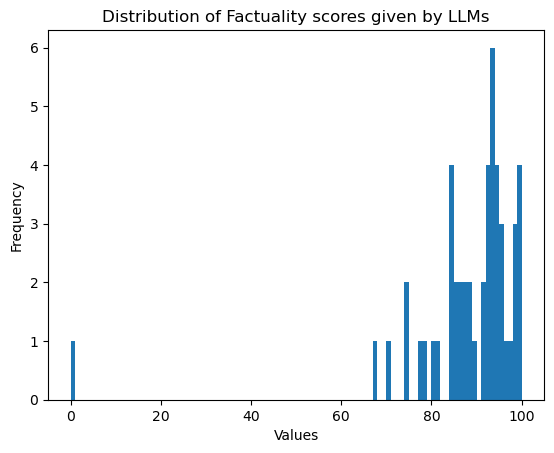

In [57]:
#print(array_feit_M)
np.histogram(array_feit_M, bins=10)
import matplotlib.pyplot as plt
ls = list(array_feit_M)
print(ls)
ls.remove(0.0)
print(ls)
plt.hist(array_feit_M, bins=100)
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Distribution of Factuality scores given by LLMs')
#plt.hist(ls, bins=100)
print(scipy.stats.shapiro(list(array_feit_M)))
print(scipy.stats.shapiro(ls))

## till here

In [747]:
corr, pval = pearsonr(main_df['bertscore'], main_df['total_HM_spre'])
print(corr, pval)
print(int(pval))

0.7052515880241241 1.0766715680176051e-08
0


In [58]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_t_rele_HM)
print(correlation, p_value)

-0.0301005027940793 0.7626718739532301


In [59]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_t_vloe_HM)
print(correlation, p_value)

-0.003322269449451253 0.9732598760969646


In [60]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_t_spre_HM)
print(correlation, p_value)

0.13636661688370272 0.1670109572370746


In [61]:
correlation, p_value = stats.kendalltau(array_eval_M , array_t_eval_HM)
print(correlation, p_value)

0.09987720853111297 0.3073670647009462


### Analysis on only experts

In [672]:
array_ex_feit_HM = main_df['ex_HM_feit'].to_numpy()
array_ex_rele_HM =  main_df['ex_HM_rele'].to_numpy()
array_ex_vloe_HM =  main_df['ex_HM_vloe'].to_numpy()
array_ex_spre_HM =  main_df['ex_HM_spre'].to_numpy()
array_ex_eval_HM =  main_df['ex_HM_eval'].to_numpy()


In [673]:
correlation, p_value = stats.kendalltau(array_feit_M, array_ex_feit_HM)
print(correlation, p_value)

0.0698062548775759 0.5140009982955642


In [674]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_ex_rele_HM)
print(correlation, p_value)

-0.17188116714175525 0.10219306044907231


In [675]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_ex_vloe_HM)
print(correlation, p_value)

-0.14544748035006286 0.1623601744719091


In [676]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_ex_spre_HM)
print(correlation, p_value)

0.029498099446682514 0.7749919158086043


In [677]:
correlation, p_value = stats.kendalltau(array_eval_M , array_ex_eval_HM)
print(correlation, p_value)

-0.09839139904341006 0.3278108127880981


### Analysis on only non-experts

In [21]:
array_nex_feit_HM = main_df['nex_HM_feit'].to_numpy()
array_nex_rele_HM =  main_df['nex_HM_rele'].to_numpy()
array_nex_vloe_HM =  main_df['nex_HM_vloe'].to_numpy()
array_nex_spre_HM =  main_df['nex_HM_spre'].to_numpy()
array_nex_eval_HM =  main_df['nex_HM_eval'].to_numpy()


In [679]:
correlation, p_value = stats.kendalltau(array_feit_M, array_nex_feit_HM)
print(correlation, p_value)

0.06005274525135548 0.5663596951954886


In [680]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_nex_rele_HM)
print(correlation, p_value)

0.07250663675830438 0.48907598225475635


In [681]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_nex_vloe_HM)
print(correlation, p_value)

0.05715162068296494 0.5796808311930404


In [682]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_nex_spre_HM)
print(correlation, p_value)

0.14698330390134343 0.15510848505701016


In [683]:
correlation, p_value = stats.kendalltau(array_eval_M , array_nex_eval_HM)
print(correlation, p_value)

0.13657450497980878 0.176041171788625


## Analysis on only Claude 

In [73]:
cl_subset = main_df.loc[main_df['llm'] == 'cl']

In [74]:
array_feit_M = cl_subset['feit_M'].to_numpy()
array_rele_M =  cl_subset['rele_M'].to_numpy()
array_vloe_M =  cl_subset['vloe_M'].to_numpy()
array_spre_M =  cl_subset['spre_M'].to_numpy()
array_eval_M =  cl_subset['eval_M'].to_numpy()

### Analysis on both experts and non-experts

In [75]:
array_t_feit_HM = cl_subset['total_HM_feit'].to_numpy()
array_t_rele_HM =  cl_subset['total_HM_rele'].to_numpy()
array_t_vloe_HM =  cl_subset['total_HM_vloe'].to_numpy()
array_t_spre_HM =  cl_subset['total_HM_spre'].to_numpy()
array_t_eval_HM =  cl_subset['total_HM_eval'].to_numpy()


In [76]:
correlation, p_value = stats.kendalltau(array_feit_M, array_t_feit_HM)
print(correlation, p_value)

0.25949358065422 0.11694126667246217


In [77]:
corr, pval = pearsonr(cl_subset['feit_M'], cl_subset['total_HM_feit'])
print(corr, pval)
print(int(pval))

NameError: name 'pearsonr' is not defined

In [78]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_t_rele_HM)
print(correlation, p_value)

-0.005361949564645759 0.9740227648891427


In [68]:
corr, pval = pearsonr(cl_subset['rele_M'], cl_subset['total_HM_rele'])
print(corr, pval)

0.13277404530879072 0.5768234224093303


In [79]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_t_vloe_HM)
print(correlation, p_value)

-0.07407407407407407 0.6493268080811683


In [70]:
corr, pval = pearsonr(cl_subset['vloe_M'], cl_subset['total_HM_vloe'])
print(corr, pval)

0.0324006119811188 0.8921336614425617


In [71]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_t_spre_HM)
print(correlation, p_value)

-0.10026420125303971 0.5373890154357488


In [72]:
corr, pval = pearsonr(cl_subset['spre_M'], cl_subset['total_HM_spre'])
print(corr, pval)

0.045540657316807905 0.8488010511086916


In [73]:
correlation, p_value = stats.kendalltau(array_eval_M , array_t_eval_HM)
print(correlation, p_value)

0.005277063223844196 0.9741041191399131


In [74]:
corr, pval = pearsonr(cl_subset['eval_M'], cl_subset['total_HM_eval'])
print(corr, pval)

0.19159310617117337 0.41840158806639627


### Analysis on only experts | Excluding the two Claude rows does make one of the results significant.

In [75]:
array_ex_feit_HM = cl_subset['ex_HM_feit'].to_numpy()
array_ex_rele_HM =  cl_subset['ex_HM_rele'].to_numpy()
array_ex_vloe_HM =  cl_subset['ex_HM_vloe'].to_numpy()
array_ex_spre_HM =  cl_subset['ex_HM_spre'].to_numpy()
array_ex_eval_HM =  cl_subset['ex_HM_eval'].to_numpy()


In [76]:
correlation, p_value = stats.kendalltau(array_feit_M, array_ex_feit_HM)
print(correlation, p_value)

0.2234950781338371 0.18803085949331944


In [77]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_ex_rele_HM)
print(correlation, p_value)

-0.1635679359853556 0.33834844657416596


In [78]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_ex_vloe_HM)
print(correlation, p_value)

-0.3216704068808038 0.053505532050860324


In [79]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_ex_spre_HM)
print(correlation, p_value)

-0.2515502175743891 0.1315906006243989


In [80]:
correlation, p_value = stats.kendalltau(array_eval_M , array_ex_eval_HM)
print(correlation, p_value)

-0.25397180893013105 0.11900406643496338


### Analysis on only non-experts

In [81]:
array_nex_feit_HM = cl_subset['nex_HM_feit'].to_numpy()
array_nex_rele_HM =  cl_subset['nex_HM_rele'].to_numpy()
array_nex_vloe_HM =  cl_subset['nex_HM_vloe'].to_numpy()
array_nex_spre_HM =  cl_subset['nex_HM_spre'].to_numpy()
array_nex_eval_HM =  cl_subset['nex_HM_eval'].to_numpy()


In [82]:
correlation, p_value = stats.kendalltau(array_feit_M, array_nex_feit_HM)
print(correlation, p_value)

0.2402572089938749 0.15702196397150042


In [83]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_nex_rele_HM)
print(correlation, p_value)

0.14289165775082288 0.39396004557624753


In [84]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_nex_vloe_HM)
print(correlation, p_value)

0.05963833779129925 0.7192419158066743


In [85]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_nex_spre_HM)
print(correlation, p_value)

0.06525209268856093 0.6946799932584728


In [86]:
correlation, p_value = stats.kendalltau(array_eval_M , array_nex_eval_HM)
print(correlation, p_value)

0.2222253328138647 0.17253716939728247


## Analysis on only GPT3.5

In [80]:
gpt4_subset = main_df.loc[main_df['llm'] == 'gpt4']

In [81]:
array_feit_M = gpt4_subset['feit_M'].to_numpy()
array_rele_M =  gpt4_subset['rele_M'].to_numpy()
array_vloe_M =  gpt4_subset['vloe_M'].to_numpy()
array_spre_M =  gpt4_subset['spre_M'].to_numpy()
array_eval_M =  gpt4_subset['eval_M'].to_numpy()

### Analysis on both experts and non-experts

In [82]:
array_t_feit_HM = gpt4_subset['total_HM_feit'].to_numpy()
array_t_rele_HM =  gpt4_subset['total_HM_rele'].to_numpy()
array_t_vloe_HM =  gpt4_subset['total_HM_vloe'].to_numpy()
array_t_spre_HM =  gpt4_subset['total_HM_spre'].to_numpy()
array_t_eval_HM =  gpt4_subset['total_HM_eval'].to_numpy()


In [83]:
correlation, p_value = stats.kendalltau(array_feit_M, array_t_feit_HM)
print(correlation, p_value)

0.18329440238224415 0.2675573329785095


#### subset of all except gold

In [762]:
corr, pval = pearsonr(gpt4_subset['feit_M'], gpt4_subset['total_HM_feit'])
print(corr, pval)

0.24824962711187715 0.2912630574928027


In [803]:
exceptgold = main_df.loc[main_df['llm'] != 'gold']
corr, pval = pearsonr(exceptgold['feit_M'], exceptgold['total_HM_feit'])
print(corr, pval)

onlygold = main_df.loc[main_df['llm'] == 'gold']
corr, pval = pearsonr(onlygold['feit_M'], onlygold['total_HM_feit']) # very strong relationship in  analyzing the golden ones
print(corr, pval)

corr, pval = pearsonr(onlygold['rele_M'], onlygold['total_HM_rele']) 
print(corr, pval)

corr, pval = pearsonr(onlygold['vloe_M'], onlygold['total_HM_vloe']) 
print(corr, pval)

corr, pval = pearsonr(onlygold['spre_M'], onlygold['total_HM_spre']) 
print(corr, pval)

try1 =  main_df.drop([19,22]) 
exceptgold1 = try1.loc[try1['llm'] != 'gold']
corr, pval = pearsonr(exceptgold1['feit_M'], exceptgold1['nex_HM_feit']) 
print(corr, pval)

try2 =  main_df.drop([19,22]) 
cl2_subset = try2.loc[try2['llm'] == 'cl']
corr, pval = pearsonr(cl2_subset['spre_M'], cl2_subset['ex_HM_spre']) 
print(corr, pval)

corr, pval = pearsonr(cl_subset['spre_M'], cl_subset['ex_HM_spre']) 
print(corr, pval)

corr, pval = pearsonr(gpt4_subset['spre_M'], gpt4_subset['ex_HM_spre']) 
print(corr, pval)





0.22444241000944212 0.1638245689074554
0.9290402109024676 0.00010175548559755409
0.7935093959415302 0.006147569216827298
0.051445381752225225 0.8877605976425457
0.248402755278321 0.4889246405506096
0.10854334535834463 0.5165482091815515
-0.4364244965831074 0.07018633213990372
-0.15406804445341496 0.5166369625947158
0.133283620220231 0.5753486654736452


# Impact of changing 2 outliers on Kendalls Tau significance.

In [98]:
gpt4_subset = main_df.loc[main_df['llm'] == 'gpt4']
array_feit_M = gpt4_subset['feit_M'].to_numpy()
print(array_feit_M)
array_t_feit_HM = gpt4_subset['total_HM_feit'].to_numpy()
array_feit_Mtry = [ 85,  94, 100,  94,  70,  87,  99,  98, 100, 100,  80,  86,  74,  92,  81,  92,  89,  78,  85 , 97]
correlation, p_value = stats.kendalltau(array_feit_Mtry, array_t_feit_HM) # the fourth of down should just be 10
print(correlation, p_value)

[ 85.  94. 100.  94.  70.  87.  99.  98. 100. 100.  80.  86.  74.  92.
  81.  92.  89.  78.  85.  97.]
0.2081237805282961 0.22495285649566843


# Analysis of kendall tau on both claude and gpt in relation to humans

In [162]:
a = main_df.loc[main_df['llm'] != 'gold']
#print(a)
c = a['nex_E_feit'].to_numpy()
d = main_df['ex_B_feit'].to_numpy()
correlation, p_value = stats.kendalltau(c, a['feit_M'].to_numpy() ) # if 9th is 10: 0.709 correlation
print(correlation, p_value)


0.1497345406954754 0.21763701889768083


In [894]:
### tryout

a = main_df.loc[main_df['llm'] == 'gold']
b = a['feit_M'].to_numpy()
correlation, p_value = stats.kendalltau(b, [8,10,10,1,9,10,10,9,9,9]) # if 9th is 10: 0.709 correlation
print(correlation, p_value)

0.5640760748177662 0.04027572101119273


In [84]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_t_rele_HM)
print(correlation, p_value)

0.1475608130513894 0.37686791743176473


In [763]:
corr, pval = pearsonr(gpt4_subset['rele_M'], gpt4_subset['total_HM_rele'])
print(corr, pval)

0.11099689282960215 0.6413050781379039


In [92]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_t_vloe_HM)
print(correlation, p_value)

0.15633934320838472 0.34415089246913755


In [764]:
corr, pval = pearsonr(gpt4_subset['vloe_M'], gpt4_subset['total_HM_vloe'])
print(corr, pval)

0.16213153722177553 0.4946527373420674


In [93]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_t_spre_HM)
print(correlation, p_value)

0.21390680185780464 0.1929642222648159


In [766]:
corr, pval = pearsonr(gpt4_subset['spre_M'], gpt4_subset['total_HM_spre'])
print(corr, pval)

0.26274933165934944 0.26305601325275463


In [85]:
correlation, p_value = stats.kendalltau(array_eval_M , array_t_eval_HM)
print(correlation, p_value)

0.2947368421052632 0.07402572925713644


In [1057]:
corr, pval = pearsonr(gpt4_subset['eval_M'], gpt4_subset['total_HM_eval'])
print(corr, pval)

0.3523818284099834 0.12756063715191585


### Analysis on only experts

In [95]:
array_ex_feit_HM = gpt4_subset['ex_HM_feit'].to_numpy()
array_ex_rele_HM =  gpt4_subset['ex_HM_rele'].to_numpy()
array_ex_vloe_HM =  gpt4_subset['ex_HM_vloe'].to_numpy()
array_ex_spre_HM =  gpt4_subset['ex_HM_spre'].to_numpy()
array_ex_eval_HM =  gpt4_subset['ex_HM_eval'].to_numpy()


In [96]:
correlation, p_value = stats.kendalltau(array_feit_M, array_ex_feit_HM)
print(correlation, p_value)

0.21769225914082618 0.21335306038507384


In [97]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_ex_rele_HM)
print(correlation, p_value)

0.11866111313364182 0.4882892027489627


In [98]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_ex_vloe_HM)
print(correlation, p_value)

-0.005604902173451675 0.9736066193271038


In [99]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_ex_spre_HM)
print(correlation, p_value)

0.11117289099417835 0.5103410303036574


In [100]:
correlation, p_value = stats.kendalltau(array_eval_M , array_ex_eval_HM)
print(correlation, p_value)

0.04774686984581479 0.7699344013429705


In [1064]:
corr, pval = pearsonr(gpt4_subset['eval_M'], gpt4_subset['ex_HM_eval'])
print(corr, pval)

0.13333461378309533 0.5752011750650938


### Analysis on only non-experts

In [87]:
array_nex_feit_HM = gpt4_subset['nex_HM_feit'].to_numpy()
array_nex_rele_HM =  gpt4_subset['nex_HM_rele'].to_numpy()
array_nex_vloe_HM =  gpt4_subset['nex_HM_vloe'].to_numpy()
array_nex_spre_HM =  gpt4_subset['nex_HM_spre'].to_numpy()
array_nex_eval_HM =  gpt4_subset['nex_HM_eval'].to_numpy()


In [88]:
correlation, p_value = stats.kendalltau(array_feit_M, array_nex_feit_HM)
print(correlation, p_value)

0.16024300671716898 0.3415568132497492


In [103]:
correlation, p_value = stats.kendalltau(array_rele_M  ,array_nex_rele_HM)
print(correlation, p_value)

0.22537446792760443 0.1864032389640572


In [89]:
correlation, p_value = stats.kendalltau(array_vloe_M , array_nex_vloe_HM)
print(correlation, p_value)

0.22040658434832477 0.18980010720644847


In [90]:
correlation, p_value = stats.kendalltau(array_spre_M  , array_nex_spre_HM)
print(correlation, p_value)

0.22107884414269097 0.18923152265967247


In [106]:
correlation, p_value = stats.kendalltau(array_eval_M , array_nex_eval_HM)
print(correlation, p_value)

0.3102003486344046 0.05897144808998496


In [1071]:
##### overall, there is a significant correlation between experts and non-experts related to gpt4 total eval score.
correlation, p_value = stats.kendalltau(array_ex_eval_HM, array_nex_eval_HM)
print(correlation, p_value)


correlation, p_value = stats.kendalltau(array_ex_vloe_HM, array_nex_vloe_HM)
print(correlation, p_value)

0.188685414217016 0.253739160206941
0.09660494427397627 0.5725755668366911


In [25]:
array_nex_eval_HM =  gpt4_subset['nex_HM_eval'].to_numpy()
correlation, p_value = stats.kendalltau(array_eval_M , array_nex_eval_HM)
print(correlation, p_value)

print(array_eval_M)
from sklearn import preprocessing
import numpy as np

ar_eval_M = preprocessing.normalize([array_eval_M])
ar_nexev = preprocessing.normalize([array_nex_eval_HM])
print(ar_eval_M)
correlation, p_value = stats.kendalltau(ar_eval_M , ar_nexev)
print(correlation, p_value)
ar_eval_Ms = preprocessing.scale(array_eval_M)
ar_nexevs = preprocessing.scale(array_nex_eval_HM)
print(ar_eval_Ms)
correlation, p_value = stats.kendalltau(ar_eval_Ms , ar_nexevs)
print(correlation, p_value)



array_nex_feit_HM = main_df['nex_HM_feit'].to_numpy()
array_feit_M = main_df['feit_M'].to_numpy()

print("SPLIT")

correlation, p_value = stats.kendalltau(array_feit_M , array_nex_feit_HM)
print(correlation, p_value)

print(array_eval_M)
from sklearn import preprocessing
import numpy as np

ar_eval_M = preprocessing.normalize([array_feit_M])
ar_nexev = preprocessing.normalize([array_nex_feit_HM])
print(ar_eval_M)
correlation, p_value = stats.kendalltau(ar_eval_M , ar_nexev)
print(correlation, p_value)
ar_eval_Ms = preprocessing.scale(array_feit_M)
ar_nexevs = preprocessing.scale(array_nex_feit_HM)
print(ar_eval_Ms)
correlation, p_value = stats.kendalltau(ar_eval_Ms , ar_nexevs)
print(correlation, p_value) # Normalizing and standardizing has no impact on kendalls tau scores. # makes sense as I use the averages
# 

0.3102003486344046 0.05897144808998496
[78.   89.25 90.25 75.25 65.25 83.   80.   67.75 88.5  80.75 74.25 92.5
 70.   88.25 70.75 83.75 85.   69.5  76.75 86.75]
[[0.21751167 0.24888354 0.25167216 0.20984299 0.18195688 0.23145472
  0.22308889 0.18892841 0.24679209 0.22518035 0.20705438 0.25794653
  0.19520278 0.24609493 0.19729424 0.23354618 0.23703195 0.19380847
  0.21402591 0.24191202]]
0.3102003486344046 0.05897144808998496
[-0.2189867   1.16895717  1.29232996 -0.55826187 -1.79198975  0.39787724
  0.02775888 -1.48355778  1.07642758  0.12028847 -0.68163466  1.56991873
 -1.20596901  1.04558438 -1.11343942  0.49040683  0.64462282 -1.2676554
 -0.37320269  0.8605252 ]
0.3102003486344046 0.05897144808998496
SPLIT
0.1163082384759454 0.2553059201323328
[78.   89.25 90.25 75.25 65.25 83.   80.   67.75 88.5  80.75 74.25 92.5
 70.   88.25 70.75 83.75 85.   69.5  76.75 86.75]
[[0.1354482  0.11791961 0.14978977 0.14819627 0.14978977 0.15935082
  0.15138328 0.14978977 0.15616381 0.15616381 0.15393

In [28]:
main_df.columns

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

# except gold kendall tau

In [6]:
exceptgold = main_df.loc[main_df['llm'] != 'gold']

array_feit_Meg = exceptgold['feit_M'].to_numpy()
array_rele_Meg =  exceptgold['rele_M'].to_numpy()
array_vloe_Meg =  exceptgold['vloe_M'].to_numpy()
array_spre_Meg =  exceptgold['spre_M'].to_numpy()
array_eval_Meg =  exceptgold['eval_M'].to_numpy()


array_ex_feit_HMeg = exceptgold['ex_HM_feit'].to_numpy()
array_ex_rele_HMeg =  exceptgold['ex_HM_rele'].to_numpy()
array_ex_vloe_HMeg =  exceptgold['ex_HM_vloe'].to_numpy()
array_ex_spre_HMeg =  exceptgold['ex_HM_spre'].to_numpy()
array_ex_eval_HMeg =  exceptgold['ex_HM_eval'].to_numpy()

array_nex_feit_HMeg = exceptgold['nex_HM_feit'].to_numpy()
array_nex_rele_HMeg =  exceptgold['nex_HM_rele'].to_numpy()
array_nex_vloe_HMeg =  exceptgold['nex_HM_vloe'].to_numpy()
array_nex_spre_HMeg =  exceptgold['nex_HM_spre'].to_numpy()
array_nex_eval_HMeg =  exceptgold['nex_HM_eval'].to_numpy()

array_total_feit_HMeg = exceptgold['total_HM_feit'].to_numpy()
array_total_rele_HMeg =  exceptgold['total_HM_rele'].to_numpy()
array_total_vloe_HMeg =  exceptgold['total_HM_vloe'].to_numpy()
array_total_spre_HMeg =  exceptgold['total_HM_spre'].to_numpy()
array_total_eval_HMeg =  exceptgold['total_HM_eval'].to_numpy()



print("Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_ex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_ex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_ex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_ex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_ex_eval_HMeg)
print(correlation, p_value)

print("Non-Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_nex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_nex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_nex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_nex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_nex_eval_HMeg)
print(correlation, p_value)


print("Both combined:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_total_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_total_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_total_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_total_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_total_eval_HMeg)
print(correlation, p_value)


print("confidence intervals")
print("Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_ex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_ex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_ex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_ex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_ex_eval_HMeg)
print(tau, pval, ci)

print("Non Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_nex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_nex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_nex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_nex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_nex_eval_HMeg)
print(tau, pval, ci)



print("Both :  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_total_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_total_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_total_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_total_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_total_eval_HMeg)
print(tau, pval, ci)





Experts:  
0.20428728852407907 0.08151553246136595
-0.10177132332608925 0.38262403704116843
-0.15773925208076717 0.16906024987585844
-0.024172596145886627 0.832585973200058
-0.056996014083679374 0.6077290323583461
Non-Experts:  
0.1386518027982145 0.2269009557914088
0.1662571319450651 0.15050859873553257
0.1562318116767563 0.1702847214076445
0.1488687935206897 0.18957086482851893
0.264946013343646 0.017285707661024524
Both combined:  
0.16787321965574786 0.13475796598719658
0.036965057284074634 0.7432446002360329
0.04191232712105654 0.7084912983768499
0.10239897985462951 0.3567506259170943
0.16077173742450018 0.14515142456911378
confidence intervals
Experts:  
0.20428728852407907 0.08151553246136595 (-0.011382343735680478, 0.4199569207838386)
-0.10177132332608925 0.38262403704116843 (-0.3174409555858488, 0.1138983089336703)
-0.15773925208076717 0.16906024987585844 (-0.3734088843405267, 0.05793038017899238)
-0.024172596145886627 0.832585973200058 (-0.23984222840564617, 0.191497036113872

In [19]:
print(array_feit_Meg)
import numpy as np

original = np.array([85.0, 94.0, 93.0, 94.0, 100.0, 95.0, 94.0, 98.0, 96.6, 93.0, 70.0, 87.0, 
                99.0, 93.0, 98.0, 77.0, 91.4, 67.0, 100.0, 100.0, 88.0, 80.0, 86.0, 93.6, 
                93.0, 74.0, 91.0, 92.0, 81.0, 92.0, 95.0, 84.0, 89.0, 86.0, 94.0, 78.0, 
                87.0, 85.0, 92.0, 97.0])
# 5 cant get higher, 22, 23 cant
onlygpt = main_df.loc[main_df['llm'] != 'gpt4']
array_feit_Megpt = onlygpt['feit_M'].to_numpy()
print(array_feit_Megpt)
mean1 = np.mean(array_feit_Megpt)
print(mean1) # mean 86.5
onlycl = main_df.loc[main_df['llm'] != 'cl']
array_feit_Mecl = onlycl['feit_M'].to_numpy()
print(array_feit_Mecl)
mean2 = np.mean(array_feit_Mecl)
print(mean2) # mean is 85.8
# difference is: claude gets on average 0.7 lower from itself. Compensate for that.
new = np.array([85.0, 94.0, 93.7, 94.7, 100.0, 95.7, 94.0, 98.7, 97.3, 93.7, 70.0, 87.0,  # 12 
                99.0, 93.7, 98.0, 77.7, 92.1, 67.7, 100.0, 100.0, 88.7, 80.0, 86.0, 94.3, # 24
                93.7, 74.0, 91.7, 92.0, 81.0, 92.0, 95.7, 84.7, 89.0, 86.7, 94.7, 78.0, # 36
                87.7, 85.0, 92.7, 97.0])
#newarrayfeit = 
# gpt scores on average 5.1 points lower compared to claude. Thus increase gpt by 5.1.
correlation, p_value = stats.kendalltau(new, array_ex_feit_HMeg)
print(correlation, p_value)
# nr 1,2, 5, 7, 11, 12, 13, 15, 19, 20, 22, 23, , 26, 28, 29, 30, 33, 36, 38, 40
print(exceptgold)

[ 85.   94.   93.   94.  100.   95.   94.   98.   96.6  93.   70.   87.
  99.   93.   98.   77.   91.4  67.  100.  100.   88.   80.   86.   93.6
  93.   74.   91.   92.   81.   92.   95.   84.   89.   86.   94.   78.
  87.   85.   92.   97. ]
[74.  93.  94.  95.  98.  98.  96.6 93.  93.   0.  93.  77.  91.4 92.6
 67.  88.  93.6 88.6 93.  84.  91.  95.  84.  84.  86.  95.  94.  87.
 92.  84. ]
86.49333333333334
[ 85.   74.   94.  100.   94.   98.   93.   70.   87.    0.   99.   98.
  92.6 100.  100.   80.   86.   88.6  84.   74.   92.   81.   92.   84.
  89.   95.   78.   85.   97.   84. ]
85.80666666666666
0.2072281850559898 0.07571345649617026
    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_be

In [116]:
# ALL RADIO_MESSAGES

array_feit_Meg = main_df['feit_M'].to_numpy()
array_rele_Meg =  main_df['rele_M'].to_numpy()
array_vloe_Meg =  main_df['vloe_M'].to_numpy()
array_spre_Meg =  main_df['spre_M'].to_numpy()
array_eval_Meg =  main_df['eval_M'].to_numpy()


array_ex_feit_HMeg = main_df['ex_HM_feit'].to_numpy()
array_ex_rele_HMeg =  main_df['ex_HM_rele'].to_numpy()
array_ex_vloe_HMeg = main_df['ex_HM_vloe'].to_numpy()
array_ex_spre_HMeg = main_df['ex_HM_spre'].to_numpy()
array_ex_eval_HMeg =  main_df['ex_HM_eval'].to_numpy()

array_nex_feit_HMeg =main_df['nex_HM_feit'].to_numpy()
array_nex_rele_HMeg =  main_df['nex_HM_rele'].to_numpy()
array_nex_vloe_HMeg =  main_df['nex_HM_vloe'].to_numpy()
array_nex_spre_HMeg =  main_df['nex_HM_spre'].to_numpy()
array_nex_eval_HMeg =  main_df['nex_HM_eval'].to_numpy()

array_total_feit_HMeg = main_df['total_HM_feit'].to_numpy()
array_total_rele_HMeg =  main_df['total_HM_rele'].to_numpy()
array_total_vloe_HMeg =  main_df['total_HM_vloe'].to_numpy()
array_total_spre_HMeg =  main_df['total_HM_spre'].to_numpy()
array_total_eval_HMeg =  main_df['total_HM_eval'].to_numpy()



print("Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_ex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_ex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_ex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_ex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_ex_eval_HMeg)
print(correlation, p_value)

print("Non-Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_nex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_nex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_nex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_nex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_nex_eval_HMeg)
print(correlation, p_value)


print("Both combined:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_total_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_total_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_total_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_total_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_total_eval_HMeg)
print(correlation, p_value)

print("confidence intervals")
print("Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_ex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_ex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_ex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_ex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_ex_eval_HMeg)
print(tau, pval, ci)

print("Non Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_nex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_nex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_nex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_nex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_nex_eval_HMeg)
print(tau, pval, ci)



print("Both :  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_total_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_total_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_total_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_total_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_total_eval_HMeg)
print(tau, pval, ci)




Experts:  
0.11901283826451274 0.2539418397150781
-0.1830235158866268 0.07479446525498532
-0.1481755911910199 0.1450445452186458
0.04334027899880023 0.6680152511267242
-0.08405599354290376 0.39309350246945196
Non-Experts:  
0.1163082384759454 0.2553059201323328
0.14242184950180964 0.16348275357977815
0.10844498457879531 0.28206364278037954
0.17568194037889115 0.08171373172506524
0.20414066714401244 0.03855412234453286
Both combined:  
0.12035481751203007 0.2271892845253195
-0.0301005027940793 0.7626718739532301
-0.003322269449451253 0.9732598760969646
0.13636661688370272 0.1670109572370746
0.09987720853111297 0.3073670647009462
confidence intervals
Experts:  
0.11901283826451274 0.2539418397150781 (-0.07226006128440092, 0.3102857378134264)
-0.1830235158866268 0.07479446525498532 (-0.3742964154355405, 0.008249383662286863)
-0.1481755911910199 0.1450445452186458 (-0.33944849073993355, 0.04309730835789377)
0.04334027899880023 0.6680152511267242 (-0.14793262055011341, 0.2346131785477139)
-

In [4]:
import numpy as np
from scipy import stats
#import statsmodels.stats.correlation as smcor

def kendall_tau_ci(x, y, alpha=0.05):

    # Calculate Kendall's tau 
    tau, p_value = stats.kendalltau(x, y)
    
    # Sample size
    n = len(x)

    # Standard error
    se = np.sqrt(2*(2*n+5) / (9*n*(n-1)))
    
    # Critical value
    cv = stats.norm.ppf(1 - alpha/2)
    # Lower confidence limit
    lcl = tau - cv * se
    # Upper confidence limit
    ucl = tau + cv * se 
    return tau, p_value, (lcl, ucl)




# Only golden 

In [121]:
exceptgold = main_df.loc[main_df['llm'] == 'gold']

array_feit_Meg = exceptgold['feit_M'].to_numpy()
array_rele_Meg =  exceptgold['rele_M'].to_numpy()
array_vloe_Meg =  exceptgold['vloe_M'].to_numpy()
array_spre_Meg =  exceptgold['spre_M'].to_numpy()
array_eval_Meg =  exceptgold['eval_M'].to_numpy()


array_ex_feit_HMeg = exceptgold['ex_HM_feit'].to_numpy()
array_ex_rele_HMeg =  exceptgold['ex_HM_rele'].to_numpy()
array_ex_vloe_HMeg =  exceptgold['ex_HM_vloe'].to_numpy()
array_ex_spre_HMeg =  exceptgold['ex_HM_spre'].to_numpy()
array_ex_eval_HMeg =  exceptgold['ex_HM_eval'].to_numpy()

array_nex_feit_HMeg = exceptgold['nex_HM_feit'].to_numpy()
array_nex_rele_HMeg =  exceptgold['nex_HM_rele'].to_numpy()
array_nex_vloe_HMeg =  exceptgold['nex_HM_vloe'].to_numpy()
array_nex_spre_HMeg =  exceptgold['nex_HM_spre'].to_numpy()
array_nex_eval_HMeg =  exceptgold['nex_HM_eval'].to_numpy()

array_total_feit_HMeg = exceptgold['total_HM_feit'].to_numpy()
array_total_rele_HMeg =  exceptgold['total_HM_rele'].to_numpy()
array_total_vloe_HMeg =  exceptgold['total_HM_vloe'].to_numpy()
array_total_spre_HMeg =  exceptgold['total_HM_spre'].to_numpy()
array_total_eval_HMeg =  exceptgold['total_HM_eval'].to_numpy()



print("Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_ex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_ex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_ex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_ex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_ex_eval_HMeg)
print(correlation, p_value)

print("Non-Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_nex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_nex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_nex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_nex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_nex_eval_HMeg)
print(correlation, p_value)


print("Both combined:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_total_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_total_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_total_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_total_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_total_eval_HMeg)
print(correlation, p_value)


print("confidence intervals")
print("Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_ex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_ex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_ex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_ex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_ex_eval_HMeg)
print(tau, pval, ci)

print("Non Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_nex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_nex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_nex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_nex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_nex_eval_HMeg)
print(tau, pval, ci)



print("Both :  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_total_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_total_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_total_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_total_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_total_eval_HMeg)
print(tau, pval, ci)


Experts:  
0.17295817388759024 0.5103802238499626
0.26257545381445874 0.3119184038326783
-0.08606629658238704 0.7557356175737271
-0.09938079899999065 0.7071142312899612
0.1797866299901979 0.47249761400068846
Non-Experts:  
0.14638501094227996 0.5774777761816505
0.46004370622823615 0.07018499196649255
0.09200874124564723 0.7172451837847029
0.24845199749997662 0.3461355883010686
0.5393598899705937 0.03114121059579671
Both combined:  
0.21177936240075526 0.410271645599535
0.24444444444444444 0.38071979717813054
0.06819943394704735 0.7867749320074033
0.20459830184114206 0.4170770595205646
0.44946657497549475 0.07248608508684644
confidence intervals
Experts:  
0.17295817388759024 0.5103802238499626 (-0.3139987930993995, 0.6599151408745799)
0.26257545381445874 0.3119184038326783 (-0.22438151317253097, 0.7495324208014484)
-0.08606629658238704 0.7557356175737271 (-0.5730232635693767, 0.4008906704046027)
-0.09938079899999065 0.7071142312899612 (-0.5863377659869804, 0.38757616798699907)
0.179786

# Only one LLM # cl


In [118]:
exceptgold = main_df.loc[main_df['llm'] == 'cl']

array_feit_Meg = exceptgold['feit_M'].to_numpy()
array_rele_Meg =  exceptgold['rele_M'].to_numpy()
array_vloe_Meg =  exceptgold['vloe_M'].to_numpy()
array_spre_Meg =  exceptgold['spre_M'].to_numpy()
array_eval_Meg =  exceptgold['eval_M'].to_numpy()


array_ex_feit_HMeg = exceptgold['ex_HM_feit'].to_numpy()
array_ex_rele_HMeg =  exceptgold['ex_HM_rele'].to_numpy()
array_ex_vloe_HMeg =  exceptgold['ex_HM_vloe'].to_numpy()
array_ex_spre_HMeg =  exceptgold['ex_HM_spre'].to_numpy()
array_ex_eval_HMeg =  exceptgold['ex_HM_eval'].to_numpy()

array_nex_feit_HMeg = exceptgold['nex_HM_feit'].to_numpy()
array_nex_rele_HMeg =  exceptgold['nex_HM_rele'].to_numpy()
array_nex_vloe_HMeg =  exceptgold['nex_HM_vloe'].to_numpy()
array_nex_spre_HMeg =  exceptgold['nex_HM_spre'].to_numpy()
array_nex_eval_HMeg =  exceptgold['nex_HM_eval'].to_numpy()

array_total_feit_HMeg = exceptgold['total_HM_feit'].to_numpy()
array_total_rele_HMeg =  exceptgold['total_HM_rele'].to_numpy()
array_total_vloe_HMeg =  exceptgold['total_HM_vloe'].to_numpy()
array_total_spre_HMeg =  exceptgold['total_HM_spre'].to_numpy()
array_total_eval_HMeg =  exceptgold['total_HM_eval'].to_numpy()



print("Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_ex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_ex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_ex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_ex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_ex_eval_HMeg)
print(correlation, p_value)

print("Non-Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_nex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_nex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_nex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_nex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_nex_eval_HMeg)
print(correlation, p_value)


print("Both combined:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_total_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_total_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_total_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_total_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_total_eval_HMeg)
print(correlation, p_value)


print("confidence intervals")
print("Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_ex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_ex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_ex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_ex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_ex_eval_HMeg)
print(tau, pval, ci)

print("Non Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_nex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_nex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_nex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_nex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_nex_eval_HMeg)
print(tau, pval, ci)



print("Both :  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_total_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_total_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_total_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_total_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_total_eval_HMeg)
print(tau, pval, ci)



Experts:  
0.2234950781338371 0.18803085949331944
-0.1635679359853556 0.33834844657416596
-0.3216704068808038 0.053505532050860324
-0.2515502175743891 0.1315906006243989
-0.25397180893013105 0.11900406643496338
Non-Experts:  
0.2402572089938749 0.15702196397150042
0.14289165775082288 0.39396004557624753
0.05963833779129925 0.7192419158066743
0.06525209268856093 0.6946799932584728
0.2222253328138647 0.17253716939728247
Both combined:  
0.25949358065422 0.11694126667246217
-0.005361949564645759 0.9740227648891427
-0.07407407407407407 0.6493268080811683
-0.10026420125303971 0.5373890154357488
0.005277063223844196 0.9741041191399131
confidence intervals
Experts:  
0.2234950781338371 0.18803085949331944 (-0.09445306480336238, 0.5414432210710366)
-0.1635679359853556 0.33834844657416596 (-0.4815160789225551, 0.15438020695184387)
-0.3216704068808038 0.053505532050860324 (-0.6396185498180033, -0.0037222639436043092)
-0.2515502175743891 0.1315906006243989 (-0.5694983605115886, 0.0663979253628103

# Only one LLM # gpt

In [119]:
exceptgold = main_df.loc[main_df['llm'] == 'gpt4']

array_feit_Meg = exceptgold['feit_M'].to_numpy()
array_rele_Meg =  exceptgold['rele_M'].to_numpy()
array_vloe_Meg =  exceptgold['vloe_M'].to_numpy()
array_spre_Meg =  exceptgold['spre_M'].to_numpy()
array_eval_Meg =  exceptgold['eval_M'].to_numpy()


array_ex_feit_HMeg = exceptgold['ex_HM_feit'].to_numpy()
array_ex_rele_HMeg =  exceptgold['ex_HM_rele'].to_numpy()
array_ex_vloe_HMeg =  exceptgold['ex_HM_vloe'].to_numpy()
array_ex_spre_HMeg =  exceptgold['ex_HM_spre'].to_numpy()
array_ex_eval_HMeg =  exceptgold['ex_HM_eval'].to_numpy()

array_nex_feit_HMeg = exceptgold['nex_HM_feit'].to_numpy()
array_nex_rele_HMeg =  exceptgold['nex_HM_rele'].to_numpy()
array_nex_vloe_HMeg =  exceptgold['nex_HM_vloe'].to_numpy()
array_nex_spre_HMeg =  exceptgold['nex_HM_spre'].to_numpy()
array_nex_eval_HMeg =  exceptgold['nex_HM_eval'].to_numpy()

array_total_feit_HMeg = exceptgold['total_HM_feit'].to_numpy()
array_total_rele_HMeg =  exceptgold['total_HM_rele'].to_numpy()
array_total_vloe_HMeg =  exceptgold['total_HM_vloe'].to_numpy()
array_total_spre_HMeg =  exceptgold['total_HM_spre'].to_numpy()
array_total_eval_HMeg =  exceptgold['total_HM_eval'].to_numpy()



print("Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_ex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_ex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_ex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_ex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_ex_eval_HMeg)
print(correlation, p_value)

print("Non-Experts:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_nex_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_nex_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_nex_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_nex_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_nex_eval_HMeg)
print(correlation, p_value)


print("Both combined:  ")
correlation, p_value = stats.kendalltau(array_feit_Meg, array_total_feit_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_rele_Meg  ,array_total_rele_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_vloe_Meg , array_total_vloe_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_spre_Meg  , array_total_spre_HMeg)
print(correlation, p_value)
correlation, p_value = stats.kendalltau(array_eval_Meg , array_total_eval_HMeg)
print(correlation, p_value)


print("confidence intervals")
print("Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_ex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_ex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_ex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_ex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_ex_eval_HMeg)
print(tau, pval, ci)

print("Non Experts:  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_nex_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_nex_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_nex_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_nex_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_nex_eval_HMeg)
print(tau, pval, ci)



print("Both :  ")
tau, pval, ci =  kendall_tau_ci(array_feit_Meg, array_total_feit_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_rele_Meg  ,array_total_rele_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_vloe_Meg , array_total_vloe_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_spre_Meg  , array_total_spre_HMeg)
print(tau, pval, ci)
tau, pval, ci =  kendall_tau_ci(array_eval_Meg , array_total_eval_HMeg)
print(tau, pval, ci)


Experts:  
0.21769225914082618 0.21335306038507384
0.11866111313364182 0.4882892027489627
-0.005604902173451675 0.9736066193271038
0.11117289099417835 0.5103410303036574
0.04774686984581479 0.7699344013429705
Non-Experts:  
0.16024300671716898 0.3415568132497492
0.22537446792760443 0.1864032389640572
0.22040658434832477 0.18980010720644847
0.22107884414269097 0.18923152265967247
0.3102003486344046 0.05897144808998496
Both combined:  
0.18329440238224415 0.2675573329785095
0.1475608130513894 0.37686791743176473
0.15633934320838472 0.34415089246913755
0.21390680185780464 0.1929642222648159
0.2947368421052632 0.07402572925713644
confidence intervals
Experts:  
0.21769225914082618 0.21335306038507384 (-0.10025588379637329, 0.5356404020780257)
0.11866111313364182 0.4882892027489627 (-0.19928702980355767, 0.4366092560708413)
-0.005604902173451675 0.9736066193271038 (-0.32355304511065114, 0.3123432407637478)
0.11117289099417835 0.5103410303036574 (-0.20677525194302113, 0.4291210339313778)
0.0

In [66]:
participant_means = feit_subset.mean()
participant_stds = feit_subset.std()
# Calculate z-scores for each participant's scores
z_scores = (feit_subset - participant_means) / participant_stds
# Adjust z-scores based on response tendencies (example adjustments)
# You can define your own adjustments here based on your analysis of the data
adjusted_z_scores = z_scores.copy()

# Loop through columns (participants) and adjust z-scores
for col in feit_subset.columns:
    # Example adjustments: add 0.5 to z-scores for participants avoiding 10s
    
    if col == 'ex_D_feit':
        
        adjusted_z_scores[col] = adjusted_z_scores[col] + 0.5
    print(col)
    
    # Example adjustments: subtract 0.5 from z-scores for participants giving frequent 10s
    #adjusted_z_scores[col] = adjusted_z_scores[col] - 10

    #print(adjusted_z_scores)
# Calculate adjusted scores using adjusted z-scores
adjusted_scores = (adjusted_z_scores * participant_stds) + participant_means
#print(adjusted_scores)

ex_B_feit
ex_D_feit
ex_F_feit


In [67]:
print(adjusted_scores)

    ex_B_feit  ex_D_feit  ex_F_feit
0         7.0   9.670059        8.0
1        10.0   9.670059        7.0
2         9.0   9.670059       10.0
3         9.0   6.670059        9.0
4         8.0   9.670059        6.0
5         9.0   9.670059        9.0
6         8.0   8.670059       10.0
7         6.0   7.670059        9.0
8         9.0   8.670059        5.0
9         7.0   9.670059        8.0
10        9.0   8.670059       10.0
11        4.0   6.670059        3.0
12       10.0   9.670059       10.0
13        9.0   8.670059       10.0
14        8.0   8.670059        4.0
15       10.0   1.670059        1.0
16        8.0   9.670059       10.0
17        8.0   9.670059        3.0
18        8.0   8.670059        9.0
19        3.0   9.670059       10.0
20        9.0   9.670059       10.0
21        8.0   9.670059       10.0
22        4.0   9.670059       10.0
23        8.0   9.670059       10.0
24        8.0   9.670059       10.0
25        7.0   8.670059       10.0
26        8.0   9.670059    

In [68]:

# Convert the data type of the columns to numeric
filter_eval = adjusted_scores.apply(pd.to_numeric, errors='coerce')

# Calculate the mean per row, skipping NaN values
row_means = filter_eval.mean(axis=1, skipna=True)

# Assign the row means to the corresponding column in main_df
adjusted_scores['feit_average'] = row_means

In [71]:
#print(adjusted_scores)
correlation, p_value = stats.kendalltau(array_feit_M ,adjusted_scores['feit_average'])
print(correlation, p_value)


0.11901283826451274 0.2539418397150781


### The distribution of whether the participants think it is real or generated is calculated

In [550]:
# To do list:
# filter on gold - claude - gpt, 
# Count the categories of how the things are perceived. Maybe also per worst and best-found.


In [551]:
gold_filter = main_df[main_df['llm']=='gold']
gpt_filter = main_df[main_df['llm']=='gpt4']
cl_filter = main_df[main_df['llm']=='cl']

In [583]:
# filter on 'geschreven'
filter_cl_geschreven = cl_filter.filter(regex=f"geschreven$")
filter_gpt_geschreven = gpt_filter.filter(regex=f"geschreven$")
filter_gold_geschreven = gold_filter.filter(regex=f"geschreven$")

#print(filter_gpt_geschreven)
print(filter_cl_geschreven)

    ex_B_geschreven  ex_D_geschreven  ex_F_geschreven  nex_A_geschreven   
3                 3                3              3.0                 3  \
4                 2                2              2.0                 3   
6                 1                2              4.0                 3   
9                 1                3              2.0                 2   
10                1                3              4.0                 2   
11                2                3              1.0                 3   
17                1                3              2.0                 3   
19                1                1              1.0                 2   
20                3                3              2.0                 2   
22                1                1              2.0                 2   
25                2                3              4.0                 3   
28                1                2              3.0                 2   
30                1      

### get index of the three categories (cl gpt gold) in a list


In [553]:
cl_index_ls = list(filter_cl_geschreven.index.values)
gpt_index_ls = list(filter_gpt_geschreven.index.values)
gold_index_ls = list(filter_gold_geschreven.index.values)
print(gold_index_ls)

[1, 8, 12, 15, 21, 29, 31, 38, 42, 49]


In [554]:
filter_cl_geschreven = filter_cl_geschreven.fillna(0)
filter_cl_geschreven = filter_cl_geschreven.astype('int')

filter_gpt_geschreven = filter_gpt_geschreven.fillna(0)
filter_gpt_geschreven = filter_gpt_geschreven.astype('int')

filter_gold_geschreven = filter_gold_geschreven.fillna(0)
filter_gold_geschreven = filter_gold_geschreven.astype('int')

## both experts and non-experts

In [562]:

table_cl_geschreven = filter_cl_geschreven.apply(pd.value_counts)

table_gpt_geschreven = filter_gpt_geschreven.apply(pd.value_counts)
table_gold_geschreven = filter_gold_geschreven.apply(pd.value_counts)

print(table_cl_geschreven.sum(axis=1))
print(table_gpt_geschreven.sum(axis=1))
print(table_gold_geschreven.sum(axis=1)) 

# delete row 0
# geschreven door AI is 1 and 2
# geschreven door een mens is 3 and 4



0     1.0
1    34.0
2    52.0
3    46.0
4     7.0
dtype: float64
0     3.0
1    37.0
2    61.0
3    31.0
4     8.0
dtype: float64
1     6.0
2     9.0
3    30.0
4    25.0
dtype: float64


In [ ]:
# table cl:

# AI: 86
# mens: 53     # total 139 + 1 missing | 7 (participants) * 2 * 10 (news articles) so one missing answer (wat ook zo is)

# True is AI

# So: Precision = 86 / 139
# Recall is not able to be calculated. Since this would be only if the participants predicted human but it was AI (generated by cl)
# which is not the case like this



# confidence in the decision that it was AI generated:
# 34 / (34+52) = 0,395

# confidence in the decision that it was human generated:
# 7 / 53 = 0,142 %



In [278]:
# table gpt

# AI: 98 
# mens: 39

# precision = 98 / 137

# AI generated % 37 / 98
# human created: 8 / 39


In [ ]:
# table gold

# AI: 15
# mens: 55

# precision = 55 / 70

# AI: 6 / 15
# mens 25 / 55


## only experts

In [567]:
only_exp_gesch_cl = filter_cl_geschreven.copy()
only_exp_gesch_cl.drop(['nex_A_geschreven'], inplace= True, axis = 1)
only_exp_gesch_cl.drop(['nex_C_geschreven'], inplace= True, axis = 1)
only_exp_gesch_cl.drop(['nex_E_geschreven'], inplace= True, axis = 1)
only_exp_gesch_cl.drop(['nex_G_geschreven'], inplace= True, axis = 1)

only_exp_gesch_gpt = filter_gpt_geschreven.copy()
only_exp_gesch_gpt.drop(['nex_A_geschreven'], inplace= True, axis = 1)
only_exp_gesch_gpt.drop(['nex_C_geschreven'], inplace= True, axis = 1)
only_exp_gesch_gpt.drop(['nex_E_geschreven'], inplace= True, axis = 1)
only_exp_gesch_gpt.drop(['nex_G_geschreven'], inplace= True, axis = 1)

only_exp_gesch_gold = filter_gold_geschreven.copy()
only_exp_gesch_gold.drop(['nex_A_geschreven'], inplace= True, axis = 1)
only_exp_gesch_gold.drop(['nex_C_geschreven'], inplace= True, axis = 1)
only_exp_gesch_gold.drop(['nex_E_geschreven'], inplace= True, axis = 1)
only_exp_gesch_gold.drop(['nex_G_geschreven'], inplace= True, axis = 1)

In [568]:
table_cl_geschreven = only_exp_gesch_cl.apply(pd.value_counts)

table_gpt_geschreven = only_exp_gesch_gpt.apply(pd.value_counts)
table_gold_geschreven = only_exp_gesch_gold.apply(pd.value_counts)

print(table_cl_geschreven.sum(axis=1))
print(table_gpt_geschreven.sum(axis=1))
print(table_gold_geschreven.sum(axis=1)) 


0     1.0
1    15.0
2    24.0
3    17.0
4     3.0
dtype: float64
0     2.0
1    15.0
2    26.0
3    15.0
4     2.0
dtype: float64
1     1.0
2     2.0
3    15.0
4    12.0
dtype: float64


In [309]:
# table cl

# AI: 39
# mens: 20

# precision = 39 / 59

# AI generated % 15 / 39
# human created: 3 / 20

In [ ]:
# table gpt

# AI: 41 
# mens: 17

# precision = 41 / 58

# AI generated % 15 / 41
# human created: 2 / 17

In [ ]:
# table gold

# AI: 3
# mens: 27

# precision = 27 / 30

# AI generated % 1 / 3
# human created: 12 / 27

## only non-experts

In [569]:
only_non_exp_gesch_cl = filter_cl_geschreven.copy()
only_non_exp_gesch_cl.drop(['ex_B_geschreven'], inplace= True, axis = 1)
only_non_exp_gesch_cl.drop(['ex_D_geschreven'], inplace= True, axis = 1)
only_non_exp_gesch_cl.drop(['ex_F_geschreven'], inplace= True, axis = 1)

only_non_exp_gesch_gpt = filter_gpt_geschreven.copy()
only_non_exp_gesch_gpt.drop(['ex_B_geschreven'], inplace= True, axis = 1)
only_non_exp_gesch_gpt.drop(['ex_D_geschreven'], inplace= True, axis = 1)
only_non_exp_gesch_gpt.drop(['ex_F_geschreven'], inplace= True, axis = 1)

only_non_exp_gesch_gold = filter_gold_geschreven.copy()
only_non_exp_gesch_gold.drop(['ex_B_geschreven'], inplace= True, axis = 1)
only_non_exp_gesch_gold.drop(['ex_D_geschreven'], inplace= True, axis = 1)
only_non_exp_gesch_gold.drop(['ex_F_geschreven'], inplace= True, axis = 1)


In [570]:
table_cl_geschreven = only_non_exp_gesch_cl.apply(pd.value_counts)
table_gpt_geschreven = only_non_exp_gesch_gpt.apply(pd.value_counts)
table_gold_geschreven = only_non_exp_gesch_gold.apply(pd.value_counts)

print(table_cl_geschreven.sum(axis=1))
print(table_gpt_geschreven.sum(axis=1))
print(table_gold_geschreven.sum(axis=1)) 


1    19.0
2    28.0
3    29.0
4     4.0
dtype: float64
0     1.0
1    22.0
2    35.0
3    16.0
4     6.0
dtype: float64
1     5.0
2     7.0
3    15.0
4    13.0
dtype: float64


In [ ]:
# table cl

# AI: 47 
# mens: 33

# precision = 47 / 80 (4 participants times 2 times 10)

# AI generated % 19 / 47
# human created: 4 / 33

In [ ]:
# table gpt

# AI: 57
# mens: 22

# precision = 57 / 79

# AI generated % 22 / 57
# human created: 6 / 22

In [ ]:
# table gold

# AI: 12 
# mens: 28

# precision = 28 / 40

# AI generated % 5 / 12
# human created: 13 / 28

## Get variance per row | This is not how it should be done, just do it via krippendorffs alpha




In [587]:
filter_main_geschreven = main_df.filter(regex=f"geschreven$")
print(filter_main_geschreven.head())

   ex_B_geschreven  ex_D_geschreven  ex_F_geschreven  nex_A_geschreven   
0                1                2              2.0                 1  \
1                3                4              4.0                 4   
2                1                2              3.0                 1   
3                3                3              3.0                 3   
4                2                2              2.0                 3   

   nex_C_geschreven  nex_E_geschreven  nex_G_geschreven  
0               3.0                 2                 2  
1               2.0                 1                 2  
2               1.0                 4                 4  
3               1.0                 2                 3  
4               2.0                 2                 2  


In [595]:
# Convert the DataFrame to a numpy array
main_data_np = filter_main_geschreven.values


In [596]:
# Get means for each row
means = [row.mean() for row in main_data_np ]

# Calculate squared errors
squared_errors = [(row-mean)**2 for row, mean in zip(main_data_np , means)]

# Calculate "mean for each row of squared errors" (aka the variance)
variances = [row.mean() for row in squared_errors]

# Sanity check
print(variances)
print(main_data_np.var(1))

[0.4081632653061224, 1.2653061224489797, 1.6326530612244896, 0.5306122448979592, 0.12244897959183676, 0.489795918367347, 1.0612244897959184, 0.20408163265306126, 0.9795918367346939, 0.489795918367347, 1.2653061224489797, 0.6938775510204082, 0.2040816326530612, 0.24489795918367346, 0.4081632653061224, 1.6326530612244898, 1.346938775510204, 0.816326530612245, 0.4081632653061224, 0.5306122448979592, 0.8163265306122449, 0.8571428571428571, 0.5306122448979592, 0.48979591836734704, 0.5306122448979592, 0.7755102040816328, 0.489795918367347, 0.8571428571428571, 0.4081632653061224, 0.489795918367347, 0.48979591836734704, 0.48979591836734704, nan, 0.489795918367347, 1.1020408163265307, 0.5714285714285714, 0.7755102040816328, 0.24489795918367346, 0.24489795918367344, 0.489795918367347, 0.4081632653061224, 0.2040816326530612, 0.2857142857142857, nan, nan, 0.2040816326530612, 0.40816326530612246, 0.5714285714285714, 0.7755102040816327, 0.20408163265306126]
[0.40816327 1.26530612 1.63265306 0.530612

### The distribution of whether the participants think it is suitable for a broadcast is calculated

In [571]:
gold_filter = main_df[main_df['llm']=='gold']
gpt_filter = main_df[main_df['llm']=='gpt4']
cl_filter = main_df[main_df['llm']=='cl']

In [572]:
# filter on 'gebruiken'
filter_cl_gebruiken = cl_filter.filter(regex=f"gebruiken$")
filter_gpt_gebruiken = gpt_filter.filter(regex=f"gebruiken$")
filter_gold_gebruiken = gold_filter.filter(regex=f"gebruiken$")


#print(filter_gpt_gebruiken)

In [573]:
filter_cl_gebruiken = filter_cl_gebruiken.fillna(0)
filter_cl_gebruiken = filter_cl_gebruiken.astype('int')

filter_gpt_gebruiken = filter_gpt_gebruiken.fillna(0)
filter_gpt_gebruiken = filter_gpt_gebruiken.astype('int')

filter_gold_gebruiken = filter_gold_gebruiken.fillna(0)
filter_gold_gebruiken = filter_gold_gebruiken.astype('int')

## both experts and non-experts

In [574]:
# To do list:
# filter on gold - claude - gpt, 
# Count the categories of how the things are perceived. Maybe also per worst and best-found.

# will get number division. Count up the scores and divide by the total number. 


table_cl_gebruiken = filter_cl_gebruiken.apply(pd.value_counts)
table_gpt_gebruiken = filter_gpt_gebruiken.apply(pd.value_counts)
table_gold_gebruiken = filter_gold_gebruiken.apply(pd.value_counts)

#print(table_gold_gebruiken)
print(table_cl_gebruiken.sum(axis=1))
print(table_gpt_gebruiken.sum(axis=1))
print(table_gold_gebruiken.sum(axis=1) )


0     1.0
2    21.0
3    31.0
4    57.0
5    30.0
dtype: float64
0     3.0
2    16.0
3    32.0
4    71.0
5    18.0
dtype: float64
2     6.0
3     4.0
4    20.0
5    40.0
dtype: float64


## only experts

In [575]:
only_exp_gebru_cl = filter_cl_gebruiken.copy()
only_exp_gebru_cl.drop(['nex_A_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_cl.drop(['nex_C_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_cl.drop(['nex_E_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_cl.drop(['nex_G_gebruiken'], inplace= True, axis = 1)

only_exp_gebru_gpt = filter_gpt_gebruiken.copy()
only_exp_gebru_gpt.drop(['nex_A_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gpt.drop(['nex_C_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gpt.drop(['nex_E_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gpt.drop(['nex_G_gebruiken'], inplace= True, axis = 1)

only_exp_gebru_gold = filter_gold_gebruiken.copy()
only_exp_gebru_gold.drop(['nex_A_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gold.drop(['nex_C_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gold.drop(['nex_E_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gold.drop(['nex_G_gebruiken'], inplace= True, axis = 1)

In [576]:
table_cl_gebruiken = only_exp_gebru_cl.apply(pd.value_counts)

table_gpt_gebruiken = only_exp_gebru_gpt.apply(pd.value_counts)
table_gold_gebruiken = only_exp_gebru_gold.apply(pd.value_counts)

print(table_cl_gebruiken.sum(axis=1))
print(table_gpt_gebruiken.sum(axis=1))
print(table_gold_gebruiken.sum(axis=1)) 


0     1.0
2    11.0
3    15.0
4    23.0
5    10.0
dtype: float64
0     2.0
2    11.0
3    14.0
4    29.0
5     4.0
dtype: float64
2     2.0
4     7.0
5    21.0
dtype: float64


## only non-experts

In [580]:
only_non_exp_gebru_cl = filter_cl_gebruiken.copy()
only_non_exp_gebru_cl.drop(['ex_B_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_cl.drop(['ex_D_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_cl.drop(['ex_F_gebruiken'], inplace= True, axis = 1)

only_non_exp_gebru_gpt = filter_gpt_gebruiken.copy()
only_non_exp_gebru_gpt.drop(['ex_B_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gpt.drop(['ex_D_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gpt.drop(['ex_F_gebruiken'], inplace= True, axis = 1)

only_non_exp_gebru_gold = filter_gold_gebruiken.copy()
only_non_exp_gebru_gold.drop(['ex_B_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gold.drop(['ex_D_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gold.drop(['ex_F_gebruiken'], inplace= True, axis = 1)

In [581]:
table_cl_gebruiken = only_non_exp_gebru_cl.apply(pd.value_counts)

table_gpt_gebruiken = only_non_exp_gebru_gpt.apply(pd.value_counts)
table_gold_gebruiken = only_non_exp_gebru_gold.apply(pd.value_counts)

print(table_cl_gebruiken.sum(axis=1))
print(table_gpt_gebruiken.sum(axis=1))
print(table_gold_gebruiken.sum(axis=1)) 

2    10.0
3    16.0
4    34.0
5    20.0
dtype: float64
0     1.0
2     5.0
3    18.0
4    42.0
5    14.0
dtype: float64
2     4.0
3     4.0
4    13.0
5    19.0
dtype: float64


# Beneath, the percentage use in broadcast per bad | good is calculated

In [1165]:

cl_filter_3 = cl_filter[cl_filter['RM_without_number'].str.endswith("worst")]
filter_cl_gebruiken1 = cl_filter_3.filter(regex=f"gebruiken$")

gpt_filter_3 = gpt_filter[gpt_filter['RM_without_number'].str.endswith("worst")]
filter_gpt_gebruiken1 = gpt_filter_3.filter(regex=f"gebruiken$")

table_cl_gebruiken_worst = filter_cl_gebruiken1.apply(pd.value_counts)
table_gpt_gebruiken_worst = filter_gpt_gebruiken1.apply(pd.value_counts)


#print(table_gold_gebruiken)
print(table_cl_gebruiken_worst.sum(axis=1))
print(table_gpt_gebruiken_worst.sum(axis=1))




cl_filter_3 = cl_filter[cl_filter['RM_without_number'].str.endswith("best")]
filter_cl_gebruiken1 = cl_filter_3.filter(regex=f"gebruiken$")

gpt_filter_3 = gpt_filter[gpt_filter['RM_without_number'].str.endswith("best")]
filter_gpt_gebruiken1 = gpt_filter_3.filter(regex=f"gebruiken$")

table_cl_gebruiken_best = filter_cl_gebruiken1.apply(pd.value_counts)
table_gpt_gebruiken_best = filter_gpt_gebruiken1.apply(pd.value_counts)
print("above is worst, beneath is best")

#print(table_gold_gebruiken)
print(table_cl_gebruiken_best.sum(axis=1))
print(table_gpt_gebruiken_best.sum(axis=1)) # 5 ja 2 nee onbruikbaar

# 70

2.0    15.0
3.0    16.0
4.0    20.0
5.0    18.0
dtype: float64
2.0     8.0
3.0    18.0
4.0    35.0
5.0     7.0
dtype: float64
above is worst, beneath is best
2.0     6.0
3.0    15.0
4.0    37.0
5.0    12.0
dtype: float64
2.0     8.0
3.0    14.0
4.0    36.0
5.0    11.0
dtype: float64


In [ ]:
# Potential investigation: 

# calculate the average score given by each participant.


# after having the average scores per expert and non-expert group, calculate kendall tau correlation.

 

## Calculate the krippendorff's alpha (inter-annotator agreement) of the participants



In [ ]:
# If wanted to calculate Pearson correlation: https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.pearsonr.html

# Also, calculate Krippendorff's Alpha for the inter-annotator agreement.
# Do that via this: https://pypi.org/project/krippendorff/ 


# This is the link for it, cite it as well: https://github.com/pln-fing-udelar/fast-krippendorff/blob/main/sample.py

In [ ]:
# @misc{castro-2017-fast-krippendorff,
#   author = {Santiago Castro},
#   title = {Fast {K}rippendorff: Fast computation of {K}rippendorff's alpha agreement measure},
#   year = {2017},
#   publisher = {GitHub},
#   journal = {GitHub repository},
#   howpublished = {\url{https://github.com/pln-fing-udelar/fast-krippendorff}}
# }

In [113]:
#!pip install krippendorff
import krippendorff

#krippendorff.alpha(reliability_data=...)

## eval_ls are only feit, rele, vloe and spre. Using the two questions would artificially increase the agreement as there were less options and were not asked to the LLMs.

In [903]:
obj = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['feit', 'rele', 'vloe' , 'spre'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]

for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():

                        obj[kenmerk + letter].append(row[col_name])
    else:
         for letter in group_non_experts:
            obj[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")

                for col_name in filter_eval:

                    for index, row in filter_eval.iterrows():

                        obj[kenmerk + letter].append(row[col_name])

## Beneath the same code is placed only the evaluation aspect is changed. 

In [110]:
obj_feit = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['feit'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]

#print(main_df)
#temp_df = main_df.drop([15, 19,22]) # 15, 17, 19, 22, 47
# When dropping only the row with index 15, the Krippendorff alpha of feit for all participants drops from 0.27 to 0.098

# just try if only looking at gold. 
#temp_df = main_df.loc[main_df['llm'] == 'gold']


for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj_feit[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #filter_eval = temp_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        
                        obj_feit[kenmerk + letter].append(row[col_name])
    else:
         for letter in group_non_experts:
            obj_feit[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #filter_eval = temp_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        

                        obj_feit[kenmerk + letter].append(row[col_name])

In [912]:
obj_rele = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['rele'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]
for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj_rele[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        obj_rele[kenmerk + letter].append(row[col_name])
    else:
         for letter in group_non_experts:
            obj_rele[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        obj_rele[kenmerk + letter].append(row[col_name])

In [913]:
obj_vloe = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['vloe'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]
for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj_vloe[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        obj_vloe[kenmerk + letter].append(row[col_name])
    else:
         for letter in group_non_experts:
            obj_vloe[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        obj_vloe[kenmerk + letter].append(row[col_name])

In [914]:
obj_spre = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['spre'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]
for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj_spre[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        obj_spre[kenmerk + letter].append(row[col_name])
    else:
         for letter in group_non_experts:
            obj_spre[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        obj_spre[kenmerk + letter].append(row[col_name])

## Calculate Krippendorff alpha for experts and non-experts together


In [904]:
large_ls = []
for key, value in iter(obj.items()):
    large_ls.append(value)
print(large_ls)

[[8.0, 7.0, 10.0, 9.0, 6.0, 9.0, 10.0, 9.0, 5.0, 8.0, 10.0, 3.0, 10.0, 10.0, 4.0, 1.0, 10.0, 3.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 9.0, 9.0, 10.0, 10.0, 10.0, nan, 7.0, 9.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 6.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 5.0, 7.0, 9.0, 10.0, 8.0, 10.0, 10.0, 7.0, 5.0, 9.0, 10.0, 5.0, 8.0, 9.0, 4.0, 1.0, 8.0, 6.0, 10.0, 10.0, 8.0, 5.0, 10.0, 5.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, 10.0, nan, 7.0, 8.0, 9.0, 8.0, 8.0, 6.0, 7.0, 8.0, 4.0, 9.0, 9.0, 3.0, 6.0, 7.0, 7.0, 8.0, 6.0, 3.0, 10.0, 7.0, 7.0, 7.0, 5.0, 10.0, 3.0, 10.0, 9.0, 10.0, 3.0, 10.0, 7.0, 3.0, 10.0, 10.0, 8.0, 7.0, 7.0, 9.0, 10.0, 6.0, 10.0, 10.0, 10.0, 8.0, 10.0, 8.0, 10.0, 5.0, 10.0, nan, 9.0, 10.0, 8.0, 8.0, 6.0, 8.0, 6.0, 6.0, 6.0, 10.0, 10.0, 8.0, 9.0, 5.0, 5.0, 6.0, 9.0, 3.0, 10.0, 8.0, 7.0, 7.0, 6.0, 10.0, 5.0, 10.0, 9.0, 10.0, 5.0, 10.0, 6.0, 4.0, 10.0, 10.0, 5.0, 7.0, 8.0, 8.0, 10.0, 5.0, 10.0, 10.0, 10.0, 8.0, 10.0, 9.0, 10.0, 6.0, 10.0, nan, 6.0, 8.0, 7

In [905]:
krippendorff.alpha(reliability_data= large_ls)

0.24815170473314463

### Krippendorff alpha per aspect

In [919]:
feit_ls = []
for key, value in iter(obj_feit.items()):
    feit_ls.append(value) # pure main: 0.27073902295550967 # 0.3232 when removing index 19 and 22, only 0.13 when also removing index 15.
    
print(krippendorff.alpha(reliability_data= feit_ls))

rele_ls = []
for key, value in iter(obj_rele.items()):
    rele_ls.append(value)
    
print(krippendorff.alpha(reliability_data= rele_ls))

vloe_ls = []
for key, value in iter(obj_vloe.items()):
    vloe_ls.append(value)
    
print(krippendorff.alpha(reliability_data= vloe_ls))

spre_ls = []
for key, value in iter(obj_spre.items()):
    spre_ls.append(value)
    
print(krippendorff.alpha(reliability_data= spre_ls))

0.27073902295550967
0.24705525010835705
0.17643700397293494
0.16716811833290324


In [920]:
feit_ls = []
for key, value in iter(obj_feit.items()):
    feit_ls.append(value)
    
print(krippendorff.alpha(reliability_data= feit_ls))

0.27073902295550967


## calculate Krippendorff alpha for only experts

In [921]:
only_experts_dict = obj.copy()

In [922]:
del only_experts_dict['nexA']
del only_experts_dict['nexC']
del only_experts_dict['nexE']
del only_experts_dict['nexG']

In [923]:
experts_ls = []
for key, value in iter(only_experts_dict.items()):
    experts_ls.append(value)
print(experts_ls)

[[8.0, 7.0, 10.0, 9.0, 6.0, 9.0, 10.0, 9.0, 5.0, 8.0, 10.0, 3.0, 10.0, 10.0, 4.0, 1.0, 10.0, 3.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 9.0, 9.0, 10.0, 10.0, 10.0, nan, 7.0, 9.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 6.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 5.0, 7.0, 9.0, 10.0, 8.0, 10.0, 10.0, 7.0, 5.0, 9.0, 10.0, 5.0, 8.0, 9.0, 4.0, 1.0, 8.0, 6.0, 10.0, 10.0, 8.0, 5.0, 10.0, 5.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, 10.0, nan, 7.0, 8.0, 9.0, 8.0, 8.0, 6.0, 7.0, 8.0, 4.0, 9.0, 9.0, 3.0, 6.0, 7.0, 7.0, 8.0, 6.0, 3.0, 10.0, 7.0, 7.0, 7.0, 5.0, 10.0, 3.0, 10.0, 9.0, 10.0, 3.0, 10.0, 7.0, 3.0, 10.0, 10.0, 8.0, 7.0, 7.0, 9.0, 10.0, 6.0, 10.0, 10.0, 10.0, 8.0, 10.0, 8.0, 10.0, 5.0, 10.0, nan, 9.0, 10.0, 8.0, 8.0, 6.0, 8.0, 6.0, 6.0, 6.0, 10.0, 10.0, 8.0, 9.0, 5.0, 5.0, 6.0, 9.0, 3.0, 10.0, 8.0, 7.0, 7.0, 6.0, 10.0, 5.0, 10.0, 9.0, 10.0, 5.0, 10.0, 6.0, 4.0, 10.0, 10.0, 5.0, 7.0, 8.0, 8.0, 10.0, 5.0, 10.0, 10.0, 10.0, 8.0, 10.0, 9.0, 10.0, 6.0, 10.0, nan, 6.0, 8.0, 7

In [924]:
krippendorff.alpha(reliability_data= experts_ls)

0.1350935801421157

### Calculate Krippendorff Alpha per evaluation aspect

In [944]:
oeobj_feit = obj_feit.copy()
del oeobj_feit['nexA']
del oeobj_feit['nexC']
del oeobj_feit['nexE']
del oeobj_feit['nexG']
feit_ls = []
for key, value in iter(oeobj_feit.items()):
    feit_ls.append(value) 
print(krippendorff.alpha(reliability_data= feit_ls))
print(feit_ls)
feit2 = [[7, 9, 10, 1, 10, 10, 10, 9, 9, 10], [10, 9, 10, 1, 8, 9, 8, 9, 7, 8], [9, 8, 9, 1, 9, 9, 9, 9, 9, 9]]
print(krippendorff.alpha(reliability_data= feit2)) # if I only change two values, namely the 10 to 1, and the 5 to 9. The
# Krippendorff alpha becomes 0.883 # when looking only at the 10 golden ones


feit2 = [[7, np.NaN, 10, 1, 10, 10, 10, 9, 9, 10], [10, 9, 10, np.NaN, 8, 9, 8, 9, 7, 8], [9, 8, 9, 1, 9, 9, 9, 9, 9, 9]]
print(krippendorff.alpha(reliability_data= feit2)) # leaving those two values out (thus making it missing),
# increases krippendorff as well (to 0.838)

0.2557522123893804
[[7.0, 5.0, 10.0, 1.0, 10.0, 10.0, 10.0, 9.0, 9.0, 10.0], [10, 9, 10, 10, 8, 9, 8, 9, 7, 8], [9, 8, 9, 1, 9, 9, 9, 9, 9, 9]]
0.8830850131463628
0.8377319048863339


In [119]:
# looking at all RMs (not only gold) and see what impact is of changing the two goldens values
a_feit = obj_feit.copy()
feit_ls2 = []
for key, value in iter(a_feit.items()):
    feit_ls2.append(value) 
print(krippendorff.alpha(reliability_data= feit_ls2))
print(feit_ls2) # index 19 and 21
# feit_3 = [[8.0, 7.0, 10.0, 9.0, 6.0, 9.0, 10.0, 9.0, 5.0, 8.0, 10.0, 3.0, 10.0, 10.0, 4.0, 1.0, 10.0, 3.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 9.0, 9.0, 10.0, 10.0, 10.0, np.NaN, 7.0, 9.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 6.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0], [7, 10, 9, 9, 8, 9, 8, 6, 9, 7, 9, 4, 10, 9, 8, np.NaN, 8, 8, 8, 3, 9, 8, 4, 8, 8, 7, 8, 7, 7, 9, 8, 8, 7, 6, 7, 7, 6, 7, 9, 7, 7, 5, 7, 7, 7, 8, 8, 6, 6, 8], [9, 9, 9, 6, 9, 9, 8, 7, 8, 9, 8, 6, 9, 8, 8, 1, 9, 9, 8, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 8, 9, 9, 9, 7, 9, 9, 9, 9, 9, 7, 9, 9], [8, 10, 8, 8, 10, 8, 10, 6, 8, 8, 8, 9, 10, 8, 8, 1, 9, 8, 7, 9, 9, 9, 10, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 8, 9, 9, 10, 8, 8, 9, 9, 8, 8, 7, 8, 8], [10.0, 10.0, 10.0, 8.0, 9.0, 8.0, 10.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 5.0, 8.0, 1.0, 8.0, 8.0, 6.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, np.NaN, 7.0, 4.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 6.0, 10.0, 10.0, 10.0, 10.0], [8, 6, 10, 5, 8, 10, 10, 6, 8, 8, 9, 8, 9, 9, 9, 1, 10, 8, 8, 2, 9, 10, 2, 10, 10, 9, 9, 9, 8, 9, 7, 9, 6, 8, 10, 10, 10, 9, 9, 9, 10, 9, 10, 8, 9, 8, 10, 3, 8, 10], [6, 9, 10, 10, 8, 8, 8, 6, 8, 7, 8, 7, 10, 9, 10, np.NaN, 9, 9, 7, 8, 9, 9, 9, 10, 10, 8, 10, 7, 9, 7, 8, 8, 7, 9, 10, 9, 10, 8, 10, 6, 7, 6, 7, 9, 9, 9, 10, 9, 10, 8]]
print(krippendorff.alpha(reliability_data= feit_3))


feit_4 = [[8.0, 7.0, 10.0, 9.0, 6.0, 9.0, 10.0, 9.0, 5.0, 8.0, 10.0, 3.0, 10.0, 10.0, 4.0, 1.0, 10.0, 3.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 9.0, 9.0, 10.0, 10.0, 10.0, np.NaN, 7.0, 9.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 6.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0], [7, 10, 9, 9, 8, 9, 8, 6, 9, 7, 9, 4, 10, 9, 8, 1, 8, 8, 8, 3, 9, 8, 4, 8, 8, 7, 8, 7, 7, 9, 8, 8, 7, 6, 7, 7, 6, 7, 9, 7, 7, 5, 7, 7, 7, 8, 8, 6, 6, 8], [9, 9, 9, 6, 9, 9, 8, 7, 8, 9, 8, 6, 9, 8, 8, 1, 9, 9, 8, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 8, 9, 9, 9, 7, 9, 9, 9, 9, 9, 7, 9, 9], [8, 10, 8, 8, 10, 8, 10, 6, 8, 8, 8, 9, 10, 8, 8, 1, 9, 8, 7, 9, 9, 9, 10, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 8, 9, 9, 10, 8, 8, 9, 9, 8, 8, 7, 8, 8], [10.0, 10.0, 10.0, 8.0, 9.0, 8.0, 10.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 5.0, 8.0, 1.0, 8.0, 8.0, 6.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, np.NaN, 7.0, 4.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 6.0, 10.0, 10.0, 10.0, 10.0], [8, 6, 10, 5, 8, 10, 10, 6, 8, 8, 9, 8, 9, 9, 9, 1, 10, 8, 8, 2, 9, 10, 2, 10, 10, 9, 9, 9, 8, 9, 7, 9, 6, 8, 10, 10, 10, 9, 9, 9, 10, 9, 10, 8, 9, 8, 10, 3, 8, 10], [6, 9, 10, 10, 8, 8, 8, 6, 8, 7, 8, 7, 10, 9, 10, 1, 9, 9, 7, 8, 9, 9, 9, 10, 10, 8, 10, 7, 9, 7, 8, 8, 7, 9, 10, 9, 10, 8, 10, 6, 7, 6, 7, 9, 9, 9, 10, 9, 10, 8]]
print(krippendorff.alpha(reliability_data= feit_4))

0.27073902295550967
[[8.0, 7.0, 10.0, 9.0, 6.0, 9.0, 10.0, 9.0, 5.0, 8.0, 10.0, 3.0, 10.0, 10.0, 4.0, 1.0, 10.0, 3.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 9.0, 9.0, 10.0, 10.0, 10.0, nan, 7.0, 9.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 6.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0], [7, 10, 9, 9, 8, 9, 8, 6, 9, 7, 9, 4, 10, 9, 8, 10, 8, 8, 8, 3, 9, 8, 4, 8, 8, 7, 8, 7, 7, 9, 8, 8, 7, 6, 7, 7, 6, 7, 9, 7, 7, 5, 7, 7, 7, 8, 8, 6, 6, 8], [9, 9, 9, 6, 9, 9, 8, 7, 8, 9, 8, 6, 9, 8, 8, 1, 9, 9, 8, 9, 9, 9, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 8, 9, 9, 9, 7, 9, 9, 9, 9, 9, 7, 9, 9], [8, 10, 8, 8, 10, 8, 10, 6, 8, 8, 8, 9, 10, 8, 8, 1, 9, 8, 7, 9, 9, 9, 10, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 8, 9, 9, 10, 8, 8, 9, 9, 8, 8, 7, 8, 8], [10.0, 10.0, 10.0, 8.0, 9.0, 8.0, 10.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 5.0, 8.0, 1.0, 8.0, 8.0, 6.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, nan, 7.0, 4.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 10.

In [925]:
oeobj_feit = obj_feit.copy()
del oeobj_feit['nexA']
del oeobj_feit['nexC']
del oeobj_feit['nexE']
del oeobj_feit['nexG']

oeobj_rele = obj_rele.copy()
del oeobj_rele['nexA']
del oeobj_rele['nexC']
del oeobj_rele['nexE']
del oeobj_rele['nexG']

oeobj_vloe = obj_vloe.copy()
del oeobj_vloe['nexA']
del oeobj_vloe['nexC']
del oeobj_vloe['nexE']
del oeobj_vloe['nexG']

oeobj_spre = obj_spre.copy()
del oeobj_spre['nexA']
del oeobj_spre['nexC']
del oeobj_spre['nexE']
del oeobj_spre['nexG']

In [926]:
feit_ls = []
for key, value in iter(oeobj_feit.items()):
    feit_ls.append(value) # pure main: 0.27073902295550967 # 0.3232 when removing index 19 and 22, only 0.13 when also removing index 15.
    
print(krippendorff.alpha(reliability_data= feit_ls))

rele_ls = []
for key, value in iter(oeobj_rele.items()):
    rele_ls.append(value)
    
print(krippendorff.alpha(reliability_data= rele_ls))

vloe_ls = []
for key, value in iter(oeobj_vloe.items()):
    vloe_ls.append(value)
    
print(krippendorff.alpha(reliability_data= vloe_ls))

spre_ls = []
for key, value in iter(oeobj_spre.items()):
    spre_ls.append(value)
    
print(krippendorff.alpha(reliability_data= spre_ls))

0.11776991355804367
-0.01682764114308477
0.1291722225749784
0.11135857461024512


## calculate Krippendorff alpha for only non-experts

In [927]:
only_non_experts_dict = obj.copy()

In [928]:
del only_non_experts_dict['exB']
del only_non_experts_dict['exD']
del only_non_experts_dict['exF']

In [929]:
non_experts_ls = []
for key, value in iter(only_non_experts_dict.items()):
    non_experts_ls.append(value)
print(non_experts_ls)

[[8, 10, 8, 8, 10, 8, 10, 6, 8, 8, 8, 9, 10, 8, 8, 1, 9, 8, 7, 9, 9, 9, 10, 9, 9, 9, 8, 9, 9, 9, 9, 9, 9, 9, 8, 9, 9, 8, 9, 9, 10, 8, 8, 9, 9, 8, 8, 7, 8, 8, 6, 9, 7, 9, 9, 8, 9, 4, 7, 6, 7, 8, 9, 7, 8, 1, 9, 8, 8, 2, 8, 9, 2, 5, 9, 7, 8, 8, 9, 6, 9, 9, 6, 9, 6, 8, 9, 7, 9, 7, 8, 7, 9, 9, 9, 7, 8, 7, 8, 7, 6, 9, 6, 9, 9, 6, 9, 7, 7, 8, 6, 9, 9, 5, 5, 7, 6, 8, 7, 7, 6, 9, 4, 6, 8, 8, 5, 6, 5, 5, 9, 8, 6, 9, 7, 5, 8, 4, 8, 4, 6, 8, 9, 8, 6, 6, 4, 4, 6, 8, 6, 9, 6, 9, 9, 6, 9, 8, 8, 7, 6, 9, 9, 5, 3, 7, 7, 9, 6, 5, 5, 8, 6, 6, 8, 9, 4, 8, 7, 6, 7, 9, 7, 8, 7, 5, 8, 4, 10, 4, 6, 7, 9, 8, 7, 5, 3, 3, 5, 8], [10.0, 10.0, 10.0, 8.0, 9.0, 8.0, 10.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 5.0, 8.0, 1.0, 8.0, 8.0, 6.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, nan, 7.0, 4.0, 10.0, 10.0, 7.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 6.0, 10.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 8.0, 9.0, 9.0, 10.0, 5.0, 5.0, 4.0, 10.0, 10.0, 10.0, 5.0, 8.0, 1.0, 5.0, 8.0, 6.0, 3.0, 

In [930]:
krippendorff.alpha(reliability_data= non_experts_ls)

0.29195901672249736

In [931]:
oneobj_feit = obj_feit.copy()
del oneobj_feit['exB']
del oneobj_feit['exD']
del oneobj_feit['exF']


oneobj_rele = obj_rele.copy()
del oneobj_rele['exB']
del oneobj_rele['exD']
del oneobj_rele['exF']


oneobj_vloe = obj_vloe.copy()
del oneobj_vloe['exB']
del oneobj_vloe['exD']
del oneobj_vloe['exF']


oneobj_spre = obj_spre.copy()
del oneobj_spre['exB']
del oneobj_spre['exD']
del oneobj_spre['exF']


In [932]:
feit_ls = []
for key, value in iter(oneobj_feit.items()):
    feit_ls.append(value) # pure main: 0.27073902295550967 # 0.3232 when removing index 19 and 22, only 0.13 when also removing index 15.
    
print(krippendorff.alpha(reliability_data= feit_ls))

rele_ls = []
for key, value in iter(oneobj_rele.items()):
    rele_ls.append(value)
    
print(krippendorff.alpha(reliability_data= rele_ls))

vloe_ls = []
for key, value in iter(oneobj_vloe.items()):
    vloe_ls.append(value)
    
print(krippendorff.alpha(reliability_data= vloe_ls))

spre_ls = []
for key, value in iter(oneobj_spre.items()):
    spre_ls.append(value)
    
print(krippendorff.alpha(reliability_data= spre_ls))

0.3191433794724471
0.471629101214771
0.1613889867991678
0.10965337224014304


In [ ]:
# Extensive explanation on how to calculate Krippendorff's Alpha:

# https://www.lighttag.io/blog/krippendorffs-alpha/

In [829]:
only_non_experts_dict_feit = obj_feit.copy()
del only_non_experts_dict_feit['exB']
del only_non_experts_dict_feit['exD']
del only_non_experts_dict_feit['exF']
non_experts_ls_feit = []
for key, value in iter(only_non_experts_dict_feit.items()):
    non_experts_ls_feit.append(value)

krippendorff.alpha(reliability_data= non_experts_ls_feit)

0.4110353378797271

## Krippendorffs alpha of the two questions | I am not allowed to use this as it is both categorical data | Thus use Cohens Kappa


In [88]:
filter_main_geschreven = main_df.filter(regex=f"geschreven$")
print(filter_main_geschreven.head())

# Convert the DataFrame to a numpy array
main_data_np = filter_main_geschreven.values
#print(main_data_np)

main_data_npT = filter_main_geschreven.values.T
#print(main_data_npT)

   ex_B_geschreven  ex_D_geschreven  ex_F_geschreven  nex_A_geschreven   
0                1                2              2.0                 1  \
1                3                4              4.0                 4   
2                1                2              3.0                 1   
3                3                3              3.0                 3   
4                2                2              2.0                 3   

   nex_C_geschreven  nex_E_geschreven  nex_G_geschreven  
0               3.0                 2                 2  
1               2.0                 1                 2  
2               1.0                 4                 4  
3               1.0                 2                 3  
4               2.0                 2                 2  


In [90]:
import krippendorff
krippendorff.alpha(reliability_data= main_data_npT)

0.21518555235494363

In [842]:
for i, x in enumerate(main_data_npT):
    for j, a in enumerate(x):
        #print(a)
        if 2. == a:
            #print('hi')
            main_data_npT[i][j] = 1.
        elif 3. == a:
            main_data_npT[i][j] = 4.
        else:
            continue
#print(main_data_npT)
krippendorff.alpha(reliability_data= main_data_npT)            

0.21061087751683605

In [100]:
from statsmodels.stats.inter_rater import fleiss_kappa
from statsmodels.stats.inter_rater import aggregate_raters

[[1 2 1 0 0]
 [1 2 0 1 0]
 [2 0 0 2 0]
 [1 1 2 0 0]
 [0 3 1 0 0]
 [2 1 1 0 0]
 [0 1 2 1 0]
 [4 0 0 0 0]
 [1 1 1 1 0]
 [2 2 0 0 0]
 [2 1 1 0 0]
 [1 1 2 0 0]
 [0 0 2 2 0]
 [2 2 0 0 0]
 [1 1 2 0 0]
 [2 1 0 1 0]
 [2 0 1 1 0]
 [0 1 2 1 0]
 [1 3 0 0 0]
 [2 1 1 0 0]
 [1 1 1 1 0]
 [1 0 2 1 0]
 [2 1 1 0 0]
 [0 3 1 0 0]
 [0 2 2 0 0]
 [1 0 3 0 0]
 [1 1 2 0 0]
 [1 3 0 0 0]
 [1 3 0 0 0]
 [0 1 2 1 0]
 [0 2 2 0 0]
 [0 2 2 0 0]
 [0 3 0 0 1]
 [2 1 1 0 0]
 [1 1 1 1 0]
 [1 2 1 0 0]
 [0 1 2 1 0]
 [2 2 0 0 0]
 [0 0 1 3 0]
 [1 1 2 0 0]
 [0 3 1 0 0]
 [0 2 2 0 0]
 [0 0 3 1 0]
 [0 0 3 1 0]
 [1 3 0 0 0]
 [0 2 2 0 0]
 [2 1 1 0 0]
 [1 2 1 0 0]
 [0 3 0 1 0]
 [0 0 2 2 0]]


## only non-experts

In [142]:
filter_main_geschrevenne = filter_main_geschreven.copy()
#print(filter_main_geschrevenne)
del filter_main_geschrevenne['ex_B_geschreven']
del filter_main_geschrevenne['ex_D_geschreven']
del filter_main_geschrevenne['ex_F_geschreven']

nonexperts = aggregate_raters(filter_main_geschrevenne)
#print(nonexperts[0])
print(nonexperts[0])
print(type(nonexperts[0]))
#print(filter_main_geschrevenne)
print(fleiss_kappa( nonexperts[0], method='fleiss'))




[[1 2 1 0 0]
 [1 2 0 1 0]
 [2 0 0 2 0]
 [1 1 2 0 0]
 [0 3 1 0 0]
 [2 1 1 0 0]
 [0 1 2 1 0]
 [4 0 0 0 0]
 [1 1 1 1 0]
 [2 2 0 0 0]
 [2 1 1 0 0]
 [1 1 2 0 0]
 [0 0 2 2 0]
 [2 2 0 0 0]
 [1 1 2 0 0]
 [2 1 0 1 0]
 [2 0 1 1 0]
 [0 1 2 1 0]
 [1 3 0 0 0]
 [2 1 1 0 0]
 [1 1 1 1 0]
 [1 0 2 1 0]
 [2 1 1 0 0]
 [0 3 1 0 0]
 [0 2 2 0 0]
 [1 0 3 0 0]
 [1 1 2 0 0]
 [1 3 0 0 0]
 [1 3 0 0 0]
 [0 1 2 1 0]
 [0 2 2 0 0]
 [0 2 2 0 0]
 [0 3 0 0 1]
 [2 1 1 0 0]
 [1 1 1 1 0]
 [1 2 1 0 0]
 [0 1 2 1 0]
 [2 2 0 0 0]
 [0 0 1 3 0]
 [1 1 2 0 0]
 [0 3 1 0 0]
 [0 2 2 0 0]
 [0 0 3 1 0]
 [0 0 3 1 0]
 [1 3 0 0 0]
 [0 2 2 0 0]
 [2 1 1 0 0]
 [1 2 1 0 0]
 [0 3 0 1 0]
 [0 0 2 2 0]]
<class 'numpy.ndarray'>
0.02497631755273686


In [141]:
import numpy as np
twocats = np.array([[1, 1, 1, 0, 0],
 [1, 1, 0, 1, 0],
 [1, 0, 0, 1, 0],
 [1, 1, 1, 0, 0],
 [0, 4, 1, 0, 0],
 [1, 1, 1, 0, 0],
 [0, 1, 1, 1, 0],
 [4, 0, 0, 0, 0],
 [1, 1, 1, 1, 0],
 [1, 1, 0, 0, 0],
 [1, 1, 1, 0, 0],
 [1, 1, 1, 0, 0],
 [0, 0, 1, 1, 0],
 [1, 1, 0, 0, 0],
 [1, 1, 1, 0, 0],
 [1, 1, 0, 1, 0],
 [1, 0, 1, 1, 0],
 [0, 1, 1, 1, 0],
 [1, 4, 0, 0, 0],
 [1, 1, 1, 0, 0],
 [1, 1, 1, 1, 0],
 [1, 0, 1, 1, 0],
 [1, 1, 1, 0, 0],
 [0, 4, 1, 0, 0],
 [0, 1, 1, 0, 0],
 [1, 0, 4, 0, 0],
 [1, 1, 1, 0, 0],
 [1, 4, 0, 0, 0],
 [1, 4, 0, 0, 0],
 [0, 1, 1, 1, 0],
 [0, 1, 1, 0, 0],
 [0, 1, 1, 0, 0],
 [0, 4, 0, 0, 1],
 [1, 1, 1, 0, 0],
 [1, 1, 1, 1, 0],
 [1, 1, 1, 0, 0],
 [0, 1, 1, 1, 0],
 [1, 1, 0, 0, 0],
 [0, 0, 1, 4, 0],
 [1, 1, 1, 0, 0],
 [0, 4, 1, 0, 0],
 [0, 1, 1, 0, 0],
 [0, 0, 4, 1, 0],
 [0, 0, 4, 1, 0],
 [1, 4, 0, 0, 0],
 [0, 1, 1, 0, 0],
 [1, 1, 1, 0, 0],
 [1, 1, 1, 0, 0],
 [0, 4, 0, 1, 0],
 [0, 0, 1, 1, 0]])
print(type(twocats))
#print(filter_main_geschrevenne)
print(fleiss_kappa( twocats, method='fleiss'))

<class 'numpy.ndarray'>


AssertionError: 

## only experts

In [854]:
filter_main_geschrevene = filter_main_geschreven.copy()
#print(filter_main_geschrevenne)
del filter_main_geschrevene['nex_A_geschreven']
del filter_main_geschrevene['nex_C_geschreven']
del filter_main_geschrevene['nex_E_geschreven']
del filter_main_geschrevene['nex_G_geschreven']
main_data_npTe = filter_main_geschrevene.values.T
print(krippendorff.alpha(reliability_data= main_data_npTe))


for i, x in enumerate(main_data_npTe):
    for j, a in enumerate(x):
        #print(a)
        if 2. == a:
            #print('hi')
            main_data_npTe[i][j] = 1.
        elif 3. == a:
            main_data_npTe[i][j] = 4.
        else:
            continue
#print(main_data_npT)
krippendorff.alpha(reliability_data= main_data_npTe)  

0.1761417571986078


0.25790662650602414

In [601]:
filter_main_gebruiken = main_df.filter(regex=f"gebruiken$")
#print(filter_main_gebruiken.head())


main_data_gebruikenT = filter_main_gebruiken.values.T
#print(main_data_npT)

krippendorff.alpha(reliability_data= main_data_gebruikenT)

0.36110524527851484

In [841]:
for i, x in enumerate(main_data_gebruikenT):
    for j, a in enumerate(x):
        #print(a)
        if 3. == a:
            #print('hi')
            main_data_gebruikenT[i][j] = 2.
        elif 4. == a:
            main_data_gebruikenT[i][j] = 5.
        else:
            continue
print(main_data_gebruikenT)
krippendorff.alpha(reliability_data= main_data_gebruikenT)    

[[ 2.  5.  2.  5.  2.  2.  2.  2.  5.  2.  2.  5.  5.  5.  2.  5.  2.  2.
   2.  2.  5.  5.  2.  5.  5.  5.  5.  2.  2.  5.  2.  5.  2.  2.  2.  2.
   2.  2.  5.  2.  2.  2.  5.  5.  2.  5.  2.  2.  2.  5.]
 [ 5.  5.  5.  5.  5.  5. nan  2.  5.  2.  2.  2.  5.  2.  2.  2.  5.  5.
   5.  2.  5.  5.  2.  2.  5.  5.  5.  5.  2.  5.  5.  5.  5.  5.  5.  5.
  nan  2.  5.  5.  5.  5.  5.  5.  5.  5.  2.  5.  5.  5.]
 [ 2.  5.  5.  5.  5.  5.  5.  2.  5.  5.  5.  2.  5.  5.  2.  2.  5.  5.
   5.  2.  5.  5.  2.  5.  5.  5.  5.  5.  5.  5.  5.  5. nan  5.  5.  5.
   5.  5.  5.  2.  5.  2.  5.  5.  2.  5.  5.  5.  5.  5.]
 [ 2.  5.  2.  5.  5.  2.  5.  2.  5.  2.  2.  5.  5.  2.  2.  2.  5.  5.
   5.  2.  5.  5.  2.  5.  5.  5.  5.  5.  5.  2.  5.  5.  5.  5.  2.  2.
   5.  2.  5.  2.  2.  5.  5.  5.  5.  2.  2.  2.  5.  5.]
 [ 5.  5.  5.  5.  5.  5.  5.  5.  2.  2.  2.  5.  5.  2.  5.  2.  2.  2.
   2.  2.  5.  2.  2.  5.  5.  5.  5.  5.  5.  5.  5.  5. nan  2.  2.  5.
   5.  5.  5.  5.  5.  5

0.20483436055469972

## visualize the evaluation aspect scores

In [373]:
               
obj_2 = {}
group_non_experts = ['A', 'C', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['feit', 'rele', 'vloe' , 'spre'] #'geschreven', 'gebruiken'


kwaliteit = ['ex', "nex"]

for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            for eval_aspect in eval_ls:
                obj_2[kenmerk + letter + eval_aspect] = []
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #print(filter_eval, 'HIII')
                for col_name in filter_eval:

                    for index, row in filter_eval.iterrows():

                        obj_2[kenmerk + letter + eval_aspect].append(row[col_name])
    else:
         for letter in group_non_experts:
            
            for eval_aspect in eval_ls:
                obj_2[kenmerk + letter + eval_aspect] = []
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")

                for col_name in filter_eval:

                    for index, row in filter_eval.iterrows():

                        obj_2[kenmerk + letter + eval_aspect].append(row[col_name])
            


In [406]:
obj_cl = {}
obj_gpt = {}
obj_gold = {}
obj_cl_best = {}
obj_gpt_best = {}
obj_gold_best = {}
obj_cl_worst = {}
obj_gpt_worst = {}
obj_gold_worst = {}

group_non_experts = ['A', 'C', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['feit', 'rele', 'vloe' , 'spre'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]

for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            for eval_aspect in eval_ls:
                obj_cl[kenmerk + letter + eval_aspect] = []
                obj_gpt[kenmerk + letter + eval_aspect] = []
                obj_gold[kenmerk + letter + eval_aspect] = []
                
                obj_cl_best[kenmerk + letter + eval_aspect] = []
                obj_gpt_best[kenmerk + letter + eval_aspect] = []
                obj_gold_best[kenmerk + letter + eval_aspect] = []
                
                obj_cl_worst[kenmerk + letter + eval_aspect] = []
                obj_gpt_worst[kenmerk + letter + eval_aspect] = []
                obj_gold_worst[kenmerk + letter + eval_aspect] = []
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                filter_eval_best = main_df[main_df['RM_with_number'].str.contains('best')].filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                filter_eval_worst = main_df[main_df['RM_with_number'].str.contains('worst')].filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        if index in cl_index_ls:
                            obj_cl[kenmerk + letter + eval_aspect].append(row[col_name])
                        elif index in gpt_index_ls:
                            obj_gpt[kenmerk + letter + eval_aspect].append(row[col_name])
                        else:
                            obj_gold[kenmerk + letter + eval_aspect].append(row[col_name])
               
                for col_name in filter_eval_best:
                    for index, row in filter_eval_best.iterrows():
                        if index in cl_index_ls:
                            obj_cl_best[kenmerk + letter + eval_aspect].append(row[col_name])
                        else:
                            obj_gpt_best[kenmerk + letter + eval_aspect].append(row[col_name])
                            
                for col_name in filter_eval_worst:
                    for index, row in filter_eval_worst.iterrows():
                        if index in cl_index_ls:
                            obj_cl_worst[kenmerk + letter + eval_aspect].append(row[col_name])
                        else:
                            obj_gpt_worst[kenmerk + letter + eval_aspect].append(row[col_name])
                
    else:
         for letter in group_non_experts:
            
            for eval_aspect in eval_ls:
                obj_cl[kenmerk + letter + eval_aspect] = []
                obj_gpt[kenmerk + letter + eval_aspect] = []
                obj_gold[kenmerk + letter + eval_aspect] = []
                
                obj_cl_best[kenmerk + letter + eval_aspect] = []
                obj_gpt_best[kenmerk + letter + eval_aspect] = []
                obj_gold_best[kenmerk + letter + eval_aspect] = []
                
                obj_cl_worst[kenmerk + letter + eval_aspect] = []
                obj_gpt_worst[kenmerk + letter + eval_aspect] = []
                obj_gold_worst[kenmerk + letter + eval_aspect] = []
                
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                filter_eval_best = main_df[main_df['RM_with_number'].str.contains('best')].filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                filter_eval_worst = main_df[main_df['RM_with_number'].str.contains('worst')].filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        if index in cl_index_ls:
                            obj_cl[kenmerk + letter + eval_aspect].append(row[col_name])
                        elif index in gpt_index_ls:
                            obj_gpt[kenmerk + letter + eval_aspect].append(row[col_name])
                        else:
                            obj_gold[kenmerk + letter + eval_aspect].append(row[col_name])
                for col_name in filter_eval_best:
                    for index, row in filter_eval_best.iterrows():
                        if index in cl_index_ls:
                            obj_cl_best[kenmerk + letter + eval_aspect].append(row[col_name])
                        else:
                            obj_gpt_best[kenmerk + letter + eval_aspect].append(row[col_name])
                            
                for col_name in filter_eval_worst:
                    for index, row in filter_eval_worst.iterrows():
                        if index in cl_index_ls:
                            obj_cl_worst[kenmerk + letter + eval_aspect].append(row[col_name])
                        else:
                            obj_gpt_worst[kenmerk + letter + eval_aspect].append(row[col_name])


In [374]:
print(obj_2)


{'exFfeit': [8.0, 7.0, 10.0, 9.0, 6.0, 9.0, 10.0, 9.0, 5.0, 8.0, 10.0, 3.0, 10.0, 10.0, 4.0, 1.0, 10.0, 3.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 8.0, 9.0, 9.0, 10.0, 10.0, 10.0, nan, 7.0, 9.0, 10.0, 10.0, 10.0, 9.0, 8.0, 10.0, 6.0, 9.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0], 'exFrele': [5.0, 7.0, 9.0, 10.0, 8.0, 10.0, 10.0, 7.0, 5.0, 9.0, 10.0, 5.0, 8.0, 9.0, 4.0, 1.0, 8.0, 6.0, 10.0, 10.0, 8.0, 5.0, 10.0, 5.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 10.0, 10.0, nan, 7.0, 8.0, 9.0, 8.0, 8.0, 6.0, 7.0, 8.0, 4.0, 9.0, 9.0, 3.0, 6.0, 7.0, 7.0, 8.0, 6.0], 'exFvloe': [3.0, 10.0, 7.0, 7.0, 7.0, 5.0, 10.0, 3.0, 10.0, 9.0, 10.0, 3.0, 10.0, 7.0, 3.0, 10.0, 10.0, 8.0, 7.0, 7.0, 9.0, 10.0, 6.0, 10.0, 10.0, 10.0, 8.0, 10.0, 10.0, 10.0, 5.0, 10.0, nan, 9.0, 10.0, 8.0, 8.0, 6.0, 8.0, 6.0, 6.0, 6.0, 10.0, 10.0, 8.0, 9.0, 5.0, 5.0, 6.0, 9.0], 'exFspre': [3.0, 10.0, 8.0, 7.0, 7.0, 6.0, 10.0, 5.0, 10.0, 9.0, 10.0, 5.0, 10.0, 6.0, 4.0, 10.0, 10.0, 5.0, 7.0, 8.0, 8.0, 10.0, 5.0, 10.0, 10.0, 10.0

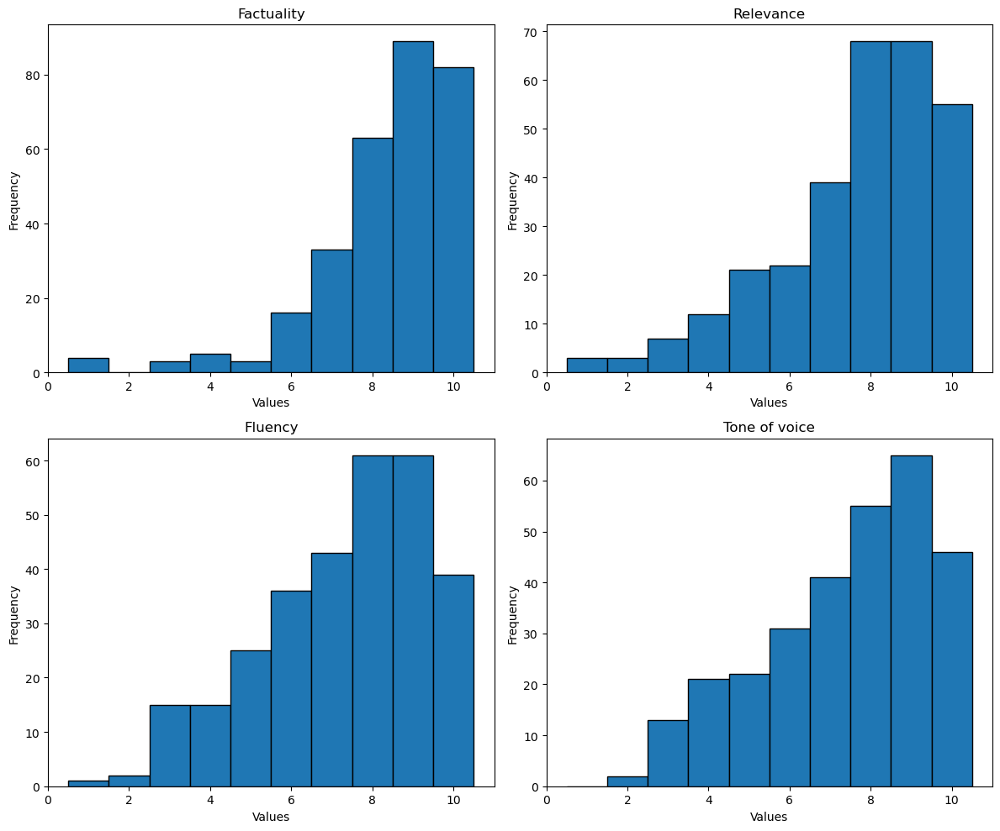

In [376]:
# Extract the values for 'feit', 'rele', 'vloe', and 'spre'
feit_values = obj_2['exFfeit'] + obj_2['exBfeit'] + obj_2['exDfeit'] +obj_2['nexAfeit'] + obj_2['nexCfeit'] + obj_2['nexGfeit']
rele_values = obj_2['exFrele'] + obj_2['exBrele'] + obj_2['exDrele'] + obj_2['nexArele'] + obj_2['nexCrele'] + obj_2['nexGrele']
vloe_values = obj_2['exFvloe'] + obj_2['exBvloe'] + obj_2['exDvloe'] + obj_2['nexAvloe'] + obj_2['nexCvloe'] + obj_2['nexGvloe']
spre_values = obj_2['exFspre'] + obj_2['exBspre'] + obj_2['exDspre'] + obj_2['nexAspre'] + obj_2['nexCspre'] + obj_2['nexGspre']

# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist(feit_values, bins=range(1, 12), edgecolor='black', align='left')
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')

# Plot for 'rele'
axs[0, 1].hist(rele_values, bins=range(1, 12), edgecolor='black', align='left')
axs[0, 1].set_title('Relevance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')

# Plot for 'vloe'
axs[1, 0].hist(vloe_values, bins=range(1, 12), edgecolor='black', align='left')
axs[1, 0].set_title('Fluency')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[1, 1].hist(spre_values, bins=range(1, 12), edgecolor='black', align='left')
axs[1, 1].set_title('Tone of voice')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [378]:
cl_feit_values = obj_cl['exFfeit'] + obj_cl['exBfeit'] + obj_cl['exDfeit'] + obj_cl['nexAfeit'] + obj_cl['nexCfeit'] + obj_cl['nexGfeit']
gpt_feit_values = obj_gpt['exFfeit'] + obj_gpt['exBfeit'] + obj_gpt['exDfeit'] + obj_gpt['nexAfeit'] + obj_gpt['nexCfeit'] + obj_gpt['nexGfeit']
gold_feit_values = obj_gold['exFfeit'] + obj_gold['exBfeit'] + obj_gold['exDfeit'] +obj_gold['nexAfeit'] + obj_gold['nexCfeit'] + obj_gold['nexGfeit']

cl_rele_values = obj_cl['exFrele'] + obj_cl['exBrele'] + obj_cl['exDrele'] + obj_cl['nexArele'] + obj_cl['nexCrele'] + obj_cl['nexGrele']
gpt_rele_values = obj_gpt['exFrele'] + obj_gpt['exBrele'] + obj_gpt['exDrele'] + obj_gpt['nexArele'] + obj_gpt['nexCrele'] + obj_gpt['nexGrele']
gold_rele_values = obj_gold['exFrele'] + obj_gold['exBrele'] + obj_gold['exDrele'] + obj_gold['nexArele'] + obj_gold['nexCrele'] + obj_gold['nexGrele']

cl_vloe_values = obj_cl['exFvloe'] + obj_cl['exBvloe'] + obj_cl['exDvloe'] + obj_cl['nexAvloe'] + obj_cl['nexCvloe'] + obj_cl['nexGvloe']
gpt_vloe_values = obj_gpt['exFvloe'] + obj_gpt['exBvloe'] + obj_gpt['exDvloe'] + obj_gpt['nexAvloe'] + obj_gpt['nexCvloe'] + obj_gpt['nexGvloe']
gold_vloe_values = obj_gold['exFvloe'] + obj_gold['exBvloe'] + obj_gold['exDvloe'] + obj_gold['nexAvloe'] + obj_gold['nexCvloe'] + obj_gold['nexGvloe']

cl_spre_values = obj_cl['exFspre'] + obj_cl['exBspre'] + obj_cl['exDspre'] + obj_cl['nexAspre'] + obj_cl['nexCspre'] + obj_cl['nexGspre']
gpt_spre_values = obj_gpt['exFspre'] + obj_gpt['exBspre'] + obj_gpt['exDspre'] + obj_gpt['nexAspre'] + obj_gpt['nexCspre'] + obj_gpt['nexGspre']
gold_spre_values = obj_gold['exFspre'] + obj_gold['exBspre'] + obj_gold['exDspre'] + obj_gold['nexAspre'] + obj_gold['nexCspre'] + obj_gold['nexGspre']

In [379]:
print(len(cl_feit_values))
print(len(gpt_feit_values))
print(len(gold_feit_values))
print(len(feit_values))

120
120
60
300


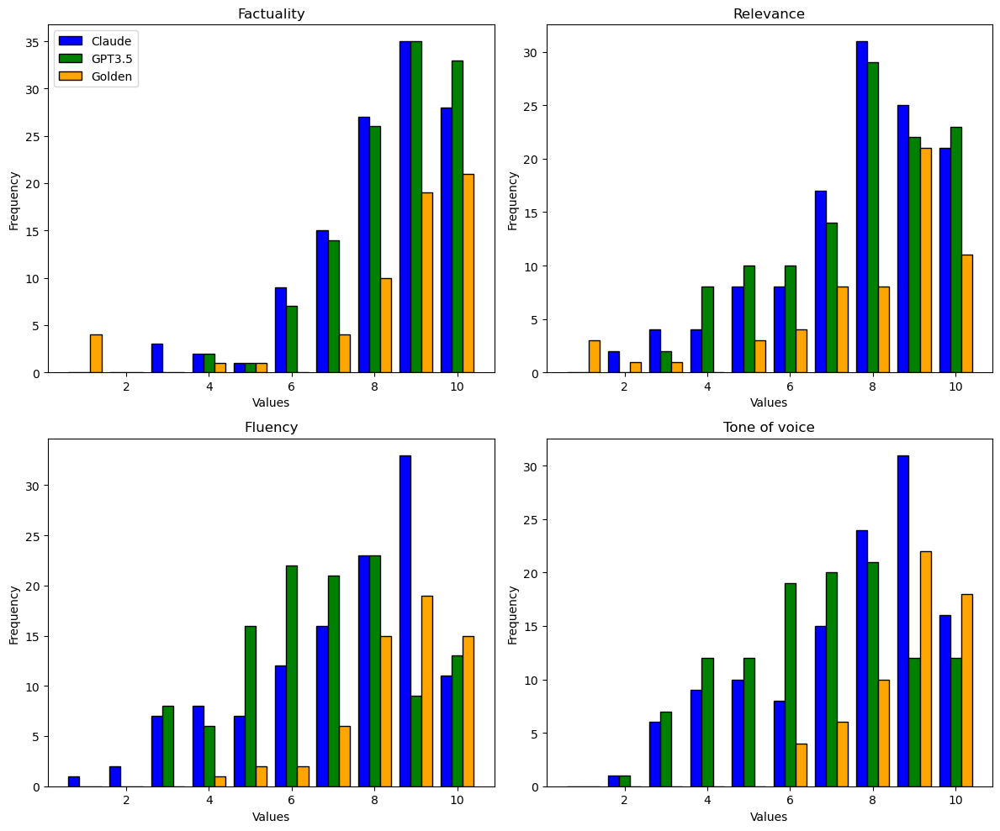

In [381]:
# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist([cl_feit_values, gpt_feit_values, gold_feit_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude', 'GPT3.5', 'Golden'])
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()


# Plot for 'rele'
axs[0, 1].hist([cl_rele_values, gpt_rele_values, gold_rele_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude', 'GPT3.5', 'Golden'])
axs[0, 1].set_title('Relevance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')

# Plot for 'vloe'
axs[1, 0].hist([cl_vloe_values, gpt_vloe_values, gold_vloe_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude', 'GPT3.5', 'Golden'])
axs[1, 0].set_title('Fluency')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[1, 1].hist([cl_spre_values, gpt_spre_values, gold_spre_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude', 'GPT3.5', 'Golden'])
axs[1, 1].set_title('Tone of voice')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## Plotting only best- found (by LLM)


In [413]:
cl_feit_values_best = obj_cl_best['exFfeit'] + obj_cl_best['exBfeit'] + obj_cl_best['exDfeit'] + obj_cl_best['nexAfeit'] + obj_cl_best['nexCfeit'] + obj_cl_best['nexGfeit']
gpt_feit_values_best = obj_gpt_best['exFfeit'] + obj_gpt_best['exBfeit'] + obj_gpt_best['exDfeit'] + obj_gpt_best['nexAfeit'] + obj_gpt_best['nexCfeit'] + obj_gpt_best['nexGfeit']
gold_feit_values = obj_gold['exFfeit'] + obj_gold['exBfeit'] + obj_gold['exDfeit'] +obj_gold['nexAfeit'] + obj_gold['nexCfeit'] + obj_gold['nexGfeit']

cl_rele_values_best = obj_cl_best['exFrele'] + obj_cl_best['exBrele'] + obj_cl_best['exDrele'] + obj_cl_best['nexArele'] + obj_cl_best['nexCrele'] + obj_cl_best['nexGrele']
gpt_rele_values_best = obj_gpt_best['exFrele'] + obj_gpt_best['exBrele'] + obj_gpt_best['exDrele'] + obj_gpt_best['nexArele'] + obj_gpt_best['nexCrele'] + obj_gpt_best['nexGrele']
gold_rele_values = obj_gold['exFrele'] + obj_gold['exBrele'] + obj_gold['exDrele'] + obj_gold['nexArele'] + obj_gold['nexCrele'] + obj_gold['nexGrele']

cl_vloe_values_best = obj_cl_best['exFvloe'] + obj_cl_best['exBvloe'] + obj_cl_best['exDvloe'] + obj_cl_best['nexAvloe'] + obj_cl_best['nexCvloe'] + obj_cl_best['nexGvloe']
gpt_vloe_values_best = obj_gpt_best['exFvloe'] + obj_gpt_best['exBvloe'] + obj_gpt_best['exDvloe'] + obj_gpt_best['nexAvloe'] + obj_gpt_best['nexCvloe'] + obj_gpt_best['nexGvloe']
gold_vloe_values = obj_gold['exFvloe'] + obj_gold['exBvloe'] + obj_gold['exDvloe'] + obj_gold['nexAvloe'] + obj_gold['nexCvloe'] + obj_gold['nexGvloe']

cl_spre_values_best = obj_cl_best['exFspre'] + obj_cl_best['exBspre'] + obj_cl_best['exDspre'] + obj_cl_best['nexAspre'] + obj_cl_best['nexCspre'] + obj_cl_best['nexGspre']
gpt_spre_values_best = obj_gpt_best['exFspre'] + obj_gpt_best['exBspre'] + obj_gpt_best['exDspre'] + obj_gpt_best['nexAspre'] + obj_gpt_best['nexCspre'] + obj_gpt_best['nexGspre']
gold_spre_values = obj_gold['exFspre'] + obj_gold['exBspre'] + obj_gold['exDspre'] + obj_gold['nexAspre'] + obj_gold['nexCspre'] + obj_gold['nexGspre']

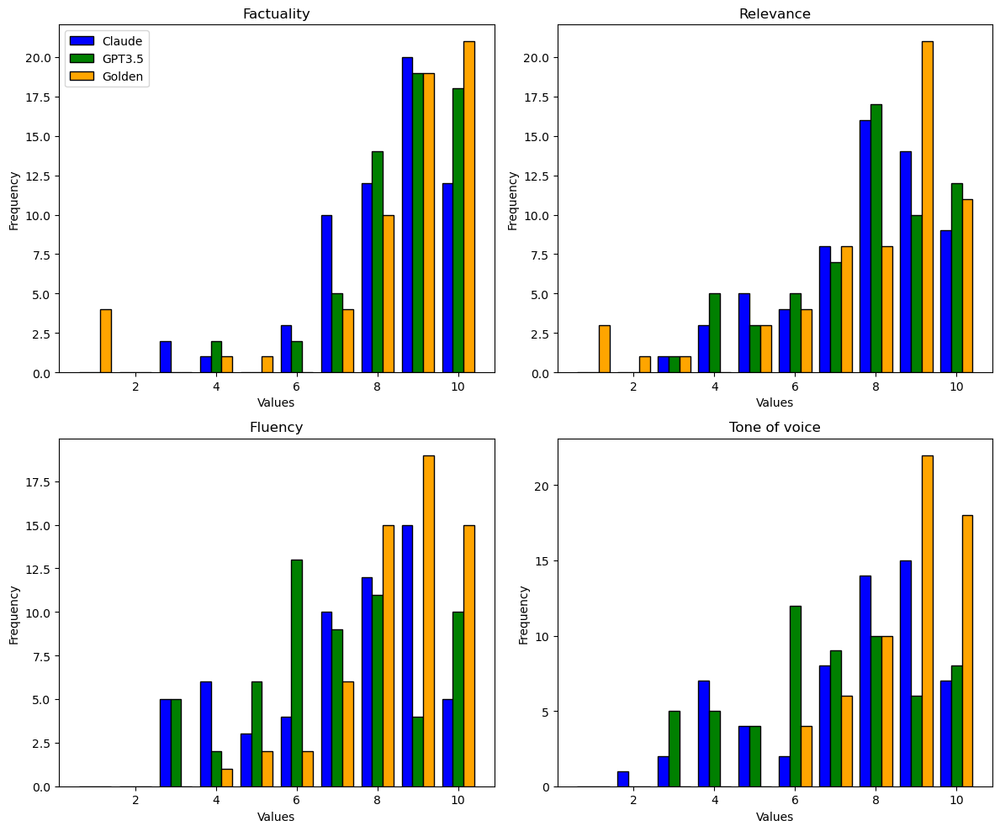

In [414]:
# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist([cl_feit_values_best, gpt_feit_values_best, gold_feit_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()


# Plot for 'rele'
axs[0, 1].hist([cl_rele_values_best, gpt_rele_values_best, gold_rele_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[0, 1].set_title('Relevance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')

# Plot for 'vloe'
axs[1, 0].hist([cl_vloe_values_best, gpt_vloe_values_best, gold_vloe_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[1, 0].set_title('Fluency')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[1, 1].hist([cl_spre_values_best, gpt_spre_values_best, gold_spre_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[1, 1].set_title('Tone of voice')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## Plotting only worst-found

In [411]:
cl_feit_values_worst = obj_cl_worst['exFfeit'] + obj_cl_worst['exBfeit'] + obj_cl_worst['exDfeit'] + obj_cl_worst['nexAfeit'] + obj_cl_worst['nexCfeit'] + obj_cl_worst['nexGfeit']
gpt_feit_values_worst = obj_gpt_worst['exFfeit'] + obj_gpt_worst['exBfeit'] + obj_gpt_worst['exDfeit'] + obj_gpt_worst['nexAfeit'] + obj_gpt_worst['nexCfeit'] + obj_gpt_worst['nexGfeit']
gold_feit_values = obj_gold['exFfeit'] + obj_gold['exBfeit'] + obj_gold['exDfeit'] +obj_gold['nexAfeit'] + obj_gold['nexCfeit'] + obj_gold['nexGfeit']

cl_rele_values_worst = obj_cl_worst['exFrele'] + obj_cl_worst['exBrele'] + obj_cl_worst['exDrele'] + obj_cl_worst['nexArele'] + obj_cl_worst['nexCrele'] + obj_cl_worst['nexGrele']
gpt_rele_values_worst = obj_gpt_worst['exFrele'] + obj_gpt_worst['exBrele'] + obj_gpt_worst['exDrele'] + obj_gpt_worst['nexArele'] + obj_gpt_worst['nexCrele'] + obj_gpt_worst['nexGrele']
gold_rele_values = obj_gold['exFrele'] + obj_gold['exBrele'] + obj_gold['exDrele'] + obj_gold['nexArele'] + obj_gold['nexCrele'] + obj_gold['nexGrele']

cl_vloe_values_worst = obj_cl_worst['exFvloe'] + obj_cl_worst['exBvloe'] + obj_cl_worst['exDvloe'] + obj_cl_worst['nexAvloe'] + obj_cl_worst['nexCvloe'] + obj_cl_worst['nexGvloe']
gpt_vloe_values_worst = obj_gpt_worst['exFvloe'] + obj_gpt_worst['exBvloe'] + obj_gpt_worst['exDvloe'] + obj_gpt_worst['nexAvloe'] + obj_gpt_worst['nexCvloe'] + obj_gpt_worst['nexGvloe']
gold_vloe_values = obj_gold['exFvloe'] + obj_gold['exBvloe'] + obj_gold['exDvloe'] + obj_gold['nexAvloe'] + obj_gold['nexCvloe'] + obj_gold['nexGvloe']

cl_spre_values_worst = obj_cl_worst['exFspre'] + obj_cl_worst['exBspre'] + obj_cl_worst['exDspre'] + obj_cl_worst['nexAspre'] + obj_cl_worst['nexCspre'] + obj_cl_worst['nexGspre']
gpt_spre_values_worst = obj_gpt_worst['exFspre'] + obj_gpt_worst['exBspre'] + obj_gpt_worst['exDspre'] + obj_gpt_worst['nexAspre'] + obj_gpt_worst['nexCspre'] + obj_gpt_worst['nexGspre']
gold_spre_values = obj_gold['exFspre'] + obj_gold['exBspre'] + obj_gold['exDspre'] + obj_gold['nexAspre'] + obj_gold['nexCspre'] + obj_gold['nexGspre']

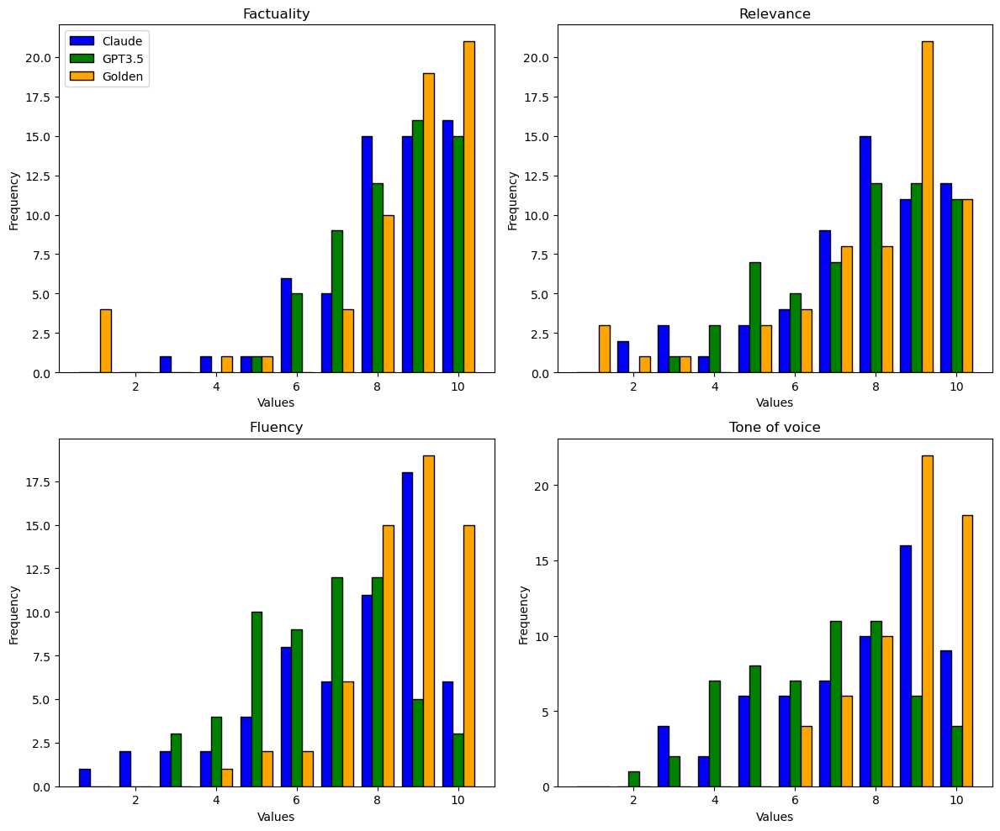

In [415]:
# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist([cl_feit_values_worst, gpt_feit_values_worst, gold_feit_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()


# Plot for 'rele'
axs[0, 1].hist([cl_rele_values_worst, gpt_rele_values_worst, gold_rele_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[0, 1].set_title('Relevance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')

# Plot for 'vloe'
axs[1, 0].hist([cl_vloe_values_worst, gpt_vloe_values_worst, gold_vloe_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[1, 0].set_title('Fluency')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[1, 1].hist([cl_spre_values_worst, gpt_spre_values_worst, gold_spre_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[1, 1].set_title('Tone of voice')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## Plotting best versus worst found (like the two above, only then the aspects are next to each other)


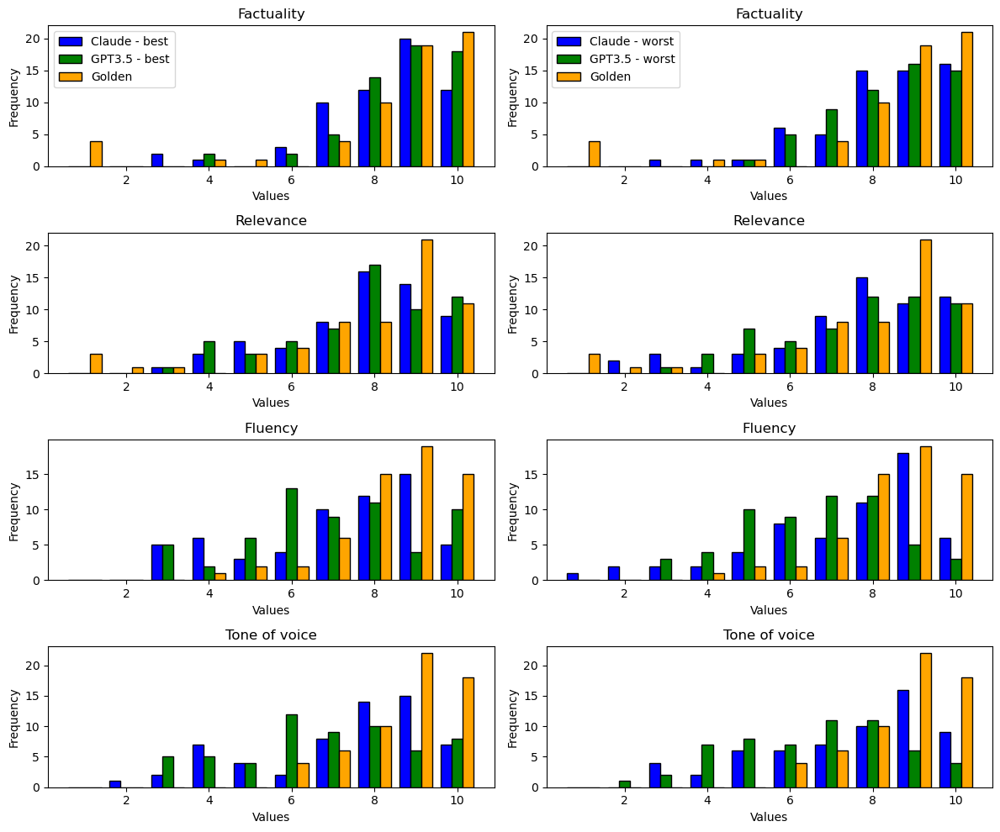

In [419]:
# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(4, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist([cl_feit_values_best, gpt_feit_values_best, gold_feit_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()

# Plot for 'feit'
axs[0, 1].hist([cl_feit_values_worst, gpt_feit_values_worst, gold_feit_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[0, 1].set_title('Factuality')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].legend()

# Plot for 'rele'
axs[1, 0].hist([cl_rele_values_best, gpt_rele_values_best, gold_rele_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[1, 0].set_title('Relevance')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'rele'
axs[1, 1].hist([cl_rele_values_worst, gpt_rele_values_worst, gold_rele_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[1, 1].set_title('Relevance')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')


# Plot for 'vloe'
axs[2, 0].hist([cl_vloe_values_best, gpt_vloe_values_best, gold_vloe_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[2, 0].set_title('Fluency')
axs[2, 0].set_xlabel('Values')
axs[2, 0].set_ylabel('Frequency')

# Plot for 'vloe'
axs[2, 1].hist([cl_vloe_values_worst, gpt_vloe_values_worst, gold_vloe_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[2, 1].set_title('Fluency')
axs[2, 1].set_xlabel('Values')
axs[2, 1].set_ylabel('Frequency')

# Plot for 'spre'
axs[3, 0].hist([cl_spre_values_best, gpt_spre_values_best, gold_spre_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - best', 'GPT3.5 - best', 'Golden'])
axs[3, 0].set_title('Tone of voice')
axs[3, 0].set_xlabel('Values')
axs[3, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[3, 1].hist([cl_spre_values_worst, gpt_spre_values_worst, gold_spre_values], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green', 'orange'], label=['Claude - worst', 'GPT3.5 - worst', 'Golden'])
axs[3, 1].set_title('Tone of voice')
axs[3, 1].set_xlabel('Values')
axs[3, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


## Plotting best-versus-worst Claude

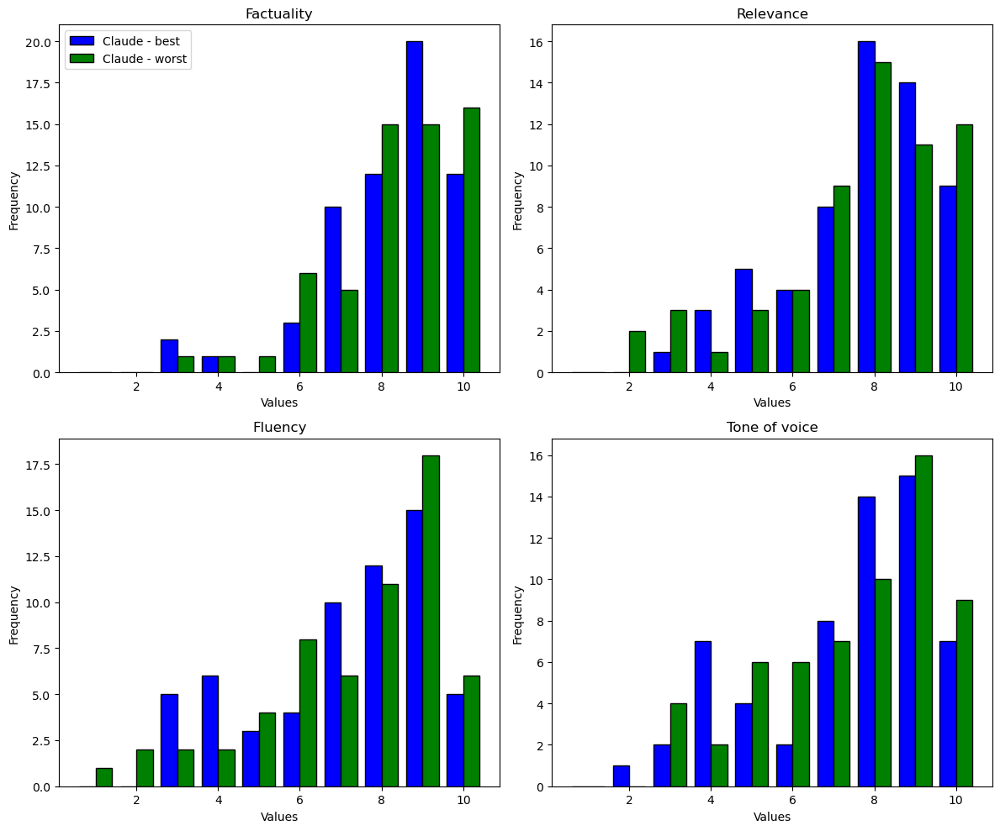

In [416]:
# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist([cl_feit_values_best, cl_feit_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['Claude - best', 'Claude - worst'])
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()


# Plot for 'rele'
axs[0, 1].hist([cl_rele_values_best, cl_rele_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['Claude - best', 'Claude - worst'])
axs[0, 1].set_title('Relevance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')

# Plot for 'vloe'
axs[1, 0].hist([cl_vloe_values_best, cl_vloe_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['Claude - best', 'Claude - worst'])
axs[1, 0].set_title('Fluency')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[1, 1].hist([cl_spre_values_best,cl_spre_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['Claude - best', 'Claude - worst'])
axs[1, 1].set_title('Tone of voice')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## Plotting best versus worst GPT

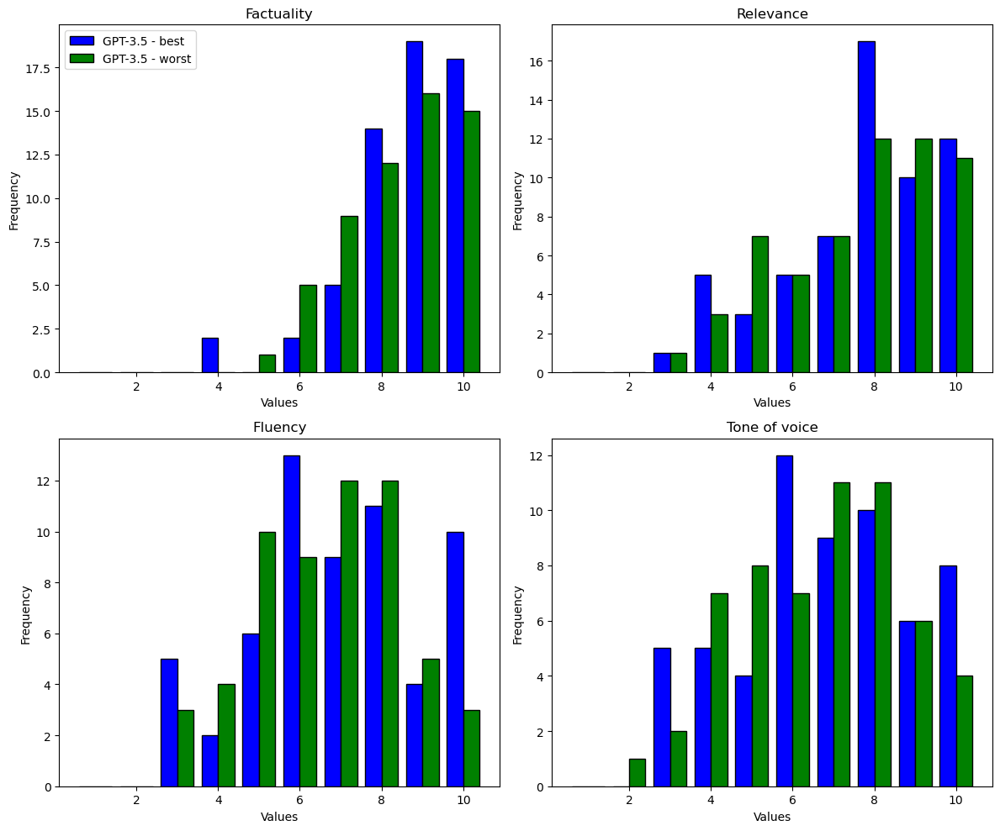

In [417]:
# Create subplots for 'feit', 'rele', 'vloe', and 'spre'
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot for 'feit'
axs[0, 0].hist([gpt_feit_values_best, gpt_feit_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['GPT-3.5 - best', 'GPT-3.5 - worst'])
axs[0, 0].set_title('Factuality')
axs[0, 0].set_xlabel('Values')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].legend()


# Plot for 'rele'
axs[0, 1].hist([gpt_rele_values_best, gpt_rele_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['GPT-3.5 - best', 'GPT-3.5 - worst'])
axs[0, 1].set_title('Relevance')
axs[0, 1].set_xlabel('Values')
axs[0, 1].set_ylabel('Frequency')

# Plot for 'vloe'
axs[1, 0].hist([gpt_vloe_values_best, gpt_vloe_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['GPT-3.5 - best', 'GPT-3.5 - worst'])
axs[1, 0].set_title('Fluency')
axs[1, 0].set_xlabel('Values')
axs[1, 0].set_ylabel('Frequency')

# Plot for 'spre'
axs[1, 1].hist([gpt_spre_values_best, gpt_spre_values_worst], bins=range(1, 12), edgecolor='black', align='left',
               color=['blue', 'green'], label=['GPT-3.5 - best', 'GPT-3.5 - worst'])
axs[1, 1].set_title('Tone of voice')
axs[1, 1].set_xlabel('Values')
axs[1, 1].set_ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [384]:
print(main_df.columns)

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre',
       'nex_G_geschreven', 'nex_G_gebruiken', 'ex_HM_feit', 'ex_HM_vloe',
       'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit', 'nex_HM_vloe', 'nex_HM_rele',
       'nex_HM_spre', 'total_HM_feit', 'total_HM_vloe', 'total_HM_rele',
       'total_HM_spre', 'total_HM_eval', 'nex_HM_eval', 'ex_H

## Calculate the percentage of cases where indeed the worst-found < best-found (so whether humans agree with the sign). Then, calculate the percentage best_found_cl < best_found_gpt.


In [1072]:
count_best_higher_than_worst = 0
count_worst_higher_than_best = 0
count_similar_score = 0
total = 0
na_values = [i for i in range(10)]
#llm_values = ['gpt4', 'cl']

#llm_values = [ 'gpt4']
llm_values = ['cl']

for na_value in na_values:
    for llm_value in llm_values:
        # Filter the DataFrame based on llm and NA values
        filtered_df = main_df[( main_df['llm'] == llm_value) & (main_df['NA_index'] == na_value)]

        # Get the scores for 'best' and 'worst' rankings
        score_best = filtered_df[filtered_df['RM_with_number'].str.contains('best')]['total_HM_eval']
        score_worst = filtered_df[filtered_df['RM_with_number'].str.contains('worst')]['total_HM_eval']

        # Compare the scores
        if not score_best.empty and not score_worst.empty:
 
            if score_best.iloc[0] > score_worst.iloc[0]:
                count_best_higher_than_worst += 1
                total += 1
            elif score_best.iloc[0] == score_worst.iloc[0]:
                count_similar_score += 1
                total += 1
            else:
                count_worst_higher_than_best += 1
                total += 1
        else:
            print(f"No data found for NA={na_value} and llm={llm_value}.")
            
            
print(count_best_higher_than_worst)
print(count_worst_higher_than_best)
print(total)

4
6
10


## Unfortunately, the best and worst categories are placed on the RM by comparing the mean of the evaluation scores. It can be the case that the worst-found scores higher than the best-found on some of the evaluation aspects.

In [1142]:
# just do cl now

feit_best_better_than_worst = 0
feit_worst_better_than_best = 0
rele_best_better_than_worst = 0
rele_worst_better_than_best = 0
spre_best_better_than_worst = 0
spre_worst_better_than_best = 0
vloe_best_better_than_worst = 0
vloe_worst_better_than_best = 0
eval_best_better_than_worst = 0
eval_worst_better_than_best = 0

feit_total = 0
rele_total = 0
spre_total = 0
vloe_total = 0
eval_total = 0
na_values = [i for i in range(10)]


llm = ['cl'] # , 'worst'
# Iterate over NA and llm values
for na_value in na_values:
    for quality_value in llm:
        # Filter the DataFrame based on quality and NA values
        filtered_df = main_df[( main_df['RM_with_number'].str.contains(quality_value)) & (main_df['NA_index'] == na_value)]
        filtered_df = filtered_df.reset_index()

        number_1 = float(filtered_df['feit_M'][0])
        number_2 = float(filtered_df['feit_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_feit_best = filtered_df[filtered_df['feit_M'] == number_1]['total_HM_feit']
            score_feit_worst = filtered_df[filtered_df['feit_M'] == number_2]['total_HM_feit']
        elif number_1 == number_2:
                score_feit_best = 0
                score_feit_worst = 0
        else:
            score_feit_best = filtered_df[filtered_df['feit_M'] == number_2]['total_HM_feit']
            score_feit_worst = filtered_df[filtered_df['feit_M'] == number_1]['total_HM_feit']
       
        if float(score_feit_best) > float(score_feit_worst):
            feit_best_better_than_worst += 1
            feit_total += 1
        elif float(score_feit_best) == float(score_feit_worst):
            feit_total += 1
            
        else:
            feit_worst_better_than_best += 1
            feit_total += 1

        # rele
        number_1 = float(filtered_df['rele_M'][0])
        number_2 = float(filtered_df['rele_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_rele_best = filtered_df[filtered_df['rele_M'] == number_1]['total_HM_rele']
            score_rele_worst = filtered_df[filtered_df['rele_M'] == number_2]['total_HM_rele']
        elif number_1 == number_2:
                score_rele_best = 0
                score_rele_worst = 0
        else:
            score_rele_best = filtered_df[filtered_df['rele_M'] == number_2]['total_HM_rele']
            score_rele_worst = filtered_df[filtered_df['rele_M'] == number_1]['total_HM_rele']
       
        if float(score_rele_best) > float(score_rele_worst):
            rele_best_better_than_worst += 1
            rele_total += 1
        elif float(score_rele_best) == float(score_rele_worst):
            rele_total += 1
        else:
            rele_worst_better_than_best += 1
            rele_total += 1
          
        # vloe
        number_1 = float(filtered_df['vloe_M'][0])
        number_2 = float(filtered_df['vloe_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_vloe_best = filtered_df[filtered_df['vloe_M'] == number_1]['total_HM_vloe']
            score_vloe_worst = filtered_df[filtered_df['vloe_M'] == number_2]['total_HM_vloe']
        elif number_1 == number_2:
                score_vloe_best = 0
                score_vloe_worst = 0
        else:
            score_vloe_best = filtered_df[filtered_df['vloe_M'] == number_2]['total_HM_vloe']
            score_vloe_worst = filtered_df[filtered_df['vloe_M'] == number_1]['total_HM_vloe']
       
        if float(score_vloe_best) > float(score_vloe_worst):
            vloe_best_better_than_worst += 1
            vloe_total += 1
        elif float(score_vloe_best) == float(score_vloe_worst):
            vloe_total += 1
        else:
            vloe_worst_better_than_best += 1
            vloe_total += 1
    
    
        # spre
        number_1 = float(filtered_df['spre_M'][0])
        number_2 = float(filtered_df['spre_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_spre_best = filtered_df[filtered_df['spre_M'] == number_1]['total_HM_spre']
            score_spre_worst = filtered_df[filtered_df['spre_M'] == number_2]['total_HM_spre']
        elif number_1 == number_2:
            score_spre_best = 0
            score_spre_worst = 0
        else:
            score_spre_best = filtered_df[filtered_df['spre_M'] == number_2]['total_HM_spre']
            score_spre_worst = filtered_df[filtered_df['spre_M'] == number_1]['total_HM_spre']
       
        if float(score_spre_best) > float(score_spre_worst):
            spre_best_better_than_worst += 1
            spre_total += 1
        elif float(score_spre_best) == float(score_spre_worst):
            spre_total += 1
        else:

            spre_worst_better_than_best += 1
            spre_total += 1
        
        
        
        # eval
        number_1 = float(filtered_df['eval_M'][0])
        number_2 = float(filtered_df['eval_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_eval_best = filtered_df[filtered_df['eval_M'] == number_1]['total_HM_eval']
            score_eval_worst = filtered_df[filtered_df['eval_M'] == number_2]['total_HM_eval']
        elif number_1 == number_2:
                score_eval_best = 1
                score_eval_worst = 1
                
        else:
            score_eval_best = filtered_df[filtered_df['eval_M'] == number_2]['total_HM_eval']
            score_eval_worst = filtered_df[filtered_df['eval_M'] == number_1]['total_HM_eval']
        

        if float(score_eval_best) > float(score_eval_worst):
            eval_best_better_than_worst += 1
            eval_total += 1
        elif float(score_eval_best) == float(score_eval_worst):
            eval_total += 1   
        else:
            eval_worst_better_than_best += 1
            eval_total += 1
        
        
        
print("feit_best_better_than_worst: ", feit_best_better_than_worst)
print(feit_worst_better_than_best)
print(feit_total)

print("rele_best_better_than_worst: ", rele_best_better_than_worst)
print(rele_worst_better_than_best)
print(rele_total)

print("spre_best_better_than_worst: ", spre_best_better_than_worst)
print(spre_worst_better_than_best)
print(spre_total)

print("vloe_best_better_than_worst: ",  vloe_best_better_than_worst)
print(vloe_worst_better_than_best)
print(vloe_total)

print("eval_best_better_than_worst: ", eval_best_better_than_worst)
print(eval_worst_better_than_best)
print(eval_total)



feit_best_better_than_worst:  6
3
10
rele_best_better_than_worst:  4
6
10
spre_best_better_than_worst:  5
5
10
vloe_best_better_than_worst:  4
6
10
eval_best_better_than_worst:  4
6
10


C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\1640929473.py:42: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if float(score_feit_best) > float(score_feit_worst):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\1640929473.py:65: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if float(score_rele_best) > float(score_rele_worst):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\1640929473.py:68: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  elif float(score_rele_best) == float(score_rele_worst):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\1640929473.py:87: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use flo

In [1141]:
# just do gpt4 now

feit_best_better_than_worst = 0
feit_worst_better_than_best = 0
rele_best_better_than_worst = 0
rele_worst_better_than_best = 0
spre_best_better_than_worst = 0
spre_worst_better_than_best = 0
vloe_best_better_than_worst = 0
vloe_worst_better_than_best = 0
eval_best_better_than_worst = 0
eval_worst_better_than_best = 0

feit_total = 0
rele_total = 0
spre_total = 0
vloe_total = 0
eval_total = 0
na_values = [i for i in range(10)]


llm = ['gpt4'] # , 'worst'
# Iterate over NA and llm values
for na_value in na_values:
    for quality_value in llm:
        # Filter the DataFrame based on quality and NA values
        filtered_df = main_df[( main_df['RM_with_number'].str.contains(quality_value)) & (main_df['NA_index'] == na_value)]
        filtered_df = filtered_df.reset_index()

        number_1 = float(filtered_df['feit_M'][0])
        number_2 = float(filtered_df['feit_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_feit_best = filtered_df[filtered_df['feit_M'] == number_1]['total_HM_feit']
            score_feit_worst = filtered_df[filtered_df['feit_M'] == number_2]['total_HM_feit']
        elif number_1 == number_2:
            print('i guess happens once')
            score_feit_best = 0
            score_feit_worst = 0
        else:
            print('and this')
            score_feit_best = filtered_df[filtered_df['feit_M'] == number_2]['total_HM_feit']
            score_feit_worst = filtered_df[filtered_df['feit_M'] == number_1]['total_HM_feit']
        
        print(number_1)
        print(number_2)
        
        if float(score_feit_best) > float(score_feit_worst):
            print('CURIOUS')
            feit_best_better_than_worst += 1
            feit_total += 1
        elif float(score_feit_best) == float(score_feit_worst):
            print("EXTREME")
            feit_total += 1
            
        else:
            print("BOOTY")
            feit_worst_better_than_best += 1
            feit_total += 1
        print(na_value)
        # rele
        number_1 = float(filtered_df['rele_M'][0])
        number_2 = float(filtered_df['rele_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_rele_best = filtered_df[filtered_df['rele_M'] == number_1]['total_HM_rele']
            score_rele_worst = filtered_df[filtered_df['rele_M'] == number_2]['total_HM_rele']
        elif number_1 == number_2:
                score_rele_best = 0
                score_rele_worst = 0
        else:
            score_rele_best = filtered_df[filtered_df['rele_M'] == number_2]['total_HM_rele']
            score_rele_worst = filtered_df[filtered_df['rele_M'] == number_1]['total_HM_rele']
       
        if float(score_rele_best) > float(score_rele_worst):
            rele_best_better_than_worst += 1
            rele_total += 1
        elif float(score_rele_best) == float(score_rele_worst):
            rele_total += 1
        else:
            rele_worst_better_than_best += 1
            rele_total += 1
          
        # vloe
        number_1 = float(filtered_df['vloe_M'][0])
        number_2 = float(filtered_df['vloe_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_vloe_best = filtered_df[filtered_df['vloe_M'] == number_1]['total_HM_vloe']
            score_vloe_worst = filtered_df[filtered_df['vloe_M'] == number_2]['total_HM_vloe']
        elif number_1 == number_2:
                score_vloe_best = 0
                score_vloe_worst = 0
        else:
            score_vloe_best = filtered_df[filtered_df['vloe_M'] == number_2]['total_HM_vloe']
            score_vloe_worst = filtered_df[filtered_df['vloe_M'] == number_1]['total_HM_vloe']
       
        if float(score_vloe_best) > float(score_vloe_worst):
            vloe_best_better_than_worst += 1
            vloe_total += 1
        elif float(score_vloe_best) == float(score_vloe_worst):
            vloe_total += 1
        else:
            vloe_worst_better_than_best += 1
            vloe_total += 1
    
    
        # spre
        number_1 = float(filtered_df['spre_M'][0])
        number_2 = float(filtered_df['spre_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_spre_best = filtered_df[filtered_df['spre_M'] == number_1]['total_HM_spre']
            score_spre_worst = filtered_df[filtered_df['spre_M'] == number_2]['total_HM_spre']
        elif number_1 == number_2:
            score_spre_best = 0
            score_spre_worst = 0
        else:
            score_spre_best = filtered_df[filtered_df['spre_M'] == number_2]['total_HM_spre']
            score_spre_worst = filtered_df[filtered_df['spre_M'] == number_1]['total_HM_spre']
       
        if float(score_spre_best) > float(score_spre_worst):
            spre_best_better_than_worst += 1
            spre_total += 1
        elif float(score_spre_best) == float(score_spre_worst):
            spre_total += 1
        else:

            spre_worst_better_than_best += 1
            spre_total += 1
        
        
        
        # eval
        number_1 = float(filtered_df['eval_M'][0])
        number_2 = float(filtered_df['eval_M'][1])
        if number_1 > number_2: # in this case number 1 is the evaluated as the best by the llm
            score_eval_best = filtered_df[filtered_df['eval_M'] == number_1]['total_HM_eval']
            score_eval_worst = filtered_df[filtered_df['eval_M'] == number_2]['total_HM_eval']
        elif number_1 == number_2:
                score_eval_best = 1
                score_eval_worst = 1
                
        else:
            score_eval_best = filtered_df[filtered_df['eval_M'] == number_2]['total_HM_eval']
            score_eval_worst = filtered_df[filtered_df['eval_M'] == number_1]['total_HM_eval']
        

        if float(score_eval_best) > float(score_eval_worst):
            eval_best_better_than_worst += 1
            eval_total += 1
        elif float(score_eval_best) == float(score_eval_worst):
            eval_total += 1   
        else:
            eval_worst_better_than_best += 1
            eval_total += 1
        
        
        
print("feit_best_better_than_worst: ", feit_best_better_than_worst)
print(feit_worst_better_than_best)
print(feit_total)

print("rele_best_better_than_worst: ", rele_best_better_than_worst)
print(rele_worst_better_than_best)
print(rele_total)

print("spre_best_better_than_worst: ", spre_best_better_than_worst)
print(spre_worst_better_than_best)
print(spre_total)

print("vloe_best_better_than_worst: ",  vloe_best_better_than_worst)
print(vloe_worst_better_than_best)
print(vloe_total)

print("eval_best_better_than_worst: ", eval_best_better_than_worst)
print(eval_worst_better_than_best)
print(eval_total)

and this
85.0
94.0
CURIOUS
0
100.0
94.0
CURIOUS
1
and this
70.0
87.0
BOOTY
2
99.0
98.0
CURIOUS
3
i guess happens once
100.0
100.0
EXTREME
4
and this
80.0
86.0
BOOTY
5
and this
74.0
92.0
CURIOUS
6
and this
81.0
92.0
BOOTY
7
89.0
78.0
EXTREME
8
and this
85.0
97.0
BOOTY
9
feit_best_better_than_worst:  4
4
10
rele_best_better_than_worst:  6
4
10
spre_best_better_than_worst:  7
3
10
vloe_best_better_than_worst:  6
4
10
eval_best_better_than_worst:  7
3
10


C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\716333437.py:47: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if float(score_feit_best) > float(score_feit_worst):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\716333437.py:73: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if float(score_rele_best) > float(score_rele_worst):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\716333437.py:95: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if float(score_vloe_best) > float(score_vloe_worst):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\716333437.py:118: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser

## Conclusion: It is not a good strategy to ask the LLM to evaluate its generations and select the best-found over the worse found. This since it doesn't really add value

## Calculate percentages of whether the GPT3.5 or Claude best-found generated radio-message received a higher score than the other one. 

## change feit_M to the human variant

In [1093]:
count_cl_better_than_gpt = 0
count_gpt_better_than_cl = 0

feit_cl_better_than_gpt = 0
feit_gpt_better_than_cl = 0
rele_cl_better_than_gpt = 0
rele_gpt_better_than_cl = 0
spre_cl_better_than_gpt = 0
spre_gpt_better_than_cl = 0
vloe_cl_better_than_gpt = 0
vloe_gpt_better_than_cl = 0
eval_cl_better_than_gpt = 0
eval_gpt_better_than_cl = 0

feit_total = 0
rele_total = 0
spre_total = 0
vloe_total = 0
eval_total = 0
na_values = [i for i in range(10)]

quality_values = ['best'] # , 'worst'
# Iterate over NA and llm values
for na_value in na_values:
    for quality_value in quality_values:
        # Filter the DataFrame based on quality and NA values
        filtered_df = main_df[( main_df['RM_with_number'].str.contains(quality_value)) & (main_df['NA_index'] == na_value)]
        
        score_feit_cl = filtered_df[filtered_df['RM_with_number'].str.contains('cl')]['total_HM_feit']
        score_feit_gpt = filtered_df[filtered_df['RM_with_number'].str.contains('gpt')]['total_HM_feit']
        # Compare the feitelijkheid scores
        if not score_feit_cl.empty and not score_feit_gpt.empty:
            if int(score_feit_cl) > int(score_feit_gpt):
                feit_cl_better_than_gpt += 1
                feit_total += 1
            elif int(score_feit_cl) == int(score_feit_gpt):
                feit_total += 1
                continue
            else:
                feit_gpt_better_than_cl += 1
                feit_total += 1
        
        score_rele_cl = filtered_df[filtered_df['RM_with_number'].str.contains('cl')]['total_HM_rele']
        score_rele_gpt = filtered_df[filtered_df['RM_with_number'].str.contains('gpt')]['total_HM_rele']
        # Compare the relevance scores
        if not score_rele_cl.empty and not score_rele_gpt.empty:
            if int(score_rele_cl) > int(score_rele_gpt):
                rele_cl_better_than_gpt += 1
                rele_total += 1
            elif int(score_rele_cl) == int(score_rele_gpt):
                rele_total += 1
                continue
            else:
                rele_gpt_better_than_cl += 1
                rele_total += 1
        
        score_spre_cl = filtered_df[filtered_df['RM_with_number'].str.contains('cl')]['total_HM_spre']
        score_spre_gpt = filtered_df[filtered_df['RM_with_number'].str.contains('gpt')]['total_HM_spre']
        # Compare the tone of voice scores
        if not score_spre_cl.empty and not score_spre_gpt.empty:
            if int(score_spre_cl) > int(score_spre_gpt):
                spre_cl_better_than_gpt += 1
                spre_total += 1
            elif int(score_spre_cl) == int(score_spre_gpt):
                spre_total += 1
                continue
            else:
                spre_gpt_better_than_cl += 1
                spre_total += 1
        
        score_vloe_cl = filtered_df[filtered_df['RM_with_number'].str.contains('cl')]['total_HM_vloe']
        score_vloe_gpt = filtered_df[filtered_df['RM_with_number'].str.contains('gpt')]['total_HM_vloe']
        # Compare the fluency scores
        if not score_vloe_cl.empty and not score_vloe_gpt.empty:
            if int(score_vloe_cl) > int(score_vloe_gpt):
                vloe_cl_better_than_gpt += 1
                vloe_total += 1
            elif int(score_vloe_cl) == int(score_vloe_gpt):
                vloe_total += 1
                continue
            else:
                vloe_gpt_better_than_cl += 1
                vloe_total += 1
        
        
        score_eval_cl = filtered_df[filtered_df['RM_with_number'].str.contains('cl')]['total_HM_eval']
        score_eval_gpt = filtered_df[filtered_df['RM_with_number'].str.contains('gpt')]['total_HM_eval']
        # Compare the fluency scores
        if not score_eval_cl.empty and not score_eval_gpt.empty:
            if int(score_eval_cl) > int(score_eval_gpt):
                eval_cl_better_than_gpt += 1
                eval_total += 1
            elif int(score_eval_cl) == int(score_eval_gpt):
                eval_total += 1
                continue
            else:
                eval_gpt_better_than_cl += 1
                eval_total += 1
        else:
            print(f"No data found for NA={na_value} and llm={llm_value}.")
            
            
print(feit_cl_better_than_gpt)
print(feit_gpt_better_than_cl)
print(feit_total)

0
6
10


C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\2967915336.py:33: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(score_feit_cl) > int(score_feit_gpt):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\2967915336.py:36: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  elif int(score_feit_cl) == int(score_feit_gpt):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\2967915336.py:47: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if int(score_rele_cl) > int(score_rele_gpt):
C:\Users\20183274\AppData\Local\Temp\ipykernel_10444\2967915336.py:50: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  elif int(score

In [1094]:
print('feit_cl_better_than_gpt: ' ,feit_cl_better_than_gpt) 
print('feit_gpt_better_than_cl: ',feit_gpt_better_than_cl )
print(rele_cl_better_than_gpt )
print(rele_gpt_better_than_cl )
print(spre_cl_better_than_gpt )
print(spre_gpt_better_than_cl )
print(vloe_cl_better_than_gpt )
print(vloe_gpt_better_than_cl )
print(eval_cl_better_than_gpt )
print(eval_gpt_better_than_cl )

feit_cl_better_than_gpt:  0
feit_gpt_better_than_cl:  6
1
3
1
2
1
1
0
1


In [ ]:
# Hierna vergelijken van cl best and gpt best.


## Bertscore Kendall tau

In [876]:
exceptgold = main_df.loc[main_df['llm'] != 'gold']

In [807]:
correlation, p_value = stats.kendalltau(gpt4_subset['bertscore'], gpt4_subset['total_HM_vloe'])
print(correlation, p_value)

0.11140936297356784 0.4948288944459869


In [877]:
correlation, p_value = stats.kendalltau(cl_subset['bertscore'], cl_subset['total_HM_feit'])
print(correlation, p_value)

0.5185257765656843 0.001458119749096897


In [887]:
correlation, p_value = stats.kendalltau(exceptgold['bertscore'], exceptgold['total_HM_feit'])
print(correlation, p_value)
corr, pval = pearsonr(exceptgold['bertscore'], exceptgold['total_HM_feit'])
print(corr, pval)
print(int(pval))

0.2919984376787616 0.00840380568180707
0.43448746098975 0.005087445864447656
0


In [109]:
# no excepts:
correlation, p_value = stats.kendalltau(main_df['bertscore'], main_df['total_HM_feit'])
print(correlation, p_value)
# only gold
onlygold = main_df.loc[main_df['llm'] == 'gold']
correlation, p_value = stats.kendalltau(onlygold['bertscore'], onlygold['total_HM_feit'])
print(correlation, p_value)

correlation, p_value = stats.kendalltau(main_df['bertscore'], main_df['total_HM_spre'])
print(correlation, p_value)

0.2939744297531592 0.002871078987657332
0.025416428388767443 0.9248527112794935
0.3714052198771588 0.00015476758450220764


In [886]:
correlation, p_value = stats.kendalltau(exceptgold['bertscore'], exceptgold['total_HM_eval'])
print(correlation, p_value)
corr, pval = pearsonr(exceptgold['bertscore'], exceptgold['total_HM_eval'])
print(corr, pval)
print(int(pval))

0.20282430061942436 0.06560494202698791
0.3849694536749585 0.014170293969689142
0


In [883]:
correlation, p_value = stats.kendalltau(exceptgold['bertscore'], exceptgold['total_HM_vloe'])
print(correlation, p_value)

corr, pval = pearsonr(exceptgold['bertscore'], exceptgold['total_HM_vloe'])
print(corr, pval)
print(int(pval))

0.11780490500272697 0.28843279160006663
0.2336130422925037 0.14683301145802902
0


In [884]:
correlation, p_value = stats.kendalltau(exceptgold['bertscore'], exceptgold['total_HM_spre'])
print(correlation, p_value)

corr, pval = pearsonr(exceptgold['bertscore'], exceptgold['total_HM_spre'])
print(corr, pval)
print(int(pval))

0.07073991553074502 0.5215067782220397
0.14157511586575183 0.38353165339750395
0


In [885]:
correlation, p_value = stats.kendalltau(exceptgold['bertscore'], exceptgold['total_HM_rele'])
print(correlation, p_value)

corr, pval = pearsonr(exceptgold['bertscore'], exceptgold['total_HM_rele'])
print(corr, pval)
print(int(pval))

0.21244664030411708 0.05572307251000394
0.44321241679879775 0.004179884428727843
0


## Table: mean scores given by the Human evaluators

In [40]:
cl_subset = main_df.loc[main_df['llm'] == 'cl']
cl_subset[['bertscore', 'total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()

bertscore        0.717841
total_HM_feit    8.102083
total_HM_rele    7.612500
total_HM_vloe    6.975000
total_HM_spre    7.120833
total_HM_eval    7.452604
dtype: float64

In [41]:
gpt_subset = main_df.loc[main_df['llm'] == 'gpt4']
gpt_subset[['bertscore', 'total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()

bertscore        0.729561
total_HM_feit    8.560417
total_HM_rele    7.589583
total_HM_vloe    6.677083
total_HM_spre    6.491667
total_HM_eval    7.329688
dtype: float64

In [42]:
gold_subset = main_df.loc[main_df['llm'] == 'gold']
print(gold_subset[['bertscore', 'total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean())


gold_subset = main_df.loc[main_df['llm'] == 'gold']
tryd =gold_subset.drop([15])
print(tryd[['bertscore', 'total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean())

bertscore        1.000000
total_HM_feit    8.329167
total_HM_rele    7.825000
total_HM_vloe    8.620833
total_HM_spre    8.825000
total_HM_eval    8.400000
dtype: float64
bertscore        1.000000
total_HM_feit    8.935185
total_HM_rele    8.407407
total_HM_vloe    8.634259
total_HM_spre    8.847222
total_HM_eval    8.706019
dtype: float64


In [ ]:
# conclusie: mensen geven hoge scores aan feitelijkheid, maar d.m.v. voorbeelden laat ik zien dat er feitelijke onjuistheden in zitten.
# dit toont aan dat het gevaarlijk is het te gebruiken, aangezien mensen niet goed kunnen beoordelen of het feitelijk klopt.


In [1000]:
df_bert

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,eval_M
0,0,gpt4,gpt4_rm_2,NA_0_gpt4_rm_worst,NA_0_gpt4_rm_2_worst,0.697450,85.0,73.0,77.0,77.0,78.000
1,0,gold,cl_rm_g,NA_0_rm_g,NA_0_rm_g,1.000000,74.0,56.5,68.0,76.0,68.625
2,0,gpt4,gpt4_rm_6,NA_0_gpt4_rm_best,NA_0_gpt4_rm_6_best,0.710149,94.0,90.0,89.0,84.0,89.250
3,0,cl,cl_rm_6,NA_0_cl_rm_worst,NA_0_cl_rm_6_worst,0.710027,93.0,64.6,77.0,80.0,78.650
4,0,cl,cl_rm_1,NA_0_cl_rm_best,NA_0_cl_rm_1_best,0.711539,94.0,83.0,84.0,85.0,86.500
5,1,gpt4,gpt4_rm_2,NA_1_gpt4_rm_best,NA_1_gpt4_rm_2_best,0.727186,100.0,84.0,94.0,83.0,90.250
6,1,cl,cl_rm_4,NA_1_cl_rm_worst,NA_1_cl_rm_4_worst,0.723601,95.0,76.4,70.0,76.0,79.350
7,1,gpt4,gpt4_rm_4,NA_1_gpt4_rm_worst,NA_1_gpt4_rm_4_worst,0.699665,94.0,67.0,80.0,60.0,75.250
8,1,gold,cl_rm_g,NA_1_rm_g,NA_1_rm_g,1.000000,93.5,64.0,67.5,61.5,71.625
9,1,cl,cl_rm_2,NA_1_cl_rm_best,NA_1_cl_rm_2_best,0.709448,98.0,78.4,88.0,87.6,88.000


# score distribution per participant

In [9]:
main_df.columns

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

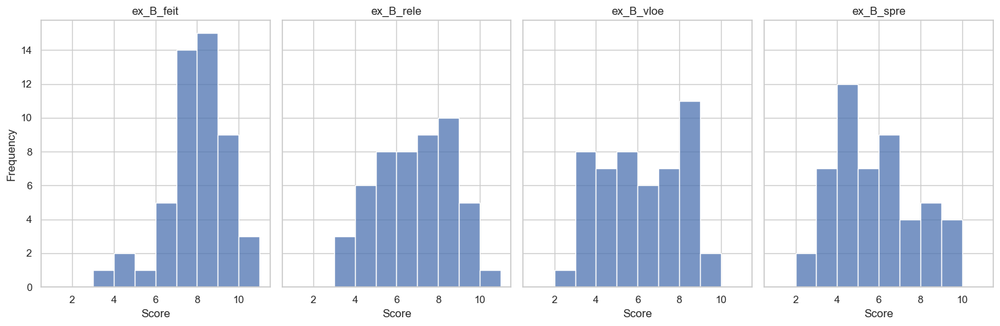

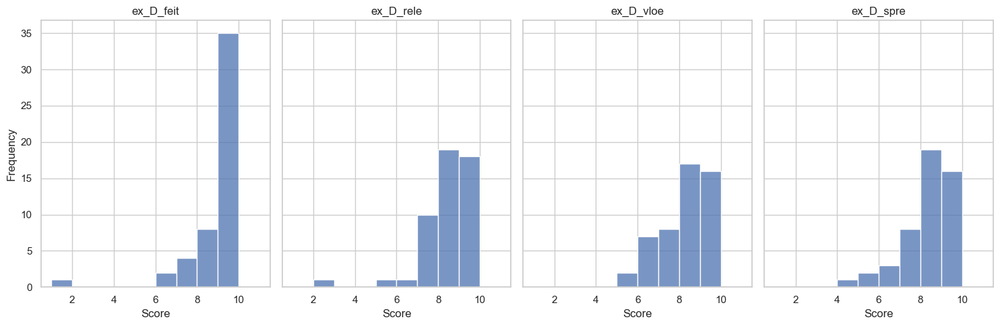

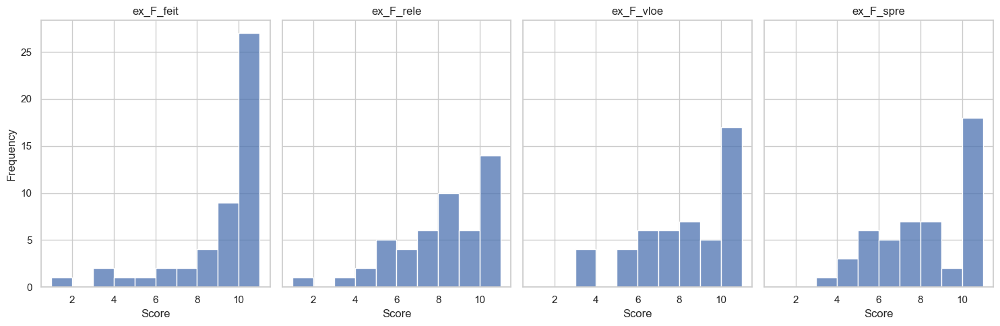

In [17]:
import seaborn as sns


# Set up the plotting style
sns.set(style='whitegrid')
cols = ['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']
subset = main_df[cols]
# Create subplots for each participant
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=1, ncols=len(subset.columns), figsize=(15, 5), sharey=True)

# Create histograms for each participant
for ax, column in zip(axes, subset.columns):
    sns.histplot(data=subset[column], bins=range(1, 12), kde=False, ax=ax)
    ax.set_title(column)
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()



# Set up the plotting style
sns.set(style='whitegrid')
cols = ['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']
subset = main_df[cols]
# Create subplots for each participant
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=1, ncols=len(subset.columns), figsize=(15, 5), sharey=True)

# Create histograms for each participant
for ax, column in zip(axes, subset.columns):
    sns.histplot(data=subset[column], bins=range(1, 12), kde=False, ax=ax)
    ax.set_title(column)
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()


# Set up the plotting style
sns.set(style='whitegrid')
cols = ['nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre']
subset = main_df[cols]
# Create subplots for each participant
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=1, ncols=len(subset.columns), figsize=(15, 5), sharey=True)

# Create histograms for each participant
for ax, column in zip(axes, subset.columns):
    sns.histplot(data=subset[column], bins=range(1, 12), kde=False, ax=ax)
    ax.set_title(column)
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

# Set up the plotting style
sns.set(style='whitegrid')
cols = ['nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre']
subset = main_df[cols]
# Create subplots for each participant
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=1, ncols=len(subset.columns), figsize=(15, 5), sharey=True)

# Create histograms for each participant
for ax, column in zip(axes, subset.columns):
    sns.histplot(data=subset[column], bins=range(1, 12), kde=False, ax=ax)
    ax.set_title(column)
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

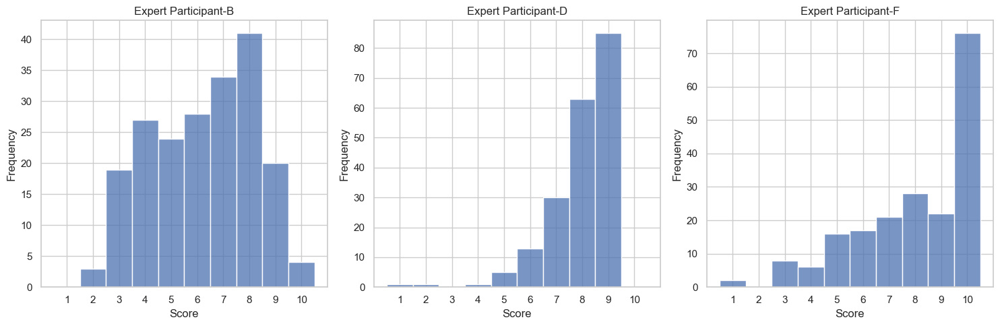

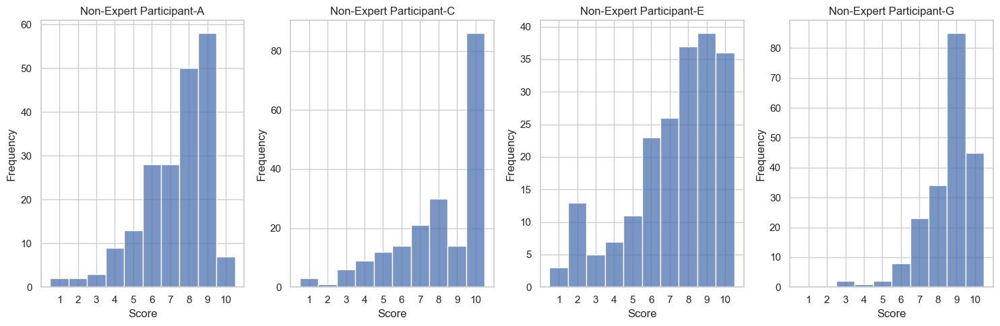

In [34]:
column_groups = [['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre'],
                 ['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre'],
                ['ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre']
                ]

# Set up the plotting style
sns.set(style='whitegrid')

# Create subplots with histograms for each group of columns
num_groups = len(column_groups)
fig, axes = plt.subplots(nrows=1, ncols=num_groups, figsize=(15, 5))
count = 0
for i, group in enumerate(column_groups):
    subset = main_df[group]
    all_scores = subset.values.flatten()
    ax = axes[i]
    sns.histplot(data=all_scores, bins=[x - 0.5 for x in range(1, 12)], kde=False, ax=ax)
    
    if count == 0:
        ax.set_title('Expert Participant-B')
    elif count == 1:
        ax.set_title('Expert Participant-D')
    else:
        ax.set_title('Expert Participant-F')
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')
    ax.set_xticks(range(1, 11))
    count +=1
# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


column_groups = [['nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre'],
                 ['nex_C_feit', 'nex_C_rele', 'nex_C_vloe', 'nex_C_spre'],
                ['nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre'],
                 ['nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']
                ]

# Set up the plotting style
sns.set(style='whitegrid')

# Create subplots with histograms for each group of columns
num_groups = len(column_groups)
fig, axes = plt.subplots(nrows=1, ncols=num_groups, figsize=(15, 5))
count = 0
for i, group in enumerate(column_groups):
    subset = main_df[group]
    all_scores = subset.values.flatten()
    ax = axes[i]
    sns.histplot(data=all_scores, bins=[x - 0.5 for x in range(1, 12)], kde=False, ax=ax)
    if count == 0:
        ax.set_title('Non-Expert Participant-A')
    elif count == 1:
        ax.set_title('Non-Expert Participant-C')
    elif count == 2:
        ax.set_title('Non-Expert Participant-E')
    else:
        ax.set_title('Non-Expert Participant-G')
    ax.set_xlabel('Score')
    ax.set_ylabel('Frequency')
    ax.set_xticks(range(1, 11))
    count += 1
# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

# Mean difference between the LLM evaluation scores given 

In [83]:

# Filter only 'gpt4' and 'cl' rows
filtered_df = main_df[main_df['llm'].isin(['gpt4', 'cl'])]

# Calculate the absolute difference between 'gpt4' and 'cl' rows for each NA_index
diff_columns = ['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']
llms = ['gpt4', 'cl']

for column in diff_columns:
    for llm in llms:
        filtered_by_llm = filtered_df[filtered_df['llm'] == llm]
        filtered_df[f'{column}_{llm}_diff'] = filtered_by_llm.groupby('NA_index')[column].diff().abs()
    print(filtered_df)
# Calculate the mean of the absolute differences between 'gpt4' and 'cl' for each NA_index
mean_diff_columns = [f'{column}_{llm}_diff' for column in diff_columns for llm in llms]
average_diff_per_index = filtered_df.groupby('NA_index')[mean_diff_columns].mean()

print(average_diff_per_index)


    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
13         2  gpt4  gpt4_rm_5  NA_2_gpt4_rm_worst  NA_2_gpt4_rm_5_worst   
14         2  gpt4  gpt4_rm_2   NA_2_gpt4_rm_best   NA_2_gpt4_rm_2_best   
16         3  gpt4  gpt4_

C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\1962740543.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_{llm}_diff'] = filtered_by_llm.groupby('NA_index')[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\1962740543.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_{llm}_diff'] = filtered_by_llm.groupby('NA_index')[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\1962740543.py:11: SettingWithCopyWa

In [84]:
# Calculate the mean of the 'gpt4' and 'cl' columns for each NA_index and store it in new columns
for column in diff_columns:
    average_diff_per_index[f'{column}_diff'] = (average_diff_per_index[f'{column}_gpt4_diff'] + average_diff_per_index[f'{column}_cl_diff']) / 2

# Select only the mean diff columns
result = average_diff_per_index[[f'{column}_diff' for column in diff_columns]]

print(result)
mean_per_column = result.mean()

print(mean_per_column)

          feit_M_diff  vloe_M_diff  rele_M_diff  spre_M_diff  eval_M_diff
NA_index                                                                 
0                 5.0         17.7          9.5          6.0        9.550
1                 4.5          9.5         16.0         17.3       11.825
2                10.3          7.8         25.5         14.5       12.975
3                 8.5         27.5         23.0         19.7       19.675
4                12.2         27.3         21.5         26.7       21.925
5                 5.8         15.7         18.5         19.0       14.750
6                10.0          9.5         21.0         16.5       12.750
7                11.0         15.0         14.5          8.5       11.750
8                 9.5         16.2          8.5         12.0       11.550
9                 8.5         13.3          7.8          3.5        8.275
feit_M_diff     8.5300
vloe_M_diff    15.9500
rele_M_diff    16.5800
spre_M_diff    14.3700
eval_M_diff    13.50

In [82]:
filtered_df = main_df[main_df['llm'].isin(['gpt4', 'cl'])]

# Calculate the absolute difference between 'gpt4' and 'cl' rows for each NA_index
diff_columns = ['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']

for column in diff_columns:
    filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()

# Calculate the mean of the absolute differences for each NA_index
average_diff_per_index = filtered_df.groupby('NA_index')[[f'{column}_diff' for column in diff_columns]].mean()

print(average_diff_per_index)

mean_per_column = average_diff_per_index.mean()

print(mean_per_column)

          feit_M_diff  vloe_M_diff  rele_M_diff  spre_M_diff  eval_M_diff
NA_index                                                                 
0                 5.0         17.7          9.5          6.0        9.550
1                 4.5          9.5         16.0         17.3       11.825
2                10.3          7.8         25.5         14.5       12.975
3                 8.5         27.5         23.0         19.7       19.675
4                12.2         27.3         21.5         26.7       21.925
5                 5.8         15.7         18.5         19.0       14.750
6                10.0          9.5         21.0         16.5       12.750
7                11.0         15.0         14.5          8.5       11.750
8                 9.5         16.2          8.5         12.0       11.550
9                 8.5         13.3          7.8          3.5        8.275
feit_M_diff     8.5300
vloe_M_diff    15.9500
rele_M_diff    16.5800
spre_M_diff    14.3700
eval_M_diff    13.50

C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\4044234492.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\4044234492.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\4044234492.py:7: SettingWithCopyWarning

In [87]:
## PER INDIVIDUAL LLM | GPT

filtered_df = main_df[main_df['llm'].isin(['gpt4'])]

# Calculate the absolute difference between 'gpt4' and 'cl' rows for each NA_index
diff_columns = ['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']

for column in diff_columns:
    filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()

# Calculate the mean of the absolute differences for each NA_index
average_diff_per_index = filtered_df.groupby('NA_index')[[f'{column}_diff' for column in diff_columns]].mean()

print(average_diff_per_index)

mean_per_column = average_diff_per_index.mean()

print(mean_per_column)



filtered_df = main_df[main_df['llm'].isin(['cl'])]

# Calculate the absolute difference between 'gpt4' and 'cl' rows for each NA_index
diff_columns = ['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']

for column in diff_columns:
    filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()

# Calculate the mean of the absolute differences for each NA_index
average_diff_per_index = filtered_df.groupby('NA_index')[[f'{column}_diff' for column in diff_columns]].mean()

#print(average_diff_per_index)

mean_per_column = average_diff_per_index.mean()

print(mean_per_column)

          feit_M_diff  vloe_M_diff  rele_M_diff  spre_M_diff  eval_M_diff
NA_index                                                                 
0                 9.0         17.0         12.0          7.0        11.25
1                 6.0         17.0         14.0         23.0        15.00
2                17.0         13.0         22.0         19.0        17.75
3                 1.0         30.0          8.0         10.0        12.25
4                 0.0          7.0          6.0         18.0         7.75
5                 6.0         20.0         19.0         28.0        18.25
6                18.0         16.0         12.0         27.0        18.25
7                11.0         13.0         13.0         15.0        13.00
8                11.0         16.0         13.0         22.0        15.50
9                12.0         16.0          9.0          3.0        10.00
feit_M_diff     9.1
vloe_M_diff    16.5
rele_M_diff    12.8
spre_M_diff    17.2
eval_M_diff    13.9
dtype: float

C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\2377884661.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\2377884661.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\2377884661.py:9: SettingWithCopyWarning

In [55]:
filtered_df = main_df[main_df['llm'].isin(['gpt4', 'cl'])]

# Calculate the absolute difference between 'gpt4' and 'cl' rows for each NA_index
diff_columns = ['total_HM_feit', 'total_HM_vloe', 'total_HM_rele', 'total_HM_spre', 'total_HM_eval']

for column in diff_columns:
    filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()

# Calculate the mean of the absolute differences for each NA_index
average_diff_per_index = filtered_df.groupby('NA_index')[[f'{column}_diff' for column in diff_columns]].mean()


C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\135177595.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\135177595.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[f'{column}_diff'] = filtered_df.groupby(['NA_index', 'llm'])[column].diff().abs()
C:\Users\20183274\AppData\Local\Temp\ipykernel_22444\135177595.py:7: SettingWithCopyWarning: 


In [56]:
print(average_diff_per_index)

mean_per_column = average_diff_per_index.mean()

print(mean_per_column)

          total_HM_feit_diff  total_HM_vloe_diff  total_HM_rele_diff   
NA_index                                                               
0                   0.875000            0.770833            0.666667  \
1                   1.458333            1.229167            2.416667   
2                   1.562500            0.666667            0.729167   
3                   0.750000            0.437500            1.375000   
4                   0.791667            1.312500            1.000000   
5                   0.250000            1.812500            0.666667   
6                   0.979167            0.645833            0.729167   
7                   0.062500            2.270833            0.645833   
8                   0.854167            0.812500            1.666667   
9                   0.750000            1.354167            0.916667   

          total_HM_spre_diff  total_HM_eval_diff  
NA_index                                          
0                   1.083333     

# Calculate Unequal variance t-test between human-written and generated


In [1]:
#main_df
import pandas as pd
main_df = pd.read_csv('exp_1_final_result_with_participant_E_cont.csv', delimiter=',')
cl_subset = main_df.loc[main_df['llm'] == 'cl']
hw_subset = main_df.loc[main_df['llm'] == 'gold']
gpt_subset = main_df.loc[main_df['llm'] == 'gpt4']
exceptgold =main_df.loc[main_df['llm'] != 'gold']

In [17]:
from scipy.stats import ttest_ind
from scipy import stats
import numpy as np

expertise = 'total'

evalaspect = 'feit'

print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")




print(ttest_ind(cl_subset['total_HM_rele'], hw_subset['total_HM_rele']))
print(ttest_ind(cl_subset['total_HM_spre'], hw_subset['total_HM_spre']))
print(ttest_ind(cl_subset['total_HM_vloe'], hw_subset['total_HM_vloe']))
print(ttest_ind(cl_subset['total_HM_eval'], hw_subset['total_HM_eval']))
print('split')

print(ttest_ind(gpt_subset['total_HM_feit'], hw_subset['total_HM_feit']))
print(ttest_ind(gpt_subset['total_HM_rele'], hw_subset['total_HM_rele']))
print(ttest_ind(gpt_subset['total_HM_spre'], hw_subset['total_HM_spre']))
print(ttest_ind(gpt_subset['total_HM_vloe'], hw_subset['total_HM_vloe']))
print(ttest_ind(gpt_subset['total_HM_eval'], hw_subset['total_HM_eval']))

print('split')


print(ttest_ind(exceptgold['total_HM_feit'], hw_subset['total_HM_feit']))
print(ttest_ind(exceptgold['total_HM_rele'], hw_subset['total_HM_rele']))
print(ttest_ind(exceptgold['total_HM_spre'], hw_subset['total_HM_spre']))
print(ttest_ind(exceptgold['total_HM_vloe'], hw_subset['total_HM_vloe']))
print(ttest_ind(exceptgold['total_HM_eval'], hw_subset['total_HM_eval']))

Ttest_indResult(statistic=-0.4599537788120502, pvalue=0.6491011796217265)
mean: 8.102083333333335 mean2 8.329166666666667
std1  0.7393833124628512 std2  1.9751982632162133
se  0.6461232096424501
df :  28
ci  : (-1.5506067304445934, 1.0964400637779277)
(-1.5506067304445934, 1.0964400637779277)
split ___
rele
Ttest_indResult(statistic=-0.401959936843496, pvalue=0.6907654211518911)
mean: 7.6125 mean2 7.825
std1  0.9912906555308033 std2  1.9292861534071082
se  0.6491127516541129
df :  28
ci  : (-1.5421471963186477, 1.117147196318647)
(-1.5421471963186477, 1.117147196318647)
split ___
Ttest_indResult(statistic=-0.401959936843496, pvalue=0.6907654211518911)
Ttest_indResult(statistic=-5.462862633848992, pvalue=7.837754963176217e-06)
Ttest_indResult(statistic=-4.535913946570334, pvalue=9.852860491041378e-05)
Ttest_indResult(statistic=-2.8224649695395723, pvalue=0.008672082461868786)
split
Ttest_indResult(statistic=0.472302094349312, pvalue=0.6403716330319181)
Ttest_indResult(statistic=-0.46976

C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\1661724129.py:18: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\1661724129.py:36: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)


In [18]:
from scipy.stats import ttest_ind
from scipy import stats
import numpy as np

expertise = 'total'

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

print( 'gpt subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")


print( 'exceptgold subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")


feit
Ttest_indResult(statistic=-0.4599537788120502, pvalue=0.6491011796217265)
mean: 8.102083333333335 mean2 8.329166666666667
std1  0.7393833124628512 std2  1.9751982632162133
se  0.6461232096424501
df :  28
ci  : (-1.5506067304445934, 1.0964400637779277)
(-1.5506067304445934, 1.0964400637779277)
split ___
rele
Ttest_indResult(statistic=-0.401959936843496, pvalue=0.6907654211518911)
mean: 7.6125 mean2 7.825
std1  0.9912906555308033 std2  1.9292861534071082
se  0.6491127516541129
df :  28
ci  : (-1.5421471963186477, 1.117147196318647)
(-1.5421471963186477, 1.117147196318647)
split ___
spre
Ttest_indResult(statistic=-5.462862633848992, pvalue=7.837754963176217e-06)
mean: 7.120833333333333 mean2 8.825
std1  0.9429931659938535 std2  0.3756681290845374
se  0.24202161035028097
df :  28
ci  : (-2.199925461776968, -1.2084078715563653)
(-2.199925461776968, -1.2084078715563653)
split ___
vloe
Ttest_indResult(statistic=-4.535913946570334, pvalue=9.852860491041378e-05)
mean: 6.975000000000001 mea

C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\320246283.py:18: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\320246283.py:36: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\320246283.py:54: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, sc

In [28]:
# Solely non-experts | significance 

from scipy.stats import ttest_ind

print(ttest_ind(cl_subset['nex_HM_feit'], hw_subset['nex_HM_feit']))
print(ttest_ind(cl_subset['nex_HM_rele'], hw_subset['nex_HM_rele']))
print(ttest_ind(cl_subset['nex_HM_spre'], hw_subset['nex_HM_spre']))
print(ttest_ind(cl_subset['nex_HM_vloe'], hw_subset['nex_HM_vloe']))
print(ttest_ind(cl_subset['nex_HM_eval'], hw_subset['nex_HM_eval']))
print('split')

print(ttest_ind(gpt_subset['nex_HM_feit'], hw_subset['nex_HM_feit']))
print(ttest_ind(gpt_subset['nex_HM_rele'], hw_subset['nex_HM_rele']))
print(ttest_ind(gpt_subset['nex_HM_spre'], hw_subset['nex_HM_spre']))
print(ttest_ind(gpt_subset['nex_HM_vloe'], hw_subset['nex_HM_vloe']))
print(ttest_ind(gpt_subset['nex_HM_eval'], hw_subset['nex_HM_eval']))

print('split')


print(ttest_ind(exceptgold['nex_HM_feit'], hw_subset['nex_HM_feit']))
print(ttest_ind(exceptgold['nex_HM_rele'], hw_subset['nex_HM_rele']))
print(ttest_ind(exceptgold['nex_HM_spre'], hw_subset['nex_HM_spre']))
print(ttest_ind(exceptgold['nex_HM_vloe'], hw_subset['nex_HM_vloe']))
print(ttest_ind(exceptgold['nex_HM_eval'], hw_subset['nex_HM_eval']))

Ttest_indResult(statistic=0.02248976396478224, pvalue=0.9822167867490291)
Ttest_indResult(statistic=-0.16942201039930385, pvalue=0.8666828100077053)
Ttest_indResult(statistic=-3.7017112345733136, pvalue=0.0009293323237405769)
Ttest_indResult(statistic=-2.770420534817761, pvalue=0.009829848276900711)
Ttest_indResult(statistic=-1.65638332217041, pvalue=0.10881001224660965)
split
Ttest_indResult(statistic=0.6396232775267473, pvalue=0.5276166627680199)
Ttest_indResult(statistic=0.2544046621296561, pvalue=0.8010420718964149)
Ttest_indResult(statistic=-5.756887927444901, pvalue=3.5271985588106744e-06)
Ttest_indResult(statistic=-4.4335810108383304, pvalue=0.00013018307413583725)
Ttest_indResult(statistic=-1.9488537909909946, pvalue=0.061396721750096916)
split
Ttest_indResult(statistic=0.442825131129522, pvalue=0.6598815038251943)
Ttest_indResult(statistic=0.03284713917725182, pvalue=0.973932696480887)
Ttest_indResult(statistic=-4.7508182965311505, pvalue=1.8731842715649064e-05)
Ttest_indResul

In [19]:
from scipy.stats import ttest_ind
from scipy import stats
import numpy as np

expertise = 'nex'

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

print( 'gpt subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")


print( 'exceptgold subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

feit
Ttest_indResult(statistic=0.02248976396478224, pvalue=0.9822167867490291)
mean: 8.3375 mean2 8.325
std1  0.6553173196808431 std2  2.345355931291548
se  0.7560036269212792
df :  28
ci  : (-1.5361032286086544, 1.5611032286086566)
(-1.5361032286086544, 1.5611032286086566)
split ___
rele
Ttest_indResult(statistic=-0.16942201039930385, pvalue=0.8666828100077053)
mean: 7.825 mean2 7.95
std1  1.5917137404630732 std2  2.437553418218084
se  0.8490254991727951
df :  28
ci  : (-1.8641498960718257, 1.6141498960718257)
(-1.8641498960718257, 1.6141498960718257)
split ___
spre
Ttest_indResult(statistic=-3.7017112345733136, pvalue=0.0009293323237405769)
mean: 7.425 mean2 8.85
std1  1.1271178895049556 std2  0.6258327785172862
se  0.3204471930112229
df :  28
ci  : (-2.081406318732428, -0.7685936812675719)
(-2.081406318732428, -0.7685936812675719)
split ___
vloe
Ttest_indResult(statistic=-2.770420534817761, pvalue=0.009829848276900711)
mean: 7.1 mean2 8.475
std1  1.4698728910315593 std2  0.740213933

C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\2006659998.py:18: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\2006659998.py:36: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\2006659998.py:54: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2,

In [21]:
# Solely experts | significance

from scipy.stats import ttest_ind

print(ttest_ind(cl_subset['ex_HM_feit'], hw_subset['ex_HM_feit']))
print(ttest_ind(cl_subset['ex_HM_rele'], hw_subset['ex_HM_rele']))
print(ttest_ind(cl_subset['ex_HM_spre'], hw_subset['ex_HM_spre']))
print(ttest_ind(cl_subset['ex_HM_vloe'], hw_subset['ex_HM_vloe']))
print(ttest_ind(cl_subset['ex_HM_eval'], hw_subset['ex_HM_eval']))
print('split')

print(ttest_ind(gpt_subset['ex_HM_feit'], hw_subset['ex_HM_feit']))
print(ttest_ind(gpt_subset['ex_HM_rele'], hw_subset['ex_HM_rele']))
print(ttest_ind(gpt_subset['ex_HM_spre'], hw_subset['ex_HM_spre']))
print(ttest_ind(gpt_subset['ex_HM_vloe'], hw_subset['ex_HM_vloe']))
print(ttest_ind(gpt_subset['ex_HM_eval'], hw_subset['ex_HM_eval']))

print('split')


print(ttest_ind(exceptgold['ex_HM_feit'], hw_subset['ex_HM_feit']))
print(ttest_ind(exceptgold['ex_HM_rele'], hw_subset['ex_HM_rele']))
print(ttest_ind(exceptgold['ex_HM_spre'], hw_subset['ex_HM_spre']))
print(ttest_ind(exceptgold['ex_HM_vloe'], hw_subset['ex_HM_vloe']))
print(ttest_ind(exceptgold['ex_HM_eval'], hw_subset['ex_HM_eval']))

Ttest_indResult(statistic=-0.8969148071086733, pvalue=0.377411671998091)
Ttest_indResult(statistic=-0.6628779292483405, pvalue=0.5128291323876357)
Ttest_indResult(statistic=-5.672872180480834, pvalue=4.4289843732170906e-06)
Ttest_indResult(statistic=-5.102479293912692, pvalue=2.0956824711812206e-05)
Ttest_indResult(statistic=-3.6168518197727932, pvalue=0.0011617895561650616)
split
Ttest_indResult(statistic=0.1953395405784107, pvalue=0.8465377613146787)
Ttest_indResult(statistic=-1.4076143030215242, pvalue=0.1702507806882935)
Ttest_indResult(statistic=-7.636116524019926, pvalue=2.5601770489439615e-08)
Ttest_indResult(statistic=-6.357540700539949, pvalue=7.031366233322347e-07)
Ttest_indResult(statistic=-4.72999843982376, pvalue=5.801701773314695e-05)
split
Ttest_indResult(statistic=-0.47287387805677317, pvalue=0.6384464381770018)
Ttest_indResult(statistic=-1.2132652294998187, pvalue=0.23096528094523644)
Ttest_indResult(statistic=-6.491617473666491, pvalue=4.4299922864703386e-08)
Ttest_in

In [20]:
from scipy.stats import ttest_ind
from scipy import stats
import numpy as np

expertise = 'ex'

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

print( 'gpt subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")


print( 'exceptgold subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(exceptgold[f'{expertise}_HM_{evalaspect}'], hw_subset[f'{expertise}_HM_{evalaspect}']))
mean1 = exceptgold[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = exceptgold[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(exceptgold[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset[f'{expertise}_HM_{evalaspect}']))
df = len(exceptgold[f'{expertise}_HM_{evalaspect}']) + len(hw_subset[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

feit
Ttest_indResult(statistic=-0.8969148071086733, pvalue=0.377411671998091)
mean: 7.866666666666665 mean2 8.333333333333332
std1  1.1717932476357245 std2  1.6480441082434807
se  0.5833180170643102
df :  28
ci  : (-1.6615394587590397, 0.7282061254257062)
(-1.6615394587590397, 0.7282061254257062)
split ___
rele
Ttest_indResult(statistic=-0.6628779292483405, pvalue=0.5128291323876357)
mean: 7.4 mean2 7.7
std1  0.9709222721101479 std2  1.5026725163381487
se  0.5224337011141021
df :  28
ci  : (-1.3701569244766487, 0.7701569244766491)
(-1.3701569244766487, 0.7701569244766491)
split ___
spre
Ttest_indResult(statistic=-5.672872180480834, pvalue=4.4289843732170906e-06)
mean: 6.816666666666667 mean2 8.8
std1  1.0677352104019817 std2  0.3583225665910468
se  0.2642771843149683
df :  28
ci  : (-2.5246806050976525, -1.4419860615690143)
(-2.5246806050976525, -1.4419860615690143)
split ___
vloe
Ttest_indResult(statistic=-5.102479293912692, pvalue=2.0956824711812206e-05)
mean: 6.849999999999999 mean2

C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\748789065.py:18: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\748789065.py:36: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_10116\748789065.py:54: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, sc

In [45]:
## Seeing whether there is a significant difference in the scoring found given by the llms on human-written versus generated
from scipy.stats import ttest_ind



print(ttest_ind(cl_subset['feit_M'], hw_subset['feit_M']))
print(ttest_ind(cl_subset['rele_M'], hw_subset['rele_M']))
print(ttest_ind(cl_subset['spre_M'], hw_subset['spre_M']))
print(ttest_ind(cl_subset['vloe_M'], hw_subset['vloe_M']))
print(ttest_ind(cl_subset['eval_M'], hw_subset['eval_M']))
print('split')

print(ttest_ind(gpt_subset['feit_M'], hw_subset['feit_M']))
print(ttest_ind(gpt_subset['rele_M'], hw_subset['rele_M']))
print(ttest_ind(gpt_subset['spre_M'], hw_subset['spre_M']))
print(ttest_ind(gpt_subset['vloe_M'], hw_subset['vloe_M']))
print(ttest_ind(gpt_subset['eval_M'], hw_subset['eval_M']))

print('split')


print(ttest_ind(exceptgold['feit_M'], hw_subset['feit_M']))
print(ttest_ind(exceptgold['rele_M'], hw_subset['rele_M']))
print(ttest_ind(exceptgold['spre_M'], hw_subset['spre_M']))
print(ttest_ind(exceptgold['vloe_M'], hw_subset['vloe_M']))
print(ttest_ind(exceptgold['eval_M'], hw_subset['eval_M']))


# Now I do it with the average of the scores given by the two LLMs instead of solely the scores given by Claude
data = {'feit_M': [74.0, 93.5, 82.0, 40.0, 90.3, 81.8, 71, 64, 84, 77  ], 
        'vloe_M': [56.5, 64.0, 68.3, 44.5, 77.5, 72.9, 64.1, 60.5, 80.2, 60.0],
        'rele_M': [68.0, 67.5, 70.5, 17.0, 84.5, 70.0, 55.0, 49.0, 71.5, 66.5],
       'spre_M': [76, 61.5, 73.5, 16.5, 77.8, 69.5, 67, 92, 70, 76.5],
       'eval_M': [68.625, 71.625, 73.575, 29.5, 82.525, 73.55, 64.275, 66.375, 76.425, 70]}

df3 = pd.DataFrame(data, columns=['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']) 

print("FROM HERE")

print(ttest_ind(cl_subset['feit_M'], df3['feit_M']))
print(ttest_ind(cl_subset['rele_M'], df3['rele_M']))
print(ttest_ind(cl_subset['spre_M'], df3['spre_M']))
print(ttest_ind(cl_subset['vloe_M'], df3['vloe_M']))
print(ttest_ind(cl_subset['eval_M'], df3['eval_M']))
print('split')

print(ttest_ind(gpt_subset['feit_M'], df3['feit_M']))
print(ttest_ind(gpt_subset['rele_M'], df3['rele_M']))
print(ttest_ind(gpt_subset['spre_M'], df3['spre_M']))
print(ttest_ind(gpt_subset['vloe_M'], df3['vloe_M']))
print(ttest_ind(gpt_subset['eval_M'], df3['eval_M']))

print('split')


print(ttest_ind(exceptgold['feit_M'], df3['feit_M']))
print(ttest_ind(exceptgold['rele_M'], df3['rele_M']))
print(ttest_ind(exceptgold['spre_M'], df3['spre_M']))
print(ttest_ind(exceptgold['vloe_M'], df3['vloe_M']))
print(ttest_ind(exceptgold['eval_M'], df3['eval_M']))




Ttest_indResult(statistic=1.6003477670784494, pvalue=0.12074558809250853)
Ttest_indResult(statistic=1.9865784775603417, pvalue=0.05683500325461103)
Ttest_indResult(statistic=-0.1060602600775593, pvalue=0.9162907585841487)
Ttest_indResult(statistic=0.9971684126396368, pvalue=0.3272228257206584)
Ttest_indResult(statistic=1.3206753238019027, pvalue=0.19730299878275925)
split
Ttest_indResult(statistic=1.4010430878878344, pvalue=0.17218762165409077)
Ttest_indResult(statistic=4.658964244693162, pvalue=7.043705350245801e-05)
Ttest_indResult(statistic=-0.20372952461126917, pvalue=0.8400383321405228)
Ttest_indResult(statistic=0.49878770728110433, pvalue=0.6218250477812617)
Ttest_indResult(statistic=1.675704465299738, pvalue=0.10492955082831357)
split
Ttest_indResult(statistic=2.0053963679945404, pvalue=0.05057628082677632)
Ttest_indResult(statistic=3.5074990853915216, pvalue=0.0009927693845900583)
Ttest_indResult(statistic=-0.18699691177739555, pvalue=0.8524512196356123)
Ttest_indResult(statist

# T-test LLM-generated Golden human-written

In [53]:
## Seeing whether there is a significant difference in the scoring found given by the llms on human-written versus generated
from scipy.stats import ttest_ind

hw_subset2 = hw_subset.drop(15)

print(ttest_ind(cl_subset['feit_M'], hw_subset2['feit_M']))
print(ttest_ind(cl_subset['rele_M'], hw_subset2['rele_M']))
print(ttest_ind(cl_subset['spre_M'], hw_subset2['spre_M']))
print(ttest_ind(cl_subset['vloe_M'], hw_subset2['vloe_M']))
print(ttest_ind(cl_subset['eval_M'], hw_subset2['eval_M']))
print('split')

print(ttest_ind(gpt_subset['feit_M'], hw_subset2['feit_M']))
print(ttest_ind(gpt_subset['rele_M'], hw_subset2['rele_M']))
print(ttest_ind(gpt_subset['spre_M'], hw_subset2['spre_M']))
print(ttest_ind(gpt_subset['vloe_M'], hw_subset2['vloe_M']))
print(ttest_ind(gpt_subset['eval_M'], hw_subset2['eval_M']))

print('split')


print(ttest_ind(exceptgold['feit_M'], hw_subset2['feit_M']))
print(ttest_ind(exceptgold['rele_M'], hw_subset2['rele_M']))
print(ttest_ind(exceptgold['spre_M'], hw_subset2['spre_M']))
print(ttest_ind(exceptgold['vloe_M'], hw_subset2['vloe_M']))
print(ttest_ind(exceptgold['eval_M'], hw_subset2['eval_M']))

Ttest_indResult(statistic=0.6623227014165456, pvalue=0.5133786710077202)
Ttest_indResult(statistic=1.368461799468792, pvalue=0.18244767837410714)
Ttest_indResult(statistic=-1.4876678295341197, pvalue=0.1484253302650449)
Ttest_indResult(statistic=0.2623938475389404, pvalue=0.7950095269229142)
Ttest_indResult(statistic=0.30794442721185367, pvalue=0.7604877539979075)
split
Ttest_indResult(statistic=0.2645349947917377, pvalue=0.7933766440201339)
Ttest_indResult(statistic=4.7606219919271995, pvalue=5.795693817392634e-05)
Ttest_indResult(statistic=-1.6477057981120342, pvalue=0.11100354135683649)
Ttest_indResult(statistic=-0.1952412760283036, pvalue=0.8466658968526304)
Ttest_indResult(statistic=0.8206944597668149, pvalue=0.4190075861390471)
split
Ttest_indResult(statistic=0.48320527918502015, pvalue=0.6311934145123529)
Ttest_indResult(statistic=2.7304565058457655, pvalue=0.008875582948378022)
Ttest_indResult(statistic=-1.6711765555656606, pvalue=0.10133329877869961)
Ttest_indResult(statistic=

# Ttest LLM-generated versus golden human-written. This analysis is used in the thesis, and the golden RM corresponding to news article three is removed.

In [56]:
## Seeing whether there is a significant difference in the scoring found given by the llms on human-written versus generated
# when removing the very factual incorrect outlier (news article 3)
from scipy.stats import ttest_ind

hw_subset2 = hw_subset.drop(15)

print(ttest_ind(cl_subset['feit_M'], hw_subset2['feit_M']))
print(ttest_ind(cl_subset['rele_M'], hw_subset2['rele_M']))
print(ttest_ind(cl_subset['spre_M'], hw_subset2['spre_M']))
print(ttest_ind(cl_subset['vloe_M'], hw_subset2['vloe_M']))
print(ttest_ind(cl_subset['eval_M'], hw_subset2['eval_M']))
print('split')

print(ttest_ind(gpt_subset['feit_M'], hw_subset2['feit_M']))
print(ttest_ind(gpt_subset['rele_M'], hw_subset2['rele_M']))
print(ttest_ind(gpt_subset['spre_M'], hw_subset2['spre_M']))
print(ttest_ind(gpt_subset['vloe_M'], hw_subset2['vloe_M']))
print(ttest_ind(gpt_subset['eval_M'], hw_subset2['eval_M']))

print('split')


print(ttest_ind(exceptgold['feit_M'], hw_subset2['feit_M']))
print(ttest_ind(exceptgold['rele_M'], hw_subset2['rele_M']))
print(ttest_ind(exceptgold['spre_M'], hw_subset2['spre_M']))
print(ttest_ind(exceptgold['vloe_M'], hw_subset2['vloe_M']))
print(ttest_ind(exceptgold['eval_M'], hw_subset2['eval_M']))


# Now I do it with the average of the scores given by the two LLMs instead of solely the scores given by Claude
data = {'feit_M': [74.0, 93.5, 82.0, 90.3, 81.8, 71, 64, 84, 77  ], 
        'vloe_M': [56.5, 64.0, 68.3, 77.5, 72.9, 64.1, 60.5, 80.2, 60.0],
        'rele_M': [68.0, 67.5, 70.5, 84.5, 70.0, 55.0, 49.0, 71.5, 66.5],
       'spre_M': [76, 61.5, 73.5, 77.8, 69.5, 67, 92, 70, 76.5],
       'eval_M': [68.625, 71.625, 73.575, 82.525, 73.55, 64.275, 66.375, 76.425, 70]}

df3 = pd.DataFrame(data, columns=['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']) 

print("FROM HERE")

print(ttest_ind(cl_subset['feit_M'], df3['feit_M']))
print(ttest_ind(cl_subset['rele_M'], df3['rele_M']))
print(ttest_ind(cl_subset['spre_M'], df3['spre_M']))
print(ttest_ind(cl_subset['vloe_M'], df3['vloe_M']))
print(ttest_ind(cl_subset['eval_M'], df3['eval_M']))
print('split')

print(ttest_ind(gpt_subset['feit_M'], df3['feit_M']))
print(ttest_ind(gpt_subset['rele_M'], df3['rele_M']))
print(ttest_ind(gpt_subset['spre_M'], df3['spre_M']))
print(ttest_ind(gpt_subset['vloe_M'], df3['vloe_M']))
print(ttest_ind(gpt_subset['eval_M'], df3['eval_M']))

print('split')


print(ttest_ind(exceptgold['feit_M'], df3['feit_M']))
print(ttest_ind(exceptgold['rele_M'], df3['rele_M']))
print(ttest_ind(exceptgold['spre_M'], df3['spre_M']))
print(ttest_ind(exceptgold['vloe_M'], df3['vloe_M']))
print(ttest_ind(exceptgold['eval_M'], df3['eval_M']))

df3.mean()


Ttest_indResult(statistic=0.6623227014165456, pvalue=0.5133786710077202)
Ttest_indResult(statistic=1.368461799468792, pvalue=0.18244767837410714)
Ttest_indResult(statistic=-1.4876678295341197, pvalue=0.1484253302650449)
Ttest_indResult(statistic=0.2623938475389404, pvalue=0.7950095269229142)
Ttest_indResult(statistic=0.30794442721185367, pvalue=0.7604877539979075)
split
Ttest_indResult(statistic=0.2645349947917377, pvalue=0.7933766440201339)
Ttest_indResult(statistic=4.7606219919271995, pvalue=5.795693817392634e-05)
Ttest_indResult(statistic=-1.6477057981120342, pvalue=0.11100354135683649)
Ttest_indResult(statistic=-0.1952412760283036, pvalue=0.8466658968526304)
Ttest_indResult(statistic=0.8206944597668149, pvalue=0.4190075861390471)
split
Ttest_indResult(statistic=0.48320527918502015, pvalue=0.6311934145123529)
Ttest_indResult(statistic=2.7304565058457655, pvalue=0.008875582948378022)
Ttest_indResult(statistic=-1.6711765555656606, pvalue=0.10133329877869961)
Ttest_indResult(statistic=

feit_M    79.733333
vloe_M    67.111111
rele_M    66.944444
spre_M    73.755556
eval_M    71.886111
dtype: float64

In [2]:
# Comparing whether experts and non-experts give significantly different scores on evaluation criterion

from scipy.stats import ttest_ind

print(ttest_ind(cl_subset['ex_HM_feit'], cl_subset['nex_HM_feit']))
print(ttest_ind(cl_subset['ex_HM_rele'], cl_subset['nex_HM_rele']))
print(ttest_ind(cl_subset['ex_HM_spre'], cl_subset['nex_HM_spre']))
print(ttest_ind(cl_subset['ex_HM_vloe'], cl_subset['nex_HM_vloe']))
print(ttest_ind(cl_subset['ex_HM_eval'], cl_subset['nex_HM_eval']))
print('split')

print(ttest_ind(gpt_subset['ex_HM_feit'], gpt_subset['nex_HM_feit']))
print(ttest_ind(gpt_subset['ex_HM_rele'], gpt_subset['nex_HM_rele']))
print(ttest_ind(gpt_subset['ex_HM_spre'], gpt_subset['nex_HM_spre']))
print(ttest_ind(gpt_subset['ex_HM_vloe'], gpt_subset['nex_HM_vloe']))
print(ttest_ind(gpt_subset['ex_HM_eval'], gpt_subset['nex_HM_eval']))

print('split')


print(ttest_ind(exceptgold['ex_HM_feit'], exceptgold['nex_HM_feit']))
print(ttest_ind(exceptgold['ex_HM_rele'], exceptgold['nex_HM_rele']))
print(ttest_ind(exceptgold['ex_HM_spre'], exceptgold['nex_HM_spre']))
print(ttest_ind(exceptgold['ex_HM_vloe'], exceptgold['nex_HM_vloe']))
print(ttest_ind(exceptgold['ex_HM_eval'], exceptgold['nex_HM_eval']))

print("split")
print(ttest_ind(main_df['ex_HM_feit'], main_df['nex_HM_feit']))
print(ttest_ind(main_df['ex_HM_rele'], main_df['nex_HM_rele']))
print(ttest_ind(main_df['ex_HM_spre'], main_df['nex_HM_spre']))
print(ttest_ind(main_df['ex_HM_vloe'], main_df['nex_HM_vloe']))
print(ttest_ind(main_df['ex_HM_eval'], main_df['nex_HM_eval']))




Ttest_indResult(statistic=-1.5683381957032758, pvalue=0.12509283526073692)
Ttest_indResult(statistic=-1.019409986015364, pvalue=0.3144549783889814)
Ttest_indResult(statistic=-1.75229514825007, pvalue=0.08778970994482659)
Ttest_indResult(statistic=-0.5976642369315354, pvalue=0.5536092663294843)
Ttest_indResult(statistic=-1.4697529323763074, pvalue=0.14986022220227913)
split
Ttest_indResult(statistic=-1.1072852351758182, pvalue=0.2751307430464044)
Ttest_indResult(statistic=-3.2174060164155707, pvalue=0.0026449127773546803)
Ttest_indResult(statistic=-2.296632730773837, pvalue=0.02724358564714973)
Ttest_indResult(statistic=-1.4620011291360693, pvalue=0.15196232128070533)
Ttest_indResult(statistic=-2.6671156429940335, pvalue=0.01117905825726886)
split
Ttest_indResult(statistic=-1.868551951230552, pvalue=0.06543980939878065)
Ttest_indResult(statistic=-2.793238074770791, pvalue=0.006562252447730332)
Ttest_indResult(statistic=-2.7617762344232157, pvalue=0.007165532537389333)
Ttest_indResult(st

In [6]:
mean_value = exceptgold['nex_HM_feit'].mean()
print(mean_value)
mean_value = exceptgold['nex_HM_rele'].mean()
print(mean_value)
mean_value = exceptgold['nex_HM_spre'].mean()
print(mean_value)
mean_value = exceptgold['nex_HM_vloe'].mean()
print(mean_value)
mean_value = exceptgold['nex_HM_eval'].mean()
print(mean_value)
print("Split")

mean_value = exceptgold['ex_HM_feit'].mean()
print(mean_value)
mean_value = exceptgold['ex_HM_rele'].mean()
print(mean_value)
mean_value = exceptgold['ex_HM_spre'].mean()
print(mean_value)
mean_value = exceptgold['ex_HM_vloe'].mean()
print(mean_value)
mean_value = exceptgold['ex_HM_eval'].mean()
print(mean_value)





8.520833333333334
7.96875
7.145833333333333
7.010416666666667
7.661458333333333
Split
8.141666666666667
7.2333333333333325
6.466666666666667
6.641666666666666
7.1208333333333345


In [22]:
cl_subset

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,...,nex_HM_vloe,nex_HM_rele,nex_HM_spre,total_HM_feit,total_HM_vloe,total_HM_rele,total_HM_spre,total_HM_eval,nex_HM_eval,ex_HM_eval
3,0,cl,cl_rm_6,NA_0_cl_rm_worst,NA_0_cl_rm_6_worst,0.710027,93.0,64.6,77.0,80.0,...,8.25,8.50,8.25,7.875000,7.958333,8.583333,7.791667,8.052083,8.1875,7.916667
4,0,cl,cl_rm_1,NA_0_cl_rm_best,NA_0_cl_rm_1_best,0.711539,94.0,83.0,84.0,85.0,...,8.50,8.75,8.25,8.208333,7.583333,8.208333,7.458333,7.864583,8.5625,7.166667
6,1,cl,cl_rm_4,NA_1_cl_rm_worst,NA_1_cl_rm_4_worst,0.723601,95.0,76.4,70.0,76.0,...,9.25,9.25,9.25,9.083333,8.125000,8.625000,8.458333,8.572917,9.3125,7.833333
9,1,cl,cl_rm_2,NA_1_cl_rm_best,NA_1_cl_rm_2_best,0.709448,98.0,78.4,88.0,87.6,...,6.75,6.00,7.25,7.750000,6.541667,6.500000,6.791667,6.895833,6.8750,6.916667
10,2,cl,cl_rm_4,NA_2_cl_rm_worst,NA_2_cl_rm_4_worst,0.764811,96.6,90.6,41.0,62.0,...,6.25,8.75,5.75,8.875000,6.291667,8.208333,6.208333,7.395833,7.3750,7.416667
11,2,cl,cl_rm_3,NA_2_cl_rm_best,NA_2_cl_rm_3_best,0.717705,93.0,88.0,70.0,72.0,...,8.00,8.75,8.25,6.416667,7.166667,7.875000,7.625000,7.270833,8.3750,6.166667
17,3,cl,cl_rm_7,NA_3_cl_rm_best,NA_3_cl_rm_7_best,0.666230,93.0,85.0,90.0,90.4,...,8.25,8.50,8.50,7.458333,7.458333,7.083333,7.250000,7.312500,8.3750,6.250000
19,3,cl,cl_rm_3,NA_3_cl_rm_worst,NA_3_cl_rm_3_worst,0.637594,77.0,60.0,52.0,61.0,...,6.25,2.50,6.25,7.291667,6.625000,4.750000,6.625000,6.322917,5.5625,7.083333
20,4,cl,cl_rm_3,NA_4_cl_rm_best,NA_4_cl_rm_3_best,0.769935,91.4,78.6,88.0,75.4,...,8.00,8.50,7.50,9.291667,8.333333,8.250000,7.916667,8.447917,8.3125,8.583333
22,4,cl,cl_rm_5,NA_4_cl_rm_worst,NA_4_cl_rm_5_worst,0.698703,67.0,31.0,51.0,40.0,...,4.25,5.75,6.50,7.708333,5.791667,7.375000,6.250000,6.781250,6.0625,7.500000


In [20]:
means = cl_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()
stds = cl_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].std()
print(means)
print(stds)

total_HM_feit    8.102083
total_HM_rele    7.612500
total_HM_vloe    6.975000
total_HM_spre    7.120833
total_HM_eval    7.452604
dtype: float64
total_HM_feit    0.739383
total_HM_rele    0.991291
total_HM_vloe    1.114629
total_HM_spre    0.942993
total_HM_eval    0.775144
dtype: float64


In [21]:
means = hw_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()
stds = hw_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].std()
print(means)
print(stds)

total_HM_feit    8.329167
total_HM_rele    7.825000
total_HM_vloe    8.620833
total_HM_spre    8.825000
total_HM_eval    8.400000
dtype: float64
total_HM_feit    1.975198
total_HM_rele    1.929286
total_HM_vloe    0.328348
total_HM_spre    0.375668
total_HM_eval    1.033629
dtype: float64


In [22]:
means = gpt_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()
stds = gpt_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].std()
print(means)
print(stds)

total_HM_feit    8.560417
total_HM_rele    7.589583
total_HM_vloe    6.677083
total_HM_spre    6.491667
total_HM_eval    7.329688
dtype: float64
total_HM_feit    0.712190
total_HM_rele    0.839155
total_HM_vloe    0.810755
total_HM_spre    0.772163
total_HM_eval    0.640758
dtype: float64


# Calculate the average score given by the two LLMs to the human-written RMs

In [52]:

import pandas as pd 
cl = pd.read_csv('exp_1_df_bertscore_incl_bertonnewsa.csv', delimiter=',')
subset = cl[cl['llm'] == 'gold']
df1 = subset[['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']]

df_5_gpt4 = pd.read_csv('../gpt4_exp_1_df_5.csv', delimiter=',')
#print(df_5_gpt4)

subset2 = df_5_gpt4[df_5_gpt4['gpt4_rm_i'] == 'gpt4_rm_g']
df2 = subset2[['gpt4_feit_M', 'gpt4_vloe_M', 'gpt4_rele_M', 'gpt4_spre_M', 'gpt4_eval_M']]

In [65]:
print(df1)
print(df2)

    feit_M  vloe_M  rele_M  spre_M  eval_M
1     74.0    49.0    70.0    82.0   68.75
8     98.0    71.0    59.0    71.0   74.75
12    93.0    75.6    73.0    78.0   79.90
15     0.0    29.0    20.0    23.0   18.00
21    92.6    88.0    92.0    87.6   90.05
29    88.6    79.8    67.0    70.0   76.35
31    84.0    70.2    52.0    84.0   72.55
38    84.0    73.0    58.0    94.0   77.25
42    95.0    85.4    64.0    74.0   79.60
49    84.0    68.0    62.0    90.0   76.00
    gpt4_feit_M  gpt4_vloe_M  gpt4_rele_M  gpt4_spre_M  gpt4_eval_M
4          74.0         64.0         66.0         70.0        68.50
13         89.0         57.0         76.0         52.0        68.50
17         71.0         61.0         68.0         69.0        67.25
27         80.0         60.0         14.0         10.0        41.00
33         88.0         67.0         77.0         68.0        75.00
47         75.0         66.0         73.0         69.0        70.75
50         58.0         58.0         58.0         5

In [76]:
df2.mean(axis=0)
#df1.mean(axis=0)

gpt4_feit_M    72.200
gpt4_vloe_M    60.800
gpt4_rele_M    62.200
gpt4_spre_M    60.700
gpt4_eval_M    63.975
dtype: float64

In [70]:
data = {'feit_M': [74.0, 93.5, 82.0, 40.0, 90.3, 81.8, 71, 64, 84, 77  ], 
        'vloe_M': [56.5, 64.0, 68.3, 44.5, 77.5, 72.9, 64.1, 60.5, 80.2, 60.0],
        'rele_M': [68.0, 67.5, 70.5, 17.0, 84.5, 70.0, 55.0, 49.0, 71.5, 66.5],
       'spre_M': [76, 61.5, 73.5, 16.5, 77.8, 69.5, 67, 92, 70, 76.5],
       'eval_M': [68.625, 71.625, 73.575, 29.5, 82.525, 73.55, 64.275, 66.375, 76.425, 70]}

df3 = pd.DataFrame(data, columns=['feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M']) 


In [71]:
print(df3)

   feit_M  vloe_M  rele_M  spre_M  eval_M
0    74.0    56.5    68.0    76.0  68.625
1    93.5    64.0    67.5    61.5  71.625
2    82.0    68.3    70.5    73.5  73.575
3    40.0    44.5    17.0    16.5  29.500
4    90.3    77.5    84.5    77.8  82.525
5    81.8    72.9    70.0    69.5  73.550
6    71.0    64.1    55.0    67.0  64.275
7    64.0    60.5    49.0    92.0  66.375
8    84.0    80.2    71.5    70.0  76.425
9    77.0    60.0    66.5    76.5  70.000


In [73]:
df3.mean(axis=0)

feit_M    75.7600
vloe_M    64.8500
rele_M    61.9500
spre_M    68.0300
eval_M    67.6475
dtype: float64

In [60]:
print(hw_subset['feit_M'])

1     74.0
8     98.0
12    93.0
15     0.0
21    92.6
29    88.6
31    84.0
38    84.0
42    95.0
49    84.0
Name: feit_M, dtype: float64


In [2]:
import pandas as pd

main_df = pd.read_csv('exp_1_final_result_with_participant_E_cont.csv', delimiter=',')
copied = main_df.copy()
copied.to_csv('exp_1_final_result_to_use_in_excel.csv')

In [2]:
import pandas as pd

main_df = pd.read_csv('exp_1_final_result_with_participant_E_cont.csv', delimiter=',')

print(main_df)

    NA_index   llm       rm_i   RM_without_number        RM_with_number   
0          0  gpt4  gpt4_rm_2  NA_0_gpt4_rm_worst  NA_0_gpt4_rm_2_worst  \
1          0  gold    cl_rm_g           NA_0_rm_g             NA_0_rm_g   
2          0  gpt4  gpt4_rm_6   NA_0_gpt4_rm_best   NA_0_gpt4_rm_6_best   
3          0    cl    cl_rm_6    NA_0_cl_rm_worst    NA_0_cl_rm_6_worst   
4          0    cl    cl_rm_1     NA_0_cl_rm_best     NA_0_cl_rm_1_best   
5          1  gpt4  gpt4_rm_2   NA_1_gpt4_rm_best   NA_1_gpt4_rm_2_best   
6          1    cl    cl_rm_4    NA_1_cl_rm_worst    NA_1_cl_rm_4_worst   
7          1  gpt4  gpt4_rm_4  NA_1_gpt4_rm_worst  NA_1_gpt4_rm_4_worst   
8          1  gold    cl_rm_g           NA_1_rm_g             NA_1_rm_g   
9          1    cl    cl_rm_2     NA_1_cl_rm_best     NA_1_cl_rm_2_best   
10         2    cl    cl_rm_4    NA_2_cl_rm_worst    NA_2_cl_rm_4_worst   
11         2    cl    cl_rm_3     NA_2_cl_rm_best     NA_2_cl_rm_3_best   
12         2  gold    cl_

In [3]:
print(main_df[main_df['llm'] == 'gold'])

    NA_index   llm     rm_i RM_without_number RM_with_number  bertscore   
1          0  gold  cl_rm_g         NA_0_rm_g      NA_0_rm_g        1.0  \
8          1  gold  cl_rm_g         NA_1_rm_g      NA_1_rm_g        1.0   
12         2  gold  cl_rm_g         NA_2_rm_g      NA_2_rm_g        1.0   
15         3  gold  cl_rm_g         NA_3_rm_g      NA_3_rm_g        1.0   
21         4  gold  cl_rm_g         NA_4_rm_g      NA_4_rm_g        1.0   
29         5  gold  cl_rm_g         NA_5_rm_g      NA_5_rm_g        1.0   
31         6  gold  cl_rm_g         NA_6_rm_g      NA_6_rm_g        1.0   
38         7  gold  cl_rm_g         NA_7_rm_g      NA_7_rm_g        1.0   
42         8  gold  cl_rm_g         NA_8_rm_g      NA_8_rm_g        1.0   
49         9  gold  cl_rm_g         NA_9_rm_g      NA_9_rm_g        1.0   

    feit_M  vloe_M  rele_M  spre_M  ...  nex_HM_vloe  nex_HM_rele   
1     74.0    49.0    70.0    82.0  ...         8.75         8.50  \
8     98.0    71.0    59.0    71.0  

In [9]:
a = main_df[main_df['llm'] == 'gold']
print(a.columns)
a[['total_HM_feit', 'nex_HM_feit', "nex_A_feit", 'nex_C_feit', 'nex_E_feit', 'ex_B_feit', 'ex_D_feit', 'ex_F_feit']]

# There were a couple golden who contained only factual correct information and still the participants did not give solely 
# 10s
# My own scoring is: 8, 10, 10, 1, 9, 10, 10, 9, 9, 9.



Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

,total_HM_feit,nex_HM_feit,nex_A_feit,nex_C_feit,nex_E_feit,ex_B_feit,ex_D_feit,ex_F_feit
1,8.708333,8.75,10,10.0,6,10,9,7.0
8,7.916667,8.50,8,10.0,8,9,8,5.0
12,9.708333,9.75,10,10.0,9,10,9,10.0
15,2.875000,1.75,1,1.0,1,10,1,1.0
21,9.250000,9.50,9,10.0,10,8,9,10.0
29,9.041667,8.75,9,10.0,9,9,9,10.0
31,9.000000,9.00,9,10.0,9,8,9,10.0
38,9.250000,9.50,9,10.0,9,9,9,9.0
42,8.541667,8.75,8,10.0,10,7,9,9.0
49,9.000000,9.00,8,10.0,10,8,9,10.0


In [10]:
a[['feit_M']]

,feit_M
1,74.0
8,98.0
12,93.0
15,0.0
21,92.6
29,88.6
31,84.0
38,84.0
42,95.0
49,84.0


In [16]:
import krippendorff

obj_feit = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['feit'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]

#print(main_df)
#temp_df = main_df.drop([15, 19,22]) # 15, 17, 19, 22, 47
# When dropping only the row with index 15, the Krippendorff alpha of feit for all participants drops from 0.27 to 0.098

# just try if only looking at gold. 
#temp_df = main_df.loc[main_df['llm'] == 'gold']


for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj_feit[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #filter_eval = temp_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        
                        if row[col_name] == 1 or row[col_name] == 2:
                            a = 1
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 3 or row[col_name] == 4 or row[col_name] == 5:
                            a = 2
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 6 or row[col_name] == 7 or row[col_name] == 8:
                            a = 3
                            obj_feit[kenmerk + letter].append(a)
                        else:
                            a = 4
                            obj_feit[kenmerk + letter].append(a)

    else:
         for letter in group_non_experts:
            obj_feit[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #filter_eval = temp_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        
                        #print(row[col_name])
                        if row[col_name] == 1 or row[col_name] == 2:
                            a = 1
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 3 or row[col_name] == 4 or row[col_name] == 5:
                            a = 2
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 6 or row[col_name] == 7 or row[col_name] == 8:
                            a = 3
                            obj_feit[kenmerk + letter].append(a)
                        else:
                            a = 4
                            obj_feit[kenmerk + letter].append(a)

feit_ls = []
for key, value in iter(obj_feit.items()):
    feit_ls.append(value)
    
print(krippendorff.alpha(reliability_data= feit_ls))

0.21981319859133364


# Could reduce the linear scale to a smaller scale


In [38]:
import krippendorff

obj_feit = {}                    
group_non_experts = ['A', 'C', 'E', 'G'] # with or without E
group_experts = ['F', 'B', 'D']
eval_ls = ['feit'] #'geschreven', 'gebruiken'
kwaliteit = ['ex', "nex"]

#print(main_df)
#temp_df = main_df.drop([15, 19,22]) # 15, 17, 19, 22, 47
# When dropping only the row with index 15, the Krippendorff alpha of feit for all participants drops from 0.27 to 0.098

# just try if only looking at gold. 
#temp_df = main_df.loc[main_df['llm'] == 'gold']


for kenmerk in kwaliteit:
    if kenmerk == 'ex':
        for letter in group_experts:
            obj_feit[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #filter_eval = temp_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        if row[col_name] == 1:
                            a = 1
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 2:
                            a = 1
                            obj_feit[kenmerk + letter].append(a)
                            
                        elif row[col_name] == 3:
                            a = 2
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 4:
                            a = 3
                            obj_feit[kenmerk + letter].append(a)
                            
                            
                        elif row[col_name] == 5:
                            a = 3
                            obj_feit[kenmerk + letter].append(a)
                        
                        
                        
                        elif row[col_name] == 6:
                            a = 4
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 7:
                            a = 4
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 8:
                            a = 5
                            obj_feit[kenmerk + letter].append(a)
                        elif  row[col_name] == 9:
                            a = 5
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 10:
                            #print(row[col_name])
                            a = 5
                            obj_feit[kenmerk + letter].append(a)
                        else:
                            obj_feit[kenmerk + letter].append(row[col_name])


    else:
         for letter in group_non_experts:
            obj_feit[kenmerk + letter] = []
            for eval_aspect in eval_ls:
                filter_eval = main_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                #filter_eval = temp_df.filter(regex=f"^{kenmerk}_{letter}_{eval_aspect}$")
                for col_name in filter_eval:
                    for index, row in filter_eval.iterrows():
                        
                        #print(row[col_name])
                        if row[col_name] == 1:
                            a = 1
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 2:
                            a = 1
                            obj_feit[kenmerk + letter].append(a)
                            
                        elif row[col_name] == 3:
                            a = 2
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 4:
                            a = 3
                            obj_feit[kenmerk + letter].append(a)
                            
                            
                        elif row[col_name] == 5:
                            a = 3
                            obj_feit[kenmerk + letter].append(a)
                        
                        
                        elif row[col_name] == 6:
                            a = 4
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 7:
                            a = 4
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 8:
                            a = 5
                            obj_feit[kenmerk + letter].append(a)
                        elif  row[col_name] == 9:
                            a = 5
                            obj_feit[kenmerk + letter].append(a)
                        elif row[col_name] == 10:
                            #print(row[col_name])
                            a = 5
                            obj_feit[kenmerk + letter].append(a)
                        else:
                            obj_feit[kenmerk + letter].append(row[col_name])

feit_ls = []
for key, value in iter(obj_feit.items()):
    feit_ls.append(value)
    
print(krippendorff.alpha(reliability_data= feit_ls))

0.31742570023519356


0.21981319859133364


In [12]:
print(krippendorff.alpha(reliability_data= feit_ls))


0.27073902295550967


In [7]:
means = cl_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].mean()
stds = cl_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)

feit_M    90.0800
rele_M    73.8200
vloe_M    74.7000
spre_M    74.7500
eval_M    78.3375
dtype: float64
feit_M     7.284995
rele_M    14.411092
vloe_M    13.577613
spre_M    11.576542
eval_M     9.819662
dtype: float64


# Mean scores self-evaluation given by llms themselves

# T-test LLM-generated Golden human-written

In [ ]:
# fig:exp1:llmselfevalscores

In [19]:

means = gpt_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].mean()
stds = gpt_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)

means = cl_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].mean()
stds = cl_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)
print('split')
means = exceptgold[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].mean()
stds = exceptgold[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)

# Human scores
print("HUMAN EVALS")
means = exceptgold[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()
#stds = exceptgold[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)

print("HUMAN EVALS")
means = hw_subset[['total_HM_feit', 'total_HM_rele','total_HM_vloe', 'total_HM_spre', 'total_HM_eval']].mean()
#stds = exceptgold[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)


hw_subset2 = hw_subset.drop(15)

means = hw_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].mean()
stds = hw_subset[['feit_M', 'rele_M','vloe_M', 'spre_M', 'eval_M']].std()
print(means)
print(stds)

feit_M    89.050
rele_M    83.700
vloe_M    72.150
spre_M    74.200
eval_M    79.775
dtype: float64
feit_M     9.098727
rele_M     7.814292
vloe_M    16.403706
spre_M    11.293221
eval_M     8.316083
dtype: float64
feit_M    90.0800
rele_M    73.8200
vloe_M    74.7000
spre_M    74.7500
eval_M    78.3375
dtype: float64
feit_M     7.284995
rele_M    14.411092
vloe_M    13.577613
spre_M    11.576542
eval_M     9.819662
dtype: float64
split
feit_M    89.56500
rele_M    78.76000
vloe_M    73.42500
spre_M    74.47500
eval_M    79.05625
dtype: float64
feit_M     8.152255
rele_M    12.488206
vloe_M    14.918802
spre_M    11.291630
eval_M     9.011020
dtype: float64
HUMAN EVALS
total_HM_feit    8.331250
total_HM_rele    7.601042
total_HM_vloe    6.826042
total_HM_spre    6.806250
total_HM_eval    7.391146
dtype: float64
feit_M     8.152255
rele_M    12.488206
vloe_M    14.918802
spre_M    11.291630
eval_M     9.011020
dtype: float64
HUMAN EVALS
total_HM_feit    8.329167
total_HM_rele    7.82500

In [4]:
# CI of scores

cl_subset

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = {
    'Participant_1': [score_1_1, score_2_1, ..., score_10_1],
    'Participant_2': [score_1_2, score_2_2, ..., score_10_2],
    # Repeat for all participants
}

df = pd.DataFrame(data)


# Loop through each row in the DataFrame
for index, row in df.iterrows():
    plt.figure(figsize=(8, 4))  # Set the figure size
    sns.histplot(row, kde=True, bins=10)  # Create a histogram with a kernel density estimate
    plt.title(f'Distribution of Scores for Row {index + 1}')
    plt.xlabel('Scores')
    plt.ylabel('Frequency')
    plt.show()

    
    # kan beter eerst ff filteren op goed en slecht. en dan de distribution door gwn participant 1 = df[column] te pakken.

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,...,nex_HM_vloe,nex_HM_rele,nex_HM_spre,total_HM_feit,total_HM_vloe,total_HM_rele,total_HM_spre,total_HM_eval,nex_HM_eval,ex_HM_eval
3,0,cl,cl_rm_6,NA_0_cl_rm_worst,NA_0_cl_rm_6_worst,0.710027,93.0,64.6,77.0,80.0,...,8.25,8.50,8.25,7.875000,7.958333,8.583333,7.791667,8.052083,8.1875,7.916667
4,0,cl,cl_rm_1,NA_0_cl_rm_best,NA_0_cl_rm_1_best,0.711539,94.0,83.0,84.0,85.0,...,8.50,8.75,8.25,8.208333,7.583333,8.208333,7.458333,7.864583,8.5625,7.166667
6,1,cl,cl_rm_4,NA_1_cl_rm_worst,NA_1_cl_rm_4_worst,0.723601,95.0,76.4,70.0,76.0,...,9.25,9.25,9.25,9.083333,8.125000,8.625000,8.458333,8.572917,9.3125,7.833333
9,1,cl,cl_rm_2,NA_1_cl_rm_best,NA_1_cl_rm_2_best,0.709448,98.0,78.4,88.0,87.6,...,6.75,6.00,7.25,7.750000,6.541667,6.500000,6.791667,6.895833,6.8750,6.916667
10,2,cl,cl_rm_4,NA_2_cl_rm_worst,NA_2_cl_rm_4_worst,0.764811,96.6,90.6,41.0,62.0,...,6.25,8.75,5.75,8.875000,6.291667,8.208333,6.208333,7.395833,7.3750,7.416667
11,2,cl,cl_rm_3,NA_2_cl_rm_best,NA_2_cl_rm_3_best,0.717705,93.0,88.0,70.0,72.0,...,8.00,8.75,8.25,6.416667,7.166667,7.875000,7.625000,7.270833,8.3750,6.166667
17,3,cl,cl_rm_7,NA_3_cl_rm_best,NA_3_cl_rm_7_best,0.666230,93.0,85.0,90.0,90.4,...,8.25,8.50,8.50,7.458333,7.458333,7.083333,7.250000,7.312500,8.3750,6.250000
19,3,cl,cl_rm_3,NA_3_cl_rm_worst,NA_3_cl_rm_3_worst,0.637594,77.0,60.0,52.0,61.0,...,6.25,2.50,6.25,7.291667,6.625000,4.750000,6.625000,6.322917,5.5625,7.083333
20,4,cl,cl_rm_3,NA_4_cl_rm_best,NA_4_cl_rm_3_best,0.769935,91.4,78.6,88.0,75.4,...,8.00,8.50,7.50,9.291667,8.333333,8.250000,7.916667,8.447917,8.3125,8.583333
22,4,cl,cl_rm_5,NA_4_cl_rm_worst,NA_4_cl_rm_5_worst,0.698703,67.0,31.0,51.0,40.0,...,4.25,5.75,6.50,7.708333,5.791667,7.375000,6.250000,6.781250,6.0625,7.500000


In [5]:
print(cl_subset.columns)

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

In [9]:
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
print(cl_filter_worst['nex_C_rele'])

3      8.0
6     10.0
10    10.0
19     3.0
22    10.0
25    10.0
33     6.0
39    10.0
41     8.0
45     8.0
Name: nex_C_rele, dtype: float64


In [6]:
print(cl_subset['nex_C_rele'])

3      8.0
4      9.0
6     10.0
9      4.0
10    10.0
11    10.0
17     8.0
19     3.0
20    10.0
22    10.0
25    10.0
28    10.0
30    10.0
33     6.0
37     9.0
39    10.0
41     8.0
43    10.0
45     8.0
47    10.0
Name: nex_C_rele, dtype: float64


In [ ]:
print(cl_subset['ex_B_feit'])

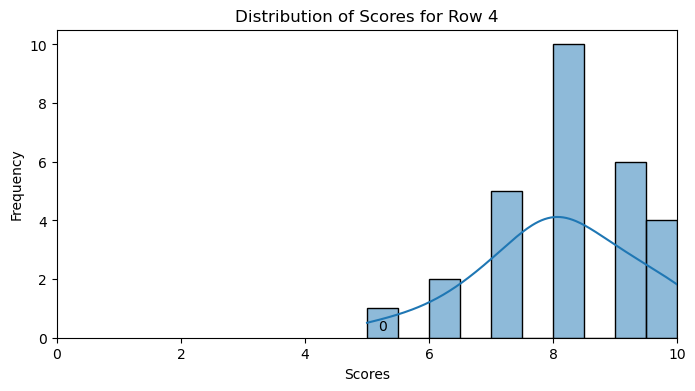

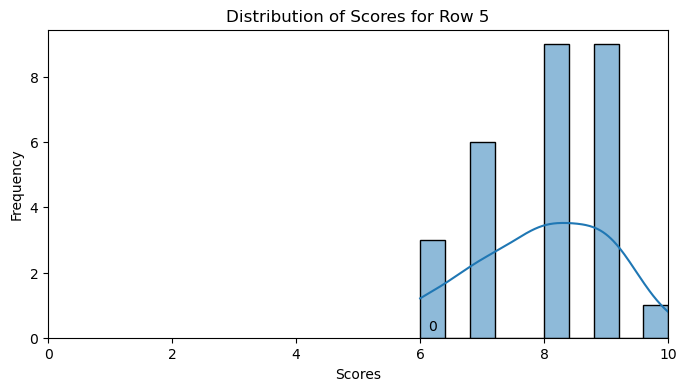

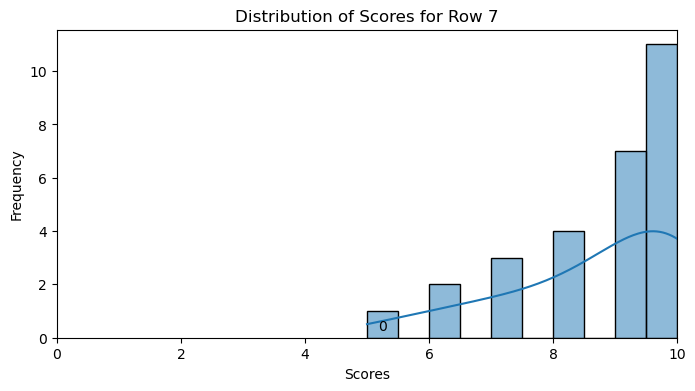

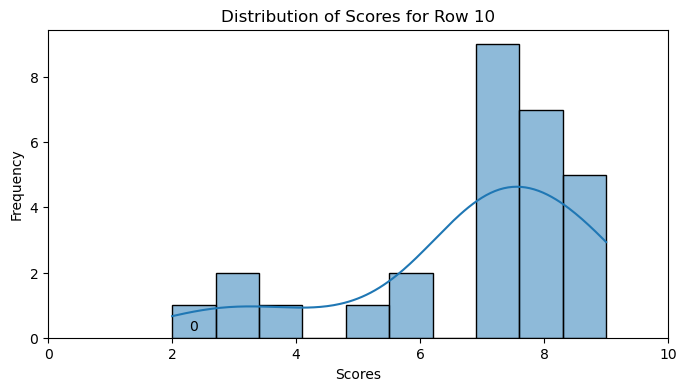

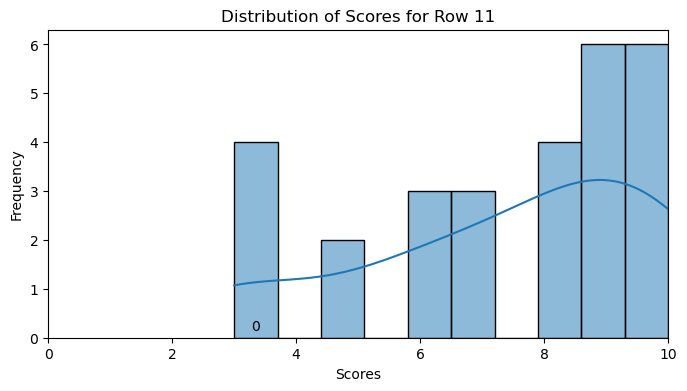

...

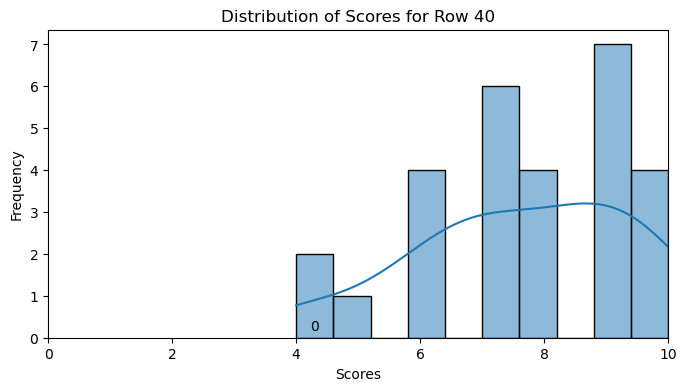

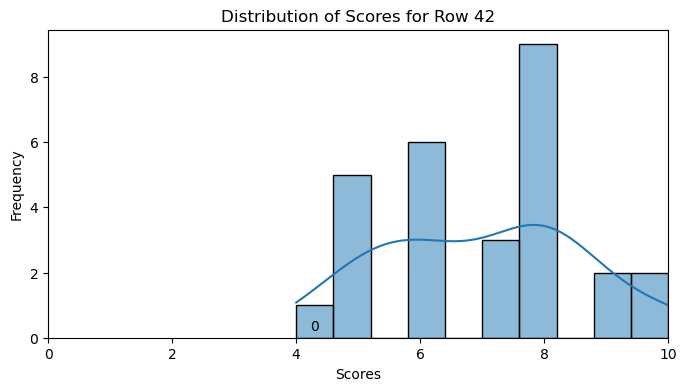

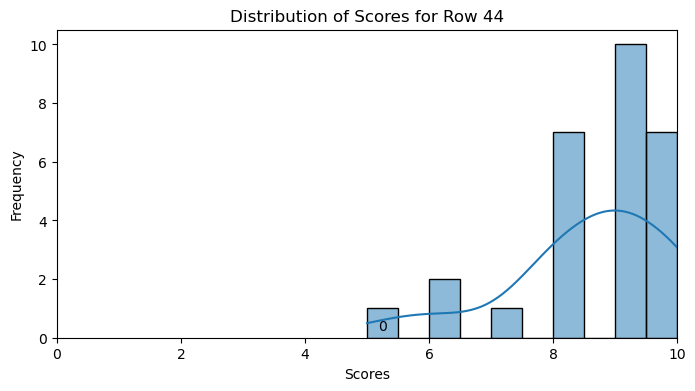

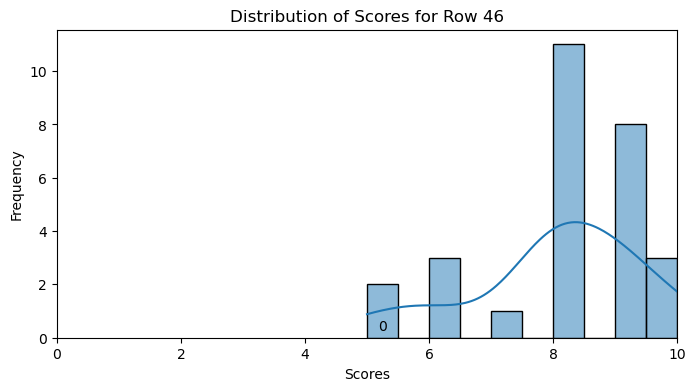

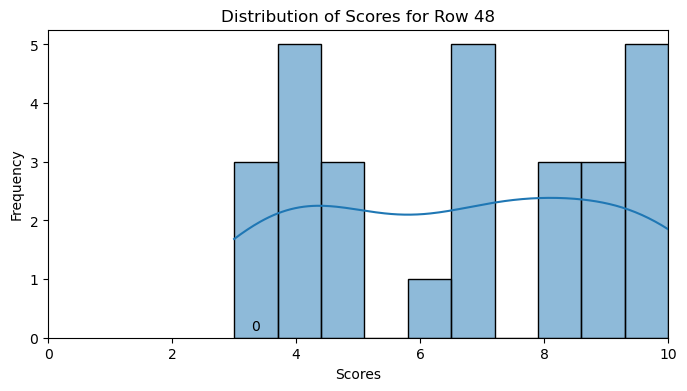

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
a = cl_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre', 'ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre', 'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',  'nex_C_feit', 'nex_C_rele' , 'nex_C_vloe', 'nex_C_spre', 'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre', 'nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']]


# Loop through each row in the DataFrame
for index, row in a.iterrows():
    plt.figure(figsize=(8, 4))  # Set the figure size
    ax = sns.histplot(row, kde=True, bins=10)   # Create a histogram with a kernel density estimate
    plt.title(f'Distribution of Scores for Row {index + 1}')
    plt.xlabel('Scores')
    plt.ylabel('Frequency')
    
    
    ax.set_xlim(0, 10)
    
    
    # Calculate the bin widths
    bin_width = (row.max() - row.min()) / 10
    
    # Calculate the bin centers
    bin_centers = [row.min() + i * bin_width + bin_width / 2 for i in range(10)]
    
    # Add labels at the midpoint of each bin, skipping bins with NaN values
    for count, x in zip(ax.containers[0], bin_centers):
        height = int(count.get_height()) if not np.isnan(count.get_height()) else 0
        ax.annotate(str(height), xy=(x, height), xytext=(0, 5),
                    textcoords='offset points', ha='center', fontsize=10)
        
        
    plt.show()
    

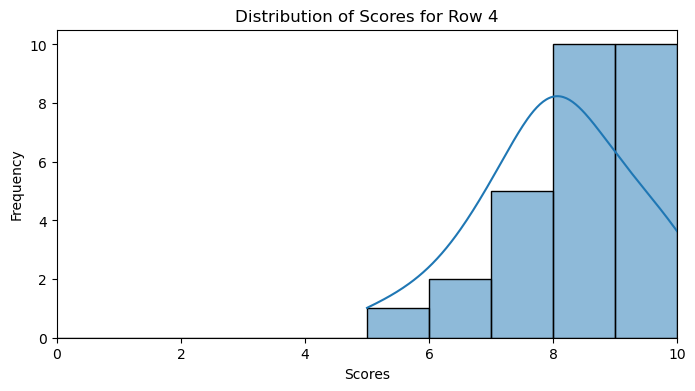

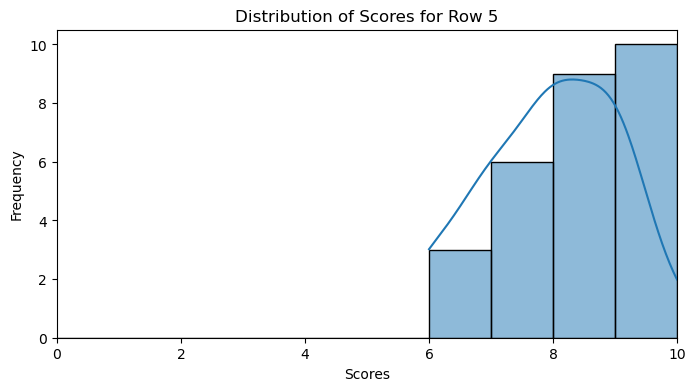

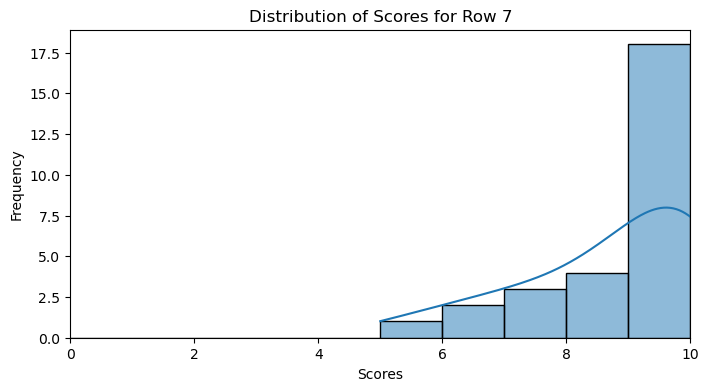

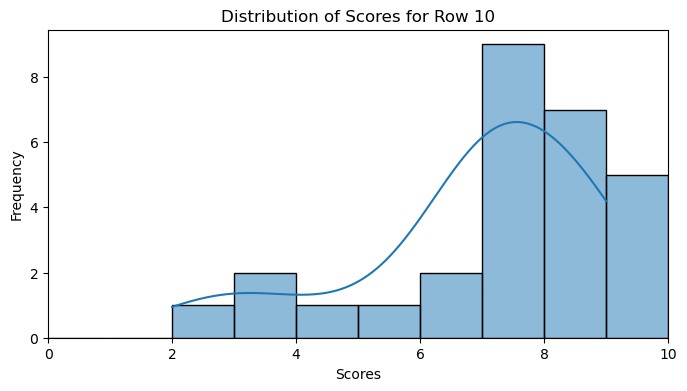

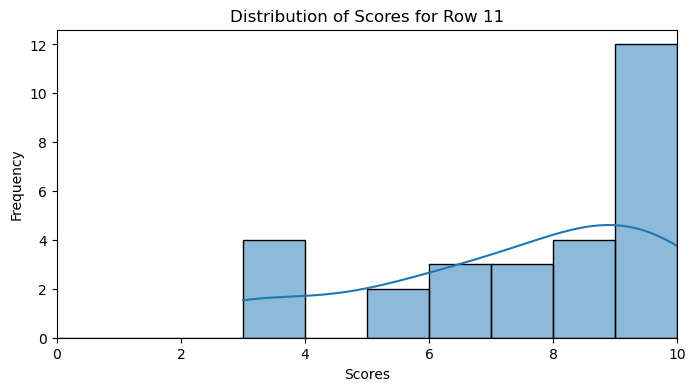

...

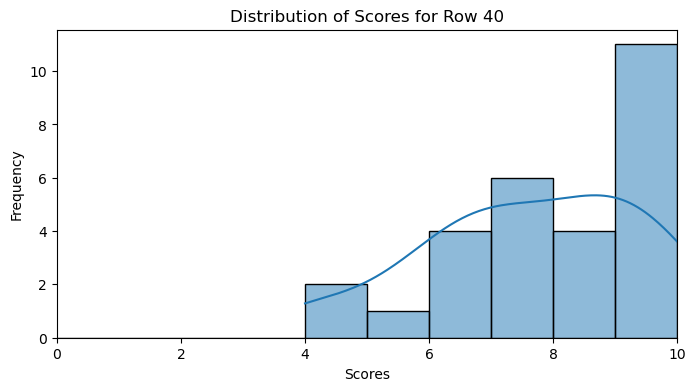

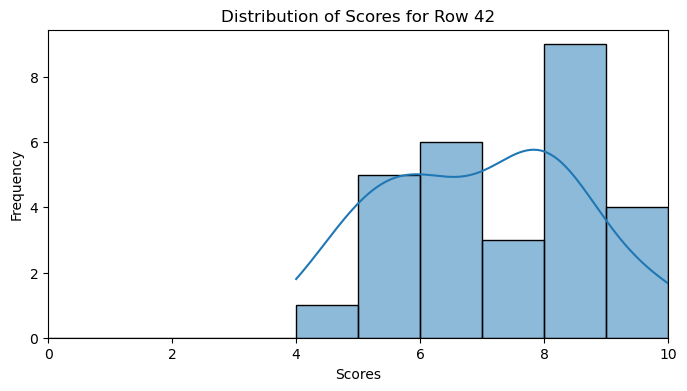

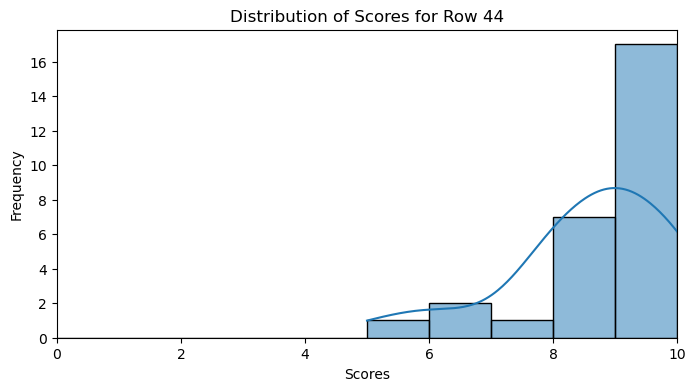

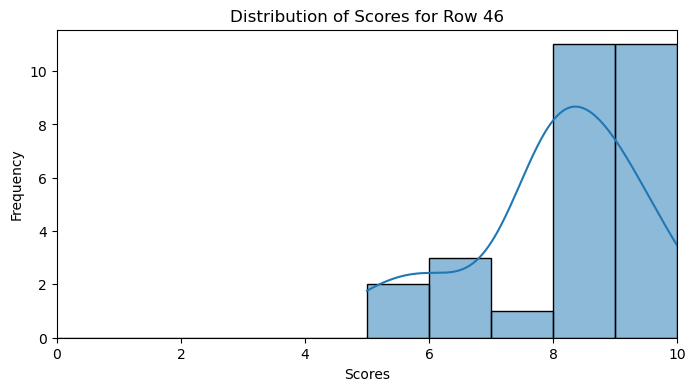

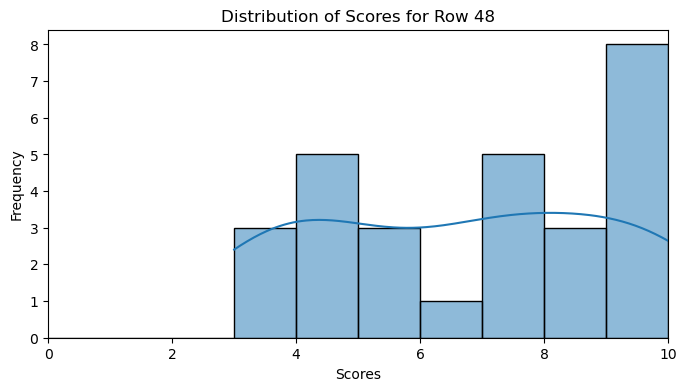

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
a = cl_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre', 'ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre', 'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',  'nex_C_feit', 'nex_C_rele' , 'nex_C_vloe', 'nex_C_spre', 'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre', 'nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']]


for index, row in a.iterrows():
    plt.figure(figsize=(8, 4))  # Set the figure size
    
    ax = sns.histplot(row, kde=True, bins=10, binrange=(0, 10))  # Specify binrange
    plt.title(f'Distribution of Scores for Row {index + 1}')
    plt.xlabel('Scores')
    plt.ylabel('Frequency')
    
    # Set the x-axis limits to range from 0 to 10
    ax.set_xlim(0, 10)
    

    
    plt.show()

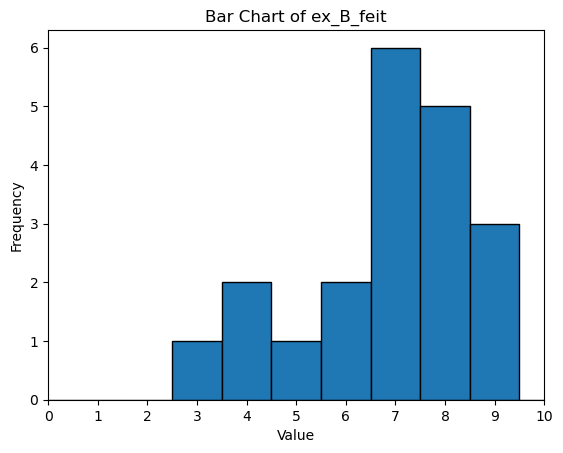

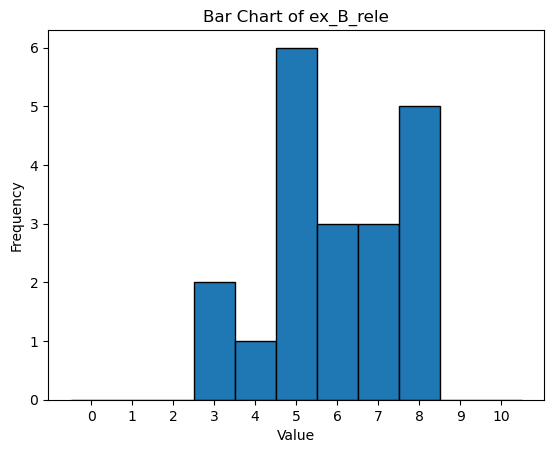

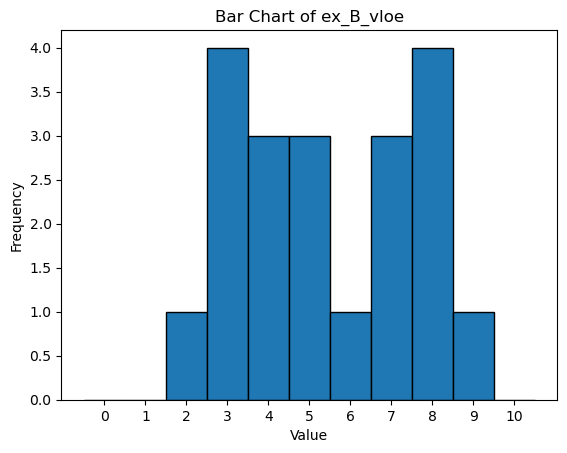

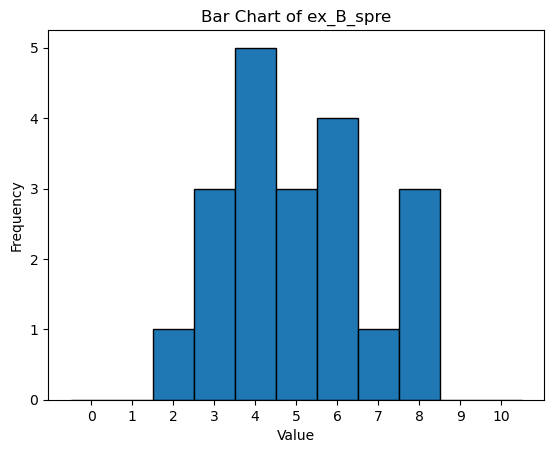

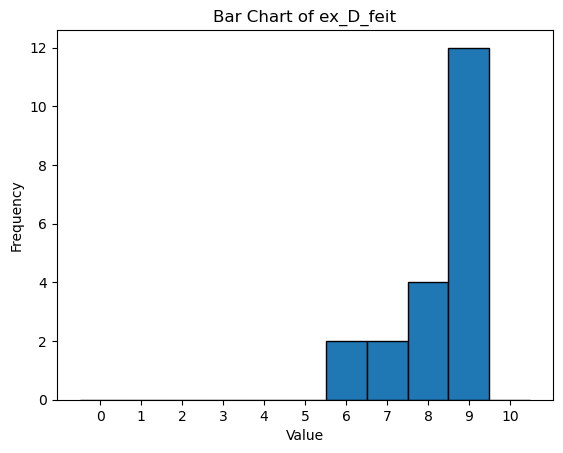

...

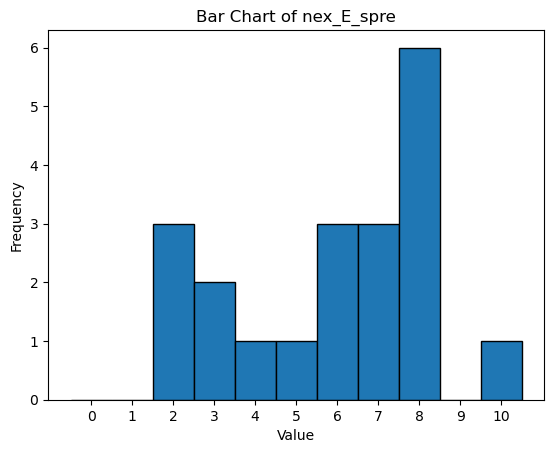

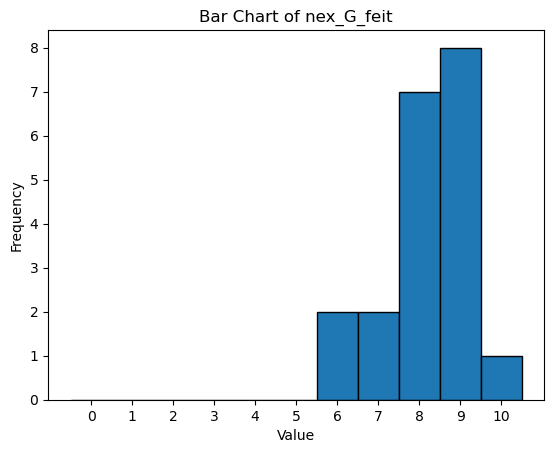

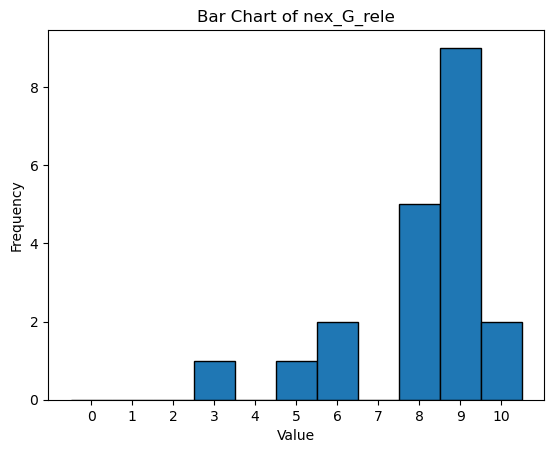

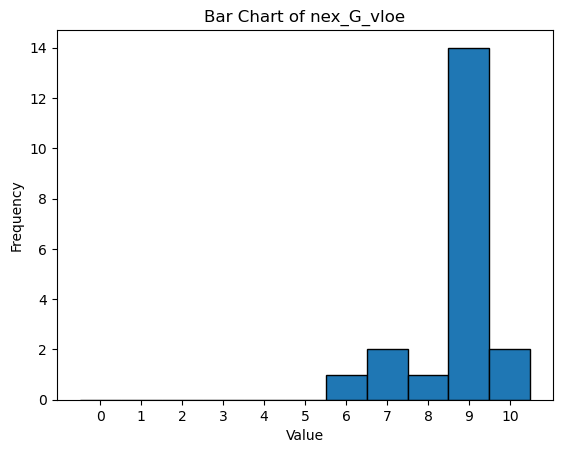

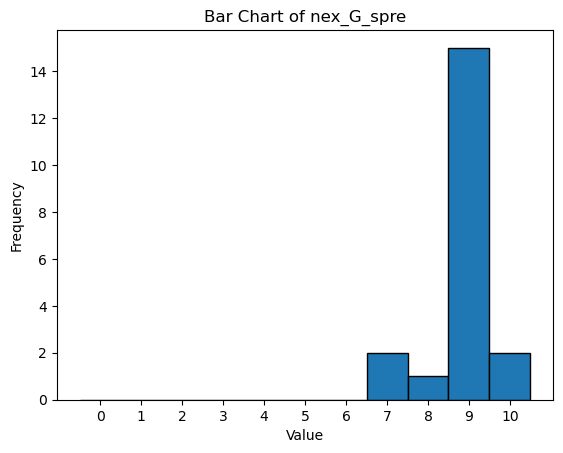

In [73]:
plt.xlim(0, 10)

# Loop through each column (each participant) in the DataFrame
for column in a.columns:
    # Calculate histogram data
    
    
    counts, bins = np.histogram(a[column], bins=range(12), density=False)
    plt.bar(np.arange(11), counts, align='center', width=1.0, edgecolor='black')

    plt.title(f'Bar Chart of {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.xticks(np.arange(11))  # Set x-axis ticks from 0 to 11
    plt.grid(False)
    

    plt.show()

# This is the correct one: Deze kan ik denk ik gewoon zo gebruiken want hierin zit dan verschil tussen participanten en t zijn losse radioberichten

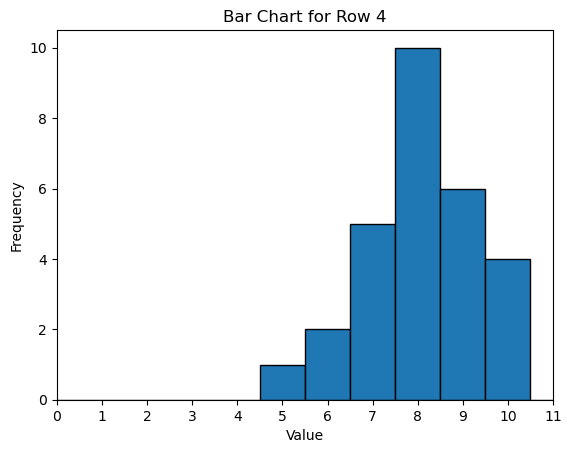

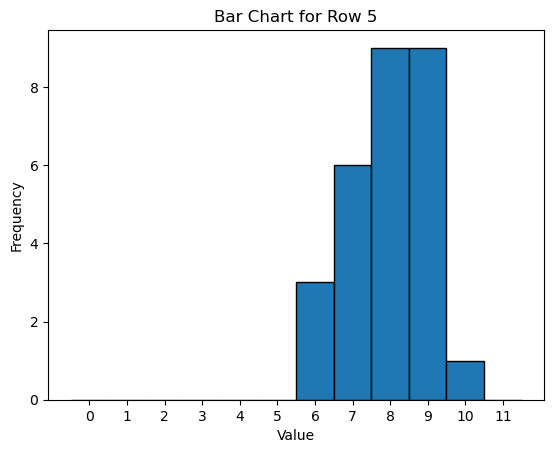

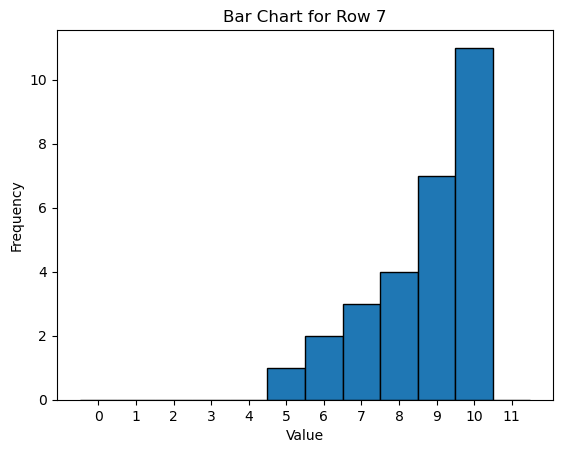

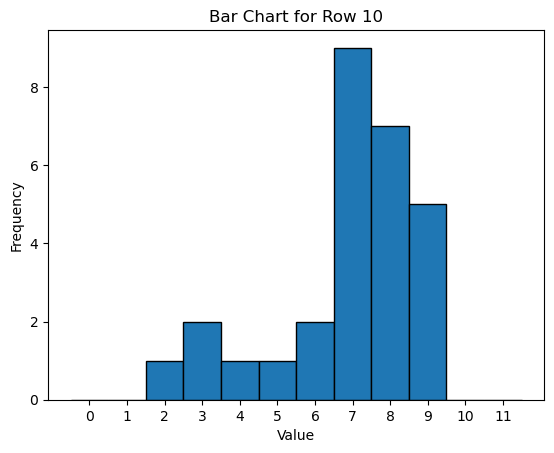

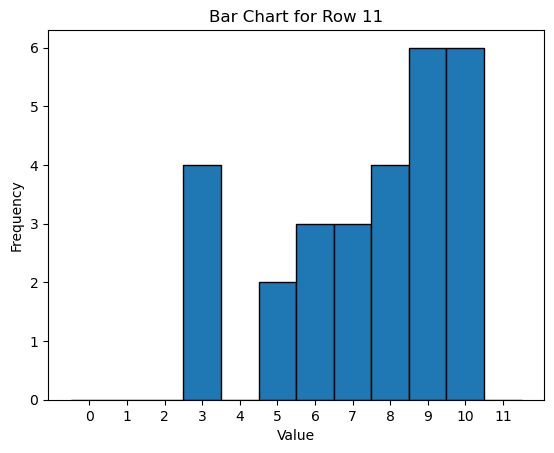

...

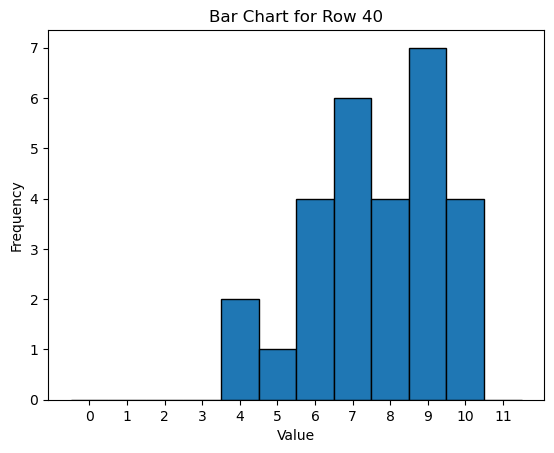

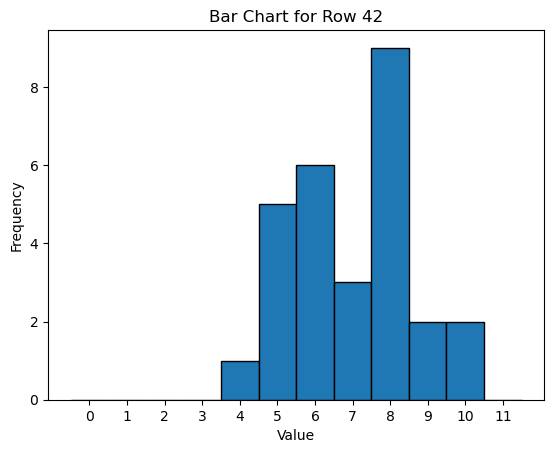

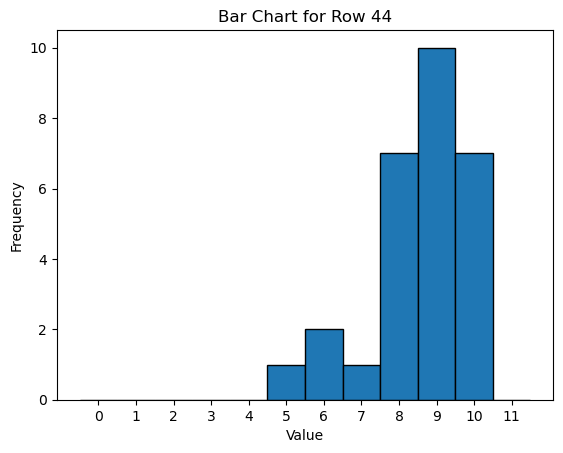

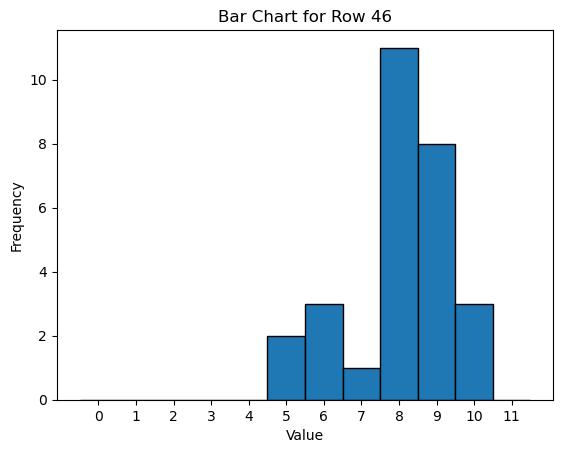

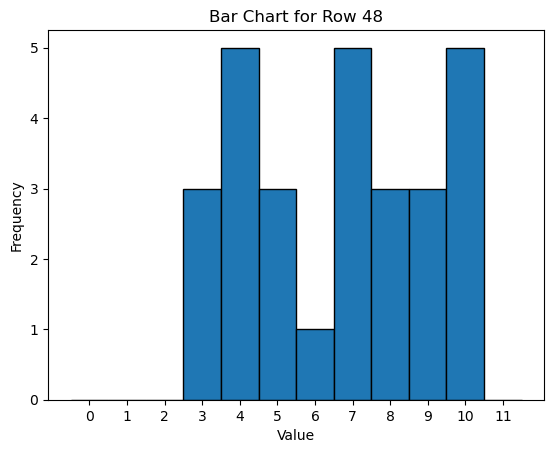

In [75]:
# Set up the x-axis to be fixed from 0 to 11
plt.xlim(0, 11)

# Loop through each row in the DataFrame
for index, row in a.iterrows():
    # Calculate histogram data
    counts, bins = np.histogram(row, bins=range(13), density=False)

    # Create the bar chart with centered bars
    plt.bar(np.arange(12), counts, align='center', width=1.0, edgecolor='black')

    plt.title(f'Bar Chart for Row {index + 1}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.xticks(np.arange(12))  # Set x-axis ticks from 0 to 11
    
    # Disable grid lines
    plt.grid(False)
    
    plt.show()



# These are the final plots

## filter first on factual/ eval aspects. Then on bad - worst

In [ ]:
# Try out Factual correctness
fact_mean_bad_found = 
fact_mean_overall =






ex_B_feit      9.0
ex_B_rele      8.0
ex_B_vloe      8.0
ex_B_spre      7.0
ex_D_feit      6.0
ex_D_rele      8.0
ex_D_vloe      8.0
ex_D_spre      8.0
ex_F_feit      9.0
ex_F_rele     10.0
ex_F_vloe      7.0
ex_F_spre      7.0
nex_A_feit     8.0
nex_A_rele     9.0
nex_A_vloe     9.0
nex_A_spre     9.0
nex_C_feit     8.0
nex_C_rele     8.0
nex_C_vloe     8.0
nex_C_spre     8.0
nex_E_feit     5.0
nex_E_rele     7.0
nex_E_vloe     6.0
nex_E_spre     7.0
nex_G_feit    10.0
nex_G_rele    10.0
nex_G_vloe    10.0
nex_G_spre     9.0
Name: 3, dtype: float64
[ 0  0  0  0  0  1  2  5 10  6  4  0]


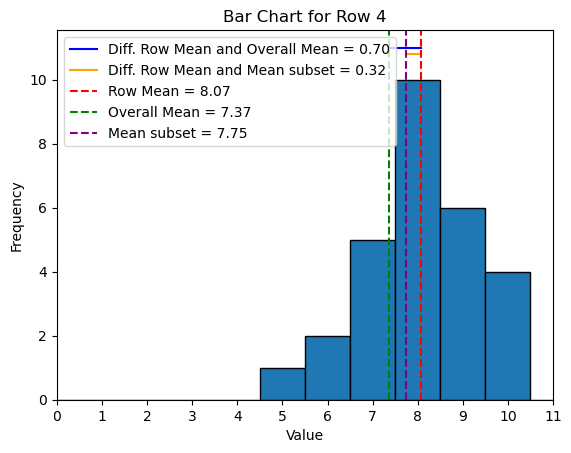

ex_B_feit      8.0
ex_B_rele      7.0
ex_B_vloe      7.0
ex_B_spre      6.0
ex_D_feit      9.0
ex_D_rele      8.0
ex_D_vloe      6.0
ex_D_spre      7.0
ex_F_feit      6.0
ex_F_rele      8.0
ex_F_vloe      7.0
ex_F_spre      7.0
nex_A_feit    10.0
nex_A_rele     9.0
nex_A_vloe     9.0
nex_A_spre     9.0
nex_C_feit     9.0
nex_C_rele     9.0
nex_C_vloe     8.0
nex_C_spre     8.0
nex_E_feit     8.0
nex_E_rele     8.0
nex_E_vloe     8.0
nex_E_spre     7.0
nex_G_feit     8.0
nex_G_rele     9.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 4, dtype: float64
[0 0 0 0 0 0 3 6 9 9 1 0]


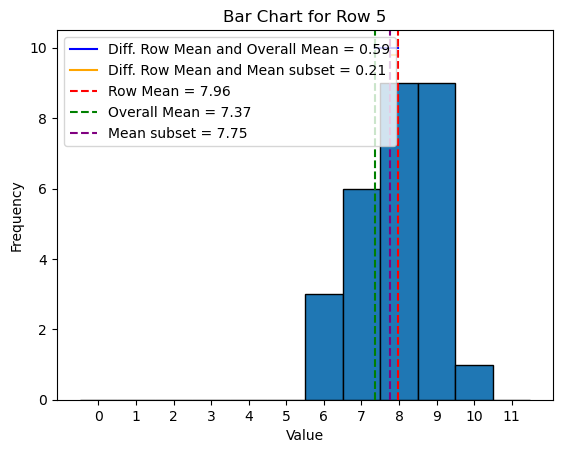

ex_B_feit      8.0
ex_B_rele      7.0
ex_B_vloe      5.0
ex_B_spre      6.0
ex_D_feit      8.0
ex_D_rele      7.0
ex_D_vloe      6.0
ex_D_spre      7.0
ex_F_feit     10.0
ex_F_rele     10.0
ex_F_vloe     10.0
ex_F_spre     10.0
nex_A_feit    10.0
nex_A_rele     9.0
nex_A_vloe     9.0
nex_A_spre     9.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     9.0
nex_C_spre     9.0
nex_E_feit    10.0
nex_E_rele    10.0
nex_E_vloe    10.0
nex_E_spre    10.0
nex_G_feit     8.0
nex_G_rele     8.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 6, dtype: float64
[ 0  0  0  0  0  1  2  3  4  7 11  0]


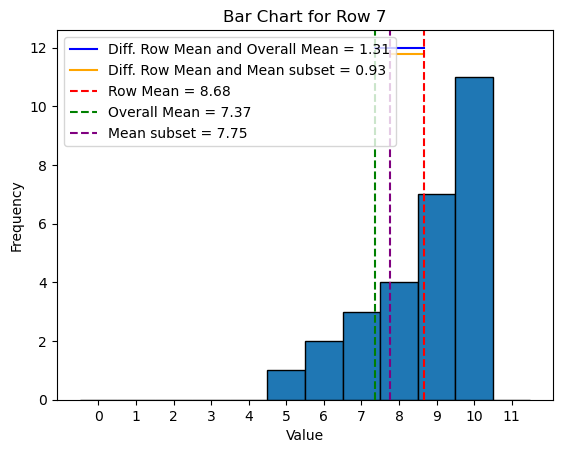

ex_B_feit     7.0
ex_B_rele     5.0
ex_B_vloe     3.0
ex_B_spre     2.0
ex_D_feit     9.0
ex_D_rele     7.0
ex_D_vloe     7.0
ex_D_spre     8.0
ex_F_feit     8.0
ex_F_rele     9.0
ex_F_vloe     9.0
ex_F_spre     9.0
nex_A_feit    8.0
nex_A_rele    6.0
nex_A_vloe    8.0
nex_A_spre    7.0
nex_C_feit    7.0
nex_C_rele    4.0
nex_C_vloe    3.0
nex_C_spre    7.0
nex_E_feit    8.0
nex_E_rele    8.0
nex_E_vloe    9.0
nex_E_spre    8.0
nex_G_feit    7.0
nex_G_rele    6.0
nex_G_vloe    7.0
nex_G_spre    7.0
Name: 9, dtype: float64
[0 0 1 2 1 1 2 9 7 5 0 0]


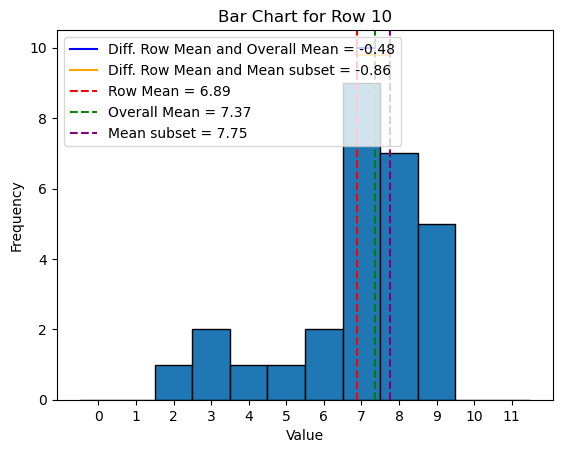

ex_B_feit      9.0
ex_B_rele      5.0
ex_B_vloe      3.0
ex_B_spre      3.0
ex_D_feit      8.0
ex_D_rele      8.0
ex_D_vloe      6.0
ex_D_spre      7.0
ex_F_feit     10.0
ex_F_rele     10.0
ex_F_vloe     10.0
ex_F_spre     10.0
nex_A_feit     8.0
nex_A_rele     7.0
nex_A_vloe     6.0
nex_A_spre     6.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     3.0
nex_C_spre     3.0
nex_E_feit     9.0
nex_E_rele     9.0
nex_E_vloe     7.0
nex_E_spre     5.0
nex_G_feit     8.0
nex_G_rele     9.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 10, dtype: float64
[0 0 0 4 0 2 3 3 4 6 6 0]


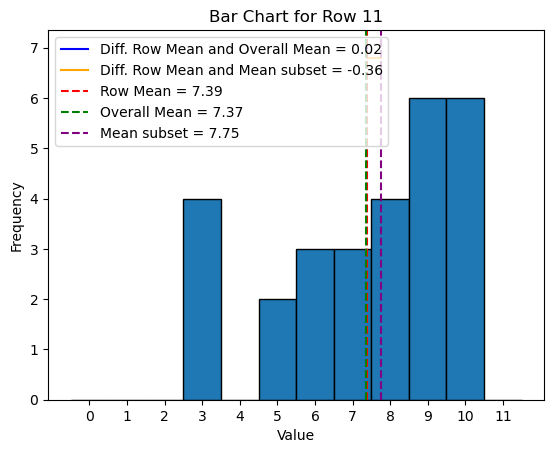

ex_B_feit      4.0
ex_B_rele      8.0
ex_B_vloe      9.0
ex_B_spre      8.0
ex_D_feit      6.0
ex_D_rele      8.0
ex_D_vloe      7.0
ex_D_spre      8.0
ex_F_feit      3.0
ex_F_rele      5.0
ex_F_vloe      3.0
ex_F_spre      5.0
nex_A_feit     9.0
nex_A_rele     8.0
nex_A_vloe     9.0
nex_A_spre     9.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     7.0
nex_C_spre     7.0
nex_E_feit     8.0
nex_E_rele     9.0
nex_E_vloe     7.0
nex_E_spre     8.0
nex_G_feit     7.0
nex_G_rele     8.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 11, dtype: float64
[0 0 0 2 1 2 1 5 8 7 2 0]


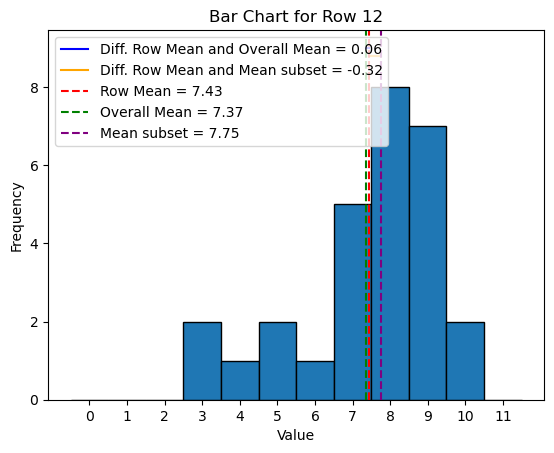

ex_B_feit     8.0
ex_B_rele     3.0
ex_B_vloe     4.0
ex_B_spre     4.0
ex_D_feit     9.0
ex_D_rele     8.0
ex_D_vloe     8.0
ex_D_spre     9.0
ex_F_feit     3.0
ex_F_rele     6.0
ex_F_vloe     8.0
ex_F_spre     5.0
nex_A_feit    8.0
nex_A_rele    8.0
nex_A_vloe    8.0
nex_A_spre    9.0
nex_C_feit    8.0
nex_C_rele    8.0
nex_C_vloe    7.0
nex_C_spre    8.0
nex_E_feit    8.0
nex_E_rele    9.0
nex_E_vloe    9.0
nex_E_spre    8.0
nex_G_feit    9.0
nex_G_rele    9.0
nex_G_vloe    9.0
nex_G_spre    9.0
Name: 17, dtype: float64
[ 0  0  0  2  2  1  1  1 12  9  0  0]


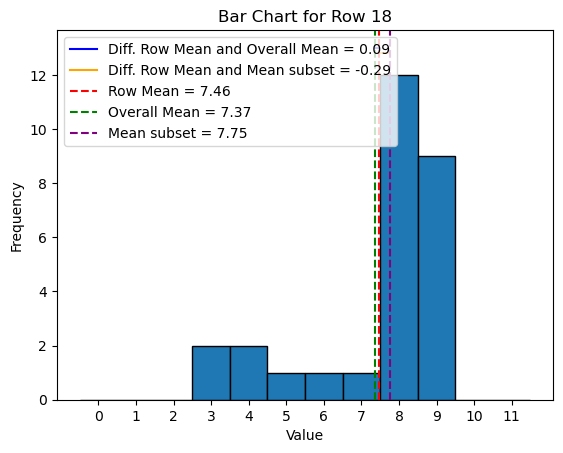

ex_B_feit      3.0
ex_B_rele      3.0
ex_B_vloe      5.0
ex_B_spre      4.0
ex_D_feit      9.0
ex_D_rele      8.0
ex_D_vloe      9.0
ex_D_spre      9.0
ex_F_feit     10.0
ex_F_rele     10.0
ex_F_vloe      7.0
ex_F_spre      8.0
nex_A_feit     9.0
nex_A_rele     2.0
nex_A_vloe     7.0
nex_A_spre     5.0
nex_C_feit    10.0
nex_C_rele     3.0
nex_C_vloe     8.0
nex_C_spre    10.0
nex_E_feit     2.0
nex_E_rele     2.0
nex_E_vloe     2.0
nex_E_spre     2.0
nex_G_feit     8.0
nex_G_rele     3.0
nex_G_vloe     8.0
nex_G_spre     8.0
Name: 19, dtype: float64
[0 0 5 4 1 2 0 2 6 4 4 0]


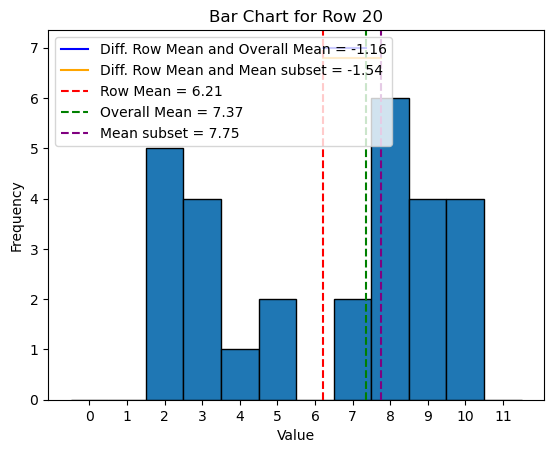

ex_B_feit      9.0
ex_B_rele      7.0
ex_B_vloe      8.0
ex_B_spre      8.0
ex_D_feit      9.0
ex_D_rele      9.0
ex_D_vloe      9.0
ex_D_spre      9.0
ex_F_feit     10.0
ex_F_rele      8.0
ex_F_vloe      9.0
ex_F_spre      8.0
nex_A_feit     9.0
nex_A_rele     8.0
nex_A_vloe     6.0
nex_A_spre     5.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe    10.0
nex_C_spre    10.0
nex_E_feit     9.0
nex_E_rele     7.0
nex_E_vloe     7.0
nex_E_spre     6.0
nex_G_feit     9.0
nex_G_rele     9.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 20, dtype: float64
[ 0  0  0  0  0  1  2  3  5 12  5  0]


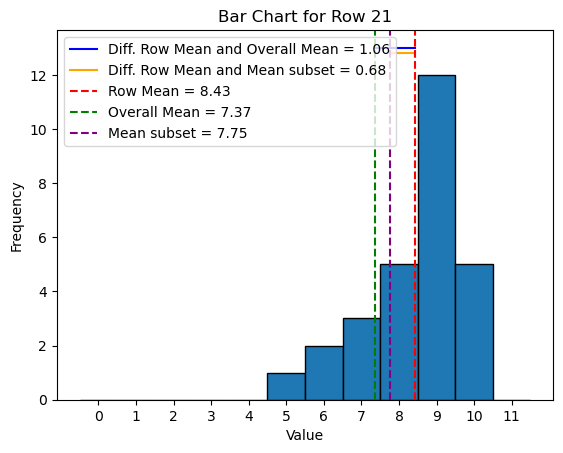

ex_B_feit      4.0
ex_B_rele      8.0
ex_B_vloe      7.0
ex_B_spre      6.0
ex_D_feit      9.0
ex_D_rele      9.0
ex_D_vloe      9.0
ex_D_spre      7.0
ex_F_feit     10.0
ex_F_rele     10.0
ex_F_vloe      6.0
ex_F_spre      5.0
nex_A_feit    10.0
nex_A_rele     2.0
nex_A_vloe     4.0
nex_A_spre     6.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     2.0
nex_C_spre     9.0
nex_E_feit     2.0
nex_E_rele     2.0
nex_E_vloe     2.0
nex_E_spre     2.0
nex_G_feit     9.0
nex_G_rele     9.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 22, dtype: float64
[0 0 6 0 2 1 3 2 1 8 5 0]


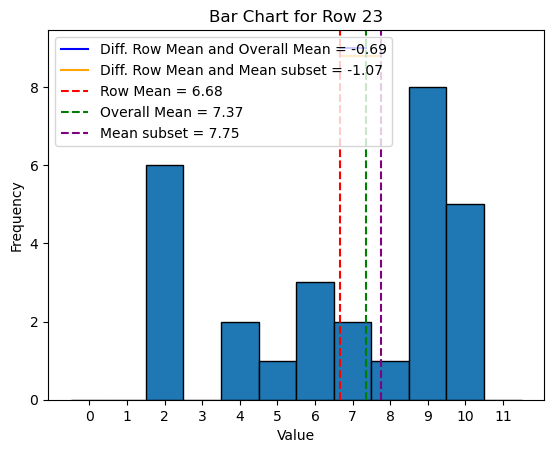

ex_B_feit      7.0
ex_B_rele      8.0
ex_B_vloe      8.0
ex_B_spre      6.0
ex_D_feit      8.0
ex_D_rele      9.0
ex_D_vloe      9.0
ex_D_spre      9.0
ex_F_feit     10.0
ex_F_rele     10.0
ex_F_vloe     10.0
ex_F_spre     10.0
nex_A_feit     9.0
nex_A_rele     7.0
nex_A_vloe     8.0
nex_A_spre     9.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     9.0
nex_C_spre    10.0
nex_E_feit     9.0
nex_E_rele     7.0
nex_E_vloe     7.0
nex_E_spre     6.0
nex_G_feit     8.0
nex_G_rele     9.0
nex_G_vloe    10.0
nex_G_spre     9.0
Name: 25, dtype: float64
[0 0 0 0 0 0 2 4 5 9 8 0]


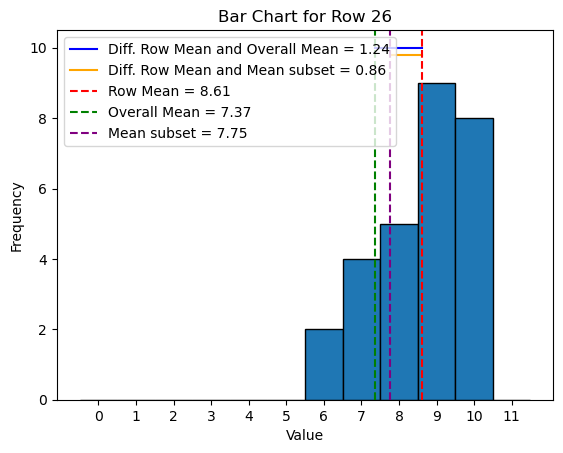

ex_B_feit      7.0
ex_B_rele      6.0
ex_B_vloe      4.0
ex_B_spre      4.0
ex_D_feit      9.0
ex_D_rele      8.0
ex_D_vloe      6.0
ex_D_spre      8.0
ex_F_feit      9.0
ex_F_rele     10.0
ex_F_vloe      8.0
ex_F_spre      9.0
nex_A_feit     9.0
nex_A_rele     9.0
nex_A_vloe     5.0
nex_A_spre     7.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     7.0
nex_C_spre     7.0
nex_E_feit     8.0
nex_E_rele     6.0
nex_E_vloe     4.0
nex_E_spre     3.0
nex_G_feit     9.0
nex_G_rele     9.0
nex_G_vloe     6.0
nex_G_spre     7.0
Name: 28, dtype: float64
[0 0 0 1 3 1 4 5 4 7 3 0]


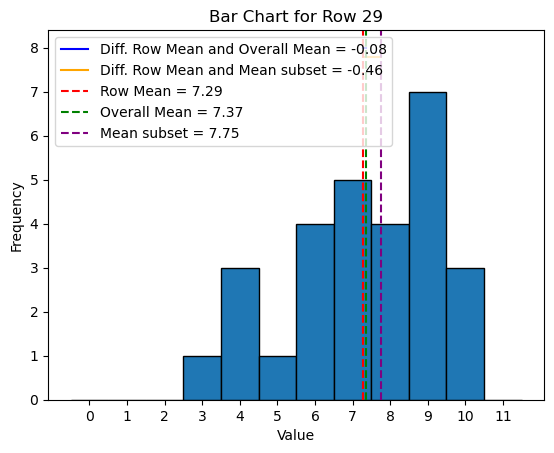

ex_B_feit      8.0
ex_B_rele      5.0
ex_B_vloe      3.0
ex_B_spre      4.0
ex_D_feit      9.0
ex_D_rele      9.0
ex_D_vloe      8.0
ex_D_spre      8.0
ex_F_feit     10.0
ex_F_rele     10.0
ex_F_vloe      5.0
ex_F_spre      6.0
nex_A_feit     9.0
nex_A_rele     9.0
nex_A_vloe     9.0
nex_A_spre     7.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     8.0
nex_C_spre    10.0
nex_E_feit     7.0
nex_E_rele     9.0
nex_E_vloe     7.0
nex_E_spre     7.0
nex_G_feit     8.0
nex_G_rele     8.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 30, dtype: float64
[0 0 0 1 1 2 1 4 6 8 5 0]


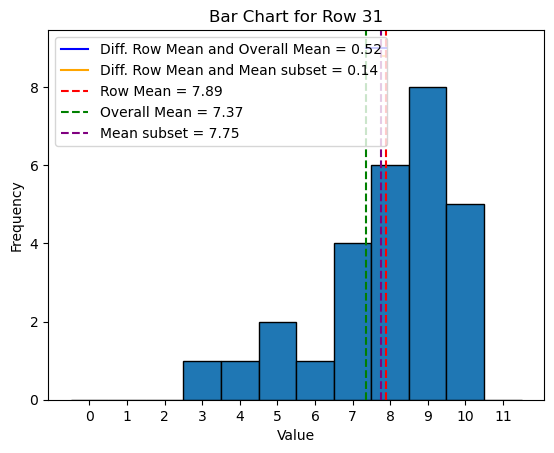

ex_B_feit     6.0
ex_B_rele     5.0
ex_B_vloe     2.0
ex_B_spre     3.0
ex_D_feit     9.0
ex_D_rele     8.0
ex_D_vloe     7.0
ex_D_spre     8.0
ex_F_feit     7.0
ex_F_rele     7.0
ex_F_vloe     9.0
ex_F_spre     6.0
nex_A_feit    9.0
nex_A_rele    9.0
nex_A_vloe    9.0
nex_A_spre    8.0
nex_C_feit    7.0
nex_C_rele    6.0
nex_C_vloe    1.0
nex_C_spre    3.0
nex_E_feit    8.0
nex_E_rele    8.0
nex_E_vloe    2.0
nex_E_spre    2.0
nex_G_feit    9.0
nex_G_rele    9.0
nex_G_vloe    9.0
nex_G_spre    9.0
Name: 33, dtype: float64
[0 1 3 2 0 1 3 4 5 9 0 0]


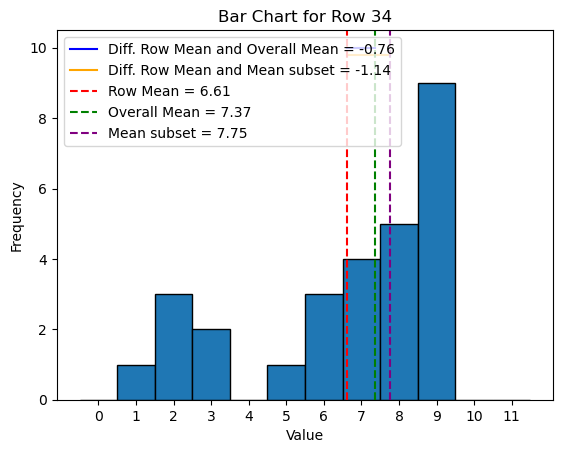

ex_B_feit      7.0
ex_B_rele      4.0
ex_B_vloe      3.0
ex_B_spre      4.0
ex_D_feit      8.0
ex_D_rele      7.0
ex_D_vloe      5.0
ex_D_spre      8.0
ex_F_feit     10.0
ex_F_rele      8.0
ex_F_vloe      6.0
ex_F_spre      4.0
nex_A_feit     8.0
nex_A_rele     7.0
nex_A_vloe     4.0
nex_A_spre     4.0
nex_C_feit     7.0
nex_C_rele     9.0
nex_C_vloe     4.0
nex_C_spre     8.0
nex_E_feit     9.0
nex_E_rele     6.0
nex_E_vloe     1.0
nex_E_spre     3.0
nex_G_feit     8.0
nex_G_rele     5.0
nex_G_vloe     7.0
nex_G_spre     9.0
Name: 37, dtype: float64
[0 1 0 2 6 2 2 5 6 3 1 0]


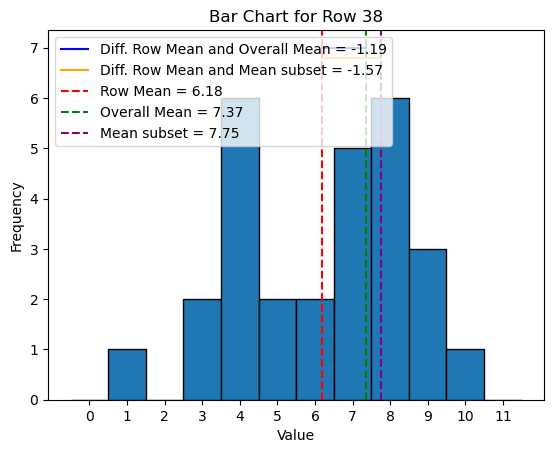

ex_B_feit      7.0
ex_B_rele      6.0
ex_B_vloe      7.0
ex_B_spre      5.0
ex_D_feit      9.0
ex_D_rele      8.0
ex_D_vloe      8.0
ex_D_spre      9.0
ex_F_feit      8.0
ex_F_rele      7.0
ex_F_vloe      6.0
ex_F_spre      7.0
nex_A_feit     9.0
nex_A_rele     7.0
nex_A_vloe     4.0
nex_A_spre     4.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe    10.0
nex_C_spre    10.0
nex_E_feit     9.0
nex_E_rele     9.0
nex_E_vloe     7.0
nex_E_spre     8.0
nex_G_feit     6.0
nex_G_rele     6.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 39, dtype: float64
[0 0 0 0 2 1 4 6 4 7 4 0]


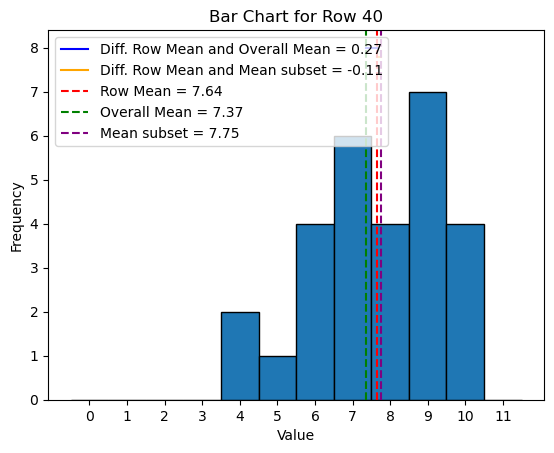

ex_B_feit      5.0
ex_B_rele      5.0
ex_B_vloe      5.0
ex_B_spre      5.0
ex_D_feit      7.0
ex_D_rele      8.0
ex_D_vloe      8.0
ex_D_spre      8.0
ex_F_feit      6.0
ex_F_rele      4.0
ex_F_vloe      6.0
ex_F_spre      5.0
nex_A_feit     8.0
nex_A_rele     7.0
nex_A_vloe     8.0
nex_A_spre     7.0
nex_C_feit    10.0
nex_C_rele     8.0
nex_C_vloe     6.0
nex_C_spre     8.0
nex_E_feit     9.0
nex_E_rele     8.0
nex_E_vloe     6.0
nex_E_spre     6.0
nex_G_feit     6.0
nex_G_rele     8.0
nex_G_vloe     9.0
nex_G_spre    10.0
Name: 41, dtype: float64
[0 0 0 0 1 5 6 3 9 2 2 0]


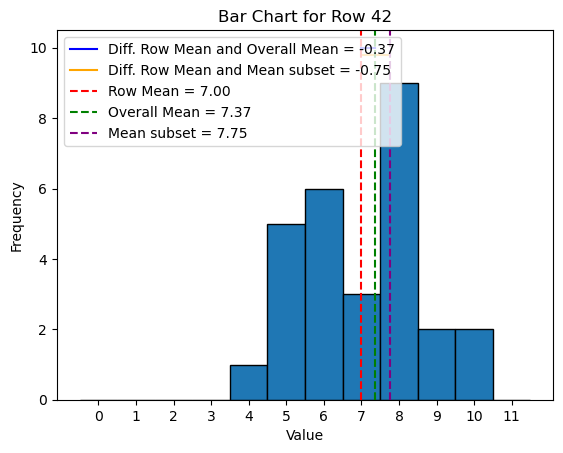

ex_B_feit      7.0
ex_B_rele      6.0
ex_B_vloe      6.0
ex_B_spre      5.0
ex_D_feit      9.0
ex_D_rele      8.0
ex_D_vloe      9.0
ex_D_spre      9.0
ex_F_feit     10.0
ex_F_rele      9.0
ex_F_vloe     10.0
ex_F_spre     10.0
nex_A_feit     9.0
nex_A_rele     9.0
nex_A_vloe     8.0
nex_A_spre     8.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe     8.0
nex_C_spre    10.0
nex_E_feit     8.0
nex_E_rele     9.0
nex_E_vloe     8.0
nex_E_spre     8.0
nex_G_feit     9.0
nex_G_rele    10.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 43, dtype: float64
[ 0  0  0  0  0  1  2  1  7 10  7  0]


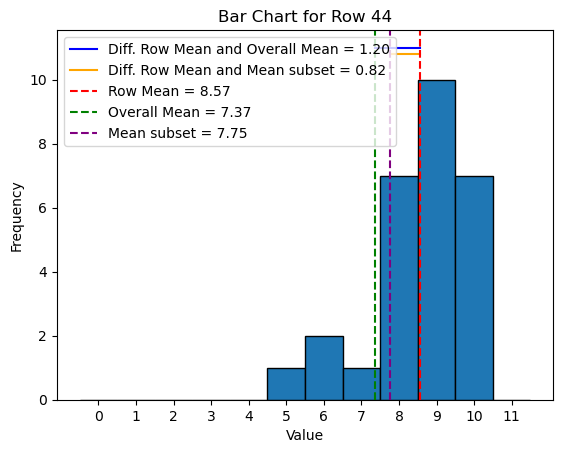

ex_B_feit      8.0
ex_B_rele      8.0
ex_B_vloe      8.0
ex_B_spre      8.0
ex_D_feit      9.0
ex_D_rele      9.0
ex_D_vloe      9.0
ex_D_spre      9.0
ex_F_feit     10.0
ex_F_rele      6.0
ex_F_vloe      9.0
ex_F_spre     10.0
nex_A_feit     8.0
nex_A_rele     7.0
nex_A_vloe     6.0
nex_A_spre     5.0
nex_C_feit     6.0
nex_C_rele     8.0
nex_C_vloe     5.0
nex_C_spre     8.0
nex_E_feit     8.0
nex_E_rele     8.0
nex_E_vloe     8.0
nex_E_spre     8.0
nex_G_feit     9.0
nex_G_rele     9.0
nex_G_vloe     9.0
nex_G_spre    10.0
Name: 45, dtype: float64
[ 0  0  0  0  0  2  3  1 11  8  3  0]


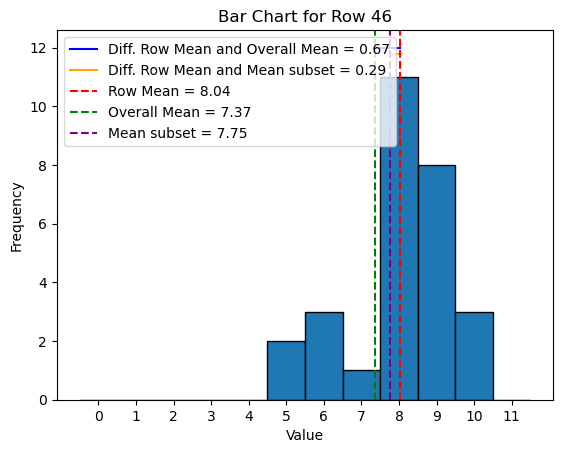

ex_B_feit      6.0
ex_B_rele      5.0
ex_B_vloe      4.0
ex_B_spre      3.0
ex_D_feit      7.0
ex_D_rele      7.0
ex_D_vloe      8.0
ex_D_spre      8.0
ex_F_feit     10.0
ex_F_rele      7.0
ex_F_vloe      5.0
ex_F_spre      4.0
nex_A_feit     7.0
nex_A_rele     7.0
nex_A_vloe     4.0
nex_A_spre     3.0
nex_C_feit    10.0
nex_C_rele    10.0
nex_C_vloe    10.0
nex_C_spre    10.0
nex_E_feit     3.0
nex_E_rele     5.0
nex_E_vloe     4.0
nex_E_spre     4.0
nex_G_feit     9.0
nex_G_rele     8.0
nex_G_vloe     9.0
nex_G_spre     9.0
Name: 47, dtype: float64
[0 0 0 3 5 3 1 5 3 3 5 0]


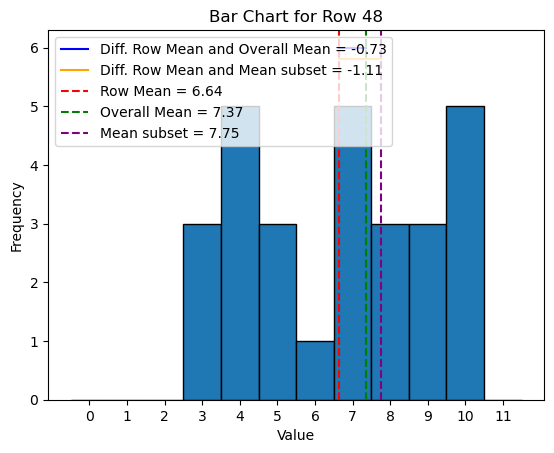

In [115]:
plt.xlim(0, 11)

# Define the overall mean of all radio messages
overall_mean = 7.37
# Define the "Mean subset" value
mean_subset = 7.75

for index, row in a.iterrows():
    print(row)
    # Calculate histogram data
    counts, bins = np.histogram(row, bins=range(13), density=False)
    print(counts)
    # Calculate the mean of the scores for the current row
    row_mean = np.mean(row)

    # Calculate the difference between the row mean and the overall mean
    mean_difference = row_mean - overall_mean
    # Create the bar chart with centered bars
    plt.bar(np.arange(12), counts, align='center', width=1.0, edgecolor='black')

    # Calculate the vertical position for the horizontal lines closer to the top
    y_position = max(counts) + 1

    # Add a blue horizontal line directly connecting the row mean and overall mean
    plt.plot([row_mean, overall_mean], [y_position, y_position], color='blue', linestyle='-', label=f'Diff. Row Mean and Overall Mean = {mean_difference:.2f}')

    # Add an orange horizontal line directly connecting the row mean and "Mean subset"
    plt.plot([row_mean, mean_subset], [y_position - 0.2, y_position - 0.2], color='orange', linestyle='-', label=f'Diff. Row Mean and Mean subset = {row_mean - mean_subset:.2f}')

    # Add a vertical line to highlight the row's mean value
    plt.axvline(x=row_mean, color='red', linestyle='--', label=f'Row Mean = {row_mean:.2f}')

    # Add a vertical line to highlight the overall mean
    plt.axvline(x=overall_mean, color='green', linestyle='--', label=f'Overall Mean = {overall_mean:.2f}')

    # Add a vertical line to represent the "Mean subset"
    plt.axvline(x=mean_subset, color='purple', linestyle='--', label=f'Mean subset = {mean_subset:.2f}')

    plt.title(f'Bar Chart for Row {index + 1}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.xticks(np.arange(12))  # Set x-axis ticks from 0 to 11
    
    # Add a legend to label the mean and difference lines
    plt.legend(loc='upper left')
    
    # Disable grid lines
    plt.grid(False)
    
    plt.show()




# This beneath not good

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [17]:
# Subset cl and feit
cl_feit = cl_subset[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
cl_feit

,ex_B_feit,ex_D_feit,ex_F_feit,nex_A_feit,nex_C_feit,nex_E_feit,nex_G_feit
3,9,6,9.0,8,8.0,5,10
4,8,9,6.0,10,9.0,8,8
6,8,8,10.0,10,10.0,10,8
9,7,9,8.0,8,7.0,8,7
10,9,8,10.0,8,10.0,9,8
11,4,6,3.0,9,10.0,8,7
17,8,9,3.0,8,8.0,8,9
19,3,9,10.0,9,10.0,2,8
20,9,9,10.0,9,10.0,9,9
22,4,9,10.0,10,10.0,2,9


In [58]:
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
cl_worst_subset = cl_filter_worst[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]

In [57]:
print(cl_filter_worst)

    NA_index llm     rm_i RM_without_number      RM_with_number  bertscore   
3          0  cl  cl_rm_6  NA_0_cl_rm_worst  NA_0_cl_rm_6_worst   0.710027  \
6          1  cl  cl_rm_4  NA_1_cl_rm_worst  NA_1_cl_rm_4_worst   0.723601   
10         2  cl  cl_rm_4  NA_2_cl_rm_worst  NA_2_cl_rm_4_worst   0.764811   
19         3  cl  cl_rm_3  NA_3_cl_rm_worst  NA_3_cl_rm_3_worst   0.637594   
22         4  cl  cl_rm_5  NA_4_cl_rm_worst  NA_4_cl_rm_5_worst   0.698703   
25         5  cl  cl_rm_6  NA_5_cl_rm_worst  NA_5_cl_rm_6_worst   0.750923   
33         6  cl  cl_rm_6  NA_6_cl_rm_worst  NA_6_cl_rm_6_worst   0.739687   
39         7  cl  cl_rm_6  NA_7_cl_rm_worst  NA_7_cl_rm_6_worst   0.719504   
41         8  cl  cl_rm_2  NA_8_cl_rm_worst  NA_8_cl_rm_2_worst   0.718601   
45         9  cl  cl_rm_3  NA_9_cl_rm_worst  NA_9_cl_rm_3_worst   0.714566   

    feit_M  vloe_M  rele_M  spre_M  ...  nex_HM_vloe  nex_HM_rele   
3     93.0    64.6    77.0    80.0  ...         8.25         8.50  \
6  

In [99]:
participant_colors = {
    'P1': 'red',
    'P2': 'blue',
    'P3': 'green',
    'P4': 'purple',
    'P5': 'orange',
    'P6': 'cyan',
    'P7': 'magenta',
    'P8': 'yellow',
    'P9': 'brown',
    'P10': 'pink',
    'P11': 'lime',
    'P12': 'black',
    'P13': 'gray',
    'P14': 'olive',
    'P15': 'teal',
    'P16': 'navy',
    'P17': 'maroon',
    'P18': 'coral',
    'P19': 'indigo',
    'P20': 'turquoise',
}

# I am going to start with creating the compensated plots now

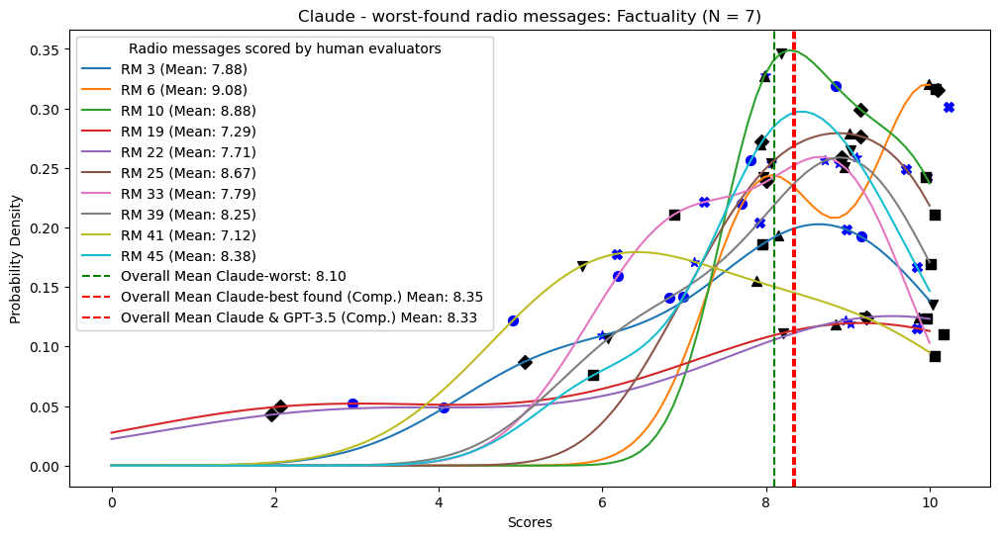

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
cl_worst_subset = cl_filter_worst[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]

list_of_sublists = cl_worst_subset.values.tolist()

# Calculate the mean of each row and add to the legend
mean_ex = np.mean(cl_worst_subset[['ex_B_feit', 'ex_D_feit', 'ex_F_feit']], axis=1)
mean_nex = np.mean(cl_worst_subset[['nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]



# means = np.mean(cl_worst_subset, axis=1)
# means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]})', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-worst: {mean_of_means:.2f}')
#plt.axvline(x= 7.86, color='turquoise', linestyle='--', label=f'Overall Mean Claude-worst found (Comp.): {7.86}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-best found': 8.35,
    'Overall Mean Claude & GPT-3.5': 8.33,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - worst-found radio messages: Factuality (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# Factuality : Claude best-found

# Inspect what to do with the second vertical line

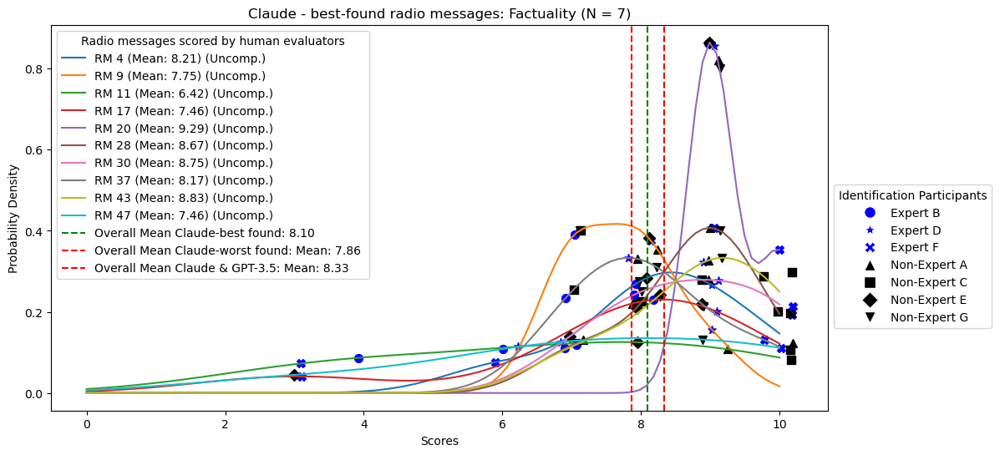

In [12]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


cl_filter_best = cl_subset[cl_subset['RM_without_number'].str.endswith("best")]
cl_best_subset = cl_filter_best[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
# Calculate the mean of each row and add to the legend

list_of_sublists = cl_best_subset.values.tolist()


# Calculate the mean of each row and add to the legend
mean_ex = np.mean(cl_best_subset[['ex_B_feit', 'ex_D_feit', 'ex_F_feit']], axis=1)
mean_nex = np.mean(cl_best_subset[['nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
#means = np.mean(cl_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-best found: {mean_of_means:.2f}')
#plt.axvline(x= 8.35, color='turquoise', linestyle='--', label=f'Overall Mean Claude-best found (Comp.): {8.35}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-worst found:': 7.86,
    'Overall Mean Claude & GPT-3.5:': 8.33,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - best-found radio messages: Factuality (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()


# Claude Relevance worst

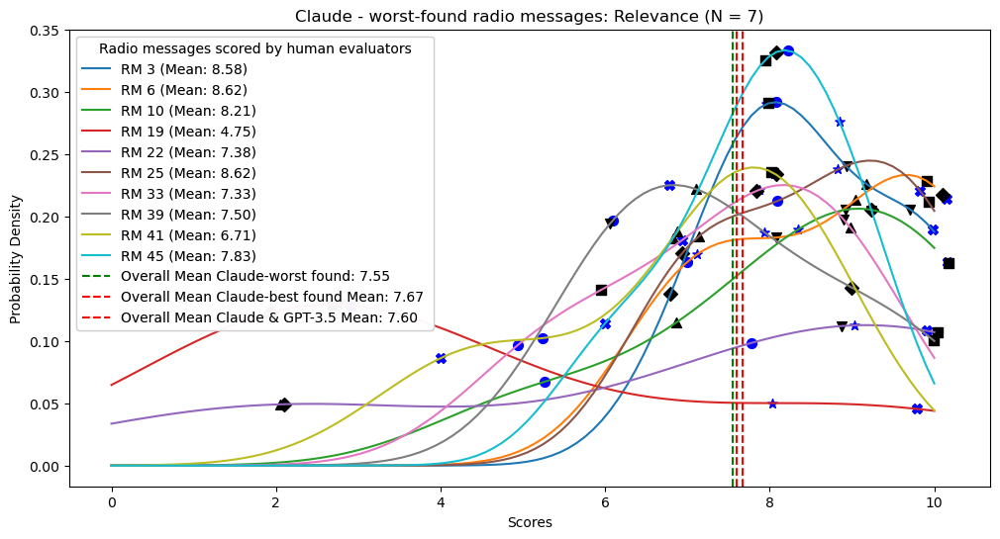

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
cl_worst_subset = cl_filter_worst[['ex_B_rele','ex_D_rele', 'ex_F_rele', 'nex_A_rele',  'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]

list_of_sublists = cl_worst_subset.values.tolist()

# Calculate the mean of each row and add to the legend
# Calculate the mean of each row and add to the legend
mean_ex = np.mean(cl_worst_subset[['ex_B_rele', 'ex_D_rele', 'ex_F_rele']], axis=1)
mean_nex = np.mean(cl_worst_subset[['nex_A_rele', 'nex_C_rele', 'nex_E_rele', 'nex_G_rele']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
#means = np.mean(cl_worst_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]})', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-worst found: {mean_of_means:.2f}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-best found': 7.67,
    'Overall Mean Claude & GPT-3.5': 7.60,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - worst-found radio messages: Relevance (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

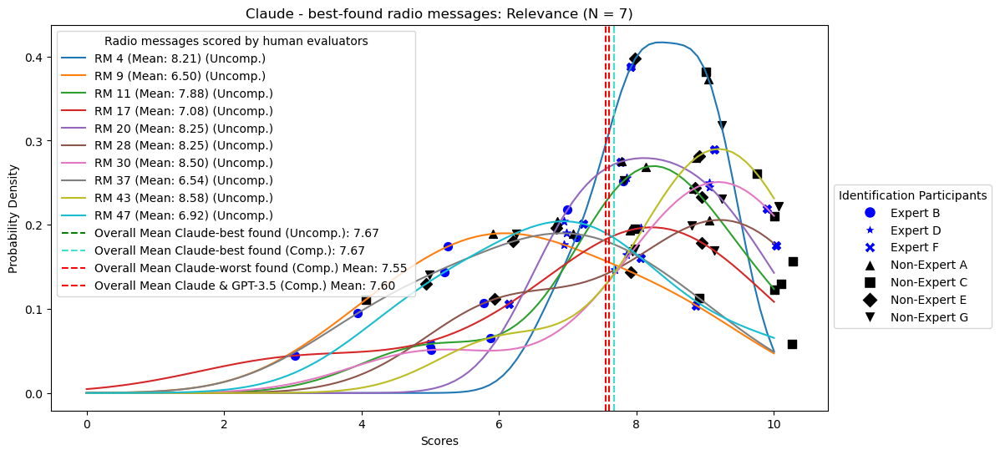

In [15]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


cl_filter_best = cl_subset[cl_subset['RM_without_number'].str.endswith("best")]
cl_best_subset = cl_filter_best[['ex_B_rele','ex_D_rele', 'ex_F_rele', 'nex_A_rele',  'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]
# Calculate the mean of each row and add to the legend

list_of_sublists = cl_best_subset.values.tolist()


mean_ex = np.mean(cl_best_subset[['ex_B_rele', 'ex_D_rele', 'ex_F_rele']], axis=1)
mean_nex = np.mean(cl_best_subset[['nex_A_rele', 'nex_C_rele', 'nex_E_rele', 'nex_G_rele']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]

#means = np.mean(cl_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]})', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-best found: {mean_of_means:.2f}')
plt.axvline(x= 7.67, color='turquoise', linestyle='--', label=f'Overall Mean Claude-best found (Comp.): {7.67}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-worst found (Comp.)': 7.55,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 7.60,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - best-found radio messages: Relevance (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# claude coherence fluency

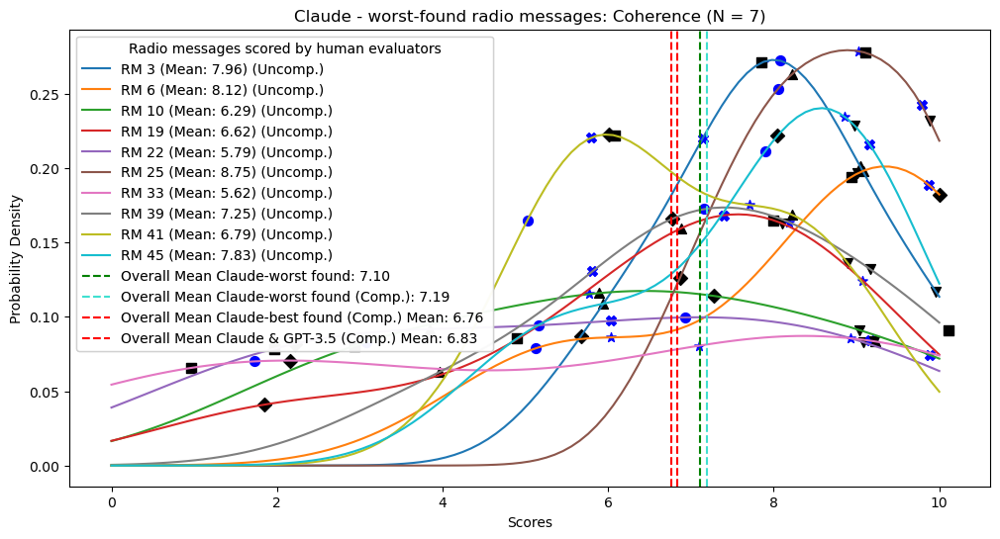

In [16]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
cl_worst_subset = cl_filter_worst[['ex_B_vloe','ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe',  'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]

list_of_sublists = cl_worst_subset.values.tolist()


mean_ex = np.mean(cl_worst_subset[['ex_B_vloe', 'ex_D_vloe', 'ex_F_vloe']], axis=1)
mean_nex = np.mean(cl_worst_subset[['nex_A_vloe', 'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
# Calculate the mean of each row and add to the legend
#means = np.mean(cl_worst_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-worst found: {mean_of_means:.2f}')
plt.axvline(x= 7.19, color='turquoise', linestyle='--', label=f'Overall Mean Claude-worst found (Comp.): {7.19}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-best found (Comp.)': 6.76,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.83,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - worst-found radio messages: Coherence (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

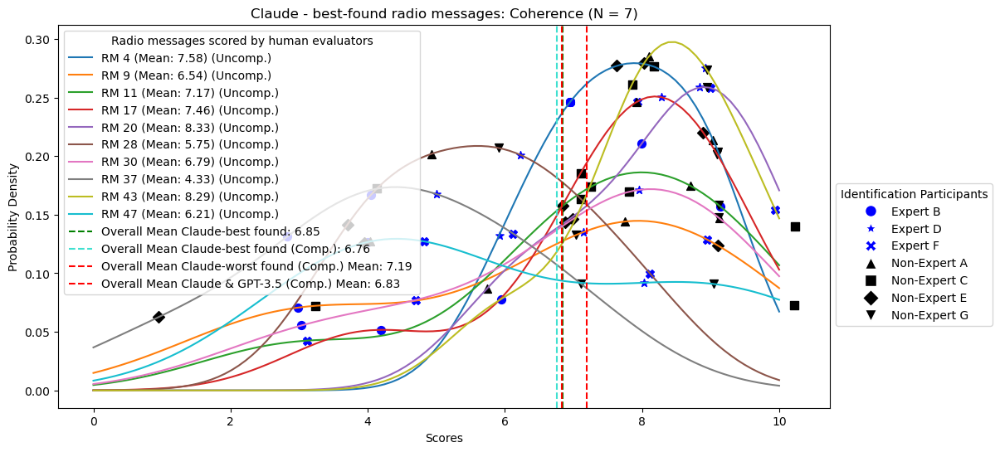

In [17]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


cl_filter_best = cl_subset[cl_subset['RM_without_number'].str.endswith("best")]
cl_best_subset = cl_filter_best[['ex_B_vloe','ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe',  'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]
# Calculate the mean of each row and add to the legend

list_of_sublists = cl_best_subset.values.tolist()

mean_ex = np.mean(cl_best_subset[['ex_B_vloe', 'ex_D_vloe', 'ex_F_vloe']], axis=1)
mean_nex = np.mean(cl_best_subset[['nex_A_vloe', 'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]

#means = np.mean(cl_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-best found: {mean_of_means:.2f}')
plt.axvline(x= 6.76, color='turquoise', linestyle='--', label=f'Overall Mean Claude-best found (Comp.): {6.76}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-worst found (Comp.)': 7.19,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.83,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - best-found radio messages: Coherence (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# worst found style

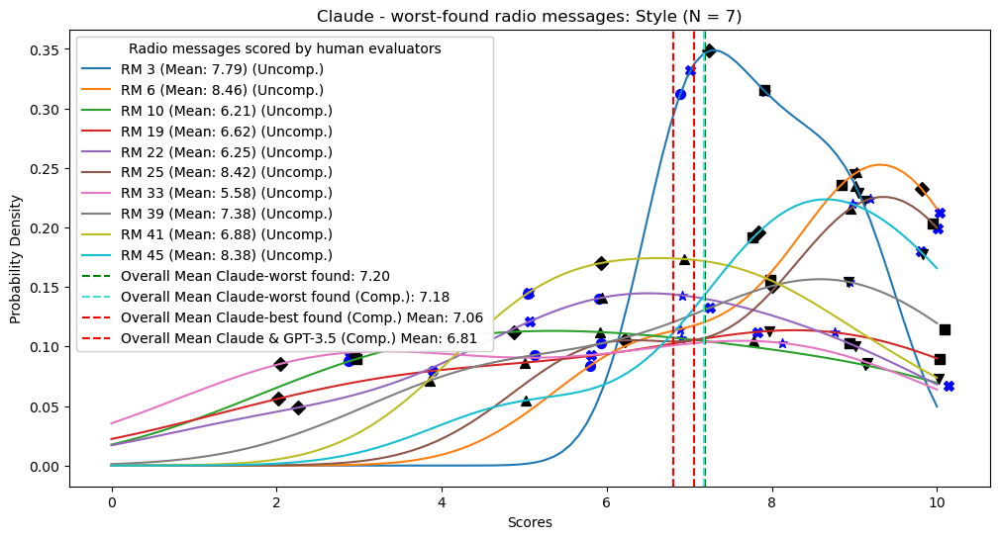

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
cl_worst_subset = cl_filter_worst[['ex_B_spre','ex_D_spre', 'ex_F_spre', 'nex_A_spre',  'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]

list_of_sublists = cl_worst_subset.values.tolist()


mean_ex = np.mean(cl_worst_subset[['ex_B_spre', 'ex_D_spre', 'ex_F_spre']], axis=1)
mean_nex = np.mean(cl_worst_subset[['nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
# Calculate the mean of each row and add to the legend
#means = np.mean(cl_worst_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-worst found: {mean_of_means:.2f}')
plt.axvline(x= 7.18, color='turquoise', linestyle='--', label=f'Overall Mean Claude-worst found (Comp.): {7.18}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-best found (Comp.)': 7.06,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.81,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - worst-found radio messages: Style (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

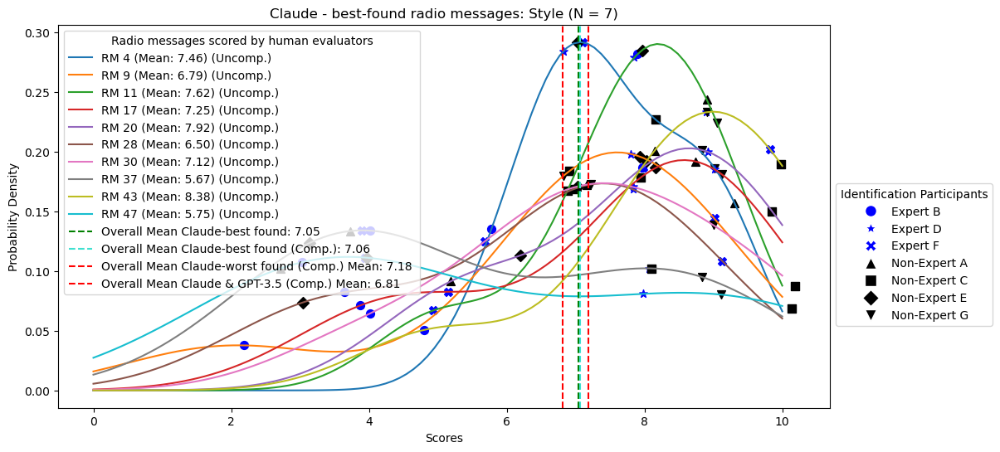

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


cl_filter_best = cl_subset[cl_subset['RM_without_number'].str.endswith("best")]
cl_best_subset = cl_filter_best[['ex_B_spre','ex_D_spre', 'ex_F_spre', 'nex_A_spre',  'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]

list_of_sublists = cl_best_subset.values.tolist()

mean_ex = np.mean(cl_best_subset[['ex_B_spre', 'ex_D_spre', 'ex_F_spre']], axis=1)
mean_nex = np.mean(cl_best_subset[['nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
# Calculate the mean of each row and add to the legend
#means = np.mean(cl_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-best found: {mean_of_means:.2f}')
plt.axvline(x= 7.06, color='turquoise', linestyle='--', label=f'Overall Mean Claude-best found (Comp.): {7.06}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-worst found (Comp.)': 7.18,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.81,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - best-found radio messages: Style (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# Total evaluation

In [5]:
import pandas as pd
tried = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]
print(cl_filter_worst.columns)

cl_subset['ex_B_eval'] = cl_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
cl_subset['ex_D_eval'] = cl_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
cl_subset['ex_F_eval'] = cl_subset[['ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre']].mean(axis=1)
cl_subset['nex_A_eval'] = cl_subset[['nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre']].mean(axis=1)
cl_subset['nex_C_eval'] = cl_subset[['nex_C_feit', 'nex_C_rele', 'nex_C_vloe', 'nex_C_spre']].mean(axis=1)
cl_subset['nex_E_eval'] = cl_subset[['nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre']].mean(axis=1)
cl_subset['nex_G_eval'] = cl_subset[['nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']].mean(axis=1)

#print(tried['ex_B_feit'])


print(cl_subset)
# import pandas as pd

# # Create a sample DataFrame
# import pandas as pd

# # Create a sample DataFrame
# data = {
#     'ex_B_feit': [1, 2, 3, 4, 5],
#     'ex_B_rele': [6, 7, 8, 9, 10],
#     'ex_B_vloe': [11, 12, 13, 14, 15],
#     'ex_B_spre': [16, 17, 18, 19, 20]
# }

# tried = pd.DataFrame(data)

# # Calculate the mean of the specified columns
# #mean_value = tried[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(skipna=True)

# # Create a new column 'ex_B_eval' using .loc indexer
# tried.loc[:, 'ex_B_eval'] = mean_value
# tried['average'] = tried.mean(axis=1)
# tried


Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

C:\Users\20183274\AppData\Local\Temp\ipykernel_2716\415355094.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_subset['ex_B_eval'] = cl_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_2716\415355094.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_subset['ex_D_eval'] = cl_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_2716\415355094.py:7: SettingWithC

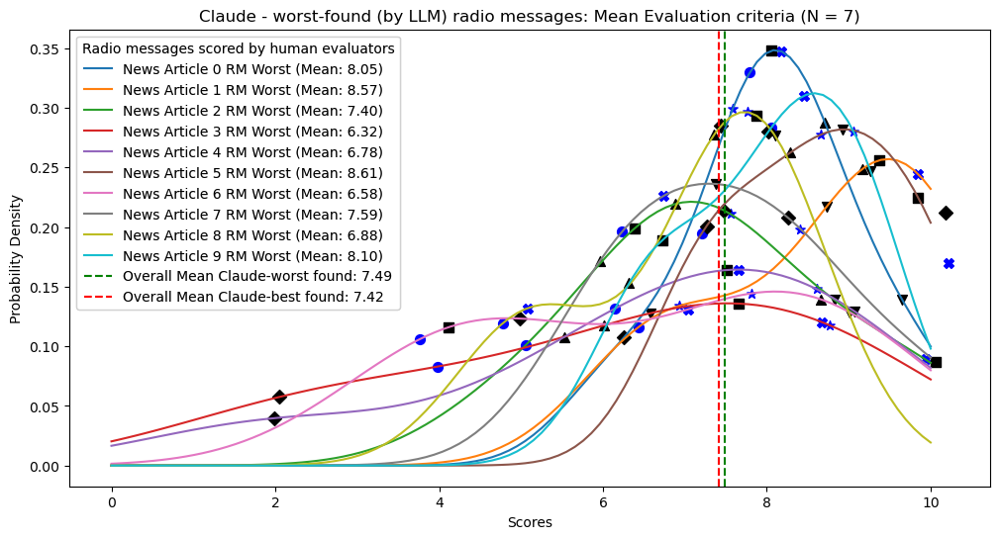

In [16]:
# WORST - TOTAL EVALUATION CLAUDE

import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
cl_filter_worst = cl_subset[cl_subset['RM_without_number'].str.endswith("worst")]

cl_worst_subset = cl_filter_worst[['ex_B_eval','ex_D_eval', 'ex_F_eval', 'nex_A_eval',  'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]

list_of_sublists = cl_worst_subset.values.tolist()


mean_ex = np.mean(cl_worst_subset[['ex_B_eval', 'ex_D_eval', 'ex_F_eval']], axis=1)
mean_nex = np.mean(cl_worst_subset[['nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
# Calculate the mean of each row and add to the legend
#means = np.mean(cl_worst_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'News Article {i} RM Worst ({means_str[i]})', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-worst found: {mean_of_means:.2f}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-best found:': 7.42,
    # 'Overall Mean Claude & GPT-3.5 (Comp.)': 7.39,
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - worst-found (by LLM) radio messages: Mean Evaluation criteria (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

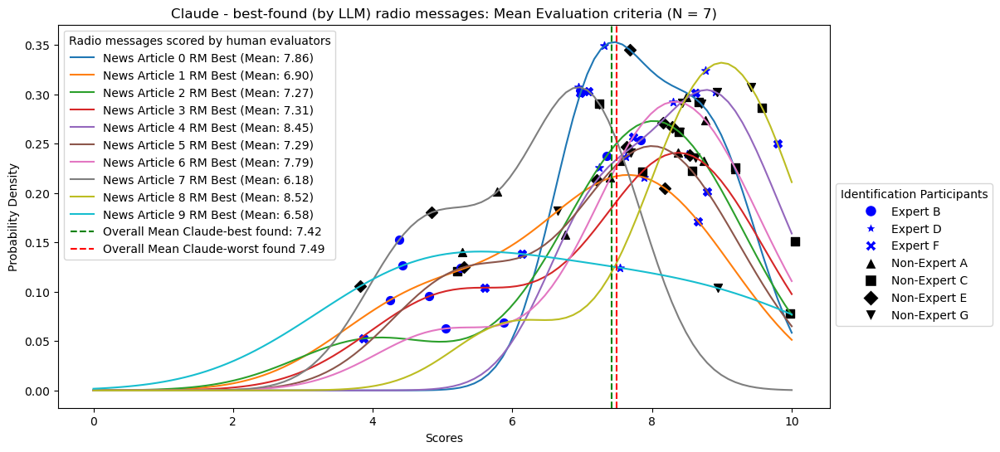

In [15]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


cl_filter_best = cl_subset[cl_subset['RM_without_number'].str.endswith("best")]
cl_best_subset = cl_filter_best[['ex_B_eval','ex_D_eval', 'ex_F_eval', 'nex_A_eval',  'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]

list_of_sublists = cl_best_subset.values.tolist()

mean_ex = np.mean(cl_best_subset[['ex_B_eval', 'ex_D_eval', 'ex_F_eval']], axis=1)
mean_nex = np.mean(cl_best_subset[['nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
# Calculate the mean of each row and add to the legend
#means = np.mean(cl_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = cl_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = cl_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'News Article {i} RM Best ({means_str[i]})', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Claude-best found: {mean_of_means:.2f}')



# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean Claude-worst found': 7.49
    # 'Overall Mean Claude & GPT-3.5 (Comp.)': 7.39,
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Claude - best-found (by LLM) radio messages: Mean Evaluation criteria (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# GPT:::::


In [25]:

gpt_filter_worst = gpt_subset[gpt_subset['RM_without_number'].str.endswith("worst")]
gpt_worst_subset = gpt_filter_worst[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]

In [8]:
gpt_worst_subset

,ex_B_feit,ex_D_feit,ex_F_feit,nex_A_feit,nex_C_feit,nex_E_feit,nex_G_feit
0,7,9,8.0,8,10.0,8,6
7,6,7,9.0,6,10.0,6,6
13,9,8,10.0,8,5.0,9,9
18,8,8,9.0,7,6.0,8,7
24,8,9,10.0,9,10.0,10,10
26,8,9,8.0,8,10.0,9,10
32,7,7,NaN,9,NaN,6,7
35,7,9,10.0,9,10.0,10,9
44,7,9,10.0,9,10.0,9,9
46,8,9,10.0,8,10.0,10,10


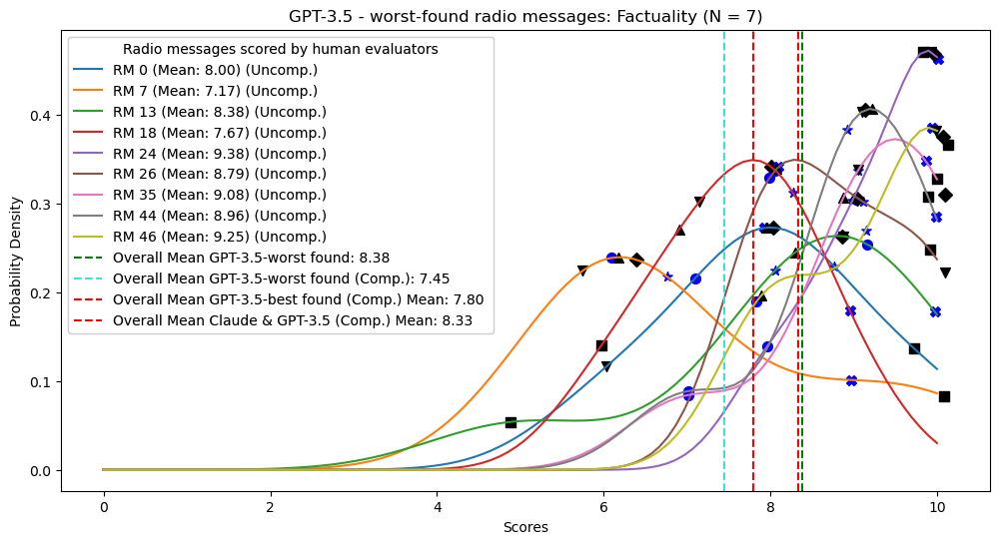

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

list_of_sublists = gpt_worst_subset.values.tolist()


mean_ex = np.mean(gpt_worst_subset[['ex_B_feit', 'ex_D_feit', 'ex_F_feit']], axis=1)
mean_nex = np.mean(gpt_worst_subset[['nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]
# Calculate the mean of each row and add to the legend
#means = np.mean(gpt_worst_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    # Generate KDE values for the current row
    
    # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
        
        
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-worst found: {mean_of_means:.2f}')
plt.axvline(x= 7.45, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Comp.): {7.45}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-best found (Comp.)': 7.80,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 8.33,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - worst-found radio messages: Factuality (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()


# one RM is missing remember

# Factuality : GPT best-found

In [ ]:
# Hier ben ik; dit zo af maken als ik me verveel.

In [17]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


gpt_filter_best = gpt_subset[gpt_subset['RM_without_number'].str.endswith("best")]
gpt_best_subset = gpt_filter_best[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
# Calculate the mean of each row and add to the legend

list_of_sublists = gpt_best_subset.values.tolist()

mean_ex = np.mean(gpt_best_subset[['ex_B_feit', 'ex_D_feit', 'ex_F_feit']], axis=1)
mean_nex = np.mean(gpt_best_subset[['nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Final Mean: {mean:.2f}' for mean in final_mean]

# SO this is changed by above mean calc to get the compensated mean
# means = np.mean(gpt_best_subset, axis=1)
# means_str = [f'Mean: {mean:.2f}' for mean in means]

# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 7.80, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Comp.): {7.80}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-worst found (Comp.)': 7.45,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 8.33,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - best-found radio messages: Factuality (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()


NameError: name 'means' is not defined

<Figure size 1200x600 with 0 Axes>

# GPT Relevance worst

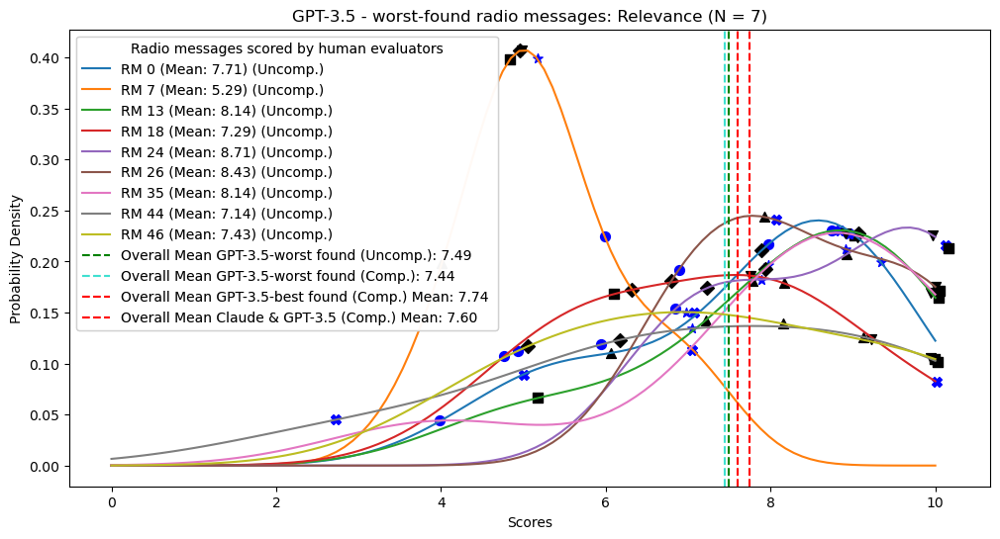

In [18]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
gpt_filter_worst = gpt_subset[gpt_subset['RM_without_number'].str.endswith("worst")]
gpt_worst_subset = gpt_filter_worst[['ex_B_rele','ex_D_rele', 'ex_F_rele', 'nex_A_rele',  'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]

list_of_sublists = gpt_worst_subset.values.tolist()

# Calculate the mean of each row and add to the legend
means = np.mean(gpt_worst_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 7.44, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Comp.): {7.44}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-best found (Comp.)': 7.74,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 7.60,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - worst-found radio messages: Relevance (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

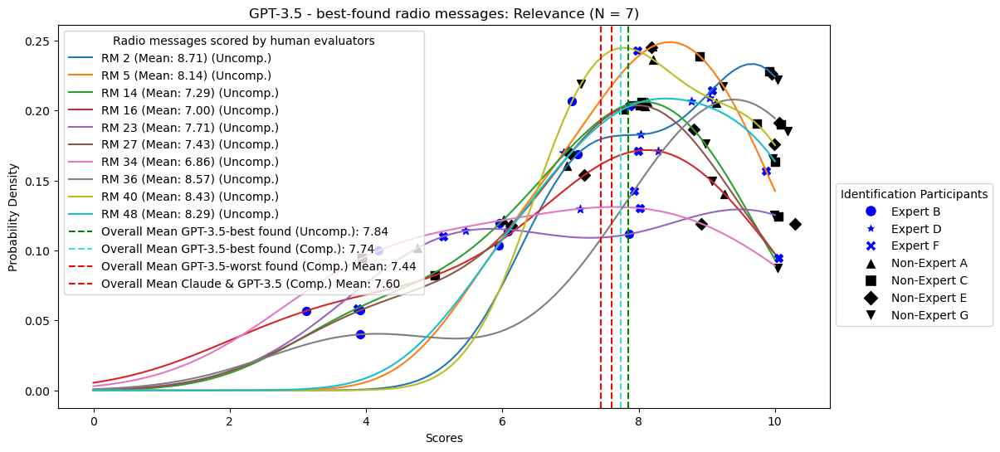

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


gpt_filter_best = gpt_subset[gpt_subset['RM_without_number'].str.endswith("best")]
gpt_best_subset = gpt_filter_best[['ex_B_rele','ex_D_rele', 'ex_F_rele', 'nex_A_rele',  'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]
# Calculate the mean of each row and add to the legend
list_of_sublists = gpt_best_subset.values.tolist()
means = np.mean(gpt_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 7.74, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Comp.): {7.74}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-worst found (Comp.)': 7.44,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 7.60,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - best-found radio messages: Relevance (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# GPT coherence fluency

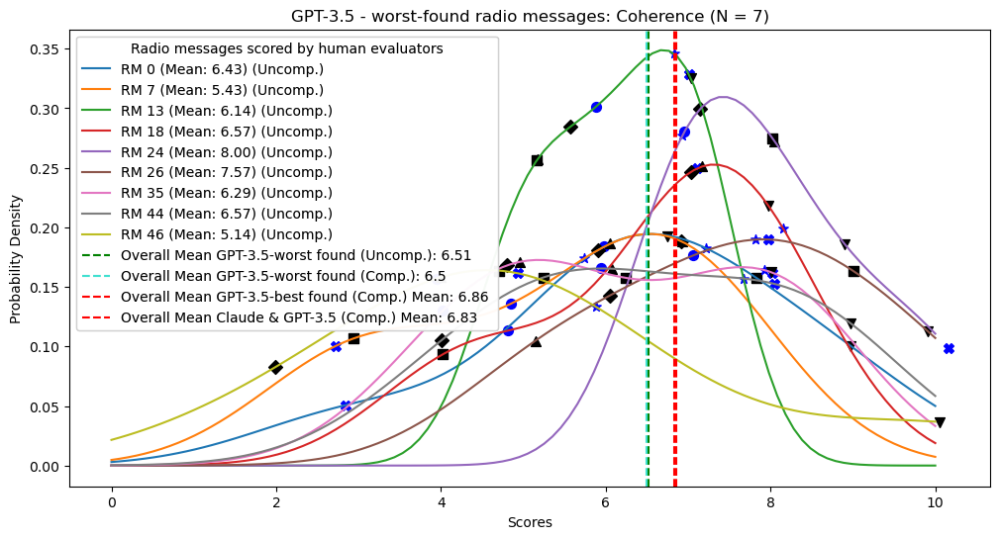

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
gpt_filter_worst = gpt_subset[gpt_subset['RM_without_number'].str.endswith("worst")]
gpt_worst_subset = gpt_filter_worst[['ex_B_vloe','ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe',  'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]

list_of_sublists = gpt_worst_subset.values.tolist()

# Calculate the mean of each row and add to the legend
means = np.mean(gpt_worst_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 6.50, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Comp.): {6.50}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-best found (Comp.)': 6.86,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.83,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - worst-found radio messages: Coherence (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

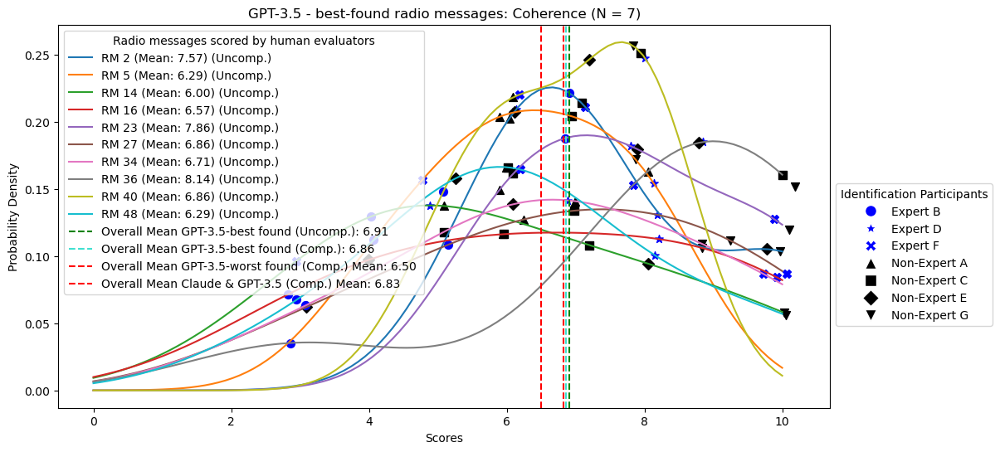

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


gpt_filter_best = gpt_subset[gpt_subset['RM_without_number'].str.endswith("best")]
gpt_best_subset = gpt_filter_best[['ex_B_vloe','ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe',  'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]
# Calculate the mean of each row and add to the legend
list_of_sublists = gpt_best_subset.values.tolist()
means = np.mean(gpt_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
        
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    for j, score in enumerate(jittered_data):
        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 6.86, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Comp.): {6.86}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-worst found (Comp.)': 6.50,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.83,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - best-found radio messages: Coherence (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# worst found style

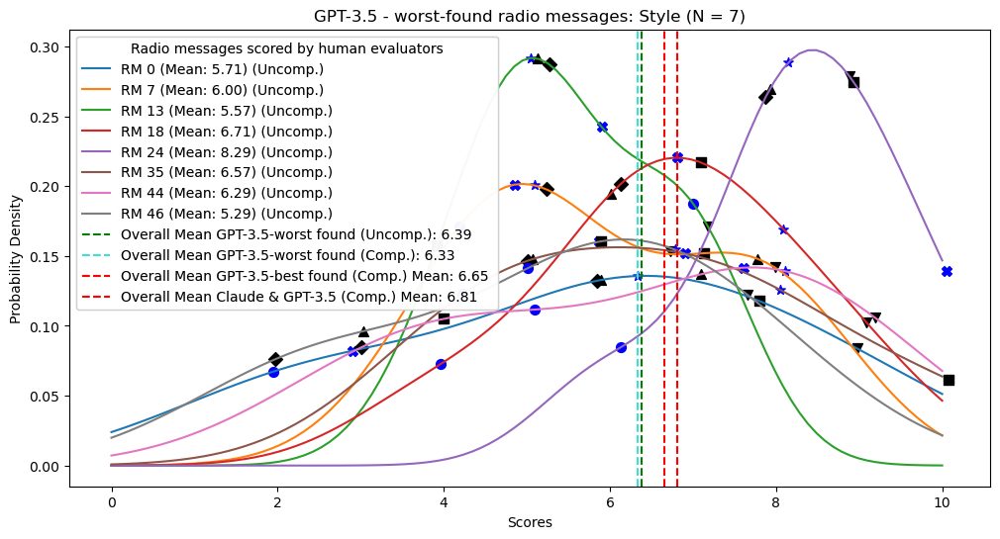

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
gpt_filter_worst = gpt_subset[gpt_subset['RM_without_number'].str.endswith("worst")]
gpt_worst_subset = gpt_filter_worst[['ex_B_spre','ex_D_spre', 'ex_F_spre', 'nex_A_spre',  'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]

list_of_sublists = gpt_worst_subset.values.tolist()

# Calculate the mean of each row and add to the legend
means = np.mean(gpt_worst_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 6.33, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-worst found (Comp.): {6.33}')

# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-best found (Comp.)': 6.65,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.81,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - worst-found radio messages: Style (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

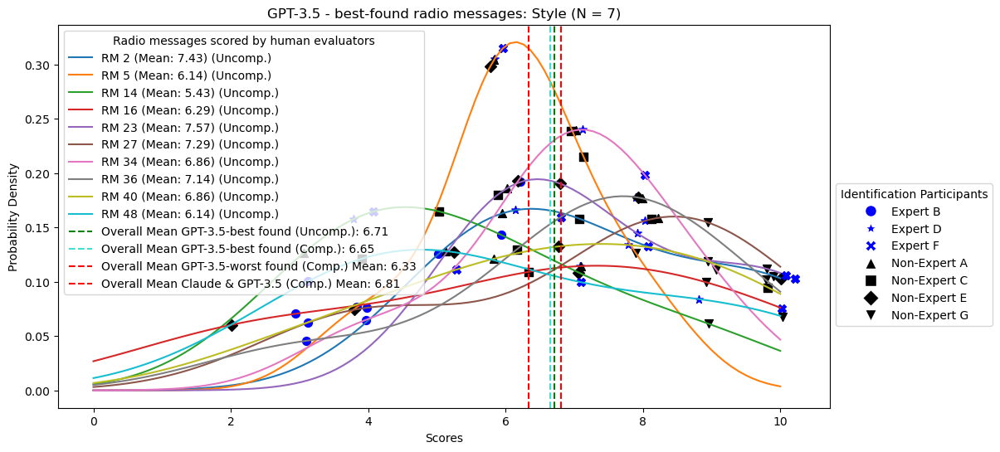

In [34]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


gpt_filter_best = gpt_subset[gpt_subset['RM_without_number'].str.endswith("best")]
gpt_best_subset = gpt_filter_best[['ex_B_spre','ex_D_spre', 'ex_F_spre', 'nex_A_spre',  'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]
# Calculate the mean of each row and add to the legend
list_of_sublists = gpt_best_subset.values.tolist()
means = np.mean(gpt_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
        
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 6.65, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Comp.): {6.65}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-worst found (Comp.)': 6.33,
    'Overall Mean Claude & GPT-3.5 (Comp.)': 6.81,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - best-found radio messages: Style (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# GPT:::::


In [20]:
gpt_subset['ex_B_eval'] = gpt_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
gpt_subset['ex_D_eval'] = gpt_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
gpt_subset['ex_F_eval'] = gpt_subset[['ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre']].mean(axis=1)
gpt_subset['nex_A_eval'] = gpt_subset[['nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre']].mean(axis=1)
gpt_subset['nex_C_eval'] = gpt_subset[['nex_C_feit', 'nex_C_rele', 'nex_C_vloe', 'nex_C_spre']].mean(axis=1)
gpt_subset['nex_E_eval'] = gpt_subset[['nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre']].mean(axis=1)
gpt_subset['nex_G_eval'] = gpt_subset[['nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']].mean(axis=1)


C:\Users\20183274\AppData\Local\Temp\ipykernel_2716\1924245451.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_subset['ex_B_eval'] = gpt_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_2716\1924245451.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_subset['ex_D_eval'] = gpt_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_2716\1924245451.py:3: Setti

In [ ]:
# Mean evaluation

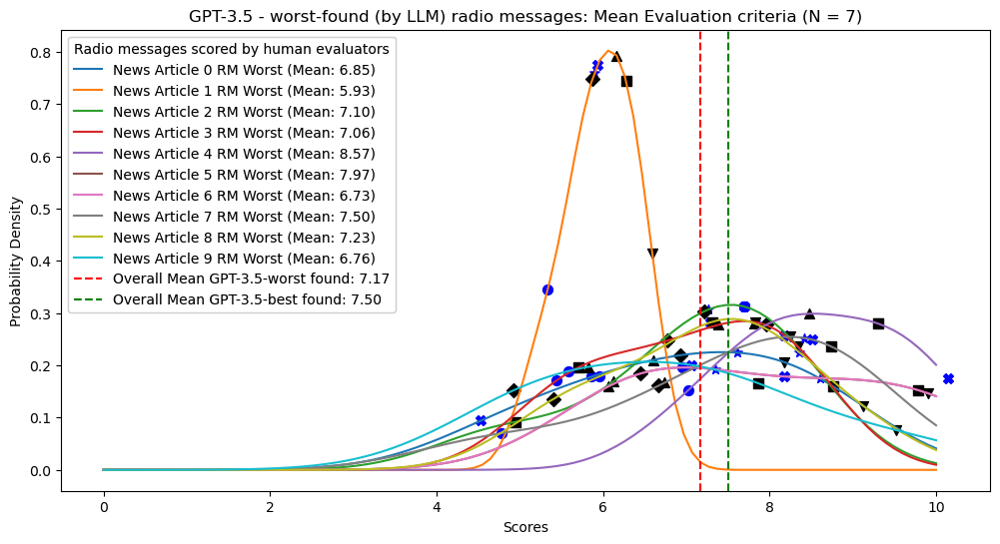

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
gpt_filter_worst = gpt_subset[gpt_subset['RM_without_number'].str.endswith("worst")]
gpt_worst_subset = gpt_filter_worst[['ex_B_eval','ex_D_eval', 'ex_F_eval', 'nex_A_eval',  'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]

list_of_sublists = gpt_worst_subset.values.tolist()


mean_ex = np.mean(gpt_worst_subset[['ex_B_eval', 'ex_D_eval', 'ex_F_eval']], axis=1)
mean_nex = np.mean(gpt_worst_subset[['nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]

# Calculate the mean of each row and add to the legend
#means = np.mean(gpt_worst_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_worst_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        row_index = gpt_worst_subset.index[i]
        #plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}):', markersize=2)
        
        plt.plot(x_values, kde_values, label=f'News Article {i} RM Worst ({means_str[i]})', markersize=2) 
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_worst_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    #plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}):', markersize=2)
    plt.plot(x_values, kde_values, label=f'News Article {i} RM Worst ({means_str[i]})', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='r', linestyle='--', label=f'Overall Mean GPT-3.5-worst found: {mean_of_means:.2f}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-best found:': 7.50,
    #'Overall Mean Claude & GPT-3.5 (Comp.)': 7.39,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='g', linestyle='--', label=f'{label} {mean:.2f} ')

#print(means)

# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - worst-found (by LLM) radio messages: Mean Evaluation criteria (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)



legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]

#legend2 = plt.legend(handles=legend2_elements, title="Identification Participantss", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

0
Mean: 8.20
1
Mean: 7.27
2
Mean: 6.47
3
Mean: 7.22
4
Mean: 8.11
5
Mean: 7.49
6
Mean: 7.11
7
Mean: 8.09
8
Mean: 7.70
9
Mean: 7.31


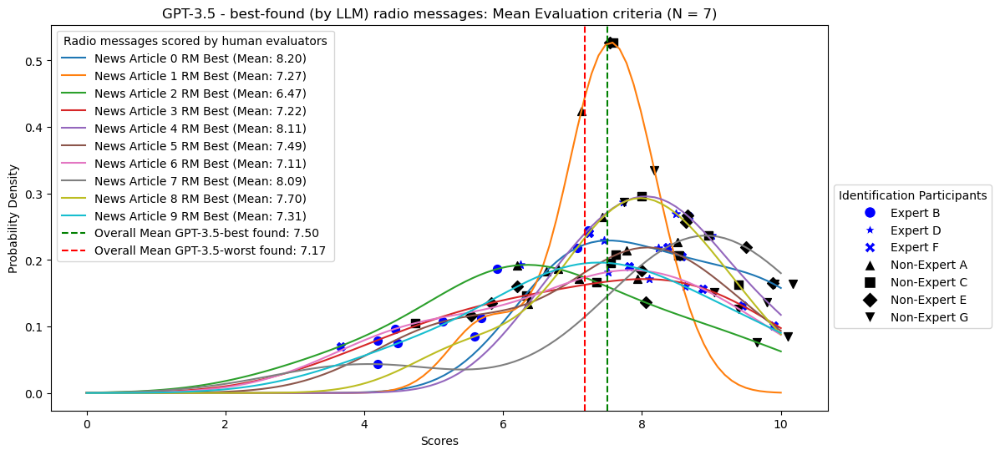

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


gpt_filter_best = gpt_subset[gpt_subset['RM_without_number'].str.endswith("best")]
gpt_best_subset = gpt_filter_best[['ex_B_eval','ex_D_eval', 'ex_F_eval', 'nex_A_eval',  'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
# Calculate the mean of each row and add to the legend
list_of_sublists = gpt_best_subset.values.tolist()


mean_ex = np.mean(gpt_best_subset[['ex_B_eval', 'ex_D_eval', 'ex_F_eval']], axis=1)
mean_nex = np.mean(gpt_best_subset[['nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Mean: {mean:.2f}' for mean in final_mean]

#print(mean_nex)
#print()
#means = np.mean(gpt_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = gpt_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data


for i, data in enumerate(list_of_sublists):
    print(i)
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        row_index = gpt_best_subset.index[i] # deze 2 rijen moet ik terug
        #plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}):', markersize=2) # change this to beneath
        print('hIII')
        print(i)
        plt.plot(x_values, kde_values, label=f'News Article {i} RM Best ({means_str[i]})', markersize=2) 
        continue
        
    #print()    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = gpt_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    print(means_str[i])
    
    #plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}):', markersize=2) change this to beneath
    
    plt.plot(x_values, kde_values, label=f'News Article {i} RM Best ({means_str[i]})', markersize=2) 
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean GPT-3.5-best found: {mean_of_means:.2f}')
#plt.axvline(x= 7.50, color='turquoise', linestyle='--', label=f'Overall Mean GPT-3.5-best found (Comp.): {7.50}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean GPT-3.5-worst found:': 7.17,
    #'Overall Mean Claude & GPT-3.5 (Comp.)': 6.81,
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('GPT-3.5 - best-found (by LLM) radio messages: Mean Evaluation criteria (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

# Golden RM's

In [80]:
hw_subset

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,...,nex_HM_vloe,nex_HM_rele,nex_HM_spre,total_HM_feit,total_HM_vloe,total_HM_rele,total_HM_spre,total_HM_eval,nex_HM_eval,ex_HM_eval
1,0,gold,cl_rm_g,NA_0_rm_g,NA_0_rm_g,1.0,74.0,49.0,70.0,82.0,...,8.75,8.50,9.00,8.708333,8.875000,8.416667,9.166667,8.791667,8.7500,8.833333
8,1,gold,cl_rm_g,NA_1_rm_g,NA_1_rm_g,1.0,98.0,71.0,59.0,71.0,...,7.25,6.50,8.25,7.916667,8.125000,6.916667,8.458333,7.854167,7.6250,8.083333
12,2,gold,cl_rm_g,NA_2_rm_g,NA_2_rm_g,1.0,93.0,75.6,73.0,78.0,...,8.75,9.50,9.50,9.708333,8.875000,9.083333,9.416667,9.270833,9.3750,9.166667
15,3,gold,cl_rm_g,NA_3_rm_g,NA_3_rm_g,1.0,0.0,29.0,20.0,23.0,...,8.00,1.50,8.25,2.875000,8.500000,2.583333,8.625000,5.645833,4.8750,6.416667
21,4,gold,cl_rm_g,NA_4_rm_g,NA_4_rm_g,1.0,92.6,88.0,92.0,87.6,...,8.00,9.50,8.25,9.250000,8.500000,8.416667,8.625000,8.697917,8.8125,8.583333
29,5,gold,cl_rm_g,NA_5_rm_g,NA_5_rm_g,1.0,88.6,79.8,67.0,70.0,...,8.25,8.00,8.75,9.041667,8.625000,8.333333,8.708333,8.677083,8.4375,8.916667
31,6,gold,cl_rm_g,NA_6_rm_g,NA_6_rm_g,1.0,84.0,70.2,52.0,84.0,...,7.75,8.75,8.00,9.000000,8.041667,8.708333,8.166667,8.479167,8.3750,8.583333
38,7,gold,cl_rm_g,NA_7_rm_g,NA_7_rm_g,1.0,84.0,73.0,58.0,94.0,...,9.25,9.25,9.50,9.250000,8.791667,8.625000,9.083333,8.937500,9.3750,8.500000
42,8,gold,cl_rm_g,NA_8_rm_g,NA_8_rm_g,1.0,95.0,85.4,64.0,74.0,...,9.50,9.25,9.50,8.541667,8.916667,8.791667,8.916667,8.791667,9.2500,8.333333
49,9,gold,cl_rm_g,NA_9_rm_g,NA_9_rm_g,1.0,84.0,68.0,62.0,90.0,...,9.25,8.75,9.50,9.000000,8.958333,8.375000,9.083333,8.854167,9.1250,8.583333


# Factuality

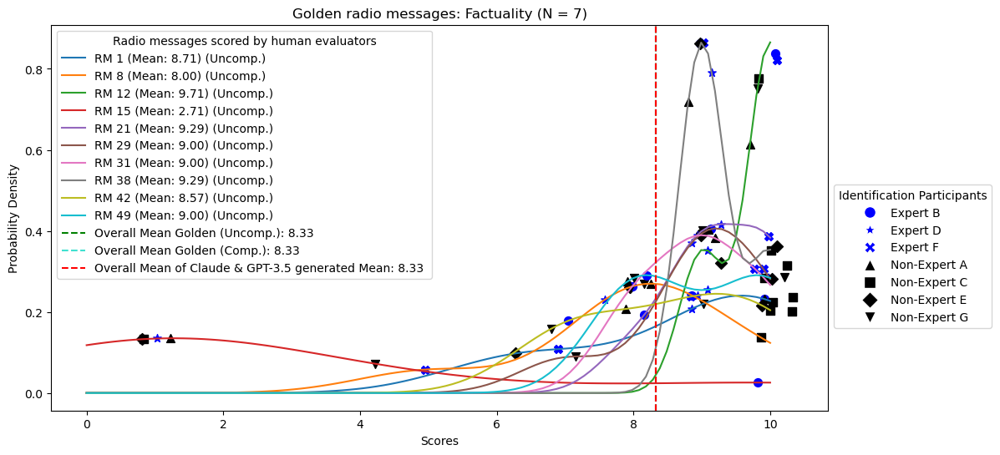

In [82]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


#hw_filter_best = hw_subset[gpt_subset['RM_without_number'].str.endswith("best")]
hw_best_subset = hw_subset[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
# Calculate the mean of each row and add to the legend

list_of_sublists = hw_best_subset.values.tolist()

means = np.mean(hw_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = hw_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = hw_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Golden (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 8.33, color='turquoise', linestyle='--', label=f'Overall Mean Golden (Comp.): {8.33}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean of Claude & GPT-3.5 generated': 8.33
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Golden radio messages: Factuality (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

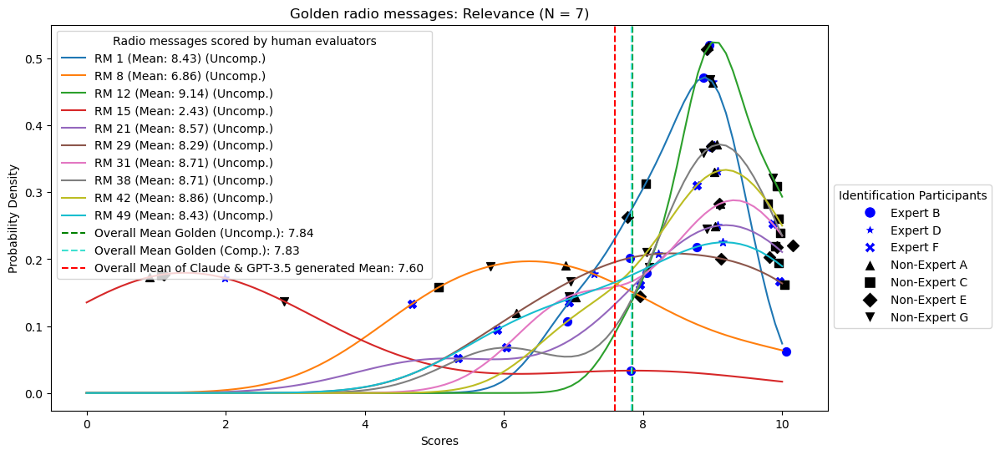

In [83]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


hw_best_subset = hw_subset[['ex_B_rele','ex_D_rele', 'ex_F_rele', 'nex_A_rele',  'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]
# Calculate the mean of each row and add to the legend
list_of_sublists = hw_best_subset.values.tolist()
means = np.mean(hw_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = hw_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
    
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = hw_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Golden (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 7.83, color='turquoise', linestyle='--', label=f'Overall Mean Golden (Comp.): {7.83}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean of Claude & GPT-3.5 generated': 7.60
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Golden radio messages: Relevance (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

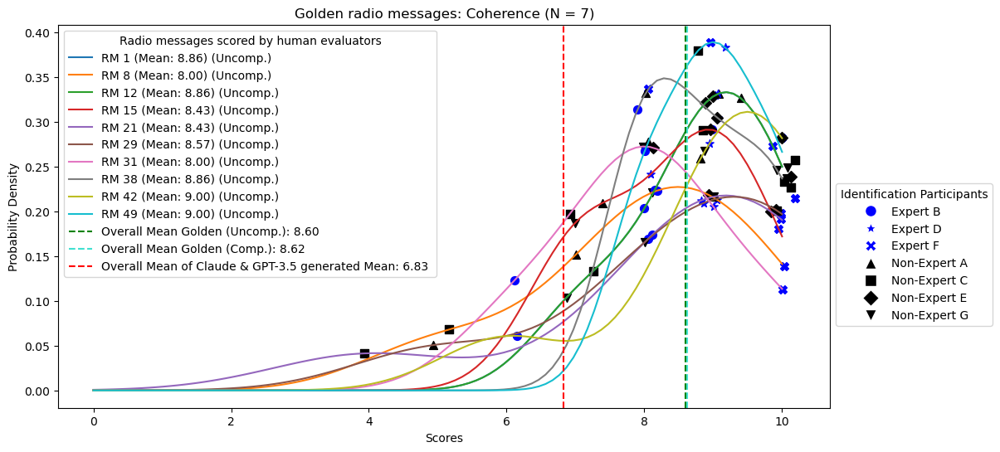

In [86]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


hw_best_subset = hw_subset[['ex_B_vloe','ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe',  'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]
list_of_sublists = hw_best_subset.values.tolist()
means = np.mean(hw_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = hw_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
        
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = hw_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    for j, score in enumerate(jittered_data):
        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Golden (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 8.62, color='turquoise', linestyle='--', label=f'Overall Mean Golden (Comp.): {8.62}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean of Claude & GPT-3.5 generated': 6.83
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Golden radio messages: Coherence (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

In [ ]:
# To calculate the Compensated means:

# mean_ex = np.mean(hw_best_subset[['ex_B_spre', 'ex_D_spre', 'ex_F_spre']], axis=1)
# mean_nex = np.mean(hw_best_subset[['nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']], axis=1)
# final_mean = np.mean([mean_ex, mean_nex], axis=0)
# means_str = [f'Final Mean: {mean:.2f}' for mean in final_mean]



# THIS IS CHANGED TO ABOVE
#means = np.mean(hw_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]

# change mean_of_means to final_mean

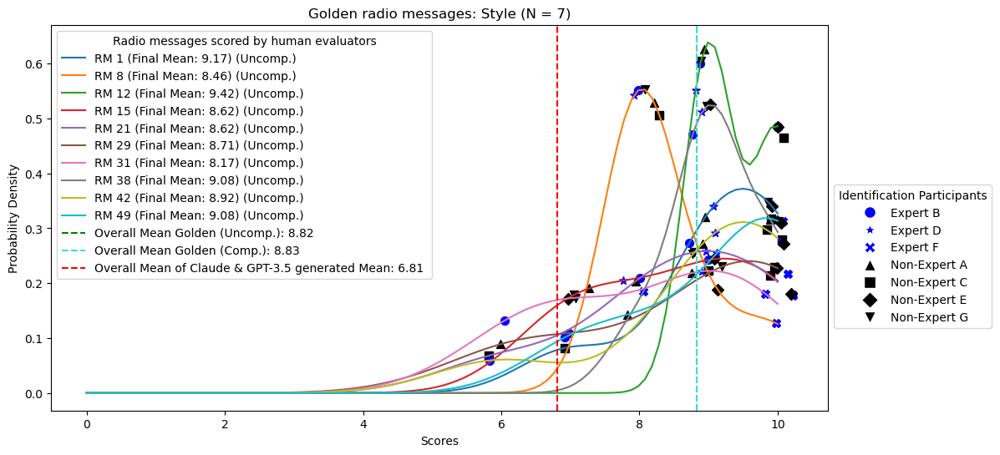

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

hw_best_subset = hw_subset[['ex_B_spre','ex_D_spre', 'ex_F_spre', 'nex_A_spre',  'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]

# Calculate the mean of each row and add to the legend
list_of_sublists = hw_best_subset.values.tolist()


mean_ex = np.mean(hw_best_subset[['ex_B_spre', 'ex_D_spre', 'ex_F_spre']], axis=1)
mean_nex = np.mean(hw_best_subset[['nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']], axis=1)
final_mean = np.mean([mean_ex, mean_nex], axis=0)
means_str = [f'Final Mean: {mean:.2f}' for mean in final_mean]



# THIS IS CHANGED TO ABOVE
#means = np.mean(hw_best_subset, axis=1)
#means_str = [f'Mean: {mean:.2f}' for mean in means]


# Create a single plot
plt.figure(figsize=(12, 6))

participants = hw_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(final_mean))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
        
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = hw_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Golden (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 8.83, color='turquoise', linestyle='--', label=f'Overall Mean Golden (Comp.): {8.83}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean of Claude & GPT-3.5 generated': 6.81
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Golden radio messages: Style (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

In [84]:
hw_subset['ex_B_eval'] = hw_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
hw_subset['ex_D_eval'] = hw_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
hw_subset['ex_F_eval'] = hw_subset[['ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre']].mean(axis=1)
hw_subset['nex_A_eval'] = hw_subset[['nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre']].mean(axis=1)
hw_subset['nex_C_eval'] = hw_subset[['nex_C_feit', 'nex_C_rele', 'nex_C_vloe', 'nex_C_spre']].mean(axis=1)
hw_subset['nex_E_eval'] = hw_subset[['nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre']].mean(axis=1)
hw_subset['nex_G_eval'] = hw_subset[['nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']].mean(axis=1)

C:\Users\20183274\AppData\Local\Temp\ipykernel_20168\3474556591.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hw_subset['ex_B_eval'] = hw_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_20168\3474556591.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hw_subset['ex_D_eval'] = hw_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_20168\3474556591.py:3: Settin

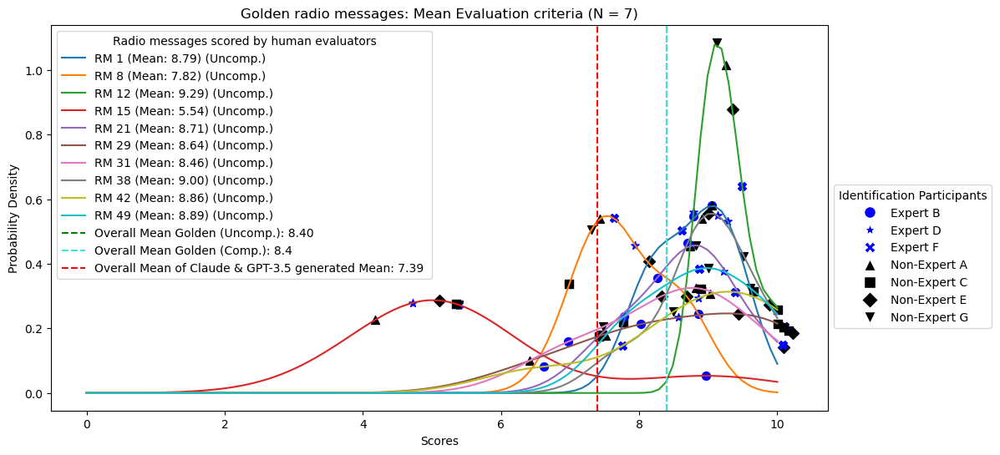

In [85]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

hw_best_subset = hw_subset[['ex_B_eval','ex_D_eval', 'ex_F_eval', 'nex_A_eval',  'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]

# Calculate the mean of each row and add to the legend
list_of_sublists = hw_best_subset.values.tolist()
means = np.mean(hw_best_subset, axis=1)
means_str = [f'Mean: {mean:.2f}' for mean in means]
# Create a single plot
plt.figure(figsize=(12, 6))

participants = hw_best_subset.columns.tolist()
participant_markers = ['o', '*',   'X' , '^', 's', 'D', 'v'] #, 'H' '+'  'v''<', '>', 'p', '*', '|', 'X', '_', '1', '2', '3', '4', '8', '.']

mean_of_means = np.mean(list(means))
# Plot the KDE lines for each row of data
for i, data in enumerate(list_of_sublists):
    
        # Ik skip hier 1 radiobericht omdat die nan values bevat. dit heeft geen consequenties op de calc. means.
    if np.isnan(data).any():  # Skip rows with NaN values
        continue
        
    # Generate KDE values for the current row
    kde = gaussian_kde(data)
    x_values = np.linspace(0, 10, 100)  # Create a range of x-values from 0 to 10
    kde_values = kde(x_values)

    # Get the row index from the DataFrame
    row_index = hw_best_subset.index[i]

    markers = participant_markers[:len(participants)]
    
    #colors = ['red', 'green', 'blue', 'purple', 'orange', 'cyan', 'black']
    colors = ['blue', 'blue', 'blue', 'black', 'black', 'black', 'black']
    # Plot the KDE line for the current row
    
    jittered_data = [score + np.random.normal(0, 0.14) for score in data]
    
    
    for j, score in enumerate(jittered_data):

        plt.scatter(score, kde(score), marker=markers[j], s=50,  c=colors[j])
    
    
    plt.plot(x_values, kde_values, label=f'RM {row_index} ({means_str[i]}) (Uncomp.)', markersize=2)
    
# Add a vertical line representing the mean of the means
plt.axvline(x=mean_of_means, color='g', linestyle='--', label=f'Overall Mean Golden (Uncomp.): {mean_of_means:.2f}')
plt.axvline(x= 8.40, color='turquoise', linestyle='--', label=f'Overall Mean Golden (Comp.): {8.40}')


# Add vertical lines representing the mean of other radio messages
mean_values = {
    'Overall Mean of Claude & GPT-3.5 generated': 7.39
    # Add more radio messages and their means as needed
}

for label, mean in mean_values.items():
    plt.axvline(x=mean, color='r', linestyle='--', label=f'{label} Mean: {mean:.2f} ')

#print(means)

    
# Set labels and title
plt.xlabel('Scores')
plt.ylabel('Probability Density')
plt.title('Golden radio messages: Mean Evaluation criteria (N = 7)')

# Add a legend to differentiate the rows
plt.legend()
handles, labels = plt.gca().get_legend_handles_labels()

legend1 = plt.legend(handles[:14], labels[:14], title="Radio messages scored by human evaluators", loc='upper left', bbox_to_anchor=(0, 1))
plt.gca().add_artist(legend1)
from matplotlib.lines import Line2D

# Modify the participant labels
participant_labels = []
for participant in participants:
    if participant.startswith('ex'):
        participant_labels.append(f'Expert {participant[3:4]}')
    elif participant.startswith('nex'):
        participant_labels.append(f'Non-Expert {participant[4:5]}')
    else:
        participant_labels.append(participant)


#print(participant_markers)
#print(participant_labels)
legend2_elements = [Line2D([0], [0], marker=participant_markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=participant_labels[i]) for i in range(len(participants))]
#print(participants)
legend2 = plt.legend(handles=legend2_elements, title="Identification Participants", loc='upper left', bbox_to_anchor=(1, 0.6))

# Show the plot
plt.show()

In [88]:
gpt_subset

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,...,total_HM_eval,nex_HM_eval,ex_HM_eval,ex_B_eval,ex_D_eval,ex_F_eval,nex_A_eval,nex_C_eval,nex_E_eval,nex_G_eval
0,0,gpt4,gpt4_rm_2,NA_0_gpt4_rm_worst,NA_0_gpt4_rm_2_worst,0.697450,85.0,73.0,77.0,77.0,...,6.854167,7.625000,6.083333,5.75,7.750000,4.75,6.50,8.75,7.00,8.25
2,0,gpt4,gpt4_rm_6,NA_0_gpt4_rm_best,NA_0_gpt4_rm_6_best,0.710149,94.0,90.0,89.0,84.0,...,8.197917,8.812500,7.583333,7.00,7.250000,8.50,6.75,8.50,10.00,10.00
5,1,gpt4,gpt4_rm_2,NA_1_gpt4_rm_best,NA_1_gpt4_rm_2_best,0.727186,100.0,84.0,94.0,83.0,...,7.270833,7.625000,6.916667,5.75,7.500000,7.50,7.00,7.75,7.50,8.25
7,1,gpt4,gpt4_rm_4,NA_1_gpt4_rm_worst,NA_1_gpt4_rm_4_worst,0.699665,94.0,67.0,80.0,60.0,...,5.927083,6.187500,5.666667,5.25,5.750000,6.00,6.25,6.25,5.75,6.50
13,2,gpt4,gpt4_rm_5,NA_2_gpt4_rm_worst,NA_2_gpt4_rm_5_worst,0.757148,70.0,64.0,64.0,63.0,...,7.104167,6.625000,7.583333,7.75,7.000000,8.00,6.25,4.75,7.25,8.25
14,2,gpt4,gpt4_rm_2,NA_2_gpt4_rm_best,NA_2_gpt4_rm_2_best,0.739124,87.0,77.0,86.0,82.0,...,6.468750,7.687500,5.250000,6.00,6.000000,3.75,6.00,7.00,8.25,9.50
16,3,gpt4,gpt4_rm_6,NA_3_gpt4_rm_best,NA_3_gpt4_rm_6_best,0.691363,99.0,48.0,89.0,84.0,...,7.218750,7.187500,7.250000,4.25,8.000000,9.50,7.75,6.25,5.75,9.00
18,3,gpt4,gpt4_rm_4,NA_3_gpt4_rm_worst,NA_3_gpt4_rm_4_worst,0.682122,98.0,18.0,81.0,74.0,...,7.062500,6.875000,7.250000,5.50,8.000000,8.25,7.00,5.75,6.75,8.00
23,4,gpt4,gpt4_rm_2,NA_4_gpt4_rm_best,NA_4_gpt4_rm_2_best,0.748977,100.0,80.0,87.0,87.0,...,8.114583,8.312500,7.916667,7.25,7.750000,8.75,6.50,8.00,8.75,10.00
24,4,gpt4,gpt4_rm_3,NA_4_gpt4_rm_worst,NA_4_gpt4_rm_3_worst,0.806242,100.0,73.0,81.0,69.0,...,8.572917,8.812500,8.333333,7.00,8.000000,10.00,8.50,9.25,8.00,9.50


# BERTScore-NA difference



In [69]:
main_df.columns

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

In [70]:
b = pd.read_csv('exp_1_df_bertscore_incl_bertonnewsa.csv', delimiter=',')
b.columns

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

In [76]:
b[['rm_i', 'BERTScore_NA']]


a = b[b["rm_i"] == "cl_rm_g"]
c =  b[b["rm_i"] != "cl_rm_g"]

In [79]:
print(a['BERTScore_NA'].mean()) # gold 0.677
c['BERTScore_NA'].mean() # non-gold 0.646

0.6770425915718079


0.6467550352215767

In [89]:
gpt_subset

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,...,total_HM_eval,nex_HM_eval,ex_HM_eval,ex_B_eval,ex_D_eval,ex_F_eval,nex_A_eval,nex_C_eval,nex_E_eval,nex_G_eval
0,0,gpt4,gpt4_rm_2,NA_0_gpt4_rm_worst,NA_0_gpt4_rm_2_worst,0.697450,85.0,73.0,77.0,77.0,...,6.854167,7.625000,6.083333,5.75,7.750000,4.75,6.50,8.75,7.00,8.25
2,0,gpt4,gpt4_rm_6,NA_0_gpt4_rm_best,NA_0_gpt4_rm_6_best,0.710149,94.0,90.0,89.0,84.0,...,8.197917,8.812500,7.583333,7.00,7.250000,8.50,6.75,8.50,10.00,10.00
5,1,gpt4,gpt4_rm_2,NA_1_gpt4_rm_best,NA_1_gpt4_rm_2_best,0.727186,100.0,84.0,94.0,83.0,...,7.270833,7.625000,6.916667,5.75,7.500000,7.50,7.00,7.75,7.50,8.25
7,1,gpt4,gpt4_rm_4,NA_1_gpt4_rm_worst,NA_1_gpt4_rm_4_worst,0.699665,94.0,67.0,80.0,60.0,...,5.927083,6.187500,5.666667,5.25,5.750000,6.00,6.25,6.25,5.75,6.50
13,2,gpt4,gpt4_rm_5,NA_2_gpt4_rm_worst,NA_2_gpt4_rm_5_worst,0.757148,70.0,64.0,64.0,63.0,...,7.104167,6.625000,7.583333,7.75,7.000000,8.00,6.25,4.75,7.25,8.25
14,2,gpt4,gpt4_rm_2,NA_2_gpt4_rm_best,NA_2_gpt4_rm_2_best,0.739124,87.0,77.0,86.0,82.0,...,6.468750,7.687500,5.250000,6.00,6.000000,3.75,6.00,7.00,8.25,9.50
16,3,gpt4,gpt4_rm_6,NA_3_gpt4_rm_best,NA_3_gpt4_rm_6_best,0.691363,99.0,48.0,89.0,84.0,...,7.218750,7.187500,7.250000,4.25,8.000000,9.50,7.75,6.25,5.75,9.00
18,3,gpt4,gpt4_rm_4,NA_3_gpt4_rm_worst,NA_3_gpt4_rm_4_worst,0.682122,98.0,18.0,81.0,74.0,...,7.062500,6.875000,7.250000,5.50,8.000000,8.25,7.00,5.75,6.75,8.00
23,4,gpt4,gpt4_rm_2,NA_4_gpt4_rm_best,NA_4_gpt4_rm_2_best,0.748977,100.0,80.0,87.0,87.0,...,8.114583,8.312500,7.916667,7.25,7.750000,8.75,6.50,8.00,8.75,10.00
24,4,gpt4,gpt4_rm_3,NA_4_gpt4_rm_worst,NA_4_gpt4_rm_3_worst,0.806242,100.0,73.0,81.0,69.0,...,8.572917,8.812500,8.333333,7.00,8.000000,10.00,8.50,9.25,8.00,9.50


In [102]:
gpt_filter_best = gpt_subset[gpt_subset['RM_without_number'].str.endswith("best")]
gpt_best_subset = gpt_filter_best[['ex_B_feit','ex_D_feit', 'ex_F_feit', 'nex_A_feit',  'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
# Calculate the mean of each row and add to the legend
print(gpt_filter_best.columns)
print(gpt_filter_best['ex_HM_feit'])
print(gpt_filter_best['nex_HM_feit'])
print(gpt_filter_best['total_HM_feit'])
gpt_best_subset

print(gpt_filter_best['total_HM_feit'].mean(axis=0))

Index(['NA_index', 'llm', 'rm_i', 'RM_without_number', 'RM_with_number',
       'bertscore', 'feit_M', 'vloe_M', 'rele_M', 'spre_M', 'eval_M',
       'ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre', 'ex_B_geschreven',
       'ex_B_gebruiken', 'ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre',
       'ex_D_geschreven', 'ex_D_gebruiken', 'ex_F_feit', 'ex_F_rele',
       'ex_F_vloe', 'ex_F_spre', 'ex_F_geschreven', 'ex_F_gebruiken',
       'nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre',
       'nex_A_geschreven', 'nex_A_gebruiken', 'nex_C_feit', 'nex_C_rele',
       'nex_C_vloe', 'nex_C_spre', 'nex_C_geschreven', 'nex_C_gebruiken',
       'nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre',
       'nex_E_geschreven', 'nex_E_gebruiken', 'nex_G_feit', 'nex_G_rele',
       'nex_G_vloe', 'nex_G_spre', 'nex_G_geschreven', 'nex_G_gebruiken',
       'ex_HM_feit', 'ex_HM_vloe', 'ex_HM_rele', 'ex_HM_spre', 'nex_HM_feit',
       'nex_HM_vloe', 'nex_HM_rele', 'nex_HM_spre', 'total_HM_

In [186]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))

C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\3071327539.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [64]:
cl_sub_sub

,NA_index,RM_without_number,ex_B_eval,ex_D_eval,ex_F_eval,nex_A_eval,nex_C_eval,nex_E_eval,nex_G_eval,Category
3,0,NA_0_cl_rm_worst,8.00,7.50,8.25,8.75,8.00,6.25,9.75,Worst
4,0,NA_0_cl_rm_best,7.00,7.50,7.00,9.25,8.50,7.75,8.75,Best
6,1,NA_1_cl_rm_worst,6.50,7.00,10.00,9.25,9.50,10.00,8.50,Worst
9,1,NA_1_cl_rm_best,4.25,7.75,8.75,7.25,5.25,8.25,6.75,Best
10,2,NA_2_cl_rm_worst,5.00,7.25,10.00,6.75,6.50,7.50,8.75,Worst
11,2,NA_2_cl_rm_best,7.25,7.25,4.00,8.75,8.50,8.00,8.25,Best
17,3,NA_3_cl_rm_best,4.75,8.50,5.50,8.25,7.75,8.50,9.00,Best
19,3,NA_3_cl_rm_worst,3.75,8.75,8.75,5.75,7.75,2.00,6.75,Worst
20,4,NA_4_cl_rm_best,8.00,9.00,8.75,7.00,10.00,7.25,9.00,Best
22,4,NA_4_cl_rm_worst,6.25,8.50,7.75,5.50,7.75,2.00,9.00,Worst


In [106]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
# Initialize lists to store the results
best_better_than_worst = []
worst_better_than_best = []
equal_values = []

# Group the DataFrame by 'RM_without_number' and 'Category' columns
cl_sub_sub = cl_sub_sub.sort_values(by=["NA_index", 'Category'])
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        #print(row1)
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column] # best
            print('best', value1)
            value2 = row2[column] # worst
            print('worst', value2)
            if value1 > value2:
                best_better_than_worst.append(1)
                print("best better than worst")
            elif value1 == value2:
                equal_values.append(1)
                
            else:
                worst_better_than_best.append(1)
                print("worst better than best")

# Print the resulting lists
print("best_better_than_worst:", best_better_than_worst)
print("worst_better_than_best:", worst_better_than_best)
print("best_better_than_worst:", len(best_better_than_worst))
print("worst_better_than_best:", len(worst_better_than_best))
# if best > worst: 31 > 39. If best >= worst 36 > 34
print('equal values', len(equal_values))

best 7.0
worst 8.0
worst better than best
best 7.5
worst 7.5
best 7.0
worst 8.25
worst better than best
best 9.25
worst 8.75
best better than worst
best 8.5
worst 8.0
best better than worst
best 7.75
worst 6.25
best better than worst
best 8.75
worst 9.75
worst better than best
best 4.25
worst 6.5
worst better than best
best 7.75
worst 7.0
best better than worst
best 8.75
worst 10.0
worst better than best
best 7.25
worst 9.25
worst better than best
best 5.25
worst 9.5
worst better than best
best 8.25
worst 10.0
worst better than best
best 6.75
worst 8.5
worst better than best
best 7.25
worst 5.0
best better than worst
best 7.25
worst 7.25
best 4.0
worst 10.0
worst better than best
best 8.75
worst 6.75
best better than worst
best 8.5
worst 6.5
best better than worst
best 8.0
worst 7.5
best better than worst
best 8.25
worst 8.75
worst better than best
best 4.75
worst 3.75
best better than worst
best 8.5
worst 8.75
worst better than best
best 5.5
worst 8.75
worst better than best
best 8.25

C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\959296898.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


# onderstaande

In [210]:
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}
equal_values_dict = {}  # New dictionary for equal values

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        if news_article not in equal_values_dict:
            equal_values_dict[news_article] = []  # Initialize for equal values
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1 > value2:
                best_better_than_worst_dict[news_article].append(1)
            elif value2 - 0.3 < value1 <= value2:
            #elif    value2 == value1:
                # stel value 2 is 6.25, value1 is 6 (dus dan is eig best slechter dan worst). 
                equal_values_dict[news_article].append(1)
                
            else:
                worst_better_than_best_dict[news_article].append(1)
                  # Append to the new dictionary for equal values

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
print("equal_values_dict:", equal_values_dict)

# total: 39
# 22
# 9 


best_better_than_worst_dict: {0: [1, 1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1, 1, 1], 5: [1, 1, 1, 1, 1, 1, 1], 6: [1, 1, 1, 1, 1], 7: [], 8: [], 9: [1, 1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1], 1: [1], 2: [1, 1, 1, 1], 3: [1], 4: [], 5: [], 6: [1], 7: [1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1]}
equal_values_dict: {0: [1], 1: [], 2: [1], 3: [1, 1], 4: [1], 5: [], 6: [1], 7: [1, 1, 1], 8: [], 9: []}


In [109]:
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}
equal_values_dict = {}  # New dictionary for equal values

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        if news_article not in equal_values_dict:
            equal_values_dict[news_article] = []  # Initialize for equal values
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1 > value2:
                best_better_than_worst_dict[news_article].append(1)
            elif value1 < value2:
                worst_better_than_best_dict[news_article].append(1)
            else:
                equal_values_dict[news_article].append(1)  # Append to the new dictionary for equal values

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
print("equal_values_dict:", equal_values_dict)

best_better_than_worst_dict: {0: [1, 1, 1], 1: [1], 2: [1, 1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1, 1, 1], 5: [], 6: [1, 1, 1, 1, 1], 7: [], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1]}
worst_better_than_best_dict: {0: [1, 1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1, 1], 3: [1, 1], 4: [], 5: [1, 1, 1, 1, 1, 1, 1], 6: [1, 1], 7: [1, 1, 1, 1, 1, 1], 8: [], 9: [1, 1, 1, 1, 1, 1]}
equal_values_dict: {0: [1], 1: [], 2: [1], 3: [1], 4: [1], 5: [], 6: [], 7: [1], 8: [], 9: []}


In [187]:
# Initialize dictionaries to store the results for each news article
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2 - 0.4:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)

# best_better_than_worst_dict: {0: [1, 1, 1], 1: [1], 2: [1, 1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1, 1, 1], 5: [], 
#6: [1, 1, 1, 1, 1], 7: [], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1]}

best_better_than_worst_dict: {0: [1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1, 1, 1, 1], 4: [1, 1, 1, 1, 1, 1, 1], 5: [1, 1, 1, 1, 1, 1, 1], 6: [1, 1, 1, 1, 1, 1], 7: [1, 1, 1], 8: [], 9: [1, 1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1], 1: [1], 2: [1, 1, 1, 1], 3: [1], 4: [], 5: [], 6: [1], 7: [1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1]}


In [188]:
# If in range of 0.5 from each other:

# Initialize dictionaries to store the results for each news article
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2 - 0.4 or value2 > value1 -0.4:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)


best_better_than_worst_dict: {0: [1, 1, 1, 1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1, 1], 2: [1, 1, 1, 1, 1, 1, 1], 3: [1, 1, 1, 1, 1, 1, 1], 4: [1, 1, 1, 1, 1, 1, 1], 5: [1, 1, 1, 1, 1, 1, 1], 6: [1, 1, 1, 1, 1, 1, 1], 7: [1, 1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1, 1, 1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}


In [180]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
# Initialize lists to store the results
best_better_than_worst = []
worst_better_than_best = []
equal_values = []

# Group the DataFrame by 'RM_without_number' and 'Category' columns
gpt_sub_sub = gpt_sub_sub.sort_values(by=["NA_index", 'Category'])
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        #print(row1)
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column] # best
            print('best', value1)
            value2 = row2[column] # worst
            print('worst', value2)
            
            if value1 > value2:
                best_better_than_worst.append(1)
                print("best better than worst")
            elif value1 == value2:
                equal_values.append(1)
                
            else:
                worst_better_than_best.append(1)
                print("worst better than best")

# Print the resulting lists
print("best_better_than_worst:", best_better_than_worst)
print("worst_better_than_best:", worst_better_than_best)
print("best_better_than_worst:", len(best_better_than_worst))
print("worst_better_than_best:", len(worst_better_than_best))
print(equal_values)

# if best > worst: 39 > 31. If best >= worst 43 > 27

best 7.0
worst 5.75
best better than worst
best 7.25
worst 7.75
worst better than best
best 8.5
worst 4.75
best better than worst
best 6.75
worst 6.5
best better than worst
best 8.5
worst 8.75
worst better than best
best 10.0
worst 7.0
best better than worst
best 10.0
worst 8.25
best better than worst
best 5.75
worst 5.25
best better than worst
best 7.5
worst 5.75
best better than worst
best 7.5
worst 6.0
best better than worst
best 7.0
worst 6.25
best better than worst
best 7.75
worst 6.25
best better than worst
best 7.5
worst 5.75
best better than worst
best 8.25
worst 6.5
best better than worst
best 6.0
worst 7.75
worst better than best
best 6.0
worst 7.0
worst better than best
best 3.75
worst 8.0
worst better than best
best 6.0
worst 6.25
worst better than best
best 7.0
worst 4.75
best better than worst
best 8.25
worst 7.25
best better than worst
best 9.5
worst 8.25
best better than worst
best 4.25
worst 5.5
worst better than best
best 8.0
worst 8.0
best 9.5
worst 8.25
best better 

C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\2069398913.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [194]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
# Initialize lists to store the results
best_better_than_worst = []
worst_better_than_best = []
equal_values = []

# Group the DataFrame by 'RM_without_number' and 'Category' columns
gpt_sub_sub = gpt_sub_sub.sort_values(by=["NA_index", 'Category'])
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        #print(row1)
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column] # best
            print('best', value1)
            value2 = row2[column] # worst
            print('worst', value2)
            
            if value1 + 0.4 > value2:
                best_better_than_worst.append(1)
                print("best better than worst")
            elif value1 == value2:
                equal_values.append(1)
                
            else:
                worst_better_than_best.append(1)
                print("worst better than best")

# Print the resulting lists
print("best_better_than_worst:", best_better_than_worst)
print("worst_better_than_best:", worst_better_than_best)
print("best_better_than_worst:", len(best_better_than_worst))
print("worst_better_than_best:", len(worst_better_than_best))
print(equal_values)

# best_better_than_worst_dict: {0: [1, 1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1, 1], 
#4: [1, 1, 1], 5: [1, 1], 6: [1, 1, 1], 7: [1, 1, 1, 1], 8: [1, 1, 1], 9: [1, 1, 1, 1, 1]}

# best_better_than_worst_dict: {0: [1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1, 1], 
#4: [1, 1], 5: [1, 1], 6: [1, 1], 7: [1, 1, 1], 8: [1, 1, 1], 9: [1, 1, 1, 1, 1]} bij 7 1, bij 6 1, bij 4 1, bij 0 1.

best 7.0
worst 5.75
best better than worst
best 7.25
worst 7.75
worst better than best
best 8.5
worst 4.75
best better than worst
best 6.75
worst 6.5
best better than worst
best 8.5
worst 8.75
best better than worst
best 10.0
worst 7.0
best better than worst
best 10.0
worst 8.25
best better than worst
best 5.75
worst 5.25
best better than worst
best 7.5
worst 5.75
best better than worst
best 7.5
worst 6.0
best better than worst
best 7.0
worst 6.25
best better than worst
best 7.75
worst 6.25
best better than worst
best 7.5
worst 5.75
best better than worst
best 8.25
worst 6.5
best better than worst
best 6.0
worst 7.75
worst better than best
best 6.0
worst 7.0
worst better than best
best 3.75
worst 8.0
worst better than best
best 6.0
worst 6.25
best better than worst
best 7.0
worst 4.75
best better than worst
best 8.25
worst 7.25
best better than worst
best 9.5
worst 8.25
best better than worst
best 4.25
worst 5.5
worst better than best
best 8.0
worst 8.0
best better than worst
best 9.5


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\3494466979.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


# Bekijk onderstaande goed, dus t is voornamelijk max 0.25 punt lager

In [206]:
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}
equal_values_dict = {}  # New dictionary for equal values

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        if news_article not in equal_values_dict:
            equal_values_dict[news_article] = []  # Initialize for equal values
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1 > value2:
                best_better_than_worst_dict[news_article].append(1)
            elif value2 - 0.3 < value1 <= value2:
                equal_values_dict[news_article].append(1)
                
            else:
                worst_better_than_best_dict[news_article].append(1)
                  # Append to the new dictionary for equal values

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
print("equal_values_dict:", equal_values_dict)
# total: 38
# 21
# 10

best_better_than_worst_dict: {0: [1, 1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1], 5: [1, 1], 6: [1, 1, 1], 7: [1, 1, 1, 1], 8: [1, 1, 1], 9: [1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1], 1: [], 2: [1, 1, 1], 3: [1, 1], 4: [1, 1, 1], 5: [1, 1, 1, 1, 1], 6: [1, 1, 1], 7: [1], 8: [1, 1], 9: [1]}
equal_values_dict: {0: [1], 1: [], 2: [1], 3: [1], 4: [1], 5: [], 6: [1], 7: [1, 1], 8: [1, 1], 9: [1]}


In [198]:
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}
equal_values_dict = {}  # New dictionary for equal values

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        if news_article not in equal_values_dict:
            equal_values_dict[news_article] = []  # Initialize for equal values
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1 > value2:
                best_better_than_worst_dict[news_article].append(1)
            elif value1 < value2:
                worst_better_than_best_dict[news_article].append(1)
            else:
                equal_values_dict[news_article].append(1)  # Append to the new dictionary for equal values

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
print("equal_values_dict:", equal_values_dict)

best_better_than_worst_dict: {0: [1, 1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1], 5: [1, 1], 6: [1, 1, 1], 7: [1, 1, 1, 1], 8: [1, 1, 1], 9: [1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1], 1: [], 2: [1, 1, 1, 1], 3: [1, 1], 4: [1, 1, 1, 1], 5: [1, 1, 1, 1, 1], 6: [1], 7: [1, 1], 8: [1, 1, 1], 9: [1, 1]}
equal_values_dict: {0: [], 1: [], 2: [], 3: [1], 4: [], 5: [], 6: [1, 1, 1], 7: [1], 8: [1], 9: []}


In [184]:
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}
equal_values_dict = {}  # New dictionary for equal values

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        if news_article not in equal_values_dict:
            equal_values_dict[news_article] = []  # Initialize for equal values
        
        for column in ['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1 > value2 - 0.5:
                best_better_than_worst_dict[news_article].append(1)
            elif value1 + 0.5 < value2:
                worst_better_than_best_dict[news_article].append(1)
            else:
                equal_values_dict[news_article].append(1)  # Append to the new dictionary for equal values

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
print("equal_values_dict:", equal_values_dict)

best_better_than_worst_dict: {0: [1, 1, 1, 1, 1, 1], 1: [1, 1, 1, 1, 1, 1, 1], 2: [1, 1, 1, 1], 3: [1, 1, 1, 1, 1], 4: [1, 1, 1, 1], 5: [1, 1, 1], 6: [1, 1, 1, 1], 7: [1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1], 9: [1, 1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [], 1: [], 2: [1, 1, 1], 3: [1, 1], 4: [1, 1, 1], 5: [1, 1, 1, 1], 6: [], 7: [1], 8: [1], 9: [1]}
equal_values_dict: {0: [1], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [1, 1, 1], 7: [], 8: [1], 9: []}


# kijken naar alleen fact

In [140]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_feit', 'ex_D_feit', 'ex_F_feit', 'nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_feit', 'ex_D_feit', 'ex_F_feit', 'nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)



best_better_than_worst_dict: {0: [], 1: [1, 1, 1, 1, 1], 2: [1, 1], 3: [1, 1, 1, 1, 1, 1], 4: [], 5: [1, 1, 1], 6: [1], 7: [1], 8: [1, 1], 9: [1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1, 1, 1, 1], 1: [1, 1], 2: [1, 1, 1, 1, 1], 3: [1], 4: [1, 1, 1, 1, 1, 1, 1], 5: [1, 1, 1, 1], 6: [1, 1, 1, 1, 1, 1], 7: [1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1], 9: [1, 1, 1, 1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\2277168264.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [137]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_rele', 'ex_D_rele', 'ex_F_rele', 'nex_A_rele', 'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_rele', 'ex_D_rele', 'ex_F_rele', 'nex_A_rele', 'nex_C_rele', 'nex_E_rele', 'nex_G_rele']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
    

best_better_than_worst_dict: {0: [1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1, 1, 1, 1], 3: [1, 1, 1], 4: [1, 1], 5: [1, 1, 1, 1, 1], 6: [1], 7: [1], 8: [1, 1, 1, 1], 9: []}
worst_better_than_best_dict: {0: [1, 1, 1, 1, 1], 1: [1], 2: [1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1, 1], 5: [1, 1], 6: [1, 1, 1, 1, 1, 1], 7: [1, 1, 1, 1, 1, 1], 8: [1, 1, 1], 9: [1, 1, 1, 1, 1, 1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\2412520630.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [136]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_vloe', 'ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe', 'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_vloe', 'ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe', 'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
    
    


best_better_than_worst_dict: {0: [1, 1], 1: [1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1], 4: [1, 1, 1], 5: [1, 1, 1, 1], 6: [1, 1], 7: [1], 8: [1, 1], 9: [1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1, 1], 1: [1, 1, 1], 2: [1, 1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1], 5: [1, 1, 1], 6: [1, 1, 1, 1, 1], 7: [1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1], 9: [1, 1, 1, 1, 1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\3741427789.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [135]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_spre', 'ex_D_spre', 'ex_F_spre', 'nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = gpt_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_spre', 'ex_D_spre', 'ex_F_spre', 'nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
    

best_better_than_worst_dict: {0: [1], 1: [1, 1, 1], 2: [1, 1, 1, 1], 3: [1, 1], 4: [1], 5: [1, 1, 1], 6: [], 7: [1, 1], 8: [1, 1], 9: [1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1, 1, 1], 1: [1, 1, 1, 1], 2: [1, 1, 1], 3: [1, 1, 1, 1, 1], 4: [1, 1, 1, 1, 1, 1], 5: [1, 1, 1, 1], 6: [1, 1, 1, 1, 1, 1, 1], 7: [1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1], 9: [1, 1, 1, 1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\1571084760.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


# Now for claude

In [131]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'ex_B_feit', 'ex_D_feit', 'ex_F_feit', 'nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_feit', 'ex_D_feit', 'ex_F_feit', 'nex_A_feit', 'nex_C_feit', 'nex_E_feit', 'nex_G_feit']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
        


best_better_than_worst_dict: {0: [1, 1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1, 1, 1, 1, 1], 3: [1, 1, 1], 4: [1, 1], 5: [1, 1], 6: [1, 1, 1], 7: [1, 1], 8: [1], 9: [1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1], 1: [1], 2: [1, 1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1, 1], 5: [1, 1, 1, 1, 1], 6: [1, 1, 1, 1], 7: [1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1], 9: [1, 1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\1122919188.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [132]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'ex_B_rele', 'ex_D_rele', 'ex_F_rele', 'nex_A_rele', 'nex_C_rele', 'nex_E_rele', 'nex_G_rele']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_rele', 'ex_D_rele', 'ex_F_rele', 'nex_A_rele', 'nex_C_rele', 'nex_E_rele', 'nex_G_rele']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
    

best_better_than_worst_dict: {0: [1, 1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1, 1], 3: [1, 1, 1, 1], 4: [1, 1], 5: [1, 1, 1], 6: [1, 1, 1, 1], 7: [1], 8: [], 9: [1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1], 1: [1], 2: [1, 1, 1, 1, 1], 3: [1, 1, 1], 4: [1, 1, 1, 1, 1], 5: [1, 1, 1, 1], 6: [1, 1, 1], 7: [1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1, 1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\2193052170.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [133]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'ex_B_vloe', 'ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe', 'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_vloe', 'ex_D_vloe', 'ex_F_vloe', 'nex_A_vloe', 'nex_C_vloe', 'nex_E_vloe', 'nex_G_vloe']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)

# Claude vloeiend ziet dr redelijk oke uit.

best_better_than_worst_dict: {0: [1, 1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1], 3: [1, 1, 1, 1], 4: [1, 1, 1, 1, 1], 5: [1, 1, 1, 1, 1, 1, 1], 6: [1, 1, 1, 1], 7: [], 8: [], 9: [1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1], 1: [1], 2: [1, 1, 1, 1, 1, 1], 3: [1, 1, 1], 4: [1, 1], 5: [], 6: [1, 1, 1], 7: [1, 1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1, 1], 9: [1, 1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\2321698136.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [134]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'ex_B_spre', 'ex_D_spre', 'ex_F_spre', 'nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))
best_better_than_worst_dict = {}
worst_better_than_best_dict = {}

# Group the DataFrame by 'NA_index'
groups = cl_sub_sub.groupby(['NA_index'])

# Iterate through the groups and compare the rows
for group_name, group_df in groups:
    if len(group_df) == 2:
        row1 = group_df.iloc[0]
        row2 = group_df.iloc[1]
        news_article = row1['NA_index']
        
        # Initialize lists for each news article
        if news_article not in best_better_than_worst_dict:
            best_better_than_worst_dict[news_article] = []
        if news_article not in worst_better_than_best_dict:
            worst_better_than_best_dict[news_article] = []
        
        for column in ['ex_B_spre', 'ex_D_spre', 'ex_F_spre', 'nex_A_spre', 'nex_C_spre', 'nex_E_spre', 'nex_G_spre']:
            value1 = row1[column]  # best
            value2 = row2[column]  # worst
            
            if value1  > value2:
                best_better_than_worst_dict[news_article].append(1)
            else:
                worst_better_than_best_dict[news_article].append(1)

# Print the resulting dictionaries
print("best_better_than_worst_dict:", best_better_than_worst_dict)
print("worst_better_than_best_dict:", worst_better_than_best_dict)
    

best_better_than_worst_dict: {0: [1, 1], 1: [1, 1, 1, 1, 1, 1], 2: [1], 3: [1, 1, 1], 4: [1, 1, 1, 1, 1], 5: [1, 1, 1, 1, 1, 1, 1], 6: [1, 1, 1], 7: [], 8: [1], 9: [1, 1, 1, 1, 1, 1]}
worst_better_than_best_dict: {0: [1, 1, 1, 1, 1], 1: [1], 2: [1, 1, 1, 1, 1, 1], 3: [1, 1, 1, 1], 4: [1, 1], 5: [], 6: [1, 1, 1, 1], 7: [1, 1, 1, 1, 1, 1, 1], 8: [1, 1, 1, 1, 1, 1], 9: [1]}


C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\1517398610.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [143]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))

gpt_sub_sub



C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\3207782303.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


,NA_index,RM_without_number,ex_B_eval,ex_D_eval,ex_F_eval,nex_A_eval,nex_C_eval,nex_E_eval,nex_G_eval,Category
0,0,NA_0_gpt4_rm_worst,5.75,7.750000,4.75,6.50,8.75,7.00,8.25,Worst
2,0,NA_0_gpt4_rm_best,7.00,7.250000,8.50,6.75,8.50,10.00,10.00,Best
5,1,NA_1_gpt4_rm_best,5.75,7.500000,7.50,7.00,7.75,7.50,8.25,Best
7,1,NA_1_gpt4_rm_worst,5.25,5.750000,6.00,6.25,6.25,5.75,6.50,Worst
13,2,NA_2_gpt4_rm_worst,7.75,7.000000,8.00,6.25,4.75,7.25,8.25,Worst
14,2,NA_2_gpt4_rm_best,6.00,6.000000,3.75,6.00,7.00,8.25,9.50,Best
16,3,NA_3_gpt4_rm_best,4.25,8.000000,9.50,7.75,6.25,5.75,9.00,Best
18,3,NA_3_gpt4_rm_worst,5.50,8.000000,8.25,7.00,5.75,6.75,8.00,Worst
23,4,NA_4_gpt4_rm_best,7.25,7.750000,8.75,6.50,8.00,8.75,10.00,Best
24,4,NA_4_gpt4_rm_worst,7.00,8.000000,10.00,8.50,9.25,8.00,9.50,Worst


In [148]:
gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'total_HM_eval']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))

print(gpt_sub_sub)

    NA_index   RM_without_number  total_HM_eval Category
0          0  NA_0_gpt4_rm_worst       6.854167    Worst
2          0   NA_0_gpt4_rm_best       8.197917     Best
5          1   NA_1_gpt4_rm_best       7.270833     Best
7          1  NA_1_gpt4_rm_worst       5.927083    Worst
13         2  NA_2_gpt4_rm_worst       7.104167    Worst
14         2   NA_2_gpt4_rm_best       6.468750     Best
16         3   NA_3_gpt4_rm_best       7.218750     Best
18         3  NA_3_gpt4_rm_worst       7.062500    Worst
23         4   NA_4_gpt4_rm_best       8.114583     Best
24         4  NA_4_gpt4_rm_worst       8.572917    Worst
26         5  NA_5_gpt4_rm_worst       7.875000    Worst
27         5   NA_5_gpt4_rm_best       7.489583     Best
32         6  NA_6_gpt4_rm_worst       6.729167    Worst
34         6   NA_6_gpt4_rm_best       7.114583     Best
35         7  NA_7_gpt4_rm_worst       7.500000    Worst
36         7   NA_7_gpt4_rm_best       8.093750     Best
40         8   NA_8_gpt4_rm_bes

C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\4287160440.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [154]:
# met goede richting beoordeling: for GPT.

ls_real_best = [8.2, 7.27, 7.1, 7.22, 8.57, 7.88, 7.11, 8.09, 7.70, 7.31]
a = np.mean(ls_real_best)
print(a)

ls_real_worst = [6.85, 5.93, 6.47, 7.06, 8.11, 7.49, 6.73, 7.50, 7.23, 6.76]
a = np.mean(ls_real_worst)
print(a)

7.6450000000000005
7.013000000000001


In [155]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'total_HM_eval']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))

print(cl_sub_sub)

    NA_index RM_without_number  total_HM_eval Category
3          0  NA_0_cl_rm_worst       8.052083    Worst
4          0   NA_0_cl_rm_best       7.864583     Best
6          1  NA_1_cl_rm_worst       8.572917    Worst
9          1   NA_1_cl_rm_best       6.895833     Best
10         2  NA_2_cl_rm_worst       7.395833    Worst
11         2   NA_2_cl_rm_best       7.270833     Best
17         3   NA_3_cl_rm_best       7.312500     Best
19         3  NA_3_cl_rm_worst       6.322917    Worst
20         4   NA_4_cl_rm_best       8.447917     Best
22         4  NA_4_cl_rm_worst       6.781250    Worst
25         5  NA_5_cl_rm_worst       8.614583    Worst
28         5   NA_5_cl_rm_best       7.291667     Best
30         6   NA_6_cl_rm_best       7.791667     Best
33         6  NA_6_cl_rm_worst       6.583333    Worst
37         7   NA_7_cl_rm_best       6.177083     Best
39         7  NA_7_cl_rm_worst       7.593750    Worst
41         8  NA_8_cl_rm_worst       6.875000    Worst
43        

C:\Users\20183274\AppData\Local\Temp\ipykernel_2524\4112569907.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",


In [156]:
ls_real_best = [8.05, 8.57, 7.4, 7.31, 8.45, 8.61, 7.8, 7.59, 8.52, 8.10]
a = np.mean(ls_real_best)
print(a)

ls_real_worst = [7.86, 6.89, 7.27, 6.32, 6.78, 7.29, 6.58, 6.18, 6.88, 6.58]
a = np.mean(ls_real_worst)
print(a)

8.04
6.863000000000001


# Gebruiken Analysis

In [8]:
# filter on 'geschreven'
main_df

filter_cl_gebruiken = cl_subset.filter(regex=f"gebruiken$")
filter_gpt_gebruiken = gpt_subset.filter(regex=f"gebruiken$")
filter_gold_gebruiken = hw_subset.filter(regex=f"gebruiken$")


In [9]:
filter_cl_gebruiken

,ex_B_gebruiken,ex_D_gebruiken,ex_F_gebruiken,nex_A_gebruiken,nex_C_gebruiken,nex_E_gebruiken,nex_G_gebruiken
3,4,5.0,4.0,4,4.0,2,5
4,3,4.0,4.0,5,4.0,4,4
6,3,NaN,5.0,5,5.0,5,5
9,3,3.0,4.0,3,2.0,4,3
10,3,3.0,5.0,3,3.0,4,4
11,4,3.0,2.0,5,4.0,4,4
17,2,4.0,4.0,4,3.0,4,5
19,2,2.0,2.0,2,2.0,2,3
20,5,5.0,4.0,4,5.0,4,5
22,2,2.0,2.0,2,2.0,2,3


In [12]:
# To do list:
# filter on gold - claude - gpt, 
# Count the categories of how the things are perceived. Maybe also per worst and best-found.

# will get number division. Count up the scores and divide by the total number. 


table_cl_gebruiken = filter_cl_gebruiken.apply(pd.value_counts)
table_gpt_gebruiken = filter_gpt_gebruiken.apply(pd.value_counts)
table_gold_gebruiken = filter_gold_gebruiken.apply(pd.value_counts)

#print(table_gold_gebruiken)
print(table_cl_gebruiken.sum(axis=1))
print(table_gpt_gebruiken.sum(axis=1))
print(table_gold_gebruiken.sum(axis=1) )


2.0    21.0
3.0    31.0
4.0    57.0
5.0    30.0
dtype: float64
2.0    16.0
3.0    32.0
4.0    71.0
5.0    18.0
dtype: float64
2.0     6.0
3.0     4.0
4.0    20.0
5.0    40.0
dtype: float64


In [10]:
only_exp_gebru_cl = filter_cl_gebruiken.copy()
only_exp_gebru_cl.drop(['nex_A_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_cl.drop(['nex_C_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_cl.drop(['nex_E_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_cl.drop(['nex_G_gebruiken'], inplace= True, axis = 1)

only_exp_gebru_gpt = filter_gpt_gebruiken.copy()
only_exp_gebru_gpt.drop(['nex_A_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gpt.drop(['nex_C_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gpt.drop(['nex_E_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gpt.drop(['nex_G_gebruiken'], inplace= True, axis = 1)

only_exp_gebru_gold = filter_gold_gebruiken.copy()
only_exp_gebru_gold.drop(['nex_A_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gold.drop(['nex_C_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gold.drop(['nex_E_gebruiken'], inplace= True, axis = 1)
only_exp_gebru_gold.drop(['nex_G_gebruiken'], inplace= True, axis = 1)

table_cl_gebruiken = only_exp_gebru_cl.apply(pd.value_counts)

table_gpt_gebruiken = only_exp_gebru_gpt.apply(pd.value_counts)
table_gold_gebruiken = only_exp_gebru_gold.apply(pd.value_counts)

print(table_cl_gebruiken.sum(axis=1))
print(table_gpt_gebruiken.sum(axis=1))
print(table_gold_gebruiken.sum(axis=1)) 


2.0    11
3.0    15
4.0    23
5.0    10
dtype: int64
2.0    11.0
3.0    14.0
4.0    29.0
5.0     4.0
dtype: float64
2.0     2.0
4.0     7.0
5.0    21.0
dtype: float64


In [11]:
only_non_exp_gebru_cl = filter_cl_gebruiken.copy()
only_non_exp_gebru_cl.drop(['ex_B_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_cl.drop(['ex_D_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_cl.drop(['ex_F_gebruiken'], inplace= True, axis = 1)

only_non_exp_gebru_gpt = filter_gpt_gebruiken.copy()
only_non_exp_gebru_gpt.drop(['ex_B_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gpt.drop(['ex_D_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gpt.drop(['ex_F_gebruiken'], inplace= True, axis = 1)

only_non_exp_gebru_gold = filter_gold_gebruiken.copy()
only_non_exp_gebru_gold.drop(['ex_B_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gold.drop(['ex_D_gebruiken'], inplace= True, axis = 1)
only_non_exp_gebru_gold.drop(['ex_F_gebruiken'], inplace= True, axis = 1)

table_cl_gebruiken = only_non_exp_gebru_cl.apply(pd.value_counts)

table_gpt_gebruiken = only_non_exp_gebru_gpt.apply(pd.value_counts)
table_gold_gebruiken = only_non_exp_gebru_gold.apply(pd.value_counts)

print(table_cl_gebruiken.sum(axis=1))
print(table_gpt_gebruiken.sum(axis=1))
print(table_gold_gebruiken.sum(axis=1)) 

2.0    10.0
3.0    16.0
4.0    34.0
5.0    20.0
dtype: float64
2.0     5.0
3.0    18.0
4.0    42.0
5.0    14.0
dtype: float64
2.0     4.0
3.0     4.0
4.0    13.0
5.0    19.0
dtype: float64


# Further inspection whether gebruiken is determinant for the mean eval

In [7]:
cl_subset['ex_B_eval'] = cl_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
cl_subset['ex_D_eval'] = cl_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
cl_subset['ex_F_eval'] = cl_subset[['ex_F_feit', 'ex_F_rele', 'ex_F_vloe', 'ex_F_spre']].mean(axis=1)
cl_subset['nex_A_eval'] = cl_subset[['nex_A_feit', 'nex_A_rele', 'nex_A_vloe', 'nex_A_spre']].mean(axis=1)
cl_subset['nex_C_eval'] = cl_subset[['nex_C_feit', 'nex_C_rele', 'nex_C_vloe', 'nex_C_spre']].mean(axis=1)
cl_subset['nex_E_eval'] = cl_subset[['nex_E_feit', 'nex_E_rele', 'nex_E_vloe', 'nex_E_spre']].mean(axis=1)
cl_subset['nex_G_eval'] = cl_subset[['nex_G_feit', 'nex_G_rele', 'nex_G_vloe', 'nex_G_spre']].mean(axis=1)

C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\4275324881.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_subset['ex_B_eval'] = cl_subset[['ex_B_feit', 'ex_B_rele', 'ex_B_vloe', 'ex_B_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\4275324881.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_subset['ex_D_eval'] = cl_subset[['ex_D_feit', 'ex_D_rele', 'ex_D_vloe', 'ex_D_spre']].mean(axis=1)
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\4275324881.py:3: Settin

In [6]:
main_df

cl_subset1 = cl_subset[['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]
filter_cl_gebruiken = cl_subset.filter(regex=f"gebruiken$")
filter_gpt_gebruiken = gpt_subset.filter(regex=f"gebruiken$")
filter_gold_gebruiken = hw_subset.filter(regex=f"gebruiken$")

main_df

KeyError: "None of [Index(['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval',\n       'nex_E_eval', 'nex_G_eval'],\n      dtype='object')] are in the [columns]"

In [9]:
import pandas as pd

# Select the columns you specified
cl_subset1 = cl_subset[['ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval']]

# Filter and select columns matching the regex pattern
filter_cl_gebruiken = cl_subset.filter(regex=f"gebruiken$")

# Combine the two sets of columns
result = pd.concat([cl_subset1, filter_cl_gebruiken], axis=1)
result

,ex_B_eval,ex_D_eval,ex_F_eval,nex_A_eval,nex_C_eval,nex_E_eval,nex_G_eval,ex_B_gebruiken,ex_D_gebruiken,ex_F_gebruiken,nex_A_gebruiken,nex_C_gebruiken,nex_E_gebruiken,nex_G_gebruiken
3,8.00,7.50,8.25,8.75,8.00,6.25,9.75,4,5.0,4.0,4,4.0,2,5
4,7.00,7.50,7.00,9.25,8.50,7.75,8.75,3,4.0,4.0,5,4.0,4,4
6,6.50,7.00,10.00,9.25,9.50,10.00,8.50,3,NaN,5.0,5,5.0,5,5
9,4.25,7.75,8.75,7.25,5.25,8.25,6.75,3,3.0,4.0,3,2.0,4,3
10,5.00,7.25,10.00,6.75,6.50,7.50,8.75,3,3.0,5.0,3,3.0,4,4
11,7.25,7.25,4.00,8.75,8.50,8.00,8.25,4,3.0,2.0,5,4.0,4,4
17,4.75,8.50,5.50,8.25,7.75,8.50,9.00,2,4.0,4.0,4,3.0,4,5
19,3.75,8.75,8.75,5.75,7.75,2.00,6.75,2,2.0,2.0,2,2.0,2,3
20,8.00,9.00,8.75,7.00,10.00,7.25,9.00,5,5.0,4.0,4,5.0,4,5
22,6.25,8.50,7.75,5.50,7.75,2.00,9.00,2,2.0,2.0,2,2.0,2,3


In [11]:
result2 = result.filter(regex=f"A")
result2

,nex_A_eval,nex_A_gebruiken
3,8.75,4
4,9.25,5
6,9.25,5
9,7.25,3
10,6.75,3
11,8.75,5
17,8.25,4
19,5.75,2
20,7.00,4
22,5.50,2


In [20]:
result2 = result.filter(regex=f"A")
result2

,nex_A_eval,nex_A_gebruiken
3,8.75,4
4,9.25,5
6,9.25,5
9,7.25,3
10,6.75,3
11,8.75,5
17,8.25,4
19,5.75,2
20,7.00,4
22,5.50,2


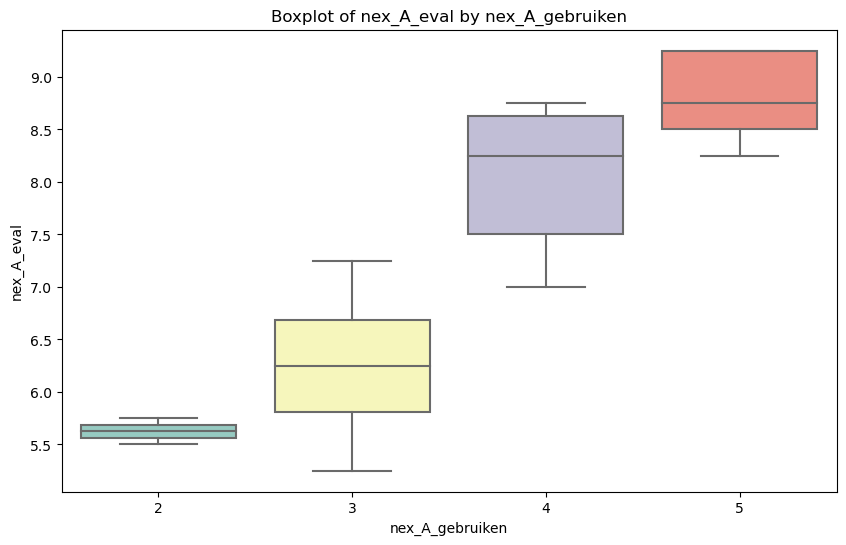

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Data
data = {
    'nex_A_gebruiken': [4, 5, 5, 3, 3, 5, 4, 2, 4, 2, 5, 4, 5, 4, 3, 3, 4, 4, 3, 3],
    'nex_A_eval': [8.75, 9.25, 9.25, 7.25, 6.75, 8.75, 8.25, 5.75, 7.00, 5.50, 8.25, 7.50, 8.50, 8.75, 5.75, 6.00, 7.50, 8.50, 6.50, 5.25]
}

# Create a DataFrame
import pandas as pd
df = pd.DataFrame(data)

# Create a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='nex_A_gebruiken', y='nex_A_eval', data=result2, palette='Set3')
plt.title('Boxplot of nex_A_eval by nex_A_gebruiken')
plt.xlabel('nex_A_gebruiken')
plt.ylabel('nex_A_eval')
plt.show()


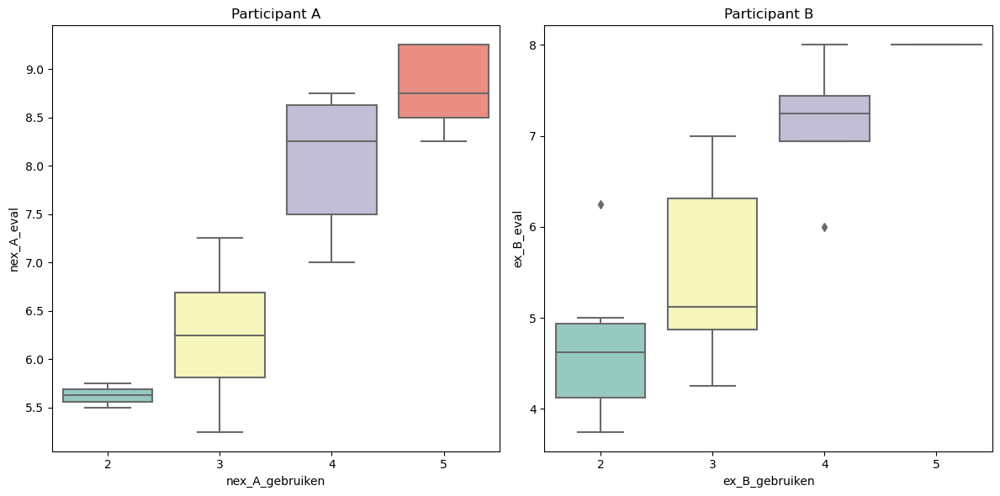

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


# Create a figure with two subplots (one for A and one for B)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# ex_B_eval', 'ex_D_eval', 'ex_F_eval', 'nex_A_eval', 'nex_C_eval', 'nex_E_eval', 'nex_G_eval'
resultA = result.filter(regex=f"A")
resultB = result.filter(regex=f"B")
resultC = result.filter(regex=f"C")
resultD = result.filter(regex=f"D")
resultE = result.filter(regex=f"E")
resultF = result.filter(regex=f"F")
resultG = result.filter(regex=f"G")

# Create boxplots for participant A
sns.boxplot(x='nex_A_gebruiken', y='nex_A_eval', data=resultA, palette='Set3', ax=axes[0])
axes[0].set_title('Participant A')
axes[0].set_xlabel('nex_A_gebruiken')
axes[0].set_ylabel('nex_A_eval')

# Create boxplots for participant B
sns.boxplot(x='ex_B_gebruiken', y='ex_B_eval', data=resultB, palette='Set3', ax=axes[1])
axes[1].set_title('Participant B')
axes[1].set_xlabel('ex_B_gebruiken')
axes[1].set_ylabel('ex_B_eval')

plt.tight_layout()
plt.show()





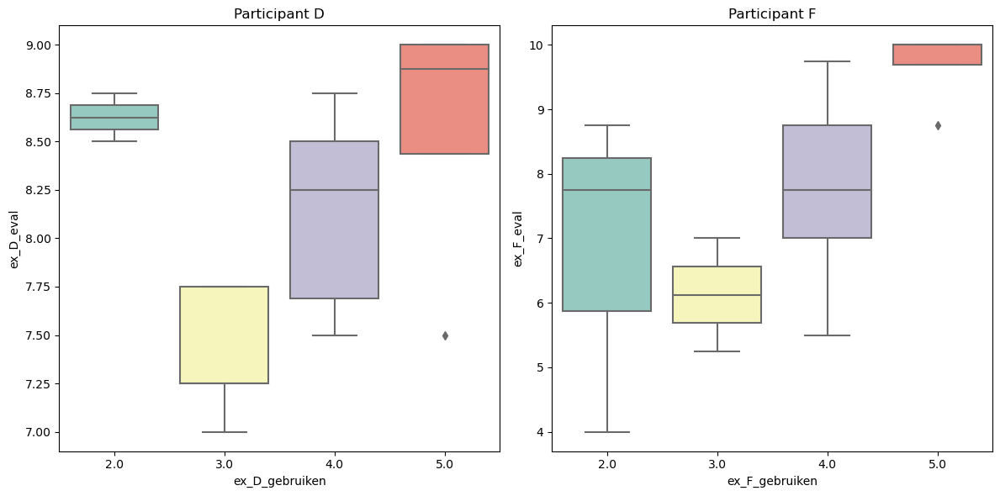

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
sns.boxplot(x='ex_D_gebruiken', y='ex_D_eval', data=resultD, palette='Set3', ax=axes[0])
axes[0].set_title('Participant D')
axes[0].set_xlabel('ex_D_gebruiken')
axes[0].set_ylabel('ex_D_eval')




sns.boxplot(x='ex_F_gebruiken', y='ex_F_eval', data=resultF, palette='Set3', ax=axes[1])
axes[1].set_title('Participant F')
axes[1].set_xlabel('ex_F_gebruiken')
axes[1].set_ylabel('ex_F_eval')

plt.tight_layout()
plt.show()



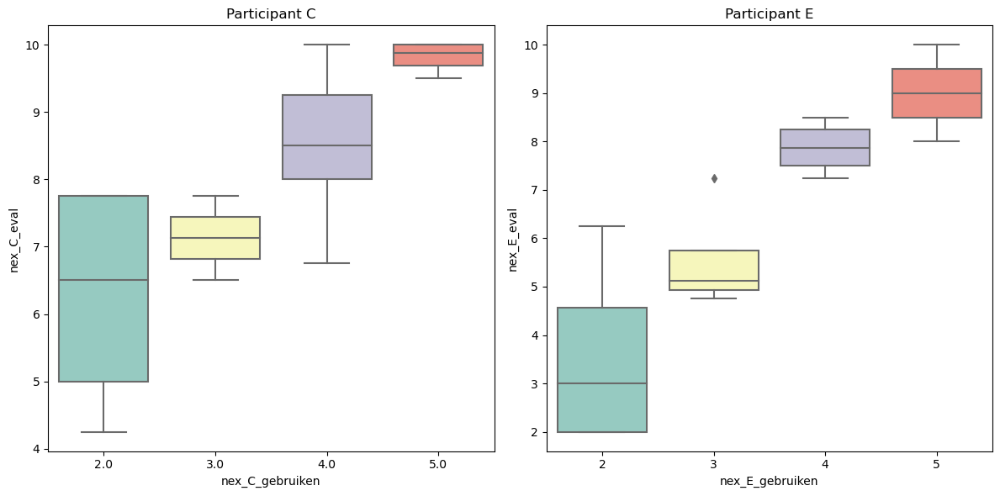

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
sns.boxplot(x='nex_C_gebruiken', y='nex_C_eval', data=resultC, palette='Set3', ax=axes[0])
axes[0].set_title('Participant C')
axes[0].set_xlabel('nex_C_gebruiken')
axes[0].set_ylabel('nex_C_eval')



sns.boxplot(x='nex_E_gebruiken', y='nex_E_eval', data= resultE, palette='Set3', ax=axes[1])
axes[1].set_title('Participant E')
axes[1].set_xlabel('nex_E_gebruiken')
axes[1].set_ylabel('nex_E_eval')

plt.tight_layout()
plt.show()



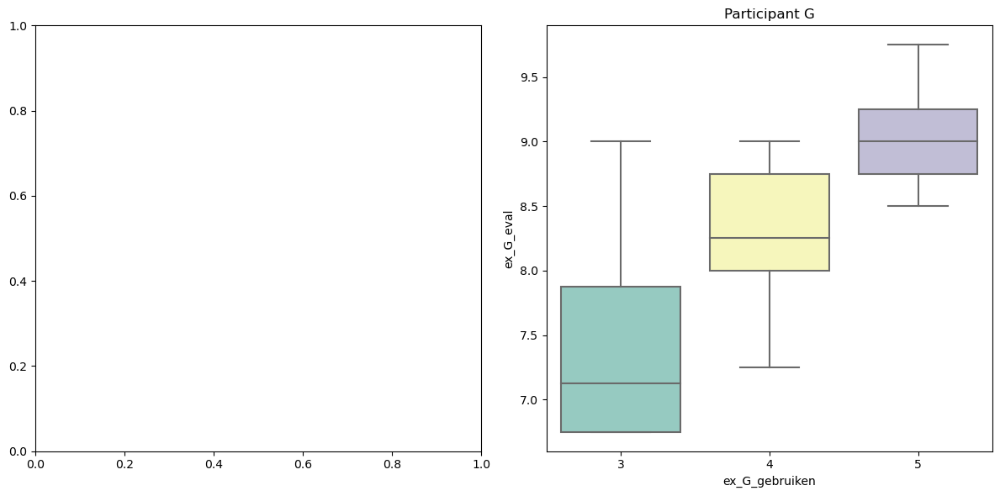

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
sns.boxplot(x='nex_G_gebruiken', y='nex_G_eval', data=resultG, palette='Set3', ax=axes[1])
axes[1].set_title('Participant G')
axes[1].set_xlabel('ex_G_gebruiken')
axes[1].set_ylabel('ex_G_eval')

plt.tight_layout()
plt.show()

In [48]:
ls = [8.79, 7.82, 9.29, 5.54, 8.71, 8.64, 8.46, 9.0, 8.86, 8.89]
mean = sum(ls) / len(ls)

# Print the mean
print("Mean:", mean)

ls = [8.79, 9.29, 8.71, 8.64, 8.46, 9.0, 8.86, 8.89]
mean = sum(ls) / len(ls)

# Print the mean
print("Mean:", mean)



Mean: 8.4
Mean: 8.83


In [51]:
hw_subset2

,NA_index,llm,rm_i,RM_without_number,RM_with_number,bertscore,feit_M,vloe_M,rele_M,spre_M,...,nex_HM_vloe,nex_HM_rele,nex_HM_spre,total_HM_feit,total_HM_vloe,total_HM_rele,total_HM_spre,total_HM_eval,nex_HM_eval,ex_HM_eval
1,0,gold,cl_rm_g,NA_0_rm_g,NA_0_rm_g,1.0,74.0,49.0,70.0,82.0,...,8.75,8.50,9.00,8.708333,8.875000,8.416667,9.166667,8.791667,8.7500,8.833333
8,1,gold,cl_rm_g,NA_1_rm_g,NA_1_rm_g,1.0,98.0,71.0,59.0,71.0,...,7.25,6.50,8.25,7.916667,8.125000,6.916667,8.458333,7.854167,7.6250,8.083333
12,2,gold,cl_rm_g,NA_2_rm_g,NA_2_rm_g,1.0,93.0,75.6,73.0,78.0,...,8.75,9.50,9.50,9.708333,8.875000,9.083333,9.416667,9.270833,9.3750,9.166667
21,4,gold,cl_rm_g,NA_4_rm_g,NA_4_rm_g,1.0,92.6,88.0,92.0,87.6,...,8.00,9.50,8.25,9.250000,8.500000,8.416667,8.625000,8.697917,8.8125,8.583333
29,5,gold,cl_rm_g,NA_5_rm_g,NA_5_rm_g,1.0,88.6,79.8,67.0,70.0,...,8.25,8.00,8.75,9.041667,8.625000,8.333333,8.708333,8.677083,8.4375,8.916667
31,6,gold,cl_rm_g,NA_6_rm_g,NA_6_rm_g,1.0,84.0,70.2,52.0,84.0,...,7.75,8.75,8.00,9.000000,8.041667,8.708333,8.166667,8.479167,8.3750,8.583333
38,7,gold,cl_rm_g,NA_7_rm_g,NA_7_rm_g,1.0,84.0,73.0,58.0,94.0,...,9.25,9.25,9.50,9.250000,8.791667,8.625000,9.083333,8.937500,9.3750,8.500000
42,8,gold,cl_rm_g,NA_8_rm_g,NA_8_rm_g,1.0,95.0,85.4,64.0,74.0,...,9.50,9.25,9.50,8.541667,8.916667,8.791667,8.916667,8.791667,9.2500,8.333333
49,9,gold,cl_rm_g,NA_9_rm_g,NA_9_rm_g,1.0,84.0,68.0,62.0,90.0,...,9.25,8.75,9.50,9.000000,8.958333,8.375000,9.083333,8.854167,9.1250,8.583333


# Significantly higher scores given by human evaluators to golden compared with generated

In [59]:
from scipy.stats import ttest_ind
from scipy import stats
import numpy as np

hw_subset2 = hw_subset.drop(15)

expertise = 'total'

evalaspect = 'feit'

print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(cl_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = cl_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = cl_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(cl_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(cl_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

print(ttest_ind(cl_subset['total_HM_feit'], hw_subset2['total_HM_feit']))
print(ttest_ind(cl_subset['total_HM_rele'], hw_subset2['total_HM_rele']))
print(ttest_ind(cl_subset['total_HM_spre'], hw_subset2['total_HM_spre']))
print(ttest_ind(cl_subset['total_HM_vloe'], hw_subset2['total_HM_vloe']))
print(ttest_ind(cl_subset['total_HM_eval'], hw_subset2['total_HM_eval']))
print('split')

print(ttest_ind(gpt_subset['total_HM_feit'], hw_subset2['total_HM_feit']))
print(ttest_ind(gpt_subset['total_HM_rele'], hw_subset2['total_HM_rele']))
print(ttest_ind(gpt_subset['total_HM_spre'], hw_subset2['total_HM_spre']))
print(ttest_ind(gpt_subset['total_HM_vloe'], hw_subset2['total_HM_vloe']))
print(ttest_ind(gpt_subset['total_HM_eval'], hw_subset2['total_HM_eval']))

print('split')


print(ttest_ind(exceptgold['total_HM_feit'], hw_subset2['total_HM_feit']))
print(ttest_ind(exceptgold['total_HM_rele'], hw_subset2['total_HM_rele']))
print(ttest_ind(exceptgold['total_HM_spre'], hw_subset2['total_HM_spre']))
print(ttest_ind(exceptgold['total_HM_vloe'], hw_subset2['total_HM_vloe']))
print(ttest_ind(exceptgold['total_HM_eval'], hw_subset2['total_HM_eval']))

Ttest_indResult(statistic=-3.0569896653975253, pvalue=0.004994209927997975)
mean: 8.102083333333335 mean2 8.935185185185183
std1  0.7393833124628512 std2  0.5073723460446619
se  0.23651078311515766
df :  27
ci  : (-1.318381894124179, -0.3478218095795185)
(-1.318381894124179, -0.3478218095795185)
split ___
rele
Ttest_indResult(statistic=-2.2120127106724055, pvalue=0.03561371106237339)
mean: 7.6125 mean2 8.407407407407407
std1  0.9912906555308033 std2  0.6094516610531912
se  0.3006709258465334
df :  27
ci  : (-1.4118331884777042, -0.17798162633710923)
(-1.4118331884777042, -0.17798162633710923)
split ___
vloe
Ttest_indResult(statistic=-4.33433367931858, pvalue=0.00018183382178791957)
mean: 6.975000000000001 mean2 8.63425925925926
std1  1.114628934138493 std2  0.3453421321987875
se  0.2745380231993832
df :  27
ci  : (-2.2225647531939243, -1.0959537653245917)
(-2.2225647531939243, -1.0959537653245917)
split ___
spre
Ttest_indResult(statistic=-5.250063110989188, pvalue=1.5564128877549958e-0

C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\3725423838.py:20: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\3725423838.py:38: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\3725423838.py:56: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2,

# GPT difference table

In [62]:
print( 'gpt subset: ')

evalaspect = 'feit'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'rele'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'spre'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'vloe'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

evalaspect = 'eval'
print(evalaspect)
print(ttest_ind(gpt_subset[f'{expertise}_HM_{evalaspect}'], hw_subset2[f'{expertise}_HM_{evalaspect}']))
mean1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].mean() 
mean2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].mean()
print('mean:', mean1, 'mean2', mean2)
std1 = gpt_subset[f'{expertise}_HM_{evalaspect}'].std(ddof=1)  
std2 = hw_subset2[f'{expertise}_HM_{evalaspect}'].std(ddof=1)
print('std1 ', std1, 'std2 ', std2)
se = np.sqrt(std1**2/len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + std2**2/len(hw_subset2[f'{expertise}_HM_{evalaspect}']))
df = len(gpt_subset[f'{expertise}_HM_{evalaspect}']) + len(hw_subset2[f'{expertise}_HM_{evalaspect}']) - 2
ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
print('se ', se)
print('df : ', df)
print('ci  :', ci)
print(ci)
print("split ___")

gpt subset: 
feit
Ttest_indResult(statistic=-1.418582685128254, pvalue=0.16746131446987825)
mean: 8.560416666666667 mean2 8.935185185185183
std1  0.7121895804756005 std2  0.5073723460446619
se  0.23230080998399213
df :  27
ci  : (-0.8514104094467593, 0.10187337240972616)
(-0.8514104094467593, 0.10187337240972616)
split ___
rele
Ttest_indResult(statistic=-2.6182341987916726, pvalue=0.014314522631546292)
mean: 7.589583333333333 mean2 8.407407407407407
std1  0.8391545583544296 std2  0.6094516610531912
se  0.2765486685967372
df :  27
ci  : (-1.385255071592852, -0.25039307655529586)
(-1.385255071592852, -0.25039307655529586)
split ___
spre
Ttest_indResult(statistic=-8.60634085155553, pvalue=3.202448293292636e-09)
mean: 6.491666666666667 mean2 8.847222222222221
std1  0.7721627937921892 std2  0.3914227964178321
se  0.21641465513330016
df :  27
ci  : (-2.799601749171616, -1.9115093619394927)
(-2.799601749171616, -1.9115093619394927)
split ___
vloe
Ttest_indResult(statistic=-6.910302258507037, 

C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\1855258845.py:14: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\1855258845.py:32: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2, scale=se)
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\1855258845.py:50: DeprecationWarning: Use of keyword argument 'alpha' for method 'interval' is deprecated and wil be removed in SciPy 1.11.0. Use first positional argument or keyword argument 'confidence' instead.
  ci = stats.t.interval(alpha=0.95, df=df, loc=mean1-mean2,

# mean factuality scores competitive with golden

In [67]:
cl_sub_sub = cl_subset[['NA_index', 'RM_without_number', 'total_HM_eval', 'total_HM_feit']]
cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(cl_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))

print(cl_sub_sub)

lss = [8.2, 9.1, 8.88, 7.45, 9.29, 8.66, 8.75, 8.16, 8.25, 8.8, 8.38]
print(np.mean(lss))


gpt_sub_sub = gpt_subset[['NA_index', 'RM_without_number', 'total_HM_eval', 'total_HM_feit']]
gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
                                    np.where(gpt_sub_sub['RM_without_number'].str.endswith("best"), "Best", 'Other'))

print(gpt_sub_sub)

lsss = [9.41, 8.75, 8.37, 9, 9.375, 8.79, 8.17, 9.08, 8.96, 9.25]
print(np.mean(lsss))

    NA_index RM_without_number  total_HM_eval  total_HM_feit Category
3          0  NA_0_cl_rm_worst       8.052083       7.875000    Worst
4          0   NA_0_cl_rm_best       7.864583       8.208333     Best
6          1  NA_1_cl_rm_worst       8.572917       9.083333    Worst
9          1   NA_1_cl_rm_best       6.895833       7.750000     Best
10         2  NA_2_cl_rm_worst       7.395833       8.875000    Worst
11         2   NA_2_cl_rm_best       7.270833       6.416667     Best
17         3   NA_3_cl_rm_best       7.312500       7.458333     Best
19         3  NA_3_cl_rm_worst       6.322917       7.291667    Worst
20         4   NA_4_cl_rm_best       8.447917       9.291667     Best
22         4  NA_4_cl_rm_worst       6.781250       7.708333    Worst
25         5  NA_5_cl_rm_worst       8.614583       8.666667    Worst
28         5   NA_5_cl_rm_best       7.291667       8.666667     Best
30         6   NA_6_cl_rm_best       7.791667       8.750000     Best
33         6  NA_6_c

C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\2107960866.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cl_sub_sub['Category'] = np.where(cl_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
C:\Users\20183274\AppData\Local\Temp\ipykernel_17748\2107960866.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_sub_sub['Category'] = np.where(gpt_sub_sub['RM_without_number'].str.endswith("worst"), "Worst",
